In [3]:
import pandas as pd  #data manipulation
import numpy as np  #numerical operations
import matplotlib.pyplot as plt  #visualization
import seaborn as sns  #advanced visualization
from scipy import stats  #statistical analysis
from scipy.stats import zscore  #Z-score outlier detection
from scipy.stats import spearmanr #Spearman correlation

# preprocessing & feature engineering
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

# dimensionality reduction & visualization tools
from sklearn.decomposition import PCA
from pandas.plotting import parallel_coordinates

In [4]:
data = pd.read_csv('marketing_campaign_dataset.csv')
data

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Date
0,1,Innovate Industries,Email,Men 18-24,30 days,Google Ads,0.04,"$16,174.00",6.29,Chicago,Spanish,506,1922,6,Health & Wellness,01/01/2021
1,2,NexGen Systems,Email,Women 35-44,60 days,Google Ads,0.12,"$11,566.00",5.61,New York,German,116,7523,7,Fashionistas,02/01/2021
2,3,Alpha Innovations,Influencer,Men 25-34,30 days,YouTube,0.07,"$10,200.00",7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers,03/01/2021
3,4,DataTech Solutions,Display,All Ages,60 days,YouTube,0.11,"$12,724.00",5.55,Miami,Mandarin,217,1820,7,Health & Wellness,04/01/2021
4,5,NexGen Systems,Email,Men 25-34,15 days,YouTube,0.05,"$16,452.00",6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness,05/01/2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,199996,TechCorp,Display,All Ages,30 days,Google Ads,0.06,"$18,365.00",2.84,Chicago,German,858,5988,1,Tech Enthusiasts,07/12/2021
199996,199997,DataTech Solutions,Email,Men 25-34,15 days,Facebook,0.02,"$8,168.00",4.14,Chicago,Spanish,228,3068,7,Foodies,08/12/2021
199997,199998,DataTech Solutions,Social Media,Men 18-24,45 days,Website,0.05,"$13,397.00",3.25,New York,Mandarin,723,9548,3,Tech Enthusiasts,09/12/2021
199998,199999,Innovate Industries,Influencer,All Ages,30 days,YouTube,0.10,"$18,508.00",3.86,Houston,French,528,2763,1,Foodies,10/12/2021


In [5]:
# check dataset information
print(data.info())
data.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Campaign_ID       200000 non-null  int64  
 1   Company           200000 non-null  object 
 2   Campaign_Type     200000 non-null  object 
 3   Target_Audience   200000 non-null  object 
 4   Duration          200000 non-null  object 
 5   Channel_Used      200000 non-null  object 
 6   Conversion_Rate   200000 non-null  float64
 7   Acquisition_Cost  200000 non-null  object 
 8   ROI               200000 non-null  float64
 9   Location          200000 non-null  object 
 10  Language          200000 non-null  object 
 11  Clicks            200000 non-null  int64  
 12  Impressions       200000 non-null  int64  
 13  Engagement_Score  200000 non-null  int64  
 14  Customer_Segment  200000 non-null  object 
 15  Date              200000 non-null  object 
dtypes: float64(2), int64

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Date
0,1,Innovate Industries,Email,Men 18-24,30 days,Google Ads,0.04,"$16,174.00",6.29,Chicago,Spanish,506,1922,6,Health & Wellness,01/01/2021
1,2,NexGen Systems,Email,Women 35-44,60 days,Google Ads,0.12,"$11,566.00",5.61,New York,German,116,7523,7,Fashionistas,02/01/2021
2,3,Alpha Innovations,Influencer,Men 25-34,30 days,YouTube,0.07,"$10,200.00",7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers,03/01/2021
3,4,DataTech Solutions,Display,All Ages,60 days,YouTube,0.11,"$12,724.00",5.55,Miami,Mandarin,217,1820,7,Health & Wellness,04/01/2021
4,5,NexGen Systems,Email,Men 25-34,15 days,YouTube,0.05,"$16,452.00",6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness,05/01/2021
5,6,DataTech Solutions,Display,All Ages,15 days,Instagram,0.07,"$9,716.00",4.36,New York,German,100,1643,1,Foodies,06/01/2021
6,7,NexGen Systems,Email,Women 35-44,60 days,Website,0.13,"$11,067.00",2.86,Los Angeles,Spanish,817,8749,10,Tech Enthusiasts,07/01/2021
7,8,DataTech Solutions,Search,Men 18-24,45 days,Google Ads,0.08,"$13,280.00",5.55,Los Angeles,Mandarin,624,7854,7,Outdoor Adventurers,08/01/2021
8,9,Alpha Innovations,Social Media,Women 35-44,15 days,Facebook,0.09,"$18,066.00",6.73,Chicago,German,861,1754,6,Tech Enthusiasts,09/01/2021
9,10,TechCorp,Email,Women 35-44,15 days,Instagram,0.09,"$13,766.00",3.78,Los Angeles,English,642,3856,3,Tech Enthusiasts,10/01/2021


In [6]:
# DATA CLEANING & CONVERT DATA TYPE

# remove text "days" & convert "Duration" to integer
data["Duration"] = data["Duration"].str.replace(" days", "", regex=True).astype(int)

# remove symbol "$" & convert "Acquisition_Cost" to float
data["Acquisition_Cost"] = data["Acquisition_Cost"].replace('[\$,]', '', regex=True).astype(float)

# convert "Date" to datetime format
data["Date"] = pd.to_datetime(data["Date"], format="%d/%m/%Y")

# verify the changes
print("After Cleaning & Changing Data Type: \n")
print(data.info())
data.head(10)


After Cleaning & Changing Data Type: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Campaign_ID       200000 non-null  int64         
 1   Company           200000 non-null  object        
 2   Campaign_Type     200000 non-null  object        
 3   Target_Audience   200000 non-null  object        
 4   Duration          200000 non-null  int32         
 5   Channel_Used      200000 non-null  object        
 6   Conversion_Rate   200000 non-null  float64       
 7   Acquisition_Cost  200000 non-null  float64       
 8   ROI               200000 non-null  float64       
 9   Location          200000 non-null  object        
 10  Language          200000 non-null  object        
 11  Clicks            200000 non-null  int64         
 12  Impressions       200000 non-null  int64         
 13  Engagement_Score  20

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Date
0,1,Innovate Industries,Email,Men 18-24,30,Google Ads,0.04,16174.0,6.29,Chicago,Spanish,506,1922,6,Health & Wellness,2021-01-01
1,2,NexGen Systems,Email,Women 35-44,60,Google Ads,0.12,11566.0,5.61,New York,German,116,7523,7,Fashionistas,2021-01-02
2,3,Alpha Innovations,Influencer,Men 25-34,30,YouTube,0.07,10200.0,7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers,2021-01-03
3,4,DataTech Solutions,Display,All Ages,60,YouTube,0.11,12724.0,5.55,Miami,Mandarin,217,1820,7,Health & Wellness,2021-01-04
4,5,NexGen Systems,Email,Men 25-34,15,YouTube,0.05,16452.0,6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness,2021-01-05
5,6,DataTech Solutions,Display,All Ages,15,Instagram,0.07,9716.0,4.36,New York,German,100,1643,1,Foodies,2021-01-06
6,7,NexGen Systems,Email,Women 35-44,60,Website,0.13,11067.0,2.86,Los Angeles,Spanish,817,8749,10,Tech Enthusiasts,2021-01-07
7,8,DataTech Solutions,Search,Men 18-24,45,Google Ads,0.08,13280.0,5.55,Los Angeles,Mandarin,624,7854,7,Outdoor Adventurers,2021-01-08
8,9,Alpha Innovations,Social Media,Women 35-44,15,Facebook,0.09,18066.0,6.73,Chicago,German,861,1754,6,Tech Enthusiasts,2021-01-09
9,10,TechCorp,Email,Women 35-44,15,Instagram,0.09,13766.0,3.78,Los Angeles,English,642,3856,3,Tech Enthusiasts,2021-01-10


In [7]:
# check missing values & duplicate rows
missing_values = data.isnull().sum().sum()
print(f"Number of Missing Values: {missing_values}")
duplicate_rows = data.duplicated().sum()
print(f"Numebr of Duplicate Rows: {duplicate_rows}")


Number of Missing Values: 0
Numebr of Duplicate Rows: 0


In [8]:
# Drop Campign_ID column & Date column

data = data.drop(columns=["Campaign_ID"])
data = data.drop(columns=['Date'])
data.head()


,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment
0,Innovate Industries,Email,Men 18-24,30,Google Ads,0.04,16174.0,6.29,Chicago,Spanish,506,1922,6,Health & Wellness
1,NexGen Systems,Email,Women 35-44,60,Google Ads,0.12,11566.0,5.61,New York,German,116,7523,7,Fashionistas
2,Alpha Innovations,Influencer,Men 25-34,30,YouTube,0.07,10200.0,7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers
3,DataTech Solutions,Display,All Ages,60,YouTube,0.11,12724.0,5.55,Miami,Mandarin,217,1820,7,Health & Wellness
4,NexGen Systems,Email,Men 25-34,15,YouTube,0.05,16452.0,6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness


In [9]:
# summary statistics (numerical columns)
print(data.describe().round(2))

        Duration  Conversion_Rate  Acquisition_Cost        ROI     Clicks  \
count  200000.00        200000.00         200000.00  200000.00  200000.00   
mean       37.50             0.08          12504.39       5.00     549.77   
std        16.75             0.04           4337.66       1.73     260.02   
min        15.00             0.01           5000.00       2.00     100.00   
25%        30.00             0.05           8739.75       3.50     325.00   
50%        30.00             0.08          12496.50       5.01     550.00   
75%        45.00             0.12          16264.00       6.51     775.00   
max        60.00             0.15          20000.00       8.00    1000.00   

       Impressions  Engagement_Score  
count    200000.00         200000.00  
mean       5507.30              5.49  
std        2596.86              2.87  
min        1000.00              1.00  
25%        3266.00              3.00  
50%        5517.50              5.00  
75%        7753.00              8

Unique Values Count per Categorical Column: {'Company': 5, 'Campaign_Type': 5, 'Target_Audience': 5, 'Channel_Used': 6, 'Location': 5, 'Language': 5, 'Customer_Segment': 5}


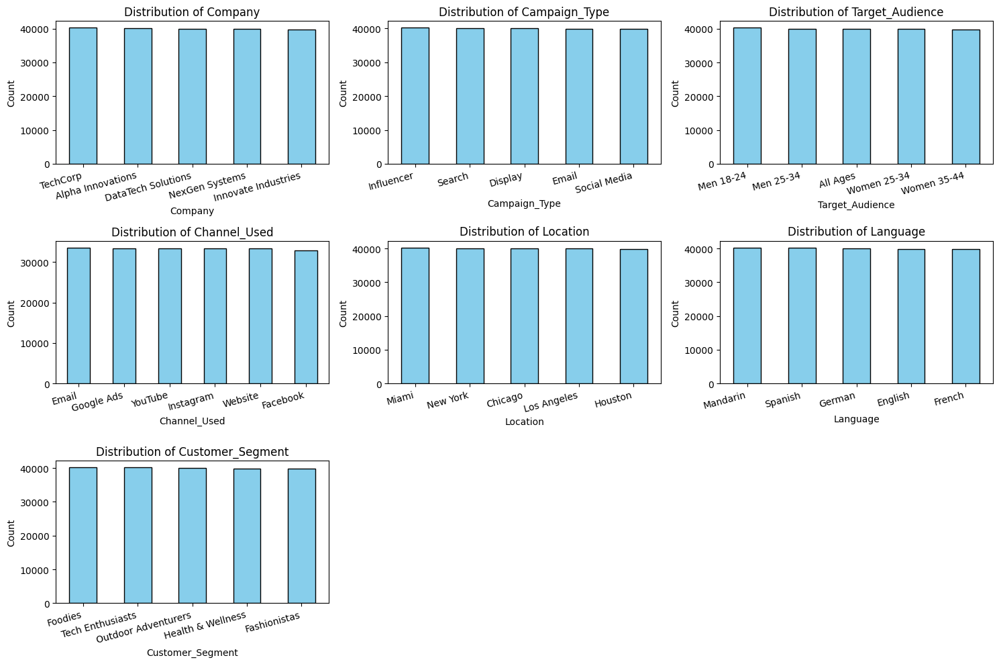

In [10]:
# list of categorical columns
categorical_columns = ['Company', 'Campaign_Type', 'Target_Audience', 'Channel_Used', 'Location', 
                       'Language', 'Customer_Segment']

# display unique count
unique_values = {col: data[col].nunique() for col in categorical_columns}
print("Unique Values Count per Categorical Column:", unique_values)

# plot distribution
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(3, 3, i)
    data[col].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=15, ha='right')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()


In [11]:
# CHECK OUTLIER

# define numerical column
numeric_columns = ['Conversion_Rate', 'Acquisition_Cost', 'ROI', 'Clicks', 'Impressions', 'Engagement_Score']
# compute Z-scores
z_scores = data[numeric_columns].apply(zscore)
# set threshold
outliers_z = (z_scores.abs() > 2).sum()
# Display results
print("Outliers Detected (using z-score):\n\n", outliers_z)


Outliers Detected (using z-score):

 Conversion_Rate     0
Acquisition_Cost    0
ROI                 0
Clicks              0
Impressions         0
Engagement_Score    0
dtype: int64


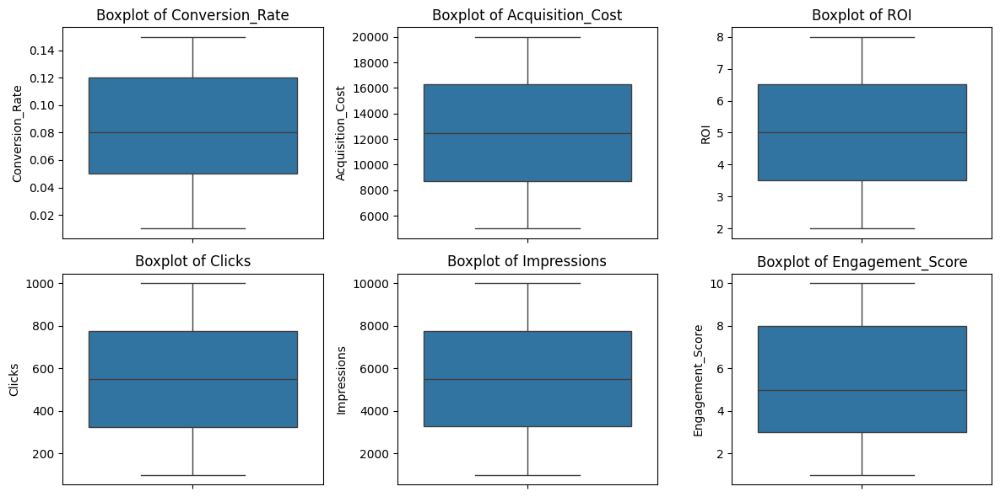

In [12]:
plt.figure(figsize=(12,6))

# Loop through numerical columns & plot boxplots
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(y=data[col])
    plt.title(f'Boxplot of {col}')
# show plots
plt.tight_layout()
plt.show()


In [13]:
# DETECT DISCREPANCIES (Click > Impression)

invalid_clicks = data[data["Clicks"] > data["Impressions"]]
print(f"Number of Rows (Clicks > Impressions): {len(invalid_clicks)}")
display(invalid_clicks)

Number of Rows (Clicks > Impressions): 0


,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment


FEATURE ENGINEERING

In [14]:
# DERIVED FEATURES

# split "Target_Audience" into "Gender" & "Age_Group"
data['Gender'] = data['Target_Audience'].apply(lambda x: 'All' if 'All Ages' in x else x.split()[0])
data['Age_Group'] = data['Target_Audience'].apply(lambda x: 'All Ages' if 'All Ages' in x else x.split()[1])

# drop "Target_Audience"
data.drop(columns=['Target_Audience'], inplace=True)

# create "CTR" feature
data['CTR'] = (data['Clicks'] / data['Impressions']).round(2)

# verify changes
data.head(10)


,Company,Campaign_Type,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Gender,Age_Group,CTR
0,Innovate Industries,Email,30,Google Ads,0.04,16174.0,6.29,Chicago,Spanish,506,1922,6,Health & Wellness,Men,18-24,0.26
1,NexGen Systems,Email,60,Google Ads,0.12,11566.0,5.61,New York,German,116,7523,7,Fashionistas,Women,35-44,0.02
2,Alpha Innovations,Influencer,30,YouTube,0.07,10200.0,7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers,Men,25-34,0.08
3,DataTech Solutions,Display,60,YouTube,0.11,12724.0,5.55,Miami,Mandarin,217,1820,7,Health & Wellness,All,All Ages,0.12
4,NexGen Systems,Email,15,YouTube,0.05,16452.0,6.50,Los Angeles,Mandarin,379,4201,3,Health & Wellness,Men,25-34,0.09
5,DataTech Solutions,Display,15,Instagram,0.07,9716.0,4.36,New York,German,100,1643,1,Foodies,All,All Ages,0.06
6,NexGen Systems,Email,60,Website,0.13,11067.0,2.86,Los Angeles,Spanish,817,8749,10,Tech Enthusiasts,Women,35-44,0.09
7,DataTech Solutions,Search,45,Google Ads,0.08,13280.0,5.55,Los Angeles,Mandarin,624,7854,7,Outdoor Adventurers,Men,18-24,0.08
8,Alpha Innovations,Social Media,15,Facebook,0.09,18066.0,6.73,Chicago,German,861,1754,6,Tech Enthusiasts,Women,35-44,0.49
9,TechCorp,Email,15,Instagram,0.09,13766.0,3.78,Los Angeles,English,642,3856,3,Tech Enthusiasts,Women,35-44,0.17


UPDATED DATASET INFORMATION

In [15]:
print("After Feature Engineeringe: \n")
print(data.info())


After Feature Engineeringe: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Company           200000 non-null  object 
 1   Campaign_Type     200000 non-null  object 
 2   Duration          200000 non-null  int32  
 3   Channel_Used      200000 non-null  object 
 4   Conversion_Rate   200000 non-null  float64
 5   Acquisition_Cost  200000 non-null  float64
 6   ROI               200000 non-null  float64
 7   Location          200000 non-null  object 
 8   Language          200000 non-null  object 
 9   Clicks            200000 non-null  int64  
 10  Impressions       200000 non-null  int64  
 11  Engagement_Score  200000 non-null  int64  
 12  Customer_Segment  200000 non-null  object 
 13  Gender            200000 non-null  object 
 14  Age_Group         200000 non-null  object 
 15  CTR               200000 non-null  flo

In [16]:
# updated summary statistics (numerical columns)
print("After Feature Engineering: \n")
print(data.describe().round(2))


After Feature Engineering: 

        Duration  Conversion_Rate  Acquisition_Cost        ROI     Clicks  \
count  200000.00        200000.00         200000.00  200000.00  200000.00   
mean       37.50             0.08          12504.39       5.00     549.77   
std        16.75             0.04           4337.66       1.73     260.02   
min        15.00             0.01           5000.00       2.00     100.00   
25%        30.00             0.05           8739.75       3.50     325.00   
50%        30.00             0.08          12496.50       5.01     550.00   
75%        45.00             0.12          16264.00       6.51     775.00   
max        60.00             0.15          20000.00       8.00    1000.00   

       Impressions  Engagement_Score        CTR  
count    200000.00         200000.00  200000.00  
mean       5507.30              5.49       0.14  
std        2596.86              2.87       0.13  
min        1000.00              1.00       0.01  
25%        3266.00         

Unique Values Count per Categorical Column: {'Company': 5, 'Campaign_Type': 5, 'Channel_Used': 6, 'Location': 5, 'Language': 5, 'Customer_Segment': 5, 'Gender': 3, 'Age_Group': 4}


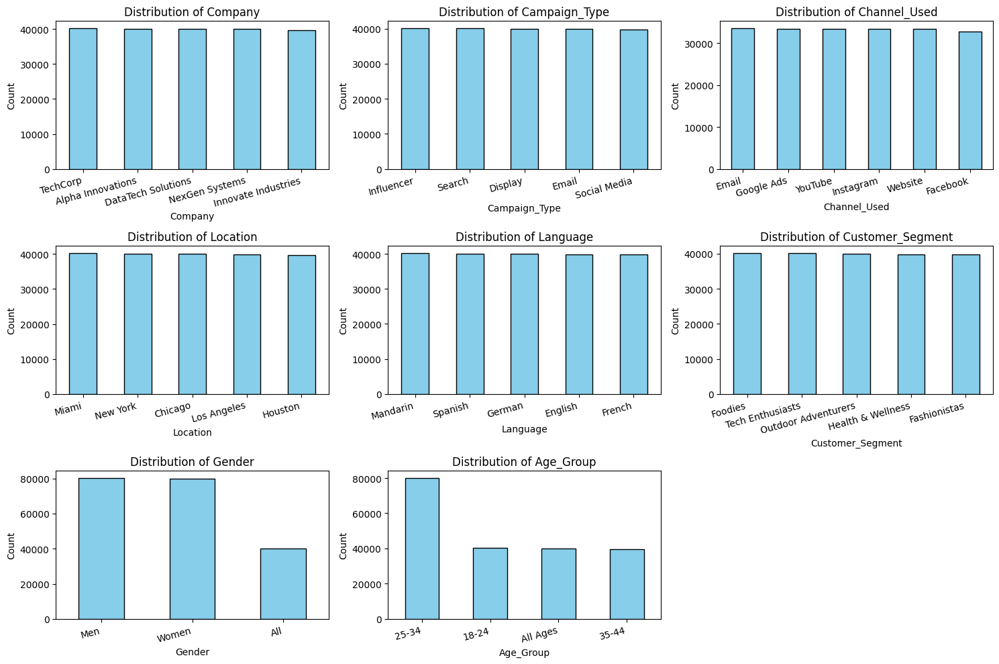

In [17]:
# updated list of categorical columns
categorical_columns = ['Company', 'Campaign_Type', 'Channel_Used', 'Location', 
                       'Language', 'Customer_Segment', 'Gender', 'Age_Group']

# display unique count
unique_values = {col: data[col].nunique() for col in categorical_columns}
print("Unique Values Count per Categorical Column:", unique_values)

# plot distribution
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(3, 3, i)
    data[col].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=15, ha='right')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()


EDA: BIVIARIATE ANALYSIS: Conversion Rate by Campaign Type

In [18]:
# Shapiro-Wilk Test (normality of "Conversion_Rate")

shapiro_test = stats.shapiro(data["Conversion_Rate"])
print("Shapiro-Wilk Test for Conversion Rate: \n", shapiro_test)


Shapiro-Wilk Test for Conversion Rate: 
 ShapiroResult(statistic=0.9522914629442881, pvalue=3.9429154281410394e-106)


C:\Users\User\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 200000.
  res = hypotest_fun_out(*samples, **kwds)


Kruskal-Wallis Test Result:
 KruskalResult(statistic=3.5118692925680013, pvalue=0.4760758890584519)


C:\Users\User\AppData\Local\Temp\ipykernel_17868\2647987987.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x=data["Campaign_Type"], y=data["Conversion_Rate"], palette="pastel")


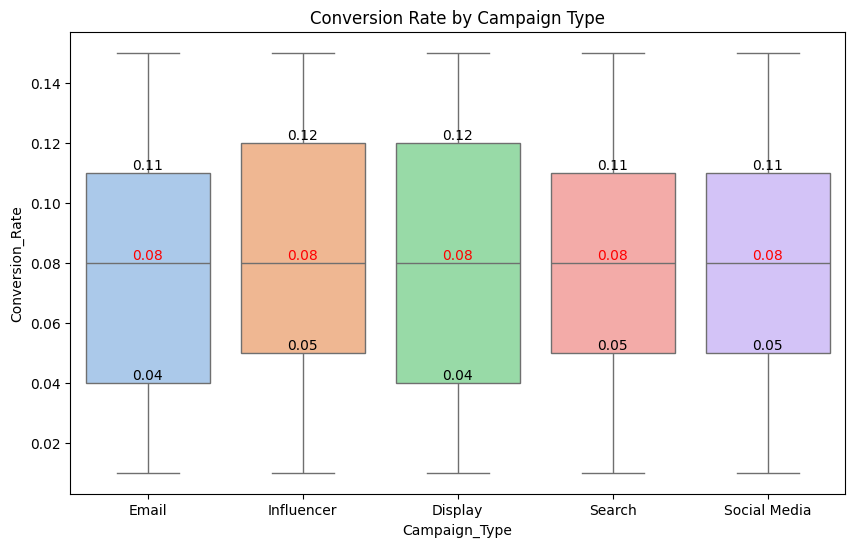

In [19]:
# Kruskal-Wallis Test
groups = [data[data["Campaign_Type"] == cat]["Conversion_Rate"] for cat in data["Campaign_Type"].unique()]
kruskal_result = stats.kruskal(*groups)

print("Kruskal-Wallis Test Result:\n", kruskal_result)

# compute Q1 & Median & Q3
summary_stats = data.groupby("Campaign_Type")["Conversion_Rate"].quantile([0.25, 0.5, 0.75]).unstack()

# boxplot
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x=data["Campaign_Type"], y=data["Conversion_Rate"], palette="pastel")

for i, cat in enumerate(data["Campaign_Type"].unique()):
    q1 = round(summary_stats.loc[cat, 0.25], 3)
    median = round(summary_stats.loc[cat, 0.5], 3)
    q3 = round(summary_stats.loc[cat, 0.75], 3)
    # add text label
    ax.text(i, q1, f"{q1}", ha='center', va='bottom', fontsize=10, color='black')
    ax.text(i, median, f"{median}", ha='center', va='bottom', fontsize=10, color='red')
    ax.text(i, q3, f"{q3}", ha='center', va='bottom', fontsize=10, color='black')

plt.title("Conversion Rate by Campaign Type")
plt.xticks(rotation=0)
plt.show()


Conversion Rate by Channel Used

Kruskal-Wallis Test Result:
 KruskalResult(statistic=2.9000555097811263, pvalue=0.7153909631146786)


C:\Users\User\AppData\Local\Temp\ipykernel_17868\1893587914.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.pointplot(x="Channel_Used", y="Conversion_Rate", data=data, estimator=np.mean, ci=None, color="blue")


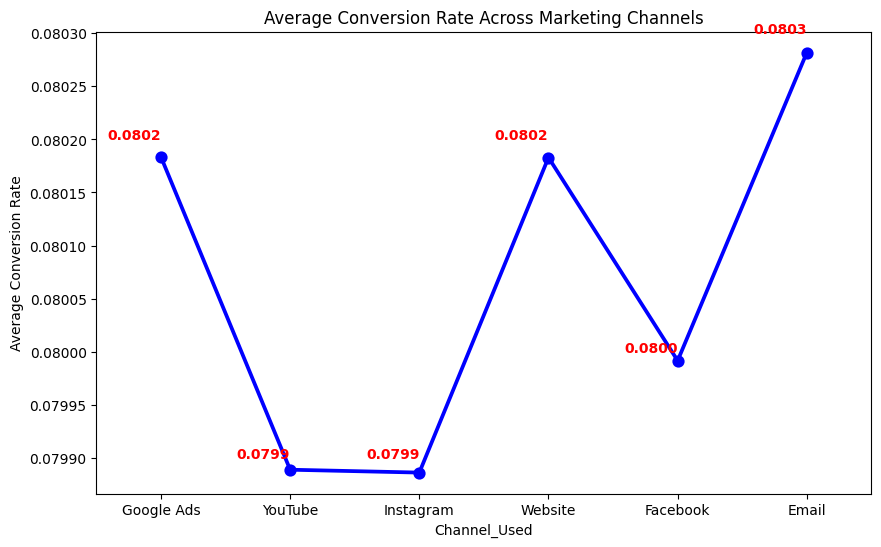

In [20]:
# Kruskal-Wallis Test
channel_groups = [data["Conversion_Rate"][data["Channel_Used"] == ch] for ch in data["Channel_Used"].unique()]
kruskal_test = stats.kruskal(*channel_groups)
print("Kruskal-Wallis Test Result:\n", kruskal_test)

# calculate mean conversion rate per channel
mean_conversion_rate = data.groupby("Channel_Used")["Conversion_Rate"].mean().round(4)

# point plot
plt.figure(figsize=(10, 6))
ax = sns.pointplot(x="Channel_Used", y="Conversion_Rate", data=data, estimator=np.mean, ci=None, color="blue")

for i, channel in enumerate(data["Channel_Used"].unique()):
    mean_value = mean_conversion_rate[channel]
    plt.text(i, mean_value, f"{mean_value:.4f}", horizontalalignment='right', color='red', fontsize=10, fontweight='bold')

plt.title("Average Conversion Rate Across Marketing Channels")
plt.xticks()
plt.ylabel("Average Conversion Rate")
plt.show()



Conversion Rate by Acquisition Cost 

Spearman’s Rank Correlation Test Result:
 SignificanceResult(statistic=-0.0028395661551149885, pvalue=0.20412480867131033)


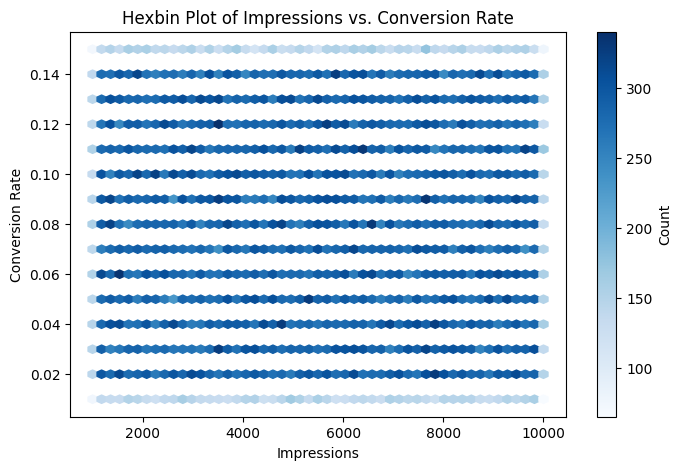

In [21]:
# Spearman’s Rank Correlation Test
impressions_conversion = data[["Impressions", "Conversion_Rate"]]
spearman_result = stats.spearmanr(impressions_conversion["Impressions"], impressions_conversion["Conversion_Rate"])
print("Spearman’s Rank Correlation Test Result:\n", spearman_result)

# hexbin plot
plt.figure(figsize=(8, 5))
plt.hexbin(data["Impressions"], data["Conversion_Rate"], gridsize=50, cmap="Blues", mincnt=1)
plt.colorbar(label="Count")
plt.title("Hexbin Plot of Impressions vs. Conversion Rate")
plt.xlabel("Impressions")
plt.ylabel("Conversion Rate")
plt.show()



In [22]:
# Filter data for only "Innovate Industries"
filtered_data = data[data["Company"] == "DataTech Solutions"]

# Shapiro-Wilk Test (normality of "Conversion_Rate")
shapiro_test = stats.shapiro(filtered_data["Conversion_Rate"])

print("Shapiro-Wilk Test for Conversion Rate (DataTech Solution):\n", shapiro_test)


Shapiro-Wilk Test for Conversion Rate (DataTech Solution):
 ShapiroResult(statistic=0.9516252478939041, pvalue=4.00789945408331e-75)


C:\Users\User\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 40012.
  res = hypotest_fun_out(*samples, **kwds)


Kruskal-Wallis Test Result:
 KruskalResult(statistic=17.99938743524215, pvalue=0.001234438271414088)


C:\Users\User\AppData\Local\Temp\ipykernel_17868\352565346.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x=filtered_data["Campaign_Type"], y=filtered_data["Conversion_Rate"], palette="pastel")


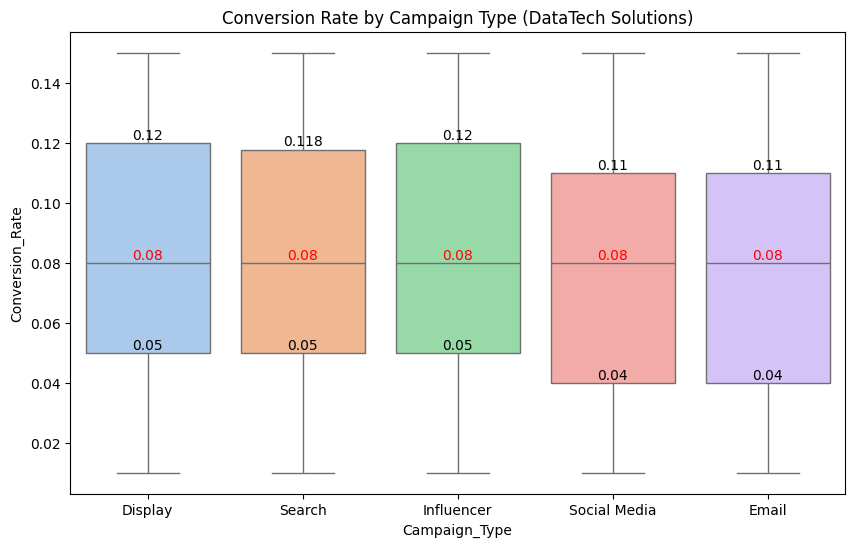

In [23]:
filtered_data = data[data["Company"] == "DataTech Solutions"]

# Kruskal-Wallis Test
groups = [filtered_data[filtered_data["Campaign_Type"] == cat]["Conversion_Rate"] 
          for cat in filtered_data["Campaign_Type"].unique()]
kruskal_result = stats.kruskal(*groups)

print("Kruskal-Wallis Test Result:\n", kruskal_result)

# compute Q1, Median, and Q3
summary_stats = filtered_data.groupby("Campaign_Type")["Conversion_Rate"].quantile([0.25, 0.5, 0.75]).unstack()

# boxplot
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x=filtered_data["Campaign_Type"], y=filtered_data["Conversion_Rate"], palette="pastel")

for i, cat in enumerate(filtered_data["Campaign_Type"].unique()):
    q1 = round(summary_stats.loc[cat, 0.25], 3)
    median = round(summary_stats.loc[cat, 0.5], 3)
    q3 = round(summary_stats.loc[cat, 0.75], 3)

    ax.text(i, q1, f"{q1}", ha='center', va='bottom', fontsize=10, color='black')
    ax.text(i, median, f"{median}", ha='center', va='bottom', fontsize=10, color='red')
    ax.text(i, q3, f"{q3}", ha='center', va='bottom', fontsize=10, color='black')

plt.title("Conversion Rate by Campaign Type (DataTech Solutions)")
plt.xticks(rotation=0)
plt.show()


MULTIVARIATE ANALYSIS

C:\Users\User\AppData\Local\Temp\ipykernel_17868\2892385472.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Company", y="Conversion_Rate", hue="Campaign_Type", data=data, palette="pastel", ci=None)


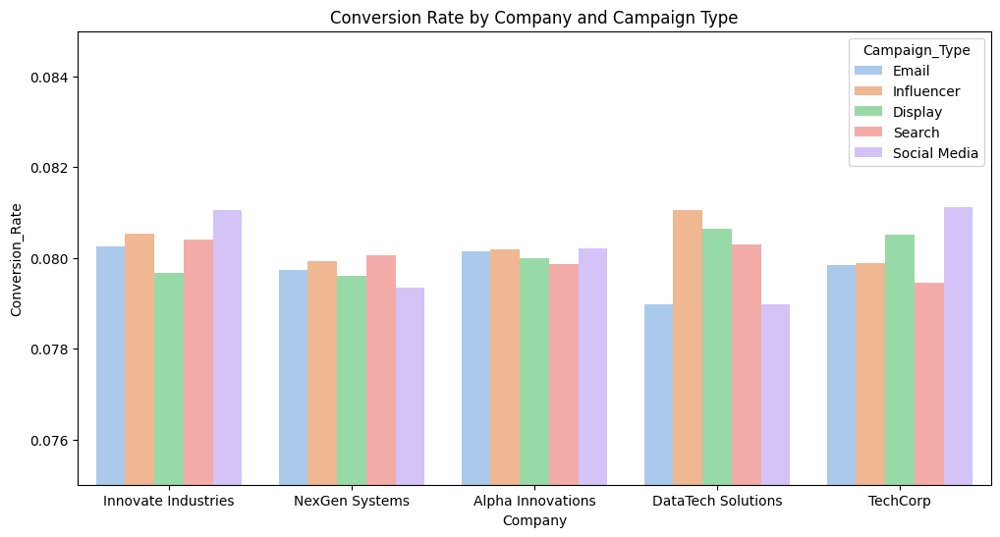

In [24]:
plt.figure(figsize=(12, 6))
sns.barplot(x="Company", y="Conversion_Rate", hue="Campaign_Type", data=data, palette="pastel", ci=None)

plt.ylim(0.075, 0.085)
plt.title("Conversion Rate by Company and Campaign Type")
plt.legend(title="Campaign_Type")
plt.show()



C:\Users\User\AppData\Local\Temp\ipykernel_17868\699711945.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Company", y="Conversion_Rate", hue="Channel_Used", data=data, palette="pastel", ci=None)


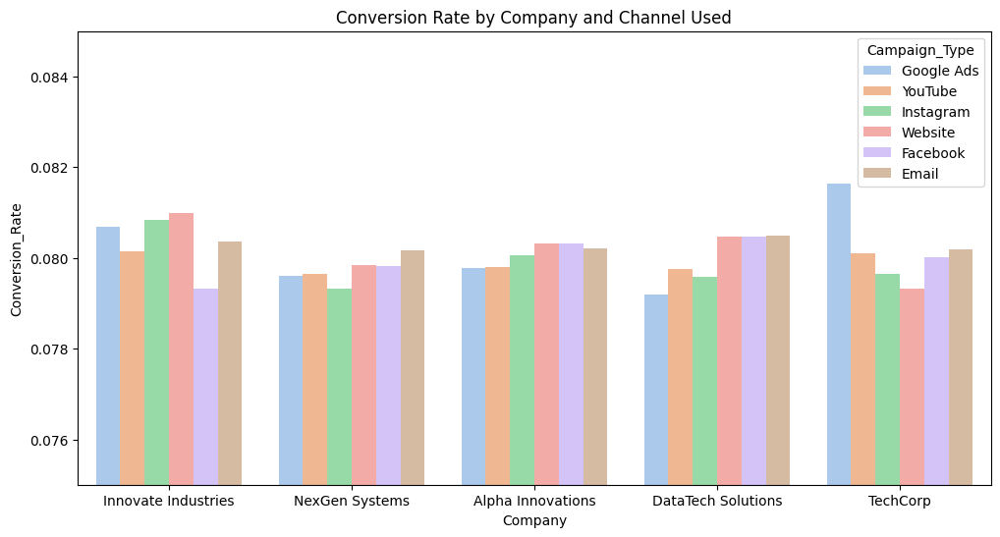

In [25]:
plt.figure(figsize=(12, 6))
sns.barplot(x="Company", y="Conversion_Rate", hue="Channel_Used", data=data, palette="pastel", ci=None)

plt.ylim(0.075, 0.085)
plt.title("Conversion Rate by Company and Channel Used")
plt.legend(title="Campaign_Type")
plt.show()


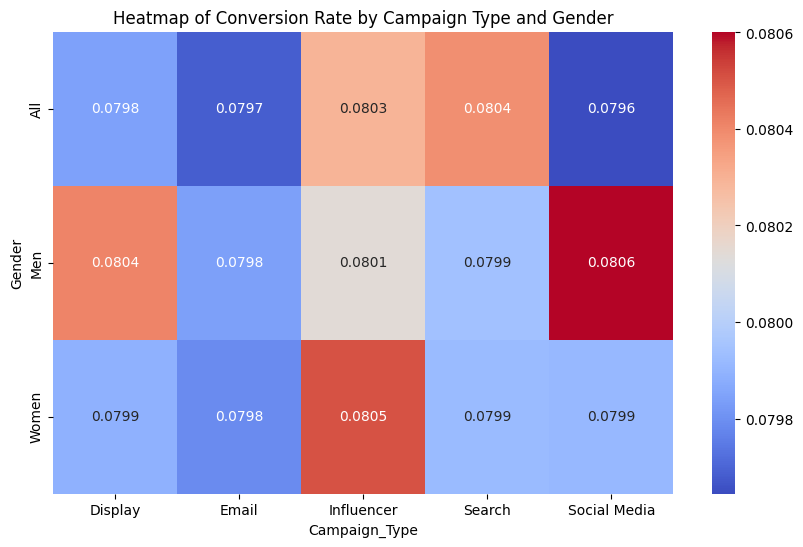

In [26]:
pivot_table = data.pivot_table(values="Conversion_Rate", index="Gender", columns="Campaign_Type", aggfunc="mean")
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap="coolwarm", fmt=".4f")
plt.title("Heatmap of Conversion Rate by Campaign Type and Gender")
plt.show()

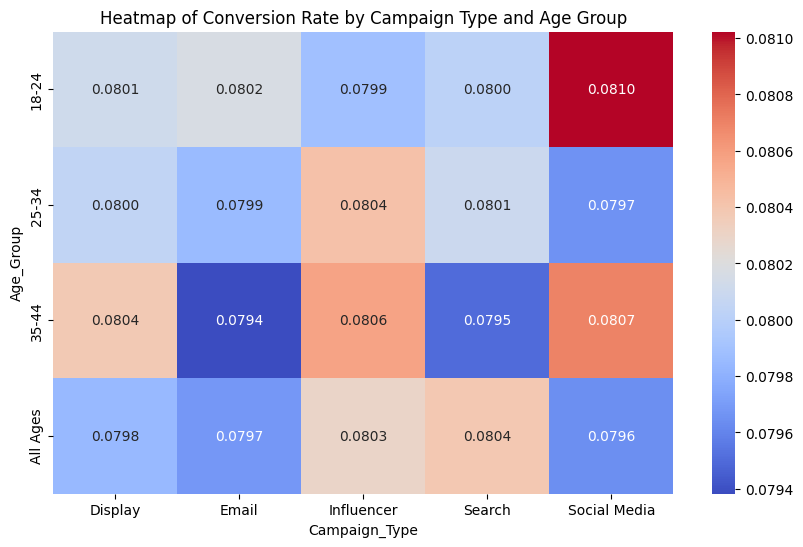

In [27]:
pivot_table = data.pivot_table(values="Conversion_Rate", index="Age_Group", columns="Campaign_Type", aggfunc="mean")
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap="coolwarm", fmt=".4f")
plt.title("Heatmap of Conversion Rate by Campaign Type and Age Group")
plt.show()


In [26]:
# print("\nTarget variable 'Conversion_Rate':")
# print(y_deepfm.describe())

In [28]:
company_counts = data['Company'].value_counts()
print(company_counts)

Company
TechCorp               40237
Alpha Innovations      40051
DataTech Solutions     40012
NexGen Systems         39991
Innovate Industries    39709
Name: count, dtype: int64


In [86]:
deepfm_data = data.copy() 
fnn_data = data.copy()

rf_data = data.copy()
lgbm_data = data.copy()
catboost_data = data.copy()

DEEP LEARNING MODEL BUILDING

DeepFM

In [29]:
from sklearn.preprocessing import LabelEncoder

# Define columns
deepfm_nominal_categorical_cols = [
    'Campaign_Type', 'Channel_Used', 'Location',
    'Language', 'Customer_Segment', 'Gender', 'Age_Group'
]
deepfm_original_numerical_cols = [
    'Acquisition_Cost', 'ROI', 'Clicks', 'Impressions',
    'Engagement_Score', 'CTR', 'Duration'
]

# Target and features
y_deepfm = deepfm_data['Conversion_Rate']
x_deepfm = deepfm_data.drop(columns=['Conversion_Rate']).copy()



Train-Test Splitting > Label Encoding > Feature Scailing

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

deepfm_company_data = {}

# Unique company names (string)
unique_companies = deepfm_data['Company'].unique()

for company_name in unique_companies:
    print(f"\nProcessing: {company_name}")

    # Filter data for this company
    company_mask = deepfm_data['Company'] == company_name
    x_company = x_deepfm[company_mask].copy()
    y_company = y_deepfm[company_mask].copy()

    # Step 1: Split into 80% train_val and 20% test
    x_train_val, x_test, y_train_val, y_test = train_test_split(
        x_company, y_company, test_size=0.2, random_state=42
    )

    # Step 2: Split train_val into 80% train and 20% val (64% train, 16% val overall)
    x_train, x_val, y_train, y_val = train_test_split(
        x_train_val, y_train_val, test_size=0.2, random_state=42
    )

    # Label encode categorical columns
    label_encoders = {}
    for col in deepfm_nominal_categorical_cols:
        le = LabelEncoder()
        x_train[col] = le.fit_transform(x_train[col])
        x_val[col] = le.transform(x_val[col])
        x_test[col] = le.transform(x_test[col])
        label_encoders[col] = le

    # # Describe numerical features before scaling
    # print("\nBefore Scaling (train):")
    # print(x_train[deepfm_original_numerical_cols].describe())

    # Scale numerical features
    scaler = MinMaxScaler()
    x_train[deepfm_original_numerical_cols] = scaler.fit_transform(x_train[deepfm_original_numerical_cols])
    x_val[deepfm_original_numerical_cols] = scaler.transform(x_val[deepfm_original_numerical_cols])
    x_test[deepfm_original_numerical_cols] = scaler.transform(x_test[deepfm_original_numerical_cols])

    # # Describe after scaling
    # print("\nAfter Scaling (train):")
    # print(pd.DataFrame(x_train[deepfm_original_numerical_cols]).describe())

    # Store processed data
    deepfm_company_data[company_name] = {
        'x_train': x_train,
        'x_val': x_val,
        'x_test': x_test,
        'y_train': y_train,
        'y_val': y_val,
        'y_test': y_test,
        'label_encoders': label_encoders,
        'scaler': scaler
    }

    print(f"{company_name} — Done\n")



Processing: Innovate Industries
Innovate Industries — Done


Processing: NexGen Systems
NexGen Systems — Done


Processing: Alpha Innovations
Alpha Innovations — Done


Processing: DataTech Solutions
DataTech Solutions — Done


Processing: TechCorp
TechCorp — Done



In [31]:
# # Check for missing or infinite values
# print("\nChecking for NaNs or Infinite Values in Label-Encoded Dataframe:")
# nan_count = x_train.isna().sum().sum()
# inf_count = np.isinf(x_train.values).sum()

# print(f"NaN Count: {nan_count}")
# print(f"Infinite Value Count: {inf_count}")

In [32]:
print("Label Encoding Mappings per Company:\n")
for company, data in deepfm_company_data.items():
    print(f"\n{company}:")
    for col, le in data['label_encoders'].items():
        mapping = dict(zip(le.classes_, le.transform(le.classes_)))
        print(f"{col}: {mapping}")


Label Encoding Mappings per Company:


Innovate Industries:
Campaign_Type: {'Display': 0, 'Email': 1, 'Influencer': 2, 'Search': 3, 'Social Media': 4}
Channel_Used: {'Email': 0, 'Facebook': 1, 'Google Ads': 2, 'Instagram': 3, 'Website': 4, 'YouTube': 5}
Location: {'Chicago': 0, 'Houston': 1, 'Los Angeles': 2, 'Miami': 3, 'New York': 4}
Language: {'English': 0, 'French': 1, 'German': 2, 'Mandarin': 3, 'Spanish': 4}
Customer_Segment: {'Fashionistas': 0, 'Foodies': 1, 'Health & Wellness': 2, 'Outdoor Adventurers': 3, 'Tech Enthusiasts': 4}
Gender: {'All': 0, 'Men': 1, 'Women': 2}
Age_Group: {'18-24': 0, '25-34': 1, '35-44': 2, 'All Ages': 3}

NexGen Systems:
Campaign_Type: {'Display': 0, 'Email': 1, 'Influencer': 2, 'Search': 3, 'Social Media': 4}
Channel_Used: {'Email': 0, 'Facebook': 1, 'Google Ads': 2, 'Instagram': 3, 'Website': 4, 'YouTube': 5}
Location: {'Chicago': 0, 'Houston': 1, 'Los Angeles': 2, 'Miami': 3, 'New York': 4}
Language: {'English': 0, 'French': 1, 'German': 2, 'Mandar

In [33]:
# Check and display info for each company

for company_name, data_dict in deepfm_company_data.items():
    print(f"\nCompany: {company_name}")
    
    x_train = data_dict['x_train']
    x_test = data_dict['x_test']
    x_val = data_dict['x_val']
    y_train = data_dict['y_train']
    y_val = data_dict['y_val']
    y_test = data_dict['y_test']
    
    # Show shapes
    print(f" - x_train shape: {x_train.shape}")
    print(f" - x_test shape:  {x_test.shape}")
    print(f" - x_val shape:  {x_val.shape}")
    print(f" - y_train shape: {y_train.shape}")
    print(f" - y_val shape:  {y_val.shape}")
    print(f" - y_test shape:  {y_test.shape}")

    # Sample rows
    print("Sample x_train rows:")
    display(x_train.head())




Company: Innovate Industries
 - x_train shape: (25413, 15)
 - x_test shape:  (7942, 15)
 - x_val shape:  (6354, 15)
 - y_train shape: (25413,)
 - y_val shape:  (6354,)
 - y_test shape:  (7942,)
Sample x_train rows:


,Company,Campaign_Type,Duration,Channel_Used,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Gender,Age_Group,CTR
150694,Innovate Industries,2,0.333333,1,0.001000,0.253333,0,3,0.065556,0.897333,0.777778,0,0,3,0.010204
18696,Innovate Industries,4,0.000000,0,0.416161,0.091667,1,1,0.771111,0.998778,1.000000,4,0,3,0.071429
70459,Innovate Industries,4,0.000000,2,0.602107,0.210000,3,1,0.477778,0.231667,0.333333,2,0,3,0.163265
88684,Innovate Industries,1,1.000000,2,0.182012,0.265000,3,2,0.680000,0.491556,0.222222,4,1,1,0.122449
67253,Innovate Industries,4,0.333333,4,0.128475,0.648333,4,0,0.942222,0.597778,0.111111,2,2,2,0.142857



Company: NexGen Systems
 - x_train shape: (25593, 15)
 - x_test shape:  (7999, 15)
 - x_val shape:  (6399, 15)
 - y_train shape: (25593,)
 - y_val shape:  (6399,)
 - y_test shape:  (7999,)
Sample x_train rows:


,Company,Campaign_Type,Duration,Channel_Used,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Gender,Age_Group,CTR
131922,NexGen Systems,1,0.666667,1,0.620749,0.173333,4,4,0.312222,0.996444,0.888889,3,2,1,0.031250
154473,NexGen Systems,4,0.000000,0,0.900453,0.650000,4,2,0.438889,0.334704,0.333333,4,0,3,0.114583
79877,NexGen Systems,2,1.000000,5,0.313909,0.218333,2,2,0.310000,0.086121,0.333333,3,2,2,0.208333
180839,NexGen Systems,4,0.666667,2,0.572476,0.918333,4,3,0.570000,0.364929,0.111111,3,2,2,0.135417
131727,NexGen Systems,0,0.000000,2,0.074810,0.850000,1,1,0.550000,0.071119,0.333333,0,2,2,0.364583



Company: Alpha Innovations
 - x_train shape: (25632, 15)
 - x_test shape:  (8011, 15)
 - x_val shape:  (6408, 15)
 - y_train shape: (25632,)
 - y_val shape:  (6408,)
 - y_test shape:  (8011,)
Sample x_train rows:


,Company,Campaign_Type,Duration,Channel_Used,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Gender,Age_Group,CTR
102824,Alpha Innovations,3,1.000000,0,0.162400,0.975000,0,4,0.628889,0.490333,0.555556,0,2,1,0.112245
94889,Alpha Innovations,2,0.333333,5,0.127800,0.961667,4,3,0.990000,0.054889,0.777778,4,2,1,0.663265
180100,Alpha Innovations,2,0.333333,4,0.173533,0.268333,4,0,0.798889,0.185667,1.000000,3,1,0,0.306122
192313,Alpha Innovations,0,0.000000,2,0.743200,0.153333,3,4,0.416667,0.920222,1.000000,0,2,1,0.040816
152046,Alpha Innovations,0,0.666667,0,0.398533,0.361667,1,3,0.146667,0.906000,1.000000,4,1,0,0.020408



Company: DataTech Solutions
 - x_train shape: (25607, 15)
 - x_test shape:  (8003, 15)
 - x_val shape:  (6402, 15)
 - y_train shape: (25607,)
 - y_val shape:  (6402,)
 - y_test shape:  (8003,)
Sample x_train rows:


,Company,Campaign_Type,Duration,Channel_Used,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Gender,Age_Group,CTR
184825,DataTech Solutions,0,1.000000,1,0.755467,0.571667,2,1,0.236667,0.105111,0.444444,0,2,1,0.159574
9348,DataTech Solutions,2,1.000000,2,0.839933,0.851667,4,0,0.106667,0.438444,0.888889,3,1,1,0.031915
123758,DataTech Solutions,2,0.333333,2,0.629733,0.401667,4,4,0.517778,0.697889,0.444444,2,1,0,0.074468
163660,DataTech Solutions,1,0.666667,0,0.839800,0.688333,2,0,0.771111,0.226778,0.555556,3,2,1,0.265957
145689,DataTech Solutions,3,0.666667,2,0.931000,0.811667,0,1,0.643333,0.565889,0.555556,4,0,3,0.106383



Company: TechCorp
 - x_train shape: (25751, 15)
 - x_test shape:  (8048, 15)
 - x_val shape:  (6438, 15)
 - y_train shape: (25751,)
 - y_val shape:  (6438,)
 - y_test shape:  (8048,)
Sample x_train rows:


,Company,Campaign_Type,Duration,Channel_Used,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Gender,Age_Group,CTR
93720,TechCorp,1,0.666667,3,0.127142,0.205000,4,0,0.604444,0.993222,0.111111,2,2,1,0.052083
199676,TechCorp,0,0.333333,0,0.994133,0.133333,3,4,0.311111,0.515222,0.777778,3,2,1,0.062500
84682,TechCorp,1,0.666667,1,0.728982,0.478333,0,4,0.230000,0.974444,0.555556,0,2,1,0.020833
181630,TechCorp,0,0.666667,5,0.730382,0.316667,1,4,0.485556,0.990111,0.000000,3,1,1,0.041667
32093,TechCorp,3,0.333333,2,0.614374,0.996667,2,1,0.683333,0.679444,0.888889,1,2,1,0.093750


In [34]:
# Imports & Global Setup

import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import logging
import optuna
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from deepctr_torch.models import DeepFM
from deepctr_torch.inputs import SparseFeat, DenseFeat, get_feature_names
import torch

# Reduce Optuna verbosity
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Device configuration
device = 'cuda' if torch.cuda.is_available() else 'cpu'


C:\Users\User\AppData\Roaming\Python\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DeepFM: Model Building (Baseline)


-------------------- Training DeepFM for Innovate Industries --------------------
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
Innovate Industries — Epoch 1/50 | Train MSE: 0.00163 | Val MSE: 0.00166
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
Innovate Industries — Epoch 2/50 | Train MSE: 0.00163 | Val MSE: 0.00166
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
Innovate Industries — Epoch 3/50 | Train MSE: 0.00164 | Val MSE: 0.00167
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
Innovate Industries — Epoch 4/50 | Train MSE: 0.00167 | Val MSE: 0.00170
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
Innovate Industries — Epoch 5/50 | Train MSE: 0.00163 | Val MSE: 0.00167
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
Innovate Industries — Epoch 6/50 | Train MSE: 0.00163 | Val MSE: 0.00166
Early stopping at epoch 6 (No impro

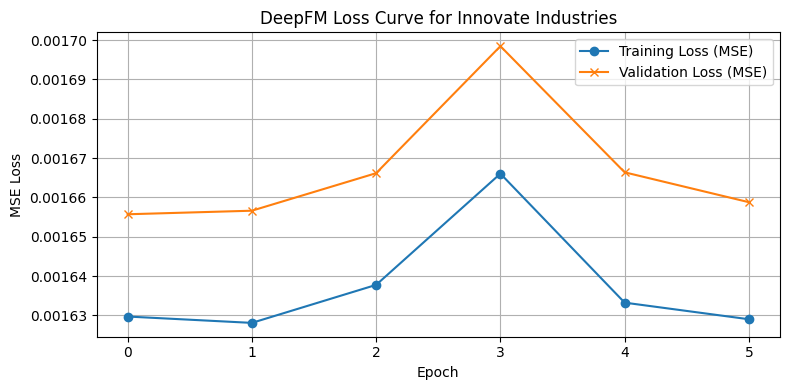

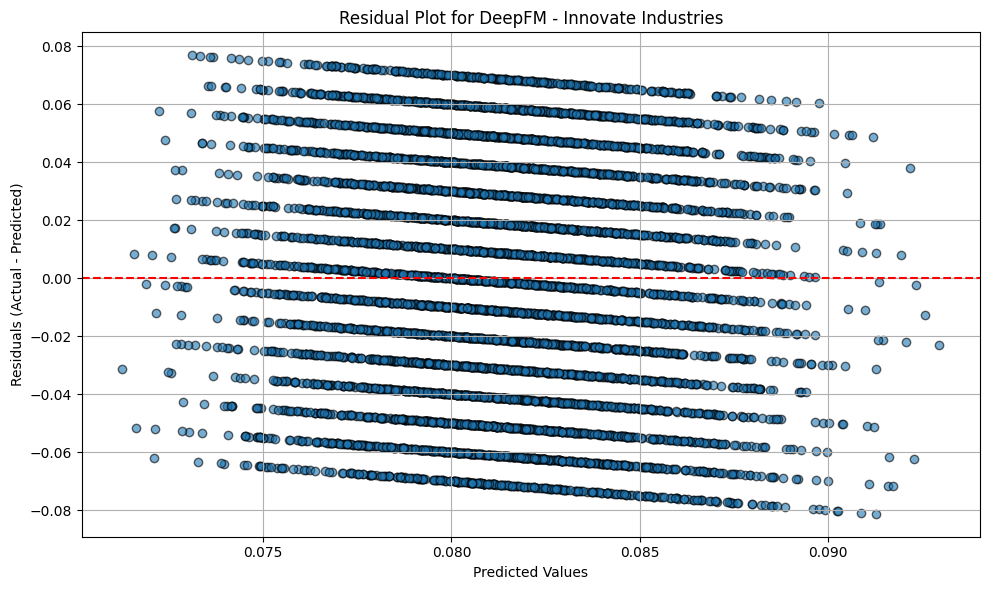

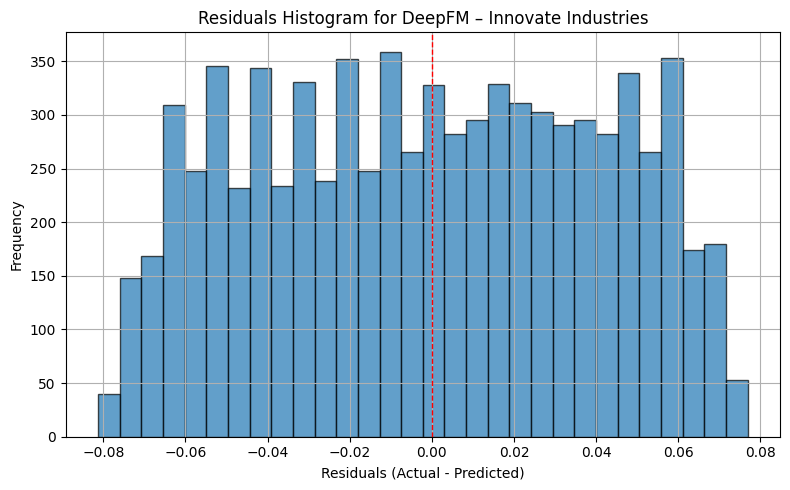


-------------------- Training DeepFM for NexGen Systems --------------------
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
NexGen Systems — Epoch 1/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
NexGen Systems — Epoch 2/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
NexGen Systems — Epoch 3/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
NexGen Systems — Epoch 4/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
NexGen Systems — Epoch 5/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
NexGen Systems — Epoch 6/50 | Train MSE: 0.00167 | Val MSE: 0.00168
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per ep

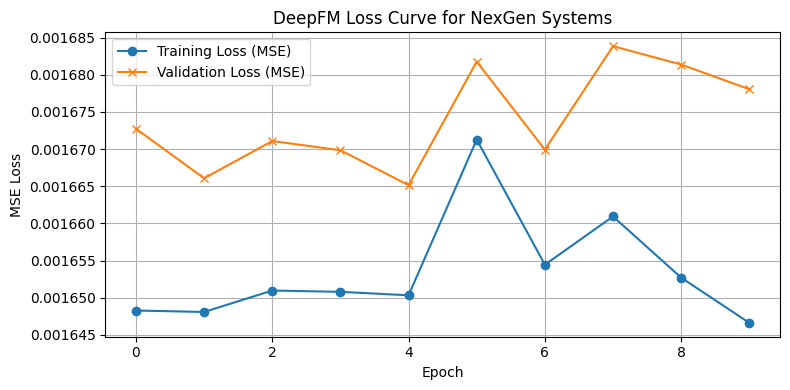

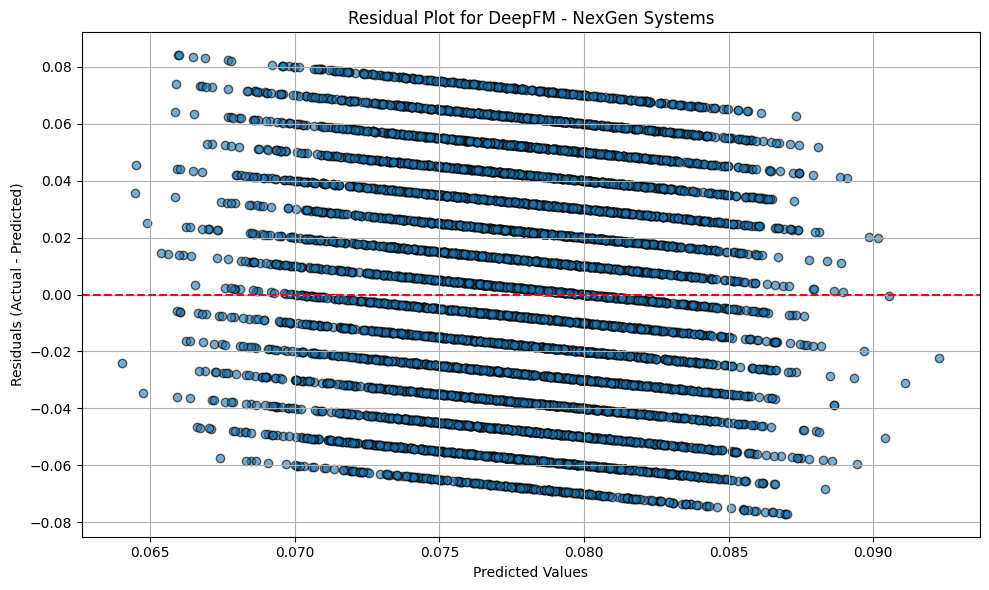

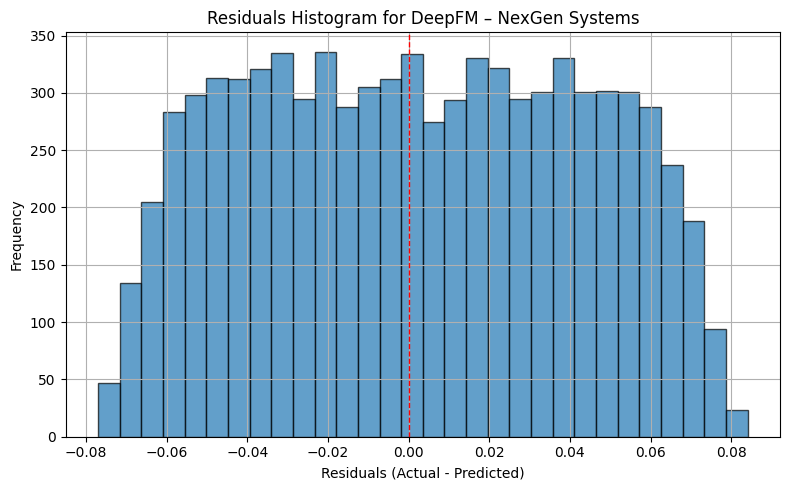


-------------------- Training DeepFM for Alpha Innovations --------------------
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
Alpha Innovations — Epoch 1/50 | Train MSE: 0.00167 | Val MSE: 0.00168
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
Alpha Innovations — Epoch 2/50 | Train MSE: 0.00166 | Val MSE: 0.00168
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
Alpha Innovations — Epoch 3/50 | Train MSE: 0.00166 | Val MSE: 0.00168
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
Alpha Innovations — Epoch 4/50 | Train MSE: 0.00167 | Val MSE: 0.00168
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
Alpha Innovations — Epoch 5/50 | Train MSE: 0.00166 | Val MSE: 0.00168
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
Alpha Innovations — Epoch 6/50 | Train MSE: 0.00167 | Val MSE: 0.00169
Early stopping at epoch 6 (No improvement in 5 co

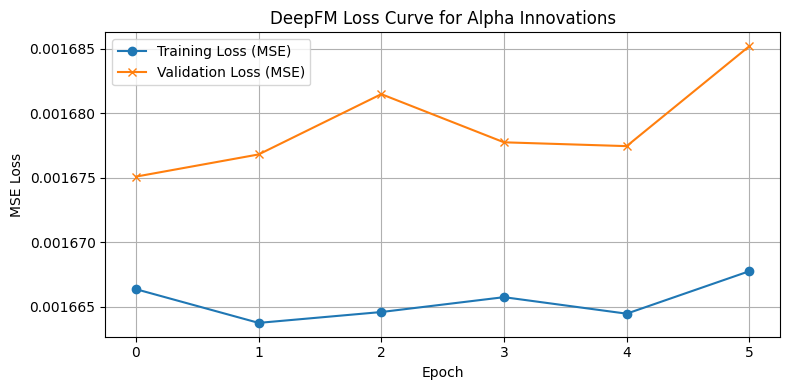

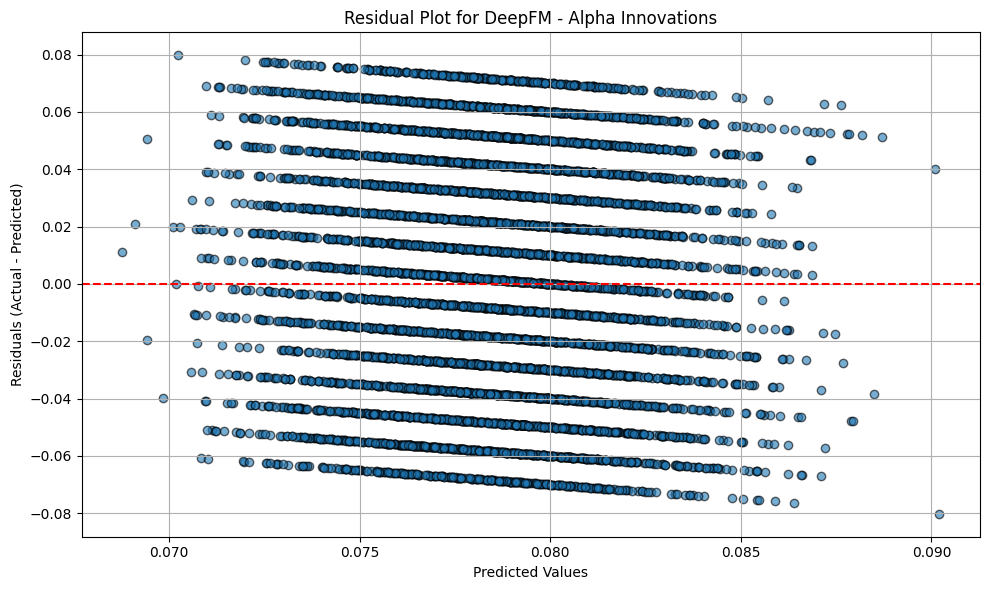

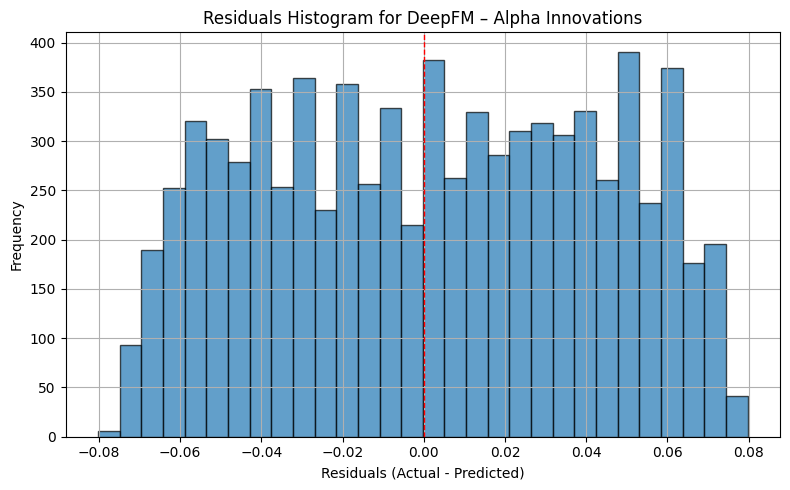


-------------------- Training DeepFM for DataTech Solutions --------------------
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
DataTech Solutions — Epoch 1/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
DataTech Solutions — Epoch 2/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
DataTech Solutions — Epoch 3/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
DataTech Solutions — Epoch 4/50 | Train MSE: 0.00166 | Val MSE: 0.00168
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
DataTech Solutions — Epoch 5/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
DataTech Solutions — Epoch 6/50 | Train MSE: 0.00167 | Val MSE: 0.00169
cpu
Train on 25607 samples, validate on 64

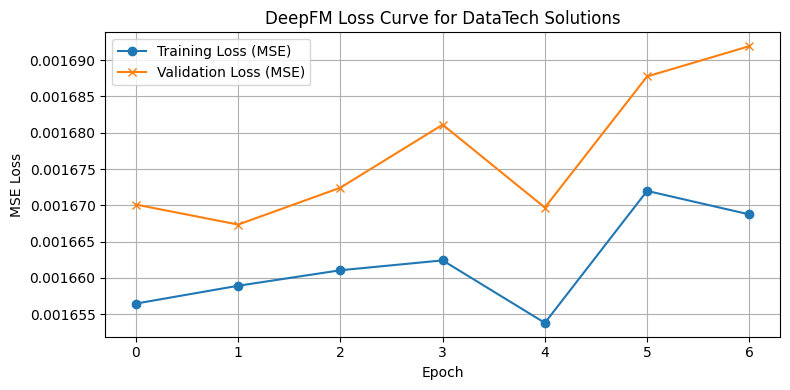

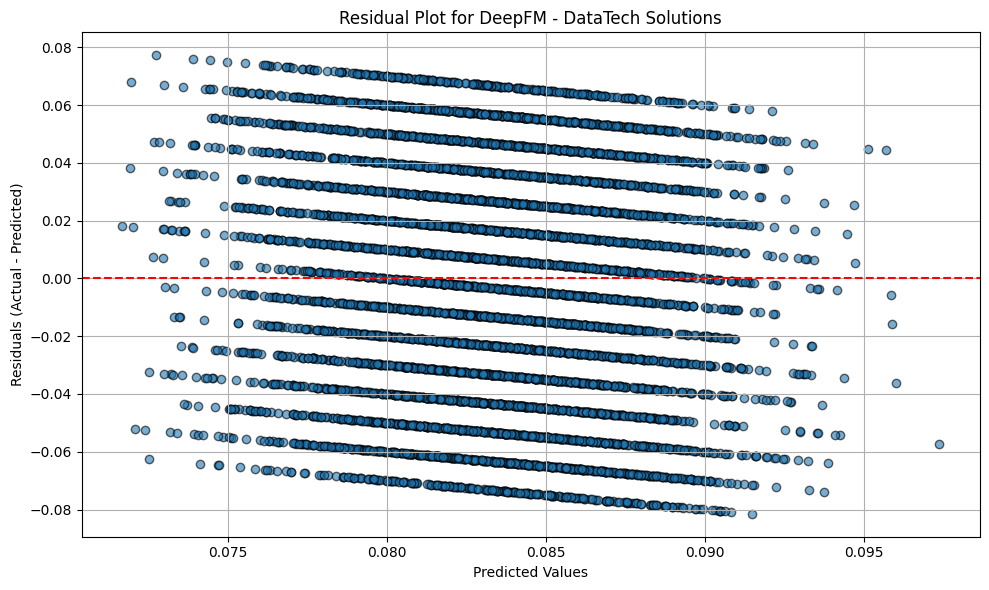

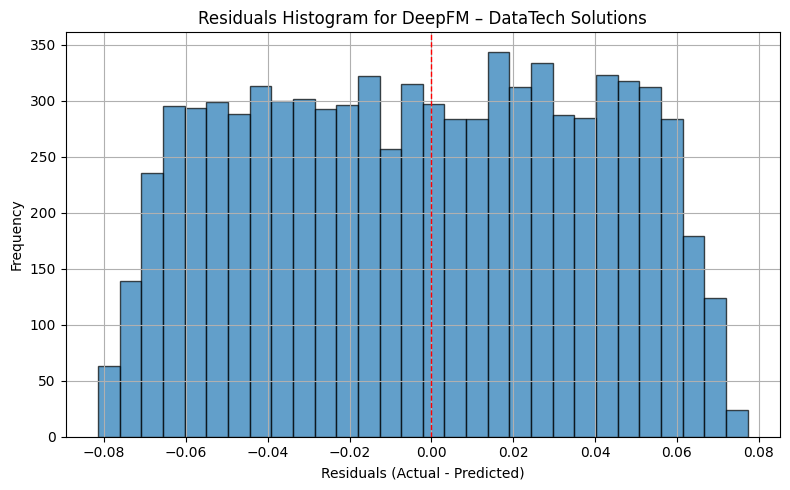


-------------------- Training DeepFM for TechCorp --------------------
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
TechCorp — Epoch 1/50 | Train MSE: 0.00164 | Val MSE: 0.00165
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
TechCorp — Epoch 2/50 | Train MSE: 0.00165 | Val MSE: 0.00165
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
TechCorp — Epoch 3/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
TechCorp — Epoch 4/50 | Train MSE: 0.00164 | Val MSE: 0.00166
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
TechCorp — Epoch 5/50 | Train MSE: 0.00165 | Val MSE: 0.00167
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
TechCorp — Epoch 6/50 | Train MSE: 0.00166 | Val MSE: 0.00169
Early stopping at epoch 6 (No improvement in 5 consecutive epochs)


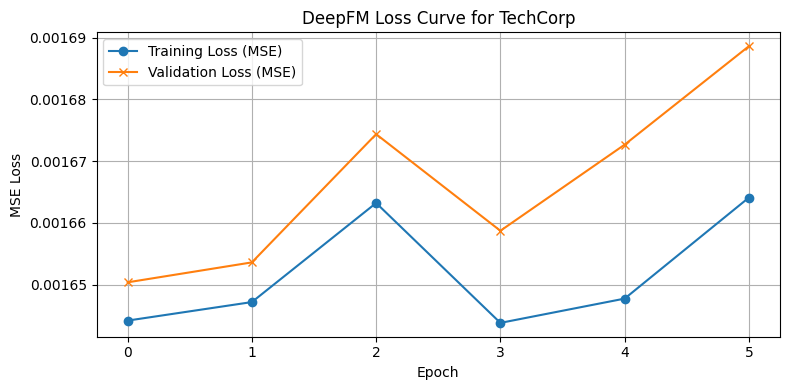

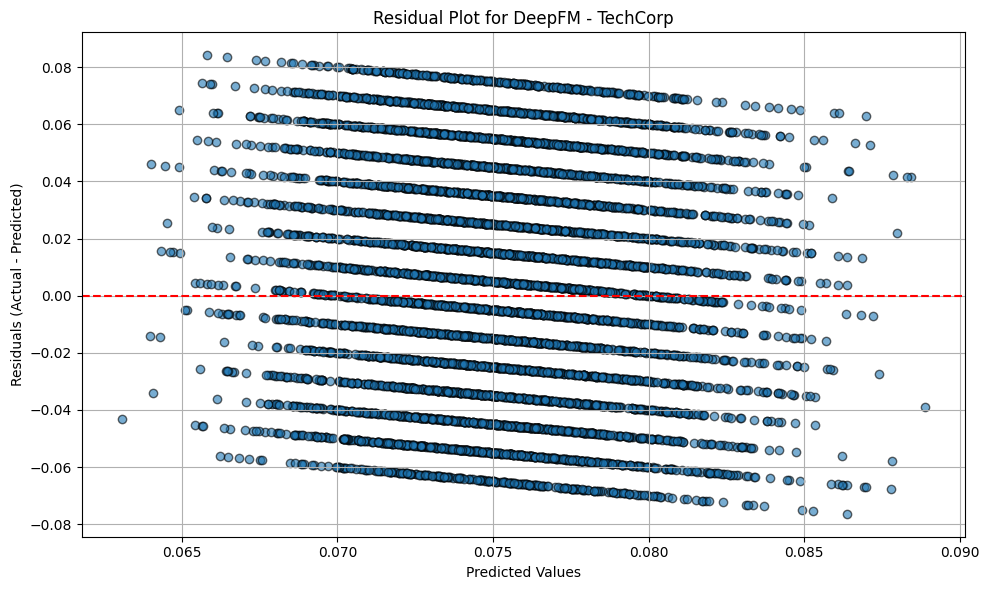

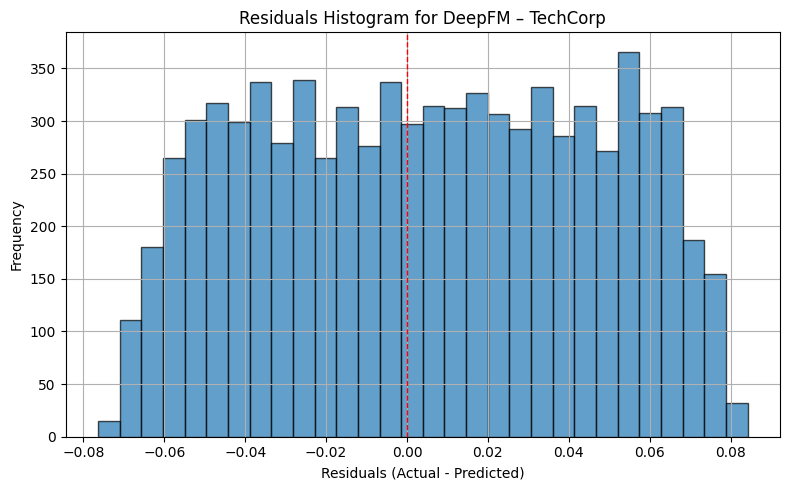

In [35]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from deepctr_torch.models import DeepFM
from deepctr_torch.inputs import SparseFeat, DenseFeat, get_feature_names
import numpy as np
import torch

# Define feature columns
deepfm_fixlen_features = [
    SparseFeat(feat, vocabulary_size=x_deepfm[feat].nunique() + 1, embedding_dim=4)
    for feat in deepfm_nominal_categorical_cols
] + [
    DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
]
deepfm_feature_names = get_feature_names(deepfm_fixlen_features)

# Setup device
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Initialize result dictionary
deepfm_baseline_results = {}

# Manual DeepFM training function with visualizations
def train_deepfm_with_tracking_and_plots(company, company_data):
    x_train = company_data['x_train']
    x_val = company_data['x_val']
    x_test = company_data['x_test']
    y_train = company_data['y_train']
    y_val = company_data['y_val']
    y_test = company_data['y_test']

    train_input = {name: x_train[name].values for name in deepfm_feature_names}
    val_input = {name: x_val[name].values for name in deepfm_feature_names}
    test_input = {name: x_test[name].values for name in deepfm_feature_names}

    model = DeepFM(
        linear_feature_columns=deepfm_fixlen_features,
        dnn_feature_columns=deepfm_fixlen_features,
        task='regression',
        device=device
    )
    model.compile("adam", "mse", metrics=["mse"])

    # Early stopping setup
    EPOCHS = 50
    PATIENCE = 5
    best_val_loss = float("inf")
    epochs_without_improvement = 0
    best_model_state = None
    train_losses = []
    val_losses = []

    for epoch in range(EPOCHS):
        model.fit(train_input, y_train.values, batch_size=256, epochs=1, verbose=0,
                  validation_data=(val_input, y_val.values))

        y_train_pred = model.predict(train_input)
        y_val_pred = model.predict(val_input)

        train_mse = mean_squared_error(y_train, y_train_pred)
        val_mse = mean_squared_error(y_val, y_val_pred)

        train_losses.append(train_mse)
        val_losses.append(val_mse)

        print(f"{company} — Epoch {epoch + 1}/{EPOCHS} | Train MSE: {train_mse:.5f} | Val MSE: {val_mse:.5f}")

        # Early stopping check
        if val_mse < best_val_loss:
            best_val_loss = val_mse
            epochs_without_improvement = 0
            best_model_state = model.state_dict()  # Save best model
        else:
            epochs_without_improvement += 1
            if epochs_without_improvement >= PATIENCE:
                print(f"Early stopping at epoch {epoch + 1} (No improvement in {PATIENCE} consecutive epochs)")
                break

    # Restore best model state
    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    # Final test evaluation
    y_pred = model.predict(test_input).flatten()
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Loss curve plot
    plt.figure(figsize=(8, 4))
    plt.plot(train_losses, label="Training Loss (MSE)", marker='o')
    plt.plot(val_losses, label="Validation Loss (MSE)", marker='x')
    plt.title(f"DeepFM Loss Curve for {company}")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Residual plot
    residuals = y_test.values - y_pred
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, alpha=0.6, edgecolor='k')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f'Residual Plot for DeepFM - {company}')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals (Actual - Predicted)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Residual histogram
    plt.figure(figsize=(8, 5))
    plt.hist(residuals, bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
    plt.title(f"Residuals Histogram for DeepFM – {company}")
    plt.xlabel("Residuals (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Store results
    deepfm_baseline_results[company] = {
        "MAE": mae, "MSE": mse, "RMSE": rmse, "R2": r2,
        'actuals': y_test.values, 'predictions': y_pred, 'residuals': residuals
    }


# Run DeepFM model for each company
for company, company_data in deepfm_company_data.items():
    print(f"\n{'-'*20} Training DeepFM for {company} {'-'*20}")
    train_deepfm_with_tracking_and_plots(company, company_data)


In [36]:
pd.DataFrame(deepfm_baseline_results).T

,MAE,MSE,RMSE,R2,actuals,predictions,residuals
Innovate Industries,0.035169,0.001668,0.040839,-0.007236,"[0.13, 0.06, 0.11, 0.08, 0.08, 0.14, 0.08, 0.1...","[0.0738644078373909, 0.07936849445104599, 0.07...","[0.056135592162609105, -0.019368494451045992, ..."
NexGen Systems,0.035004,0.001649,0.040612,-0.014576,"[0.03, 0.09, 0.13, 0.06, 0.04, 0.15, 0.11, 0.0...","[0.0779692605137825, 0.07269957661628723, 0.07...","[-0.0479692605137825, 0.017300423383712765, 0...."
Alpha Innovations,0.035393,0.001673,0.040906,-0.006494,"[0.03, 0.06, 0.08, 0.08, 0.1, 0.08, 0.07, 0.08...","[0.07645879685878754, 0.07961821556091309, 0.0...","[-0.04645879685878754, -0.019618215560913088, ..."
DataTech Solutions,0.035382,0.001675,0.040927,-0.014883,"[0.03, 0.14, 0.02, 0.04, 0.04, 0.13, 0.1, 0.1,...","[0.08822001516819, 0.08262504637241364, 0.0811...","[-0.058220015168190004, 0.05737495362758638, -..."
TechCorp,0.035353,0.001684,0.041038,-0.020184,"[0.03, 0.11, 0.04, 0.1, 0.04, 0.11, 0.04, 0.15...","[0.07350260019302368, 0.07329794764518738, 0.0...","[-0.04350260019302368, 0.03670205235481262, -0..."


DeepFM: Model Building with Hyperparameter Tuning

In [37]:
# Optuna Objective Function

import copy

def deepfm_objective(trial, company_data):
    # Hyperparameters to tune
    embedding_dim = trial.suggest_categorical("embedding_dim", [4, 8, 16, 32])
    dnn_hidden_units = trial.suggest_categorical("dnn_hidden_units", [[64, 32], [128, 64], [256, 128], [64, 32, 16], [128, 64, 32], [256, 128, 64]])
    dnn_dropout = trial.suggest_float("dnn_dropout", 0.2, 0.5)
    learning_rate = trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-6, 1e-2)

    x_train = company_data['x_train']
    x_val = company_data['x_val']
    y_train = company_data['y_train']
    y_val = company_data['y_val']

    # Define feature columns
    fixlen_features = [
        SparseFeat(
            feat,
            vocabulary_size=int(pd.concat([x_train[feat], x_test[feat]]).max()) + 1,
            embedding_dim=embedding_dim
        )
        for feat in deepfm_nominal_categorical_cols
    ] + [
        DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
    ]
    
    feature_names = get_feature_names(fixlen_features)

    train_input = {name: x_train[name].values for name in feature_names}
    val_input = {name: x_val[name].values for name in feature_names}

    model = DeepFM(
        linear_feature_columns=fixlen_features,
        dnn_feature_columns=fixlen_features,
        dnn_hidden_units=dnn_hidden_units,
        dnn_dropout=dnn_dropout,
        l2_reg_embedding=l2_reg,
        l2_reg_dnn=l2_reg,
        task='regression',
        device=device
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])

    # Train on train, validate on val
    model.fit(train_input, y_train.values,
              validation_data=(val_input, y_val.values),
              batch_size=256, epochs=5, verbose=0)
    
    y_pred = model.predict(val_input).flatten()
    mse = mean_squared_error(y_val, y_pred)
    return mse


In [38]:
# DeepFM: Hyperparameters Tuning Function Per Company

def tune_deepfm_hyperparameters(company_name, company_data, n_trials=20, timeout=600):
    print(f"\nTuning DeepFM for: {company_name}")
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: deepfm_objective(trial, company_data), n_trials=n_trials, timeout=timeout)
    
    print(f"Best Trial for {company_name}: {study.best_params}")
    return study.best_params



Tuning DeepFM for: Innovate Industries
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoch
cpu
Train on 25413 samples, validate on 6354 samples, 100 steps per epoc

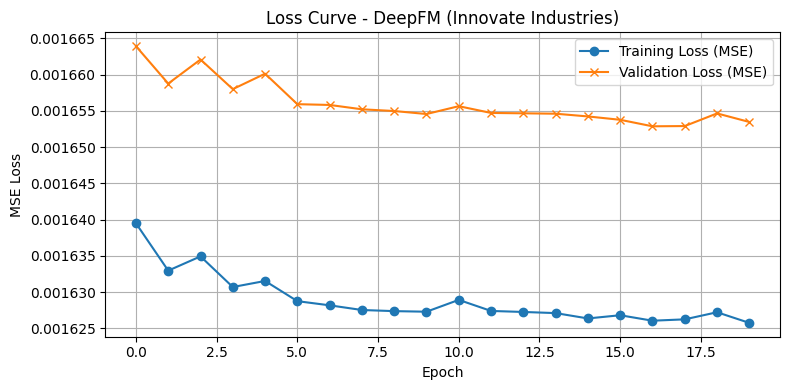

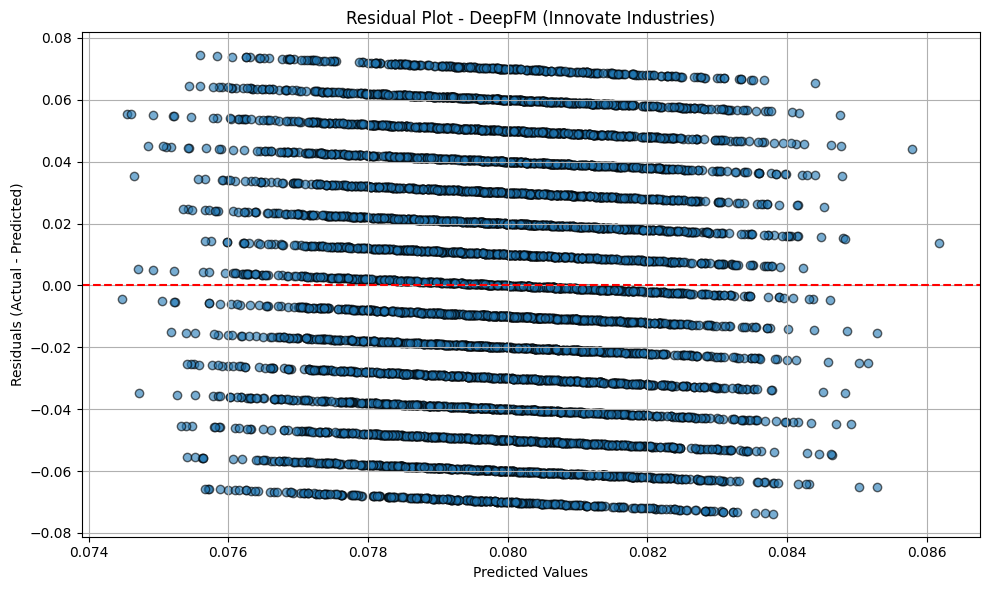

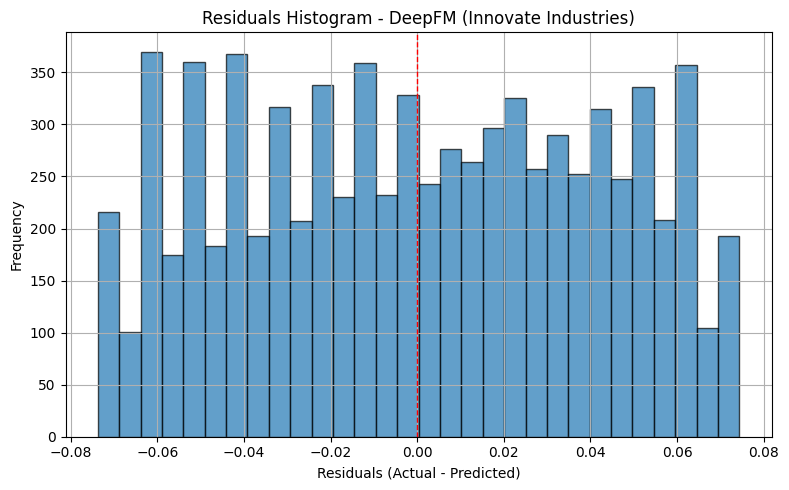


Tuning DeepFM for: NexGen Systems
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu
Train on 25593 samples, validate on 6399 samples, 100 steps per epoch
cpu

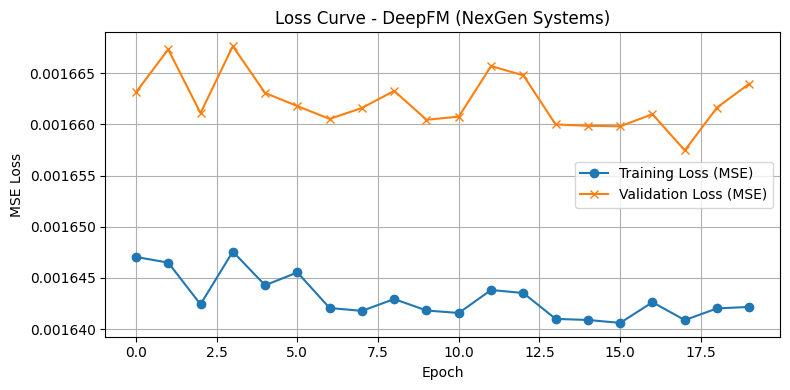

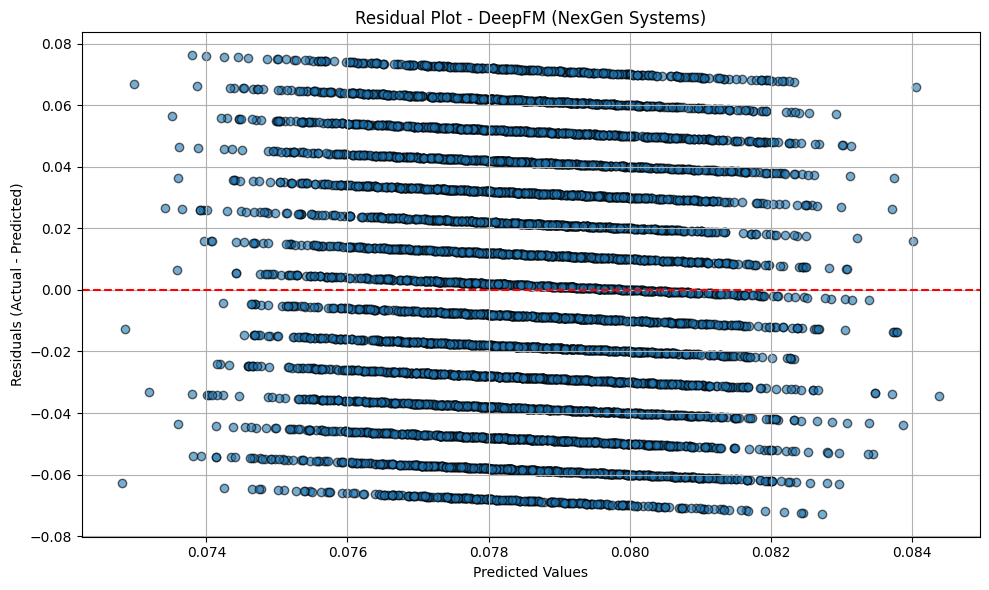

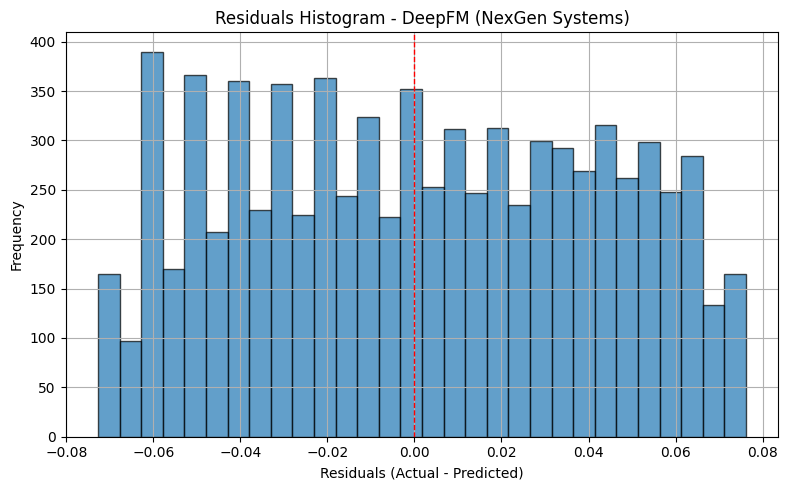


Tuning DeepFM for: Alpha Innovations
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch
cpu
Train on 25632 samples, validate on 6408 samples, 101 steps per epoch


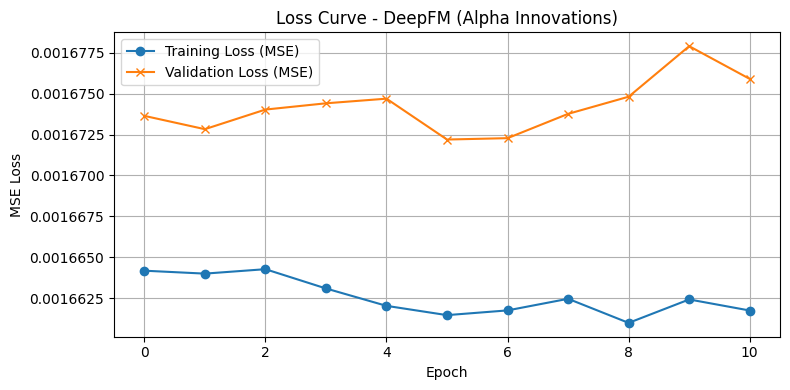

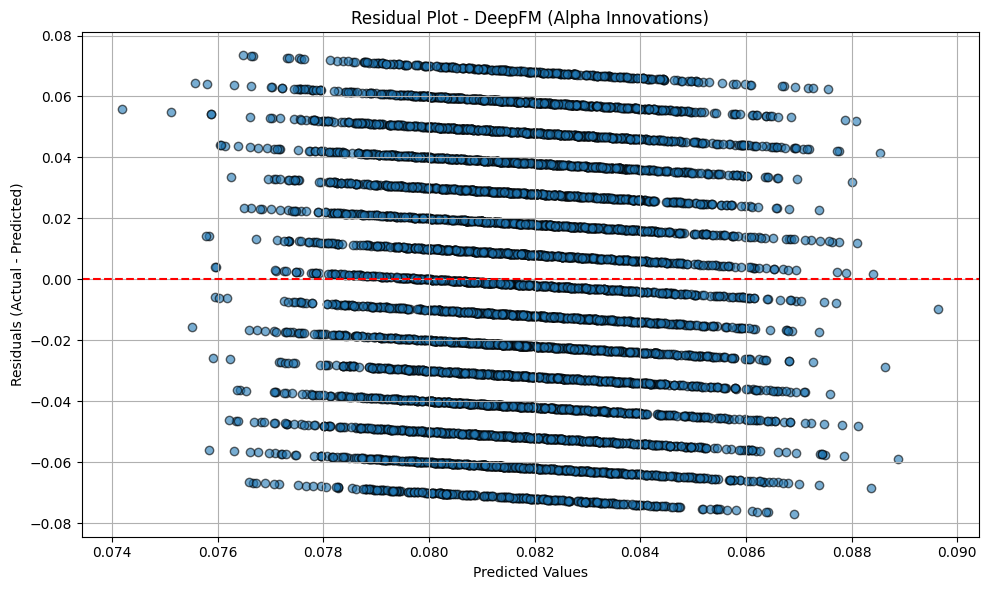

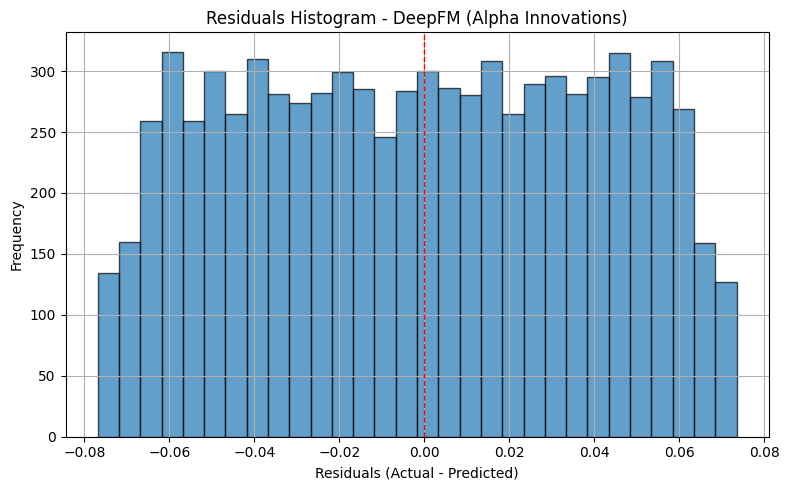


Tuning DeepFM for: DataTech Solutions
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch
cpu
Train on 25607 samples, validate on 6402 samples, 101 steps per epoch

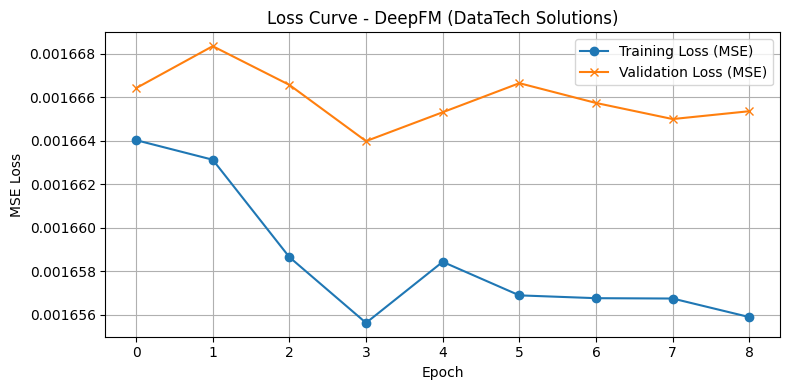

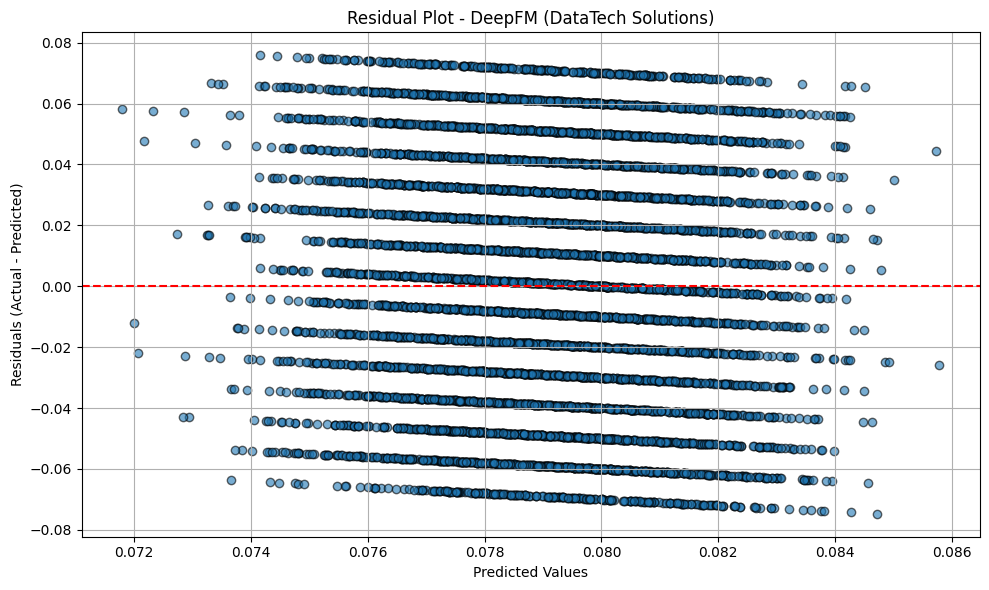

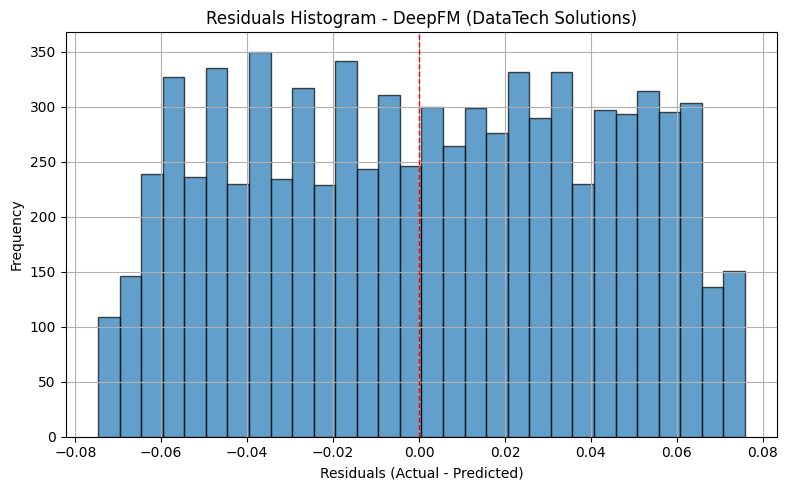


Tuning DeepFM for: TechCorp
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train on 25751 samples, validate on 6438 samples, 101 steps per epoch
cpu
Train

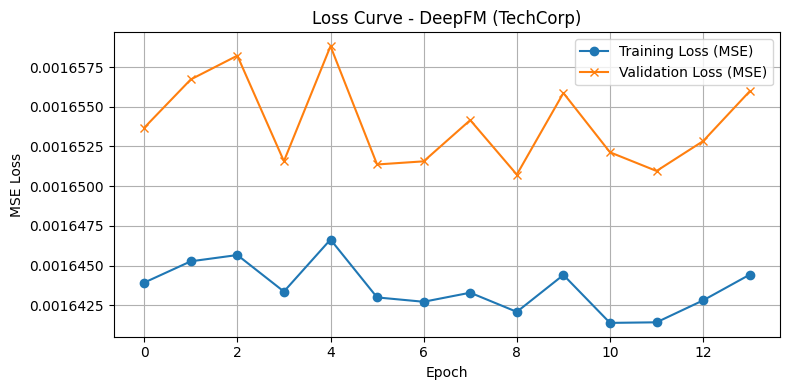

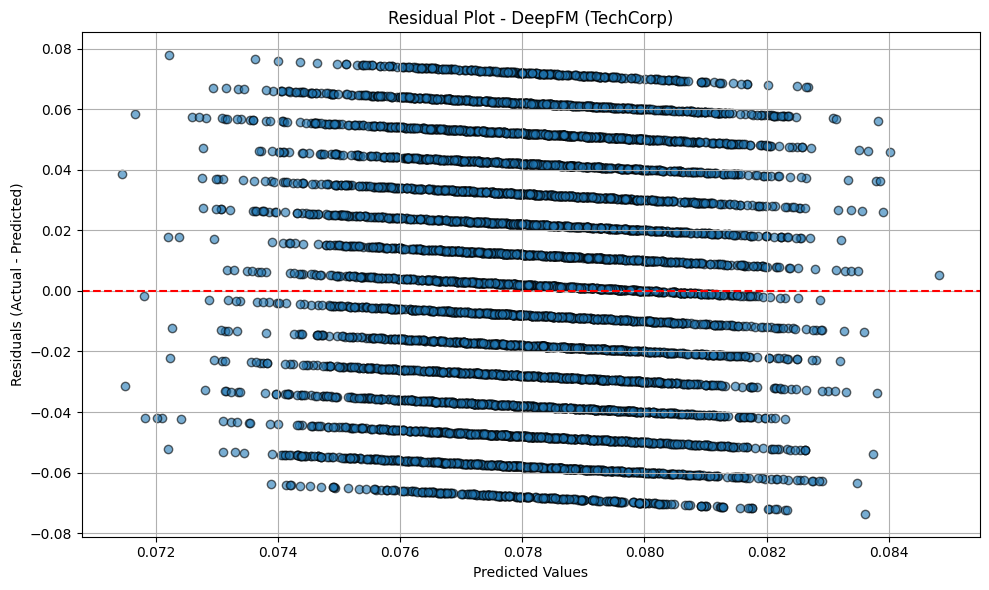

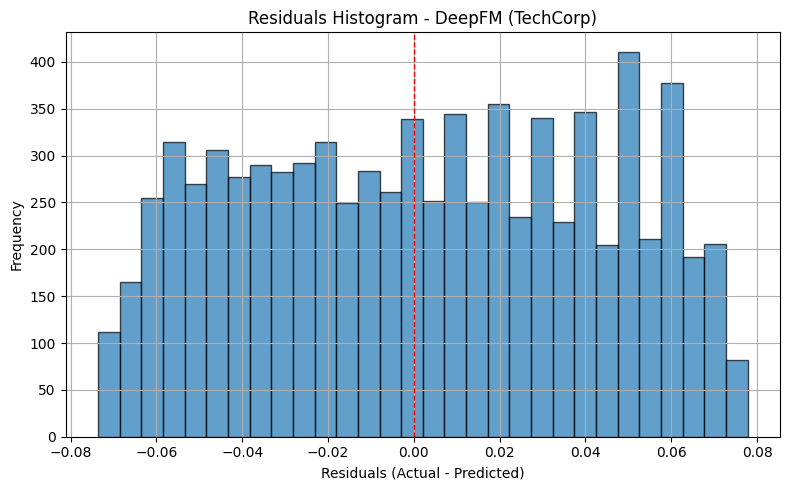

In [39]:
deepfm_results = {}

for company_name, company_data in deepfm_company_data.items():

    x_train = company_data['x_train']
    x_val = company_data['x_val']
    x_test = company_data['x_test']
    y_train = company_data['y_train']
    y_val = company_data['y_val']
    y_test = company_data['y_test']

    best_params = tune_deepfm_hyperparameters(company_name, company_data)
    embedding_dim = best_params["embedding_dim"]
    dnn_hidden_units = best_params["dnn_hidden_units"]
    dnn_dropout = best_params["dnn_dropout"]
    learning_rate = best_params["learning_rate"]
    l2_reg = best_params["l2_reg"]

    fixlen_features = [
        SparseFeat(
            feat,
            vocabulary_size=int(pd.concat([x_train[feat], x_test[feat]]).max()) + 1,
            embedding_dim=embedding_dim
        )
        for feat in deepfm_nominal_categorical_cols
    ] + [
        DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
    ]

    feature_names = get_feature_names(fixlen_features)

    train_input = {name: x_train[name].values for name in feature_names}
    val_input = {name: x_val[name].values for name in feature_names}
    test_input = {name: x_test[name].values for name in feature_names}

    model = DeepFM(
        linear_feature_columns=fixlen_features,
        dnn_feature_columns=fixlen_features,
        dnn_hidden_units=dnn_hidden_units,
        dnn_dropout=dnn_dropout,
        l2_reg_embedding=l2_reg,
        l2_reg_dnn=l2_reg,
        task='regression',
        device=device
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])


    # Early stopping parameters
    EPOCHS = 20
    PATIENCE = 5
    best_val_loss = float("inf")
    epochs_without_improvement = 0
    best_model_state = None
    train_losses = []
    val_losses = []

    for epoch in range(EPOCHS):
        model.fit(train_input, y_train.values, batch_size=256, epochs=1, verbose=0,
                validation_data=(val_input, y_val.values))

        y_train_pred = model.predict(train_input)
        y_val_pred = model.predict(val_input)

        train_mse = mean_squared_error(y_train, y_train_pred)
        val_mse = mean_squared_error(y_val, y_val_pred)

        train_losses.append(train_mse)
        val_losses.append(val_mse)

        print(f"{company_name} — Epoch {epoch + 1}/{EPOCHS} | Train MSE: {train_mse:.5f} | Val MSE: {val_mse:.5f}")

        # Check for early stopping
        if val_mse < best_val_loss:
            best_val_loss = val_mse
            epochs_without_improvement = 0
            best_model_state = model.state_dict()  # Save best model
        else:
            epochs_without_improvement += 1
            if epochs_without_improvement >= PATIENCE:
                print(f"Early stopping at epoch {epoch + 1} (No improvement in {PATIENCE} consecutive epochs)")
                break

    # Restore the best model state
    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    # Final evaluation on test set
    y_pred = model.predict(test_input).flatten()
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    residuals = y_test.values - y_pred

    deepfm_results[company_name] = {
        "MAE": mae, "MSE": mse, "RMSE": rmse, "R2": r2,
        "actuals": y_test.values, "predictions": y_pred,
        "residuals": residuals, "best_params": best_params,
        "train_losses": train_losses, "val_losses": val_losses
    }

    print(f"📈 Final Metrics for {company_name} — MAE: {mae:.4f} | MSE: {mse:.4f} | RMSE: {rmse:.4f} | R2: {r2:.4f}")

    # Plot: Loss Curve
    plt.figure(figsize=(8, 4))
    plt.plot(train_losses, label="Training Loss (MSE)", marker='o')
    plt.plot(val_losses, label="Validation Loss (MSE)", marker='x')
    plt.title(f"Loss Curve - DeepFM ({company_name})")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot: Residual Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, alpha=0.6, edgecolor='k')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f"Residual Plot - DeepFM ({company_name})")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals (Actual - Predicted)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot: Residual Histogram
    plt.figure(figsize=(8, 5))
    plt.hist(residuals, bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
    plt.title(f"Residuals Histogram - DeepFM ({company_name})")
    plt.xlabel("Residuals (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    

In [40]:
pd.DataFrame(deepfm_results).T

,MAE,MSE,RMSE,R2,actuals,predictions,residuals,best_params,train_losses,val_losses
Innovate Industries,0.035114,0.001659,0.04073,-0.001874,"[0.13, 0.06, 0.11, 0.08, 0.08, 0.14, 0.08, 0.1...","[0.07779356092214584, 0.08122103661298752, 0.0...","[0.05220643907785416, -0.02122103661298752, 0....","{'embedding_dim': 4, 'dnn_hidden_units': [256,...","[0.0016394950157082328, 0.0016329590736247708,...","[0.0016639307014469336, 0.0016587706781019875,..."
NexGen Systems,0.034841,0.001632,0.040392,-0.003629,"[0.03, 0.09, 0.13, 0.06, 0.04, 0.15, 0.11, 0.0...","[0.07648597657680511, 0.07665208727121353, 0.0...","[-0.046485976576805116, 0.013347912728786465, ...","{'embedding_dim': 8, 'dnn_hidden_units': [64, ...","[0.0016470530233842098, 0.0016464963013377574,...","[0.0016631328815511874, 0.001667332186073421, ..."
Alpha Innovations,0.035337,0.001669,0.040858,-0.004137,"[0.03, 0.06, 0.08, 0.08, 0.1, 0.08, 0.07, 0.08...","[0.08197087794542313, 0.08186881989240646, 0.0...","[-0.05197087794542313, -0.021868819892406466, ...","{'embedding_dim': 4, 'dnn_hidden_units': [256,...","[0.0016641823789033399, 0.0016640034017650696,...","[0.0016736427739926878, 0.001672829169052978, ..."
DataTech Solutions,0.035263,0.001659,0.040735,-0.005363,"[0.03, 0.14, 0.02, 0.04, 0.04, 0.13, 0.1, 0.1,...","[0.07713067531585693, 0.07810677587985992, 0.0...","[-0.047130675315856935, 0.06189322412014009, -...","{'embedding_dim': 8, 'dnn_hidden_units': [64, ...","[0.0016640270227262226, 0.0016631259797037152,...","[0.001666419012546849, 0.0016683505644695454, ..."
TechCorp,0.035166,0.001658,0.040719,-0.004391,"[0.03, 0.11, 0.04, 0.1, 0.04, 0.11, 0.04, 0.15...","[0.07914874702692032, 0.07977251708507538, 0.0...","[-0.04914874702692032, 0.030227482914924622, -...","{'embedding_dim': 32, 'dnn_hidden_units': [256...","[0.0016439234332899805, 0.001645266131297351, ...","[0.0016536756954305906, 0.0016567215016760116,..."


DeepFM: Cross Validation

In [41]:
# from sklearn.model_selection import KFold

# K = 5  # Number of folds
# deepfm_cv_results = {}

# for company_name, company_data in deepfm_company_data.items():
#     print(f"\nRunning K-Fold DeepFM for: {company_name}")

#     # Extract best parameters from tuning
#     best_params = tune_deepfm_hyperparameters(company_name, company_data)
#     embedding_dim = best_params["embedding_dim"]
#     dnn_hidden_units = best_params["dnn_hidden_units"]
#     dnn_dropout = best_params["dnn_dropout"]
#     learning_rate = best_params["learning_rate"]
#     l2_reg = best_params["l2_reg"]

#     # Combine features and labels for KFold splitting
#     x_full = company_data['x_train'].copy().reset_index(drop=True)
#     y_full = company_data['y_train'].copy().reset_index(drop=True)

#     kf = KFold(n_splits=K, shuffle=True, random_state=42)

#     fold_metrics = []

#     for fold_idx, (train_idx, val_idx) in enumerate(kf.split(x_full)):
#         print(f"\nFold {fold_idx + 1}/{K}")

#         x_train_fold = x_full.iloc[train_idx].copy()
#         x_val_fold = x_full.iloc[val_idx].copy()
#         y_train_fold = y_full.iloc[train_idx].copy()
#         y_val_fold = y_full.iloc[val_idx].copy()

#         # Scale numerical features
#         scaler = MinMaxScaler()
#         x_train_fold[deepfm_original_numerical_cols] = scaler.fit_transform(x_train_fold[deepfm_original_numerical_cols])
#         x_val_fold[deepfm_original_numerical_cols] = scaler.transform(x_val_fold[deepfm_original_numerical_cols])

#         # Set seeds for reproducibility in each fold
#         torch.manual_seed(42)
#         np.random.seed(42)

#         # DeepFM feature setup
#         fixlen_features = [
#             SparseFeat(
#                 feat,
#                 vocabulary_size=int(pd.concat([x_train_fold[feat], x_val_fold[feat]]).max()) + 1,
#                 embedding_dim=embedding_dim
#             )
#             for feat in deepfm_nominal_categorical_cols
#         ] + [
#             DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
#         ]

#         feature_names = get_feature_names(fixlen_features)

#         train_input = {name: x_train_fold[name].values for name in feature_names}
#         val_input = {name: x_val_fold[name].values for name in feature_names}

#         model = DeepFM(
#             linear_feature_columns=fixlen_features,
#             dnn_feature_columns=fixlen_features,
#             dnn_hidden_units=dnn_hidden_units,
#             dnn_dropout=dnn_dropout,
#             l2_reg_embedding=l2_reg,
#             l2_reg_dnn=l2_reg,
#             task='regression',
#             device=device
#         )

#         optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
#         model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])

#         # Early Stopping
#         EPOCHS = 20
#         PATIENCE = 5
#         best_val_loss = float("inf")
#         epochs_without_improvement = 0
#         best_model_state = None

#         for epoch in range(EPOCHS):
#             model.fit(train_input, y_train_fold.values, batch_size=256, epochs=1, verbose=0,
#                       validation_data=(val_input, y_val_fold.values))

#             y_val_pred = model.predict(val_input).flatten()
#             val_mse = mean_squared_error(y_val_fold, y_val_pred)

#             if val_mse < best_val_loss:
#                 best_val_loss = val_mse
#                 epochs_without_improvement = 0
#                 best_model_state = model.state_dict()
#             else:
#                 epochs_without_improvement += 1
#                 if epochs_without_improvement >= PATIENCE:
#                     print(f"Early stopping at epoch {epoch + 1}")
#                     break

#         if best_model_state is not None:
#             model.load_state_dict(best_model_state)

#         # Evaluation
#         y_val_pred = model.predict(val_input).flatten()
#         mae = mean_absolute_error(y_val_fold, y_val_pred)
#         mse = mean_squared_error(y_val_fold, y_val_pred)
#         rmse = np.sqrt(mse)
#         r2 = r2_score(y_val_fold, y_val_pred)

#         print(f"Fold {fold_idx + 1} — MAE: {mae:.4f} | RMSE: {rmse:.4f} | R2: {r2:.4f}")
#         fold_metrics.append((mae, mse, rmse, r2))

#     # Average metrics over folds
#     avg_mae = np.mean([m[0] for m in fold_metrics])
#     avg_mse = np.mean([m[1] for m in fold_metrics])
#     avg_rmse = np.mean([m[2] for m in fold_metrics])
#     avg_r2 = np.mean([m[3] for m in fold_metrics])

#     deepfm_cv_results[company_name] = {
#         "Avg_MAE": avg_mae,
#         "Avg_MSE": avg_mse,
#         "Avg_RMSE": avg_rmse,
#         "Avg_R2": avg_r2,
#         "best_params": best_params,
#         "fold_scores": fold_metrics
#     }
    

#     print(f"\nAverage Metrics for {company_name} (K={K}) — MAE: {avg_mae:.4f} | RMSE: {avg_rmse:.4f} | R2: {avg_r2:.4f}")


In [42]:
# pd.DataFrame(deepfm_cv_results).T

In [43]:
print("Verifying if each company uses its own best parameters:\n")

for company_name in deepfm_results: #deep_cv_results
    print(f"{company_name}")

    best_params = deepfm_results[company_name]['best_params'] #deep_cv_results

    embedding_dim = best_params.get("embedding_dim", None)
    dnn_hidden_units = best_params.get("dnn_hidden_units", None)
    dnn_dropout = best_params.get("dnn_dropout", None)
    learning_rate = best_params.get("learning_rate", None)
    l2_reg = best_params.get("l2_reg", None)

    print(f"  ➤ Embedding Dim     : {embedding_dim}")
    print(f"  ➤ DNN Hidden Units  : {dnn_hidden_units}")
    print(f"  ➤ DNN Dropout       : {dnn_dropout}")
    print(f"  ➤ Learning Rate     : {learning_rate}")
    print(f"  ➤ L2 Regularization : {l2_reg}")
    print("-" * 50)


Verifying if each company uses its own best parameters:

Innovate Industries
  ➤ Embedding Dim     : 4
  ➤ DNN Hidden Units  : [256, 128]
  ➤ DNN Dropout       : 0.4226163831945253
  ➤ Learning Rate     : 0.00010400461949476059
  ➤ L2 Regularization : 0.0006711019904267874
--------------------------------------------------
NexGen Systems
  ➤ Embedding Dim     : 8
  ➤ DNN Hidden Units  : [64, 32, 16]
  ➤ DNN Dropout       : 0.22761593028411628
  ➤ Learning Rate     : 0.00011625959983557336
  ➤ L2 Regularization : 1.320246933487829e-05
--------------------------------------------------
Alpha Innovations
  ➤ Embedding Dim     : 4
  ➤ DNN Hidden Units  : [256, 128]
  ➤ DNN Dropout       : 0.31861845167738034
  ➤ Learning Rate     : 0.00022483802540331383
  ➤ L2 Regularization : 0.0013479097152101487
--------------------------------------------------
DataTech Solutions
  ➤ Embedding Dim     : 8
  ➤ DNN Hidden Units  : [64, 32, 16]
  ➤ DNN Dropout       : 0.21465590860997646
  ➤ Learning Rat


Final Test Evaluation — Innovate Industries
Best Parameters for Innovate Industries: {'embedding_dim': 4, 'dnn_hidden_units': [256, 128], 'dnn_dropout': 0.4226163831945253, 'learning_rate': 0.00010400461949476059, 'l2_reg': 0.0006711019904267874}
cpu
Train on 25413 samples, validate on 7942 samples, 100 steps per epoch
Innovate Industries — Epoch 1/50 | Train MSE: 0.00164 | Val MSE: 0.00167
cpu
Train on 25413 samples, validate on 7942 samples, 100 steps per epoch
Innovate Industries — Epoch 2/50 | Train MSE: 0.00163 | Val MSE: 0.00166
cpu
Train on 25413 samples, validate on 7942 samples, 100 steps per epoch
Innovate Industries — Epoch 3/50 | Train MSE: 0.00163 | Val MSE: 0.00166
cpu
Train on 25413 samples, validate on 7942 samples, 100 steps per epoch
Innovate Industries — Epoch 4/50 | Train MSE: 0.00163 | Val MSE: 0.00166
cpu
Train on 25413 samples, validate on 7942 samples, 100 steps per epoch
Innovate Industries — Epoch 5/50 | Train MSE: 0.00163 | Val MSE: 0.00166
cpu
Train on 2541

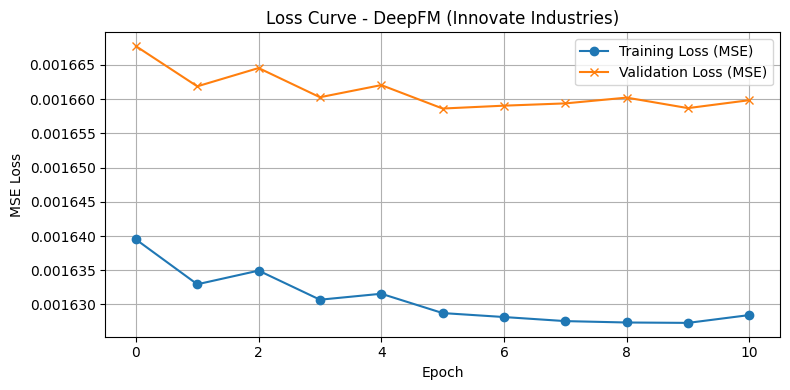

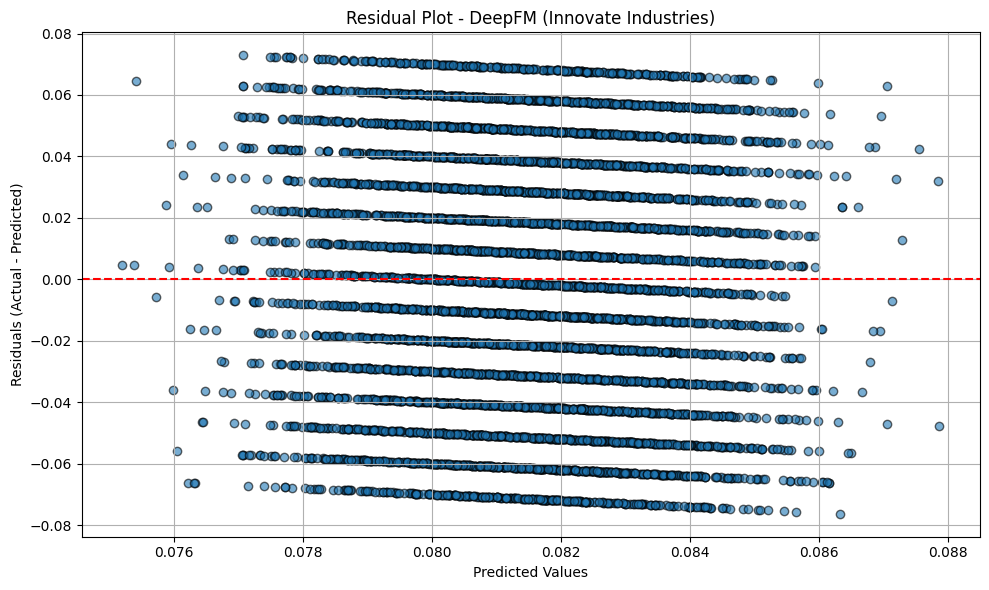

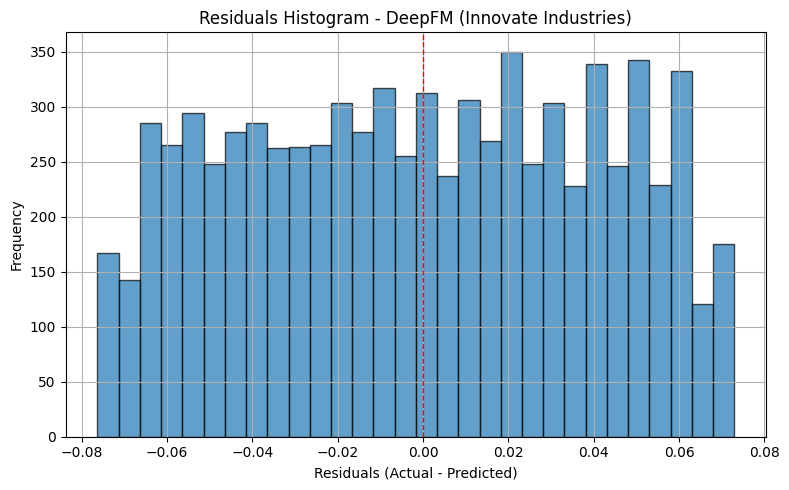


Final Test Evaluation — NexGen Systems
Best Parameters for NexGen Systems: {'embedding_dim': 8, 'dnn_hidden_units': [64, 32, 16], 'dnn_dropout': 0.22761593028411628, 'learning_rate': 0.00011625959983557336, 'l2_reg': 1.320246933487829e-05}
cpu
Train on 25593 samples, validate on 7999 samples, 100 steps per epoch
NexGen Systems — Epoch 1/50 | Train MSE: 0.00165 | Val MSE: 0.00163
cpu
Train on 25593 samples, validate on 7999 samples, 100 steps per epoch
NexGen Systems — Epoch 2/50 | Train MSE: 0.00165 | Val MSE: 0.00163
cpu
Train on 25593 samples, validate on 7999 samples, 100 steps per epoch
NexGen Systems — Epoch 3/50 | Train MSE: 0.00164 | Val MSE: 0.00163
cpu
Train on 25593 samples, validate on 7999 samples, 100 steps per epoch
NexGen Systems — Epoch 4/50 | Train MSE: 0.00165 | Val MSE: 0.00164
cpu
Train on 25593 samples, validate on 7999 samples, 100 steps per epoch
NexGen Systems — Epoch 5/50 | Train MSE: 0.00164 | Val MSE: 0.00163
cpu
Train on 25593 samples, validate on 7999 samp

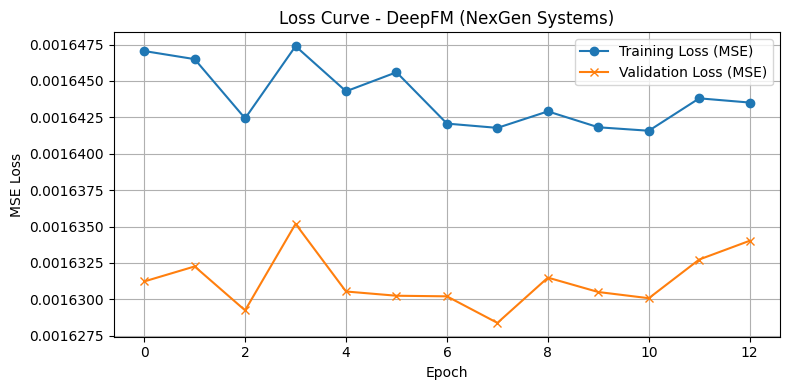

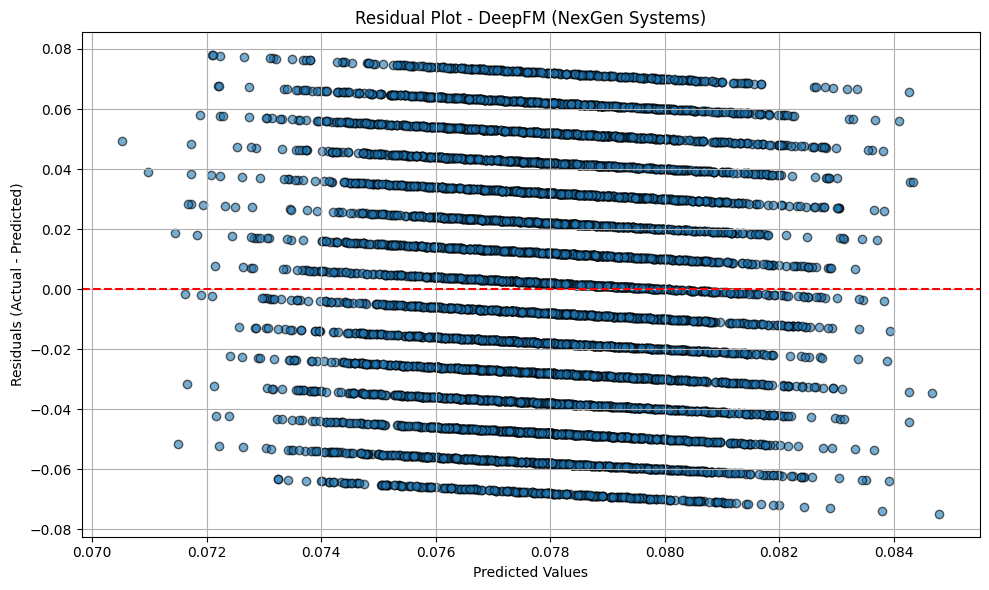

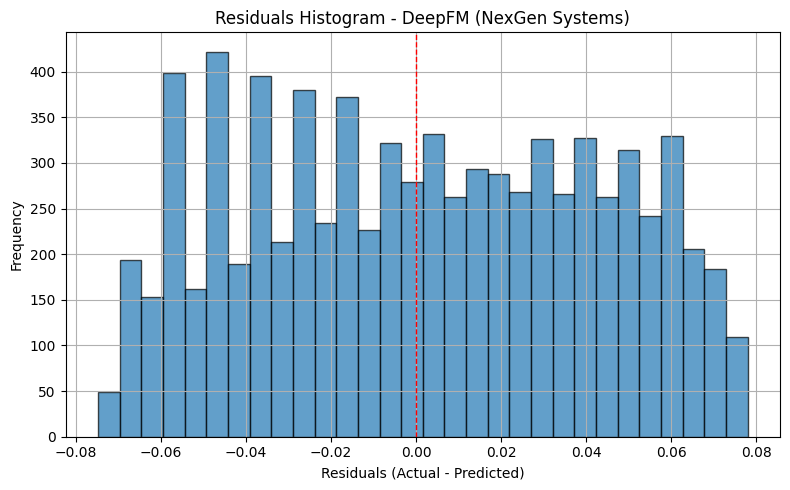


Final Test Evaluation — Alpha Innovations
Best Parameters for Alpha Innovations: {'embedding_dim': 4, 'dnn_hidden_units': [256, 128], 'dnn_dropout': 0.31861845167738034, 'learning_rate': 0.00022483802540331383, 'l2_reg': 0.0013479097152101487}
cpu
Train on 25632 samples, validate on 8011 samples, 101 steps per epoch
Alpha Innovations — Epoch 1/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25632 samples, validate on 8011 samples, 101 steps per epoch
Alpha Innovations — Epoch 2/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25632 samples, validate on 8011 samples, 101 steps per epoch
Alpha Innovations — Epoch 3/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25632 samples, validate on 8011 samples, 101 steps per epoch
Alpha Innovations — Epoch 4/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25632 samples, validate on 8011 samples, 101 steps per epoch
Alpha Innovations — Epoch 5/50 | Train MSE: 0.00166 | Val MSE: 0.00167
cpu
Train on 25632 samples, va

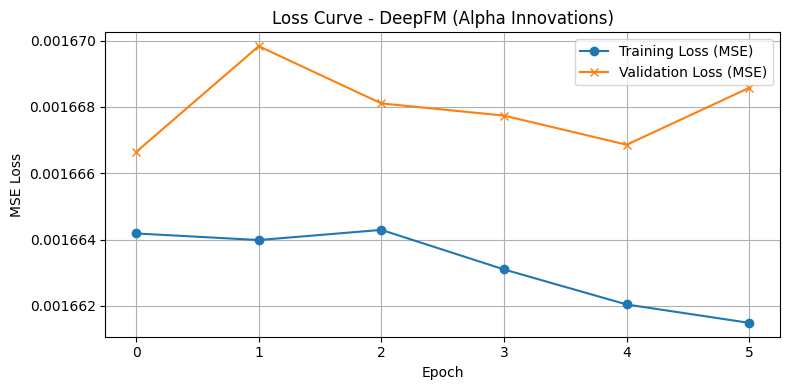

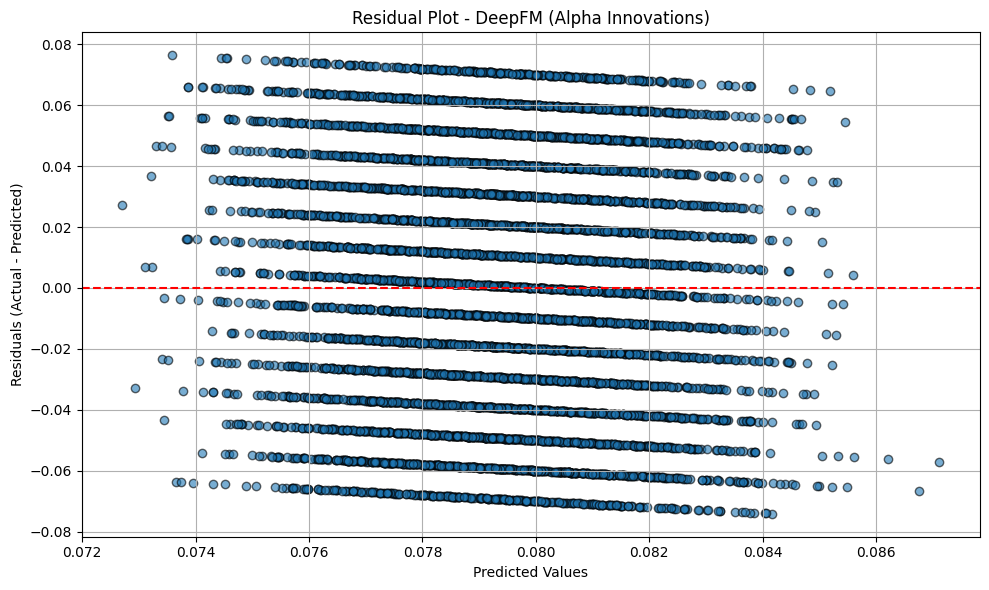

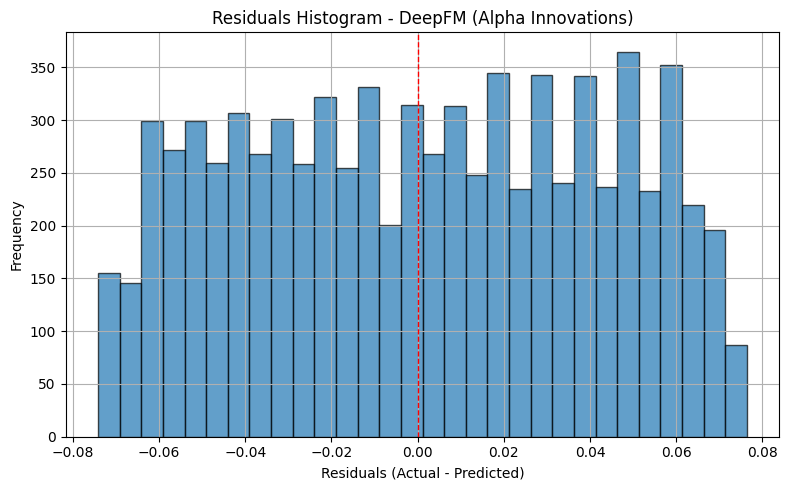


Final Test Evaluation — DataTech Solutions
Best Parameters for DataTech Solutions: {'embedding_dim': 8, 'dnn_hidden_units': [64, 32, 16], 'dnn_dropout': 0.21465590860997646, 'learning_rate': 0.00010323199119858206, 'l2_reg': 1.2230547699978237e-05}
cpu
Train on 25607 samples, validate on 8003 samples, 101 steps per epoch
DataTech Solutions — Epoch 1/50 | Train MSE: 0.00166 | Val MSE: 0.00166
cpu
Train on 25607 samples, validate on 8003 samples, 101 steps per epoch
DataTech Solutions — Epoch 2/50 | Train MSE: 0.00166 | Val MSE: 0.00166
cpu
Train on 25607 samples, validate on 8003 samples, 101 steps per epoch
DataTech Solutions — Epoch 3/50 | Train MSE: 0.00166 | Val MSE: 0.00166
cpu
Train on 25607 samples, validate on 8003 samples, 101 steps per epoch
DataTech Solutions — Epoch 4/50 | Train MSE: 0.00166 | Val MSE: 0.00166
cpu
Train on 25607 samples, validate on 8003 samples, 101 steps per epoch
DataTech Solutions — Epoch 5/50 | Train MSE: 0.00166 | Val MSE: 0.00165
cpu
Train on 25607 s

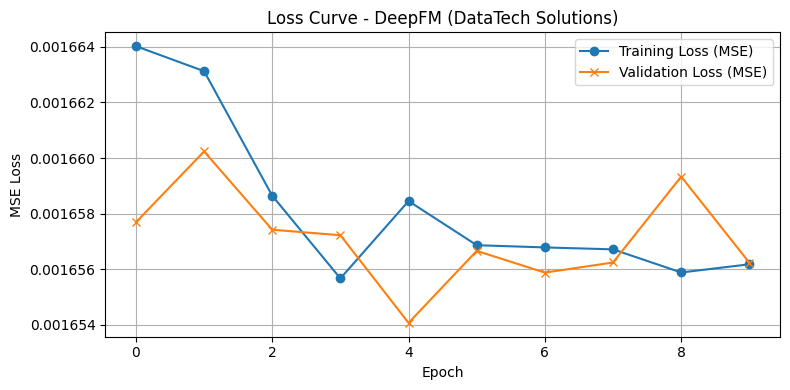

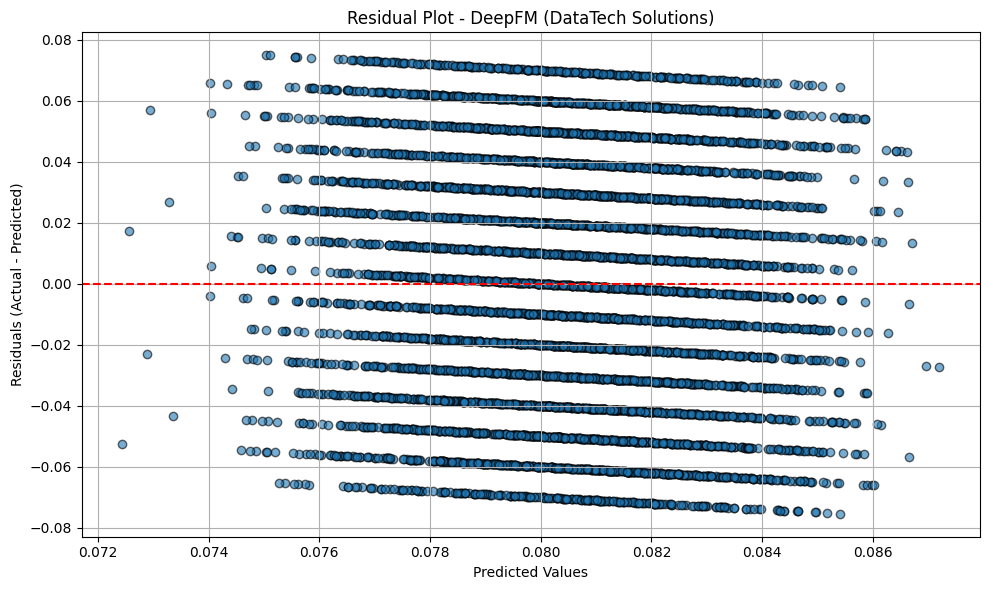

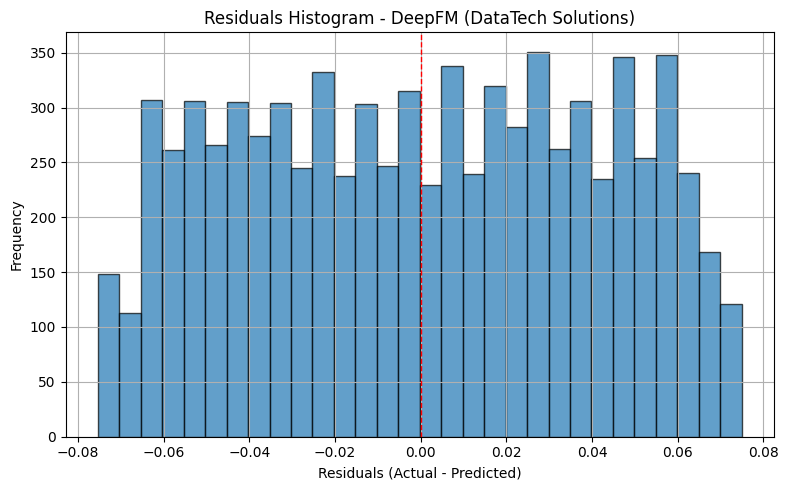


Final Test Evaluation — TechCorp
Best Parameters for TechCorp: {'embedding_dim': 32, 'dnn_hidden_units': [256, 128, 64], 'dnn_dropout': 0.49792695112737995, 'learning_rate': 0.00010970356916335892, 'l2_reg': 0.001813267950029688}
cpu
Train on 25751 samples, validate on 8048 samples, 101 steps per epoch
TechCorp — Epoch 1/50 | Train MSE: 0.00164 | Val MSE: 0.00165
cpu
Train on 25751 samples, validate on 8048 samples, 101 steps per epoch
TechCorp — Epoch 2/50 | Train MSE: 0.00165 | Val MSE: 0.00166
cpu
Train on 25751 samples, validate on 8048 samples, 101 steps per epoch
TechCorp — Epoch 3/50 | Train MSE: 0.00165 | Val MSE: 0.00166
cpu
Train on 25751 samples, validate on 8048 samples, 101 steps per epoch
TechCorp — Epoch 4/50 | Train MSE: 0.00164 | Val MSE: 0.00165
cpu
Train on 25751 samples, validate on 8048 samples, 101 steps per epoch
TechCorp — Epoch 5/50 | Train MSE: 0.00165 | Val MSE: 0.00166
cpu
Train on 25751 samples, validate on 8048 samples, 101 steps per epoch
TechCorp — Epoc

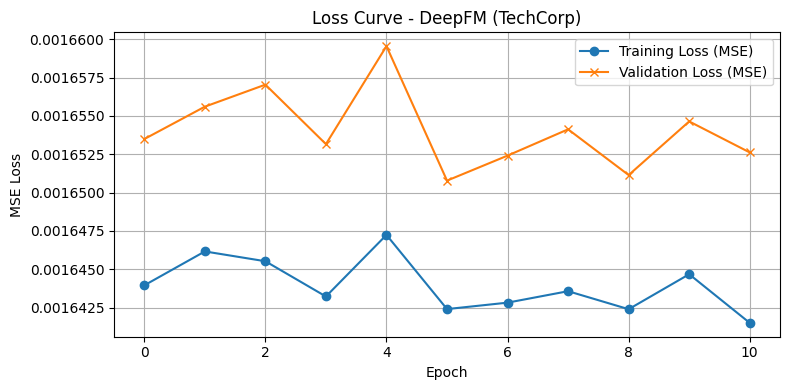

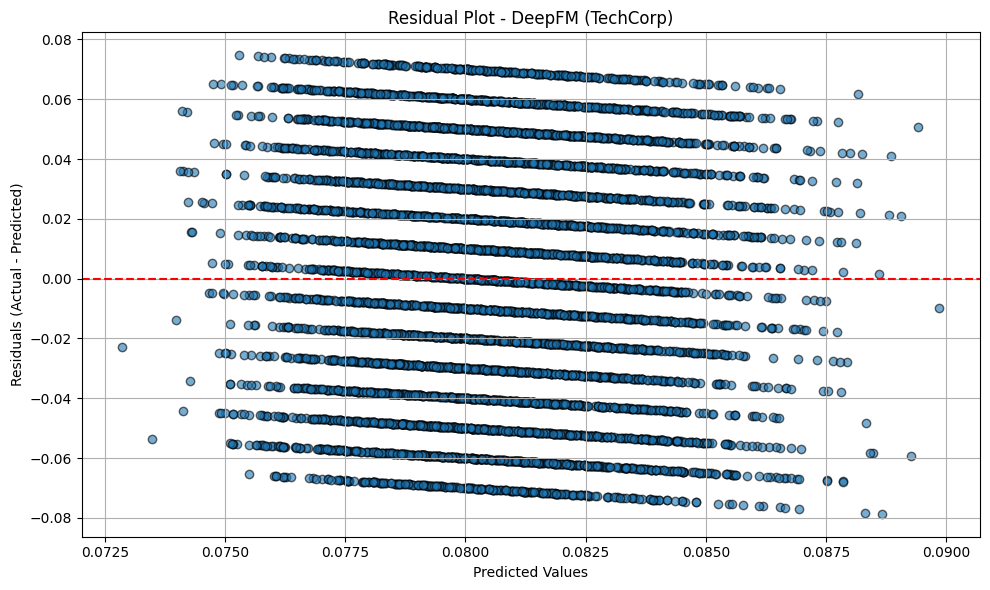

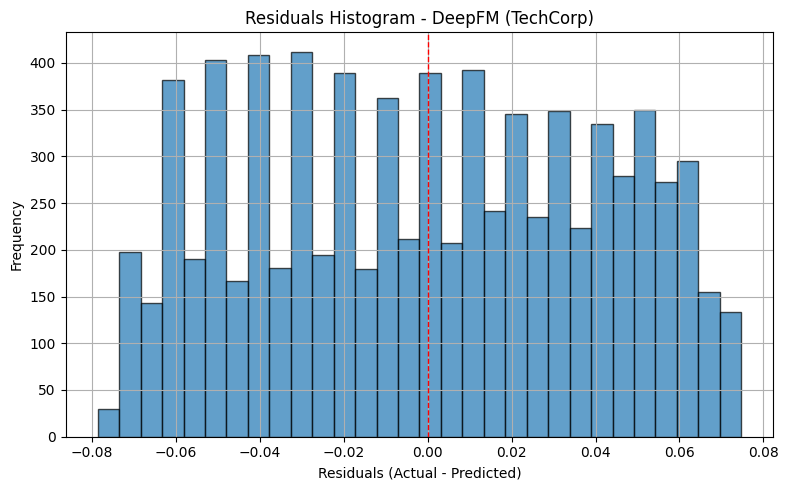

In [44]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

deepfm_test_results = {}

for company_name, company_data in deepfm_company_data.items():
    print(f"\nFinal Test Evaluation — {company_name}")

    # Extract best hyperparameters from previous tuning
    best_params = deepfm_results[company_name]['best_params'] #deep_cv_results
    embedding_dim = best_params["embedding_dim"]
    dnn_hidden_units = best_params["dnn_hidden_units"]
    dnn_dropout = best_params["dnn_dropout"]
    learning_rate = best_params["learning_rate"]
    l2_reg = best_params["l2_reg"]

    # Print best parameters
    print(f"Best Parameters for {company_name}: {best_params}")

    x_train = company_data['x_train'].copy()
    x_test = company_data['x_test'].copy()
    y_train = company_data['y_train']
    y_test = company_data['y_test']

    # Rebuild feature columns using both train and test for correct vocabulary size
    fixlen_features = [
        SparseFeat(
            feat,
            vocabulary_size=int(pd.concat([x_train[feat], x_test[feat]]).max()) + 1,
            embedding_dim=embedding_dim
        )
        for feat in deepfm_nominal_categorical_cols
    ] + [
        DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
    ]

    feature_names = get_feature_names(fixlen_features)

    train_input = {name: x_train[name].values for name in feature_names}
    test_input = {name: x_test[name].values for name in feature_names}

    # Initialize model
    model = DeepFM(
        linear_feature_columns=fixlen_features,
        dnn_feature_columns=fixlen_features,
        dnn_hidden_units=dnn_hidden_units,
        dnn_dropout=dnn_dropout,
        task='regression',
        device=device
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])


    # Early stopping parameters
    EPOCHS = 50
    PATIENCE = 5
    best_val_loss = float("inf")
    epochs_without_improvement = 0
    best_model_state = None
    train_losses = []
    val_losses = []

    for epoch in range(EPOCHS):
        model.fit(train_input, y_train.values, batch_size=256, epochs=1, verbose=0,
                validation_data=(test_input, y_test.values))

        y_train_pred = model.predict(train_input)
        y_val_pred = model.predict(test_input)

        train_mse = mean_squared_error(y_train, y_train_pred)
        val_mse = mean_squared_error(y_test, y_val_pred)

        train_losses.append(train_mse)
        val_losses.append(val_mse)

        print(f"{company_name} — Epoch {epoch + 1}/{EPOCHS} | Train MSE: {train_mse:.5f} | Val MSE: {val_mse:.5f}")

        # Check for early stopping
        if val_mse < best_val_loss:
            best_val_loss = val_mse
            epochs_without_improvement = 0
            best_model_state = model.state_dict()  # Save best model
        else:
            epochs_without_improvement += 1
            if epochs_without_improvement >= PATIENCE:
                print(f"Early stopping at epoch {epoch + 1} (No improvement in {PATIENCE} consecutive epochs)")
                break

    # Restore the best model state
    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    # Predict and evaluate on test set
    y_test_pred = model.predict(test_input).flatten()
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(y_test, y_test_pred)
    test_residuals = y_test.values - y_test_pred

    deepfm_test_results[company_name] = {
        "Test_MAE": test_mae,
        "Test_MSE": test_mse,
        "Test_RMSE": test_rmse,
        "Test_R2": test_r2,
        "actuals": y_test.values, 
        "predictions": y_test_pred,
        "residuals": test_residuals, 
        "best_params": best_params
    }

    print(f"Test Results — MAE: {test_mae:.4f} | RMSE: {test_rmse:.4f} | R2: {test_r2:.4f}")
        
    # Plot: Loss Curve
    plt.figure(figsize=(8, 4))
    plt.plot(train_losses, label="Training Loss (MSE)", marker='o')
    plt.plot(val_losses, label="Validation Loss (MSE)", marker='x')
    plt.title(f"Loss Curve - DeepFM ({company_name})")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot: Residual Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test_pred, test_residuals, alpha=0.6, edgecolor='k')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f"Residual Plot - DeepFM ({company_name})")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals (Actual - Predicted)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot: Residual Histogram
    plt.figure(figsize=(8, 5))
    plt.hist(test_residuals, bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
    plt.title(f"Residuals Histogram - DeepFM ({company_name})")
    plt.xlabel("Residuals (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [45]:
pd.DataFrame(deepfm_test_results).T

,Test_MAE,Test_MSE,Test_RMSE,Test_R2,actuals,predictions,residuals,best_params
Innovate Industries,0.035125,0.00166,0.040741,-0.002425,"[0.13, 0.06, 0.11, 0.08, 0.08, 0.14, 0.08, 0.1...","[0.07870197296142578, 0.08373318612575531, 0.0...","[0.05129802703857422, -0.023733186125755312, 0...","{'embedding_dim': 4, 'dnn_hidden_units': [256,..."
NexGen Systems,0.034877,0.001634,0.040423,-0.005161,"[0.03, 0.09, 0.13, 0.06, 0.04, 0.15, 0.11, 0.0...","[0.07612651586532593, 0.0767979621887207, 0.07...","[-0.04612651586532593, 0.013202037811279294, 0...","{'embedding_dim': 8, 'dnn_hidden_units': [64, ..."
Alpha Innovations,0.035343,0.001669,0.040848,-0.003642,"[0.03, 0.06, 0.08, 0.08, 0.1, 0.08, 0.07, 0.08...","[0.078158438205719, 0.07877995073795319, 0.078...","[-0.048158438205718995, -0.018779950737953188,...","{'embedding_dim': 4, 'dnn_hidden_units': [256,..."
DataTech Solutions,0.035229,0.001656,0.040697,-0.003487,"[0.03, 0.14, 0.02, 0.04, 0.04, 0.13, 0.1, 0.1,...","[0.0816742405295372, 0.07871893793344498, 0.07...","[-0.0516742405295372, 0.061281062066555037, -0...","{'embedding_dim': 8, 'dnn_hidden_units': [64, ..."
TechCorp,0.035096,0.001653,0.040652,-0.001087,"[0.03, 0.11, 0.04, 0.1, 0.04, 0.11, 0.04, 0.15...","[0.07979106158018112, 0.08390290290117264, 0.0...","[-0.04979106158018112, 0.026097097098827363, -...","{'embedding_dim': 32, 'dnn_hidden_units': [256..."


DeepFM: Feature Importance Analysis

In [46]:
import torch
import numpy as np

deepfm_embedding_importance = {}

for company_name, company_data in deepfm_company_data.items():
    print(f"\n📊 Embedding Importance — {company_name}")

    # Load best hyperparameters
    best_params = deepfm_results[company_name]['best_params'] #deep_cv_results
    embedding_dim = best_params['embedding_dim']
    dnn_hidden_units = best_params['dnn_hidden_units']
    dnn_dropout = best_params['dnn_dropout']
    learning_rate = best_params['learning_rate']
    l2_reg = best_params['l2_reg']

    # Extract train and test data
    x_train = company_data['x_train'].copy()
    x_test = company_data['x_test'].copy()

    # Define feature columns
    fixlen_features = [
        SparseFeat(
            feat,
            vocabulary_size=int(pd.concat([x_train[feat], x_test[feat]]).max()) + 1,
            embedding_dim=embedding_dim
        )
        for feat in deepfm_nominal_categorical_cols
    ] + [
        DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
    ]

    feature_names = get_feature_names(fixlen_features)

    # Prepare input dict for training
    train_input = {name: x_train[name].values for name in feature_names}
    y_train = company_data['y_train'].values

    # Initialize DeepFM model
    model = DeepFM(
        linear_feature_columns=fixlen_features,
        dnn_feature_columns=fixlen_features,
        dnn_hidden_units=dnn_hidden_units,
        dnn_dropout=dnn_dropout,
        l2_reg_embedding=l2_reg,
        l2_reg_dnn=l2_reg,
        task='regression',
        device=device
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])

    # Train model briefly to load weights
    model.fit(train_input, y_train, batch_size=256, epochs=10, verbose=0)

    # Extract trained embeddings from the model
    embedding_dict = model.state_dict()
    sparse_feat_names = [feat.name for feat in fixlen_features if isinstance(feat, SparseFeat)]

    feature_importances = {}

    for feat_name in sparse_feat_names:
        weight_name = f"embedding_dict.{feat_name}.weight"
        if weight_name in embedding_dict:
            embeddings = embedding_dict[weight_name].detach().cpu().numpy()
            # Use L2 norm (Euclidean norm) per embedding vector, then mean over all tokens
            norms = np.linalg.norm(embeddings, axis=1)
            importance_score = np.mean(norms)
            feature_importances[feat_name] = importance_score
        else:
            print(f"Warning: {weight_name} not found in state_dict.")

    # Normalize to [0, 1]
    total = sum(feature_importances.values())
    normalized_importances = {k: v / total for k, v in feature_importances.items()}

    deepfm_embedding_importance[company_name] = normalized_importances

    # Display sorted importances
    sorted_features = sorted(normalized_importances.items(), key=lambda x: x[1], reverse=True)
    print(f"Top Features by Embedding Magnitude for {company_name}:")
    for feat, score in sorted_features:
        print(f" - {feat}: {score:.4f}")



📊 Embedding Importance — Innovate Industries
cpu
Train on 25413 samples, validate on 0 samples, 100 steps per epoch
Top Features by Embedding Magnitude for Innovate Industries:
 - Gender: 0.1617
 - Age_Group: 0.1501
 - Customer_Segment: 0.1406
 - Location: 0.1398
 - Language: 0.1388
 - Campaign_Type: 0.1387
 - Channel_Used: 0.1303

📊 Embedding Importance — NexGen Systems
cpu
Train on 25593 samples, validate on 0 samples, 100 steps per epoch
Top Features by Embedding Magnitude for NexGen Systems:
 - Gender: 0.1596
 - Age_Group: 0.1503
 - Language: 0.1415
 - Location: 0.1402
 - Campaign_Type: 0.1401
 - Customer_Segment: 0.1388
 - Channel_Used: 0.1295

📊 Embedding Importance — Alpha Innovations
cpu
Train on 25632 samples, validate on 0 samples, 101 steps per epoch
Top Features by Embedding Magnitude for Alpha Innovations:
 - Campaign_Type: 0.2170
 - Location: 0.1568
 - Channel_Used: 0.1432
 - Language: 0.1387
 - Age_Group: 0.1282
 - Gender: 0.1226
 - Customer_Segment: 0.0936

📊 Embedding

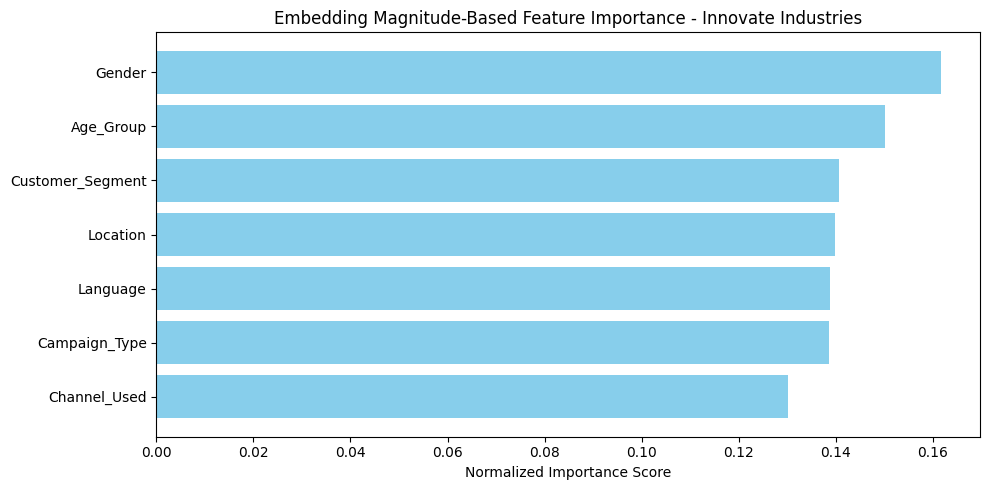

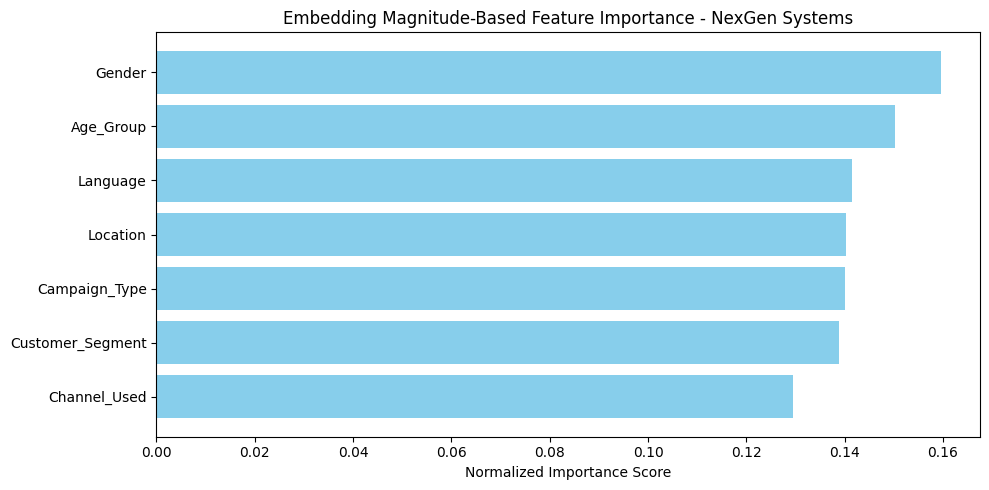

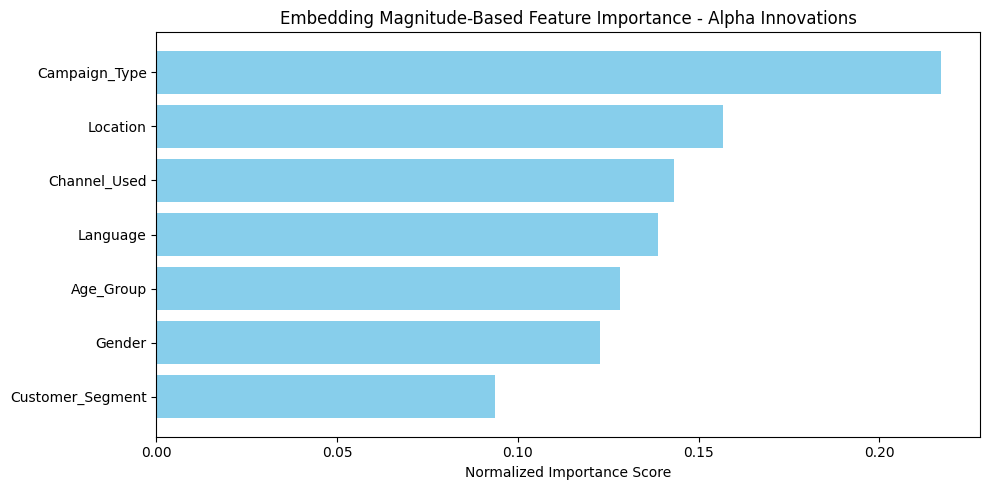

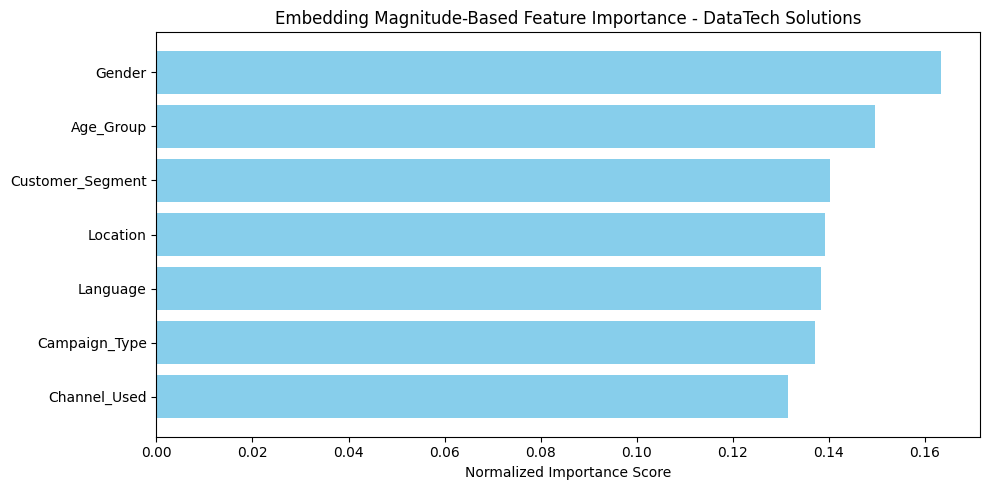

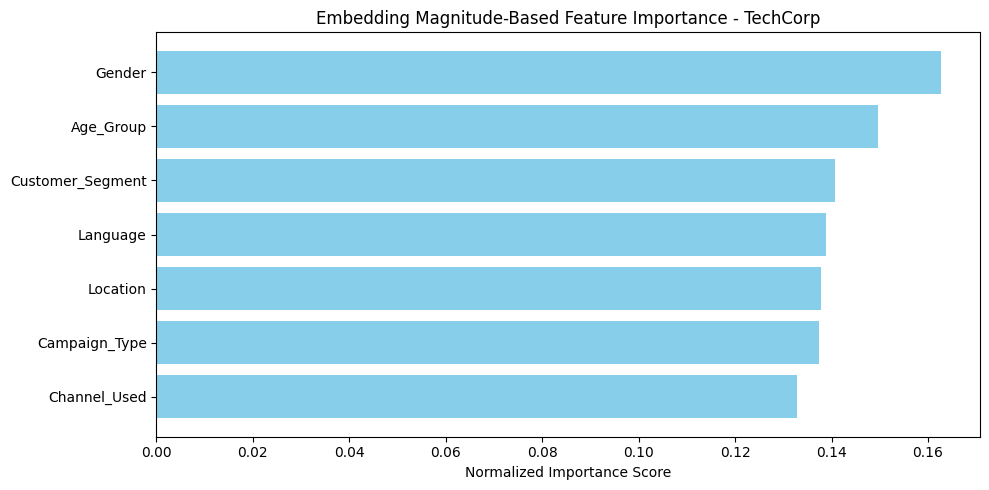

In [47]:
import matplotlib.pyplot as plt

for company, importance in deepfm_embedding_importance.items():
    sorted_feats = sorted(importance.items(), key=lambda x: x[1], reverse=True)
    features, scores = zip(*sorted_feats)

    plt.figure(figsize=(10, 5))
    plt.barh(features, scores, color='skyblue')
    plt.gca().invert_yaxis()
    plt.title(f"Embedding Magnitude-Based Feature Importance - {company}")
    plt.xlabel("Normalized Importance Score")
    plt.tight_layout()
    plt.show()


In [48]:
import copy
import torch
from collections import defaultdict
from copy import deepcopy
from sklearn.utils import shuffle

print("\n--- DeepFM Feature Importance: Permutation Importance ---\n")

deepfm_permutation_importance = {}

for company_name, company_data in deepfm_company_data.items():
    print(f"Permutation Importance for: {company_name}")

    # Use the best trained model and data from Section 5
    best_params = deepfm_results[company_name]['best_params'] #deep_cv_results
    embedding_dim = best_params["embedding_dim"]
    dnn_hidden_units = best_params["dnn_hidden_units"]
    dnn_dropout = best_params["dnn_dropout"]
    learning_rate = best_params["learning_rate"]
    l2_reg = best_params["l2_reg"]

    x_train = company_data['x_train'].copy()
    x_test = company_data['x_test'].copy()
    y_test = company_data['y_test']

    # Rebuild feature columns using train+test for vocabulary size
    fixlen_features = [
        SparseFeat(
            feat,
            vocabulary_size=int(pd.concat([x_train[feat], x_test[feat]]).max()) + 1,
            embedding_dim=embedding_dim
        )
        for feat in deepfm_nominal_categorical_cols
    ] + [
        DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
    ]

    feature_names = get_feature_names(fixlen_features)

    # Prepare test input dict (original)
    test_input = {name: x_test[name].values.copy() for name in feature_names}

    # Load best trained model (re-initialize and load best weights)
    model = DeepFM(
        linear_feature_columns=fixlen_features,
        dnn_feature_columns=fixlen_features,
        dnn_hidden_units=dnn_hidden_units,
        dnn_dropout=dnn_dropout,
        task='regression',
        device=device
    )
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])

    # Load best weights from Section 5 model state
    best_model_state = model.state_dict()
    if 'best_model_state' in globals() and best_model_state is not None:
        model.load_state_dict(best_model_state)

    # Predict baseline MAE on original test set
    y_pred_orig = model.predict(test_input).flatten()
    baseline_mae = mean_absolute_error(y_test, y_pred_orig)
    print(f"Baseline MAE: {baseline_mae:.5f}")

    feature_importance_scores = {}

    # For each feature, shuffle values and compute MAE increase
    for feat in feature_names:
        test_input_permuted = copy.deepcopy(test_input)

        # Shuffle the feature column values to break relationship
        shuffled_values = np.random.permutation(test_input_permuted[feat])
        test_input_permuted[feat] = shuffled_values

        # Predict with permuted feature
        y_pred_perm = model.predict(test_input_permuted).flatten()

        # Calculate MAE difference
        permuted_mae = mean_absolute_error(y_test, y_pred_perm)
        importance = permuted_mae - baseline_mae
        feature_importance_scores[feat] = importance

        print(f"Feature: {feat} | Permuted MAE: {permuted_mae:.5f} | Importance (MAE increase): {importance:.10f}")

    # Sort features by importance descending
    sorted_importance = dict(sorted(feature_importance_scores.items(), key=lambda item: item[1], reverse=True))

    deepfm_permutation_importance[company_name] = sorted_importance

    print(f"\nTop 5 Important Features for {company_name}:")
    for i, (feat, score) in enumerate(list(sorted_importance.items())[:5], 1):
        print(f"{i}. {feat}: {score:.10f}")
    print("\n" + "-"*50 + "\n")



--- DeepFM Feature Importance: Permutation Importance ---

Permutation Importance for: Innovate Industries
Baseline MAE: 0.07799
Feature: Campaign_Type | Permuted MAE: 0.07799 | Importance (MAE increase): -0.0000000001
Feature: Channel_Used | Permuted MAE: 0.07799 | Importance (MAE increase): -0.0000000001
Feature: Location | Permuted MAE: 0.07799 | Importance (MAE increase): -0.0000000000
Feature: Language | Permuted MAE: 0.07799 | Importance (MAE increase): 0.0000000001
Feature: Customer_Segment | Permuted MAE: 0.07799 | Importance (MAE increase): 0.0000000002
Feature: Gender | Permuted MAE: 0.07799 | Importance (MAE increase): 0.0000000024
Feature: Age_Group | Permuted MAE: 0.07799 | Importance (MAE increase): 0.0000000021
Feature: Acquisition_Cost | Permuted MAE: 0.07799 | Importance (MAE increase): 0.0000000000
Feature: ROI | Permuted MAE: 0.07799 | Importance (MAE increase): -0.0000000000
Feature: Clicks | Permuted MAE: 0.07799 | Importance (MAE increase): 0.0000000000
Feature: 

In [49]:
# import shap

# # Function to get a SHAP explainer and values for DeepFM model
# def get_shap_values_deepfm(model, x_data, feature_names, num_samples=1000):
#     """
#     Returns SHAP values for a DeepFM model and input data.
#     Args:
#         model: Trained DeepFM PyTorch model.
#         x_data: Dict of numpy arrays (feature_name -> array) as model input.
#         feature_names: List of feature names.
#         num_samples: Number of samples to use for SHAP (for speed).
#     Returns:
#         shap_values: SHAP values array.
#         base_value: Expected value of the model output.
#     """
#     # DeepFM expects input dict, but SHAP expects 2D array -> we stack features column-wise
#     # Prepare a 2D numpy array with shape (num_samples, num_features)
#     X_array = np.column_stack([x_data[name][:num_samples] for name in feature_names])

#     # Define a prediction function that takes 2D numpy array and outputs predictions
#     def model_predict(X):
#         # Convert X back to dict input format expected by DeepFM
#         input_dict = {feature_names[i]: X[:, i] for i in range(len(feature_names))}
#         preds = model.predict(input_dict)
#         return preds.flatten()

#     # Use KernelExplainer (model is a blackbox)
#     explainer = shap.KernelExplainer(model_predict, X_array[:100])  # Use 100 background samples
#     shap_values = explainer.shap_values(X_array)
    
#     base_value = explainer.expected_value
#     return shap_values, base_value


# # Run SHAP feature importance for each company
# deepfm_shap_results = {}

# for company_name, company_data in deepfm_company_data.items():
#     print(f"\nComputing SHAP values for {company_name}...")

#     # Retrieve best hyperparameters from tuning or CV
#     best_params = deepfm_cv_results[company_name]['best_params']
#     embedding_dim = best_params["embedding_dim"]
#     dnn_hidden_units = best_params["dnn_hidden_units"]
#     dnn_dropout = best_params["dnn_dropout"]
#     learning_rate = best_params["learning_rate"]
#     l2_reg = best_params["l2_reg"]

#     # Use full training data for SHAP
#     x_train = company_data['x_train'].copy()
#     y_train = company_data['y_train'].copy()

#     # Build feature columns for DeepFM
#     fixlen_features = [
#         SparseFeat(
#             feat,
#             vocabulary_size=int(x_train[feat].max()) + 1,
#             embedding_dim=embedding_dim
#         )
#         for feat in deepfm_nominal_categorical_cols
#     ] + [
#         DenseFeat(feat, 1) for feat in deepfm_original_numerical_cols
#     ]
#     feature_names = get_feature_names(fixlen_features)

#     train_input = {name: x_train[name].values for name in feature_names}

#     # Initialize and train model on full training set
#     model = DeepFM(
#         linear_feature_columns=fixlen_features,
#         dnn_feature_columns=fixlen_features,
#         dnn_hidden_units=dnn_hidden_units,
#         dnn_dropout=dnn_dropout,
#         l2_reg_embedding=l2_reg,
#         l2_reg_dnn=l2_reg,
#         task='regression',
#         device=device
#     )
#     optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
#     model.compile(optimizer=optimizer, loss="mse", metrics=["mse"])

#     # Train for a reasonable number of epochs
#     model.fit(train_input, y_train.values, batch_size=256, epochs=10, verbose=0)

#     # Get SHAP values
#     shap_values, base_value = get_shap_values_deepfm(model, train_input, feature_names, num_samples=1000)

#     # Aggregate SHAP values into a dataframe for visualization
#     shap_abs_mean = np.abs(shap_values).mean(axis=0)
#     shap_df = (
#         pd.DataFrame({
#             "feature": feature_names,
#             "mean_abs_shap_value": shap_abs_mean
#         })
#         .sort_values(by="mean_abs_shap_value", ascending=False)
#         .reset_index(drop=True)
#     )

#     deepfm_shap_results[company_name] = shap_df

#     # Plot SHAP summary bar plot
#     plt.figure(figsize=(10, 6))
#     plt.title(f"SHAP Feature Importance - {company_name}")
#     plt.barh(shap_df['feature'], shap_df['mean_abs_shap_value'], color='skyblue')
#     plt.gca().invert_yaxis()
#     plt.xlabel("Mean |SHAP value|")
#     plt.tight_layout()
#     plt.show()


Improve R²:

Check Target Variable Distribution

In [50]:
# import seaborn as sns
# sns.histplot(data['Conversion_Rate'], bins=50, kde=True)

Feature Quality Checking (Remove Noisy/Irrelevant Features)

In [51]:
# import pandas as pd

# feature_importance_df = pd.DataFrame({
#     'Feature': X_train.columns,
#     'Importance': lgb_model.feature_importances_
# }).sort_values(by='Importance', ascending=True)

# # Display the least important features
# print("Least important features:")
# print(feature_importance_df.head(10))


In [52]:
# import lightgbm as lgb
# import pandas as pd
# import matplotlib.pyplot as plt

# # Store per-company feature importances
# company_feature_importances = {}

# # Loop through each company's data
# for company, company_data in deepfm_company_data.items():
#     print(f"\n{'-'*20} Analyzing Features for {company} {'-'*20}")

#     x_train = company_data['x_train'].copy()
#     y_train = company_data['y_train']

#     # Convert categorical features to 'category' dtype for LightGBM
#     for col in deepfm_nominal_categorical_cols:
#         x_train[col] = x_train[col].astype('category')

#     # Train a simple LightGBM model
#     lgb_model = lgb.LGBMRegressor(n_estimators=100, random_state=42)
#     lgb_model.fit(x_train, y_train)

#     # Get feature importances
#     importance_df = pd.DataFrame({
#         'Feature': x_train.columns,
#         'Importance': lgb_model.feature_importances_
#     }).sort_values(by='Importance')

#     # Display least important features (e.g., bottom 10)
#     print("Least Important Features:")
#     print(importance_df.head(10))

#     # Store the importance DataFrame for the company
#     company_feature_importances[company] = importance_df

#     # Optional: plot top 20
#     plt.figure(figsize=(8, 5))
#     top_features = importance_df.sort_values(by='Importance', ascending=False).head(20)
#     plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
#     plt.title(f'Top 20 Feature Importances — {company}')
#     plt.xlabel('Importance')
#     plt.tight_layout()
#     plt.gca().invert_yaxis()
#     plt.show()


In [53]:
# import shap

# # Create TreeExplainer
# explainer = shap.Explainer(lgb_model)
# shap_values = explainer(X_val)

# # Summary plot
# shap.summary_plot(shap_values, X_val, plot_type="bar", max_display=30)


ANN: Feedforward Neural Network (FNN)

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping



In [55]:
fnn_company_data = {}

fnn_unique_companies = fnn_data['Company'].unique()

# Define relevant columns
fnn_categorical_cols = [
    'Campaign_Type', 'Channel_Used', 'Location',
    'Language', 'Customer_Segment', 'Age_Group', 'Gender'
]

fnn_numerical_cols = [
    'Acquisition_Cost', 'ROI', 'Clicks', 'Impressions',
    'Engagement_Score', 'Duration', 'CTR'
]

for fnn_company in fnn_unique_companies:
    print(f"Processing: {fnn_company}")

    # Filter data
    fnn_df = fnn_data[fnn_data['Company'] == fnn_company].copy()

    # Target and features
    fnn_x = fnn_df[fnn_categorical_cols + fnn_numerical_cols].copy()
    fnn_y = fnn_df[['Conversion_Rate']] 

    print(f"Original shape: X={fnn_x.shape}, Y={fnn_y.shape}")

    # Step 1: Train+Val vs Test (80/20)
    fnn_x_temp, fnn_x_test, fnn_y_temp, fnn_y_test = train_test_split(
        fnn_x, fnn_y, test_size=0.2, random_state=42
    )

    # Step 2: Train vs Validation (80/20 of 80% = 64/16 split overall)
    fnn_x_train, fnn_x_val, fnn_y_train, fnn_y_val = train_test_split(
        fnn_x_temp, fnn_y_temp, test_size=0.2, random_state=42
    )

    print(f"Split shapes: Train={fnn_x_train.shape}, Val={fnn_x_val.shape}, Test={fnn_x_test.shape}")


    # One-hot encode categorical features
    fnn_ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
    fnn_x_train_cat = fnn_ohe.fit_transform(fnn_x_train[fnn_categorical_cols])
    fnn_x_val_cat = fnn_ohe.transform(fnn_x_val[fnn_categorical_cols])
    fnn_x_test_cat = fnn_ohe.transform(fnn_x_test[fnn_categorical_cols])

    # Scale numericals
    fnn_scaler_num = MinMaxScaler()
    fnn_x_train_num = fnn_scaler_num.fit_transform(fnn_x_train[fnn_numerical_cols])
    fnn_x_val_num = fnn_scaler_num.transform(fnn_x_val[fnn_numerical_cols])
    fnn_x_test_num = fnn_scaler_num.transform(fnn_x_test[fnn_numerical_cols])

    # Scale target
    fnn_scaler_target = MinMaxScaler()
    fnn_y_train_scaled = fnn_scaler_target.fit_transform(fnn_y_train)
    fnn_y_val_scaled = fnn_scaler_target.transform(fnn_y_val)
    fnn_y_test_scaled = fnn_scaler_target.transform(fnn_y_test)

    # Combine processed features
    fnn_x_train_final = np.hstack([fnn_x_train_cat, fnn_x_train_num])
    fnn_x_val_final = np.hstack([fnn_x_val_cat, fnn_x_val_num])
    fnn_x_test_final = np.hstack([fnn_x_test_cat, fnn_x_test_num])

    # Store all sets
    fnn_company_data[fnn_company] = {
        'x_train': fnn_x_train_final,
        'x_val': fnn_x_val_final,
        'x_test': fnn_x_test_final,
        'y_train': fnn_y_train_scaled,
        'y_val': fnn_y_val_scaled,
        'y_test': fnn_y_test_scaled,
        'scaler_target': fnn_scaler_target
    }



Processing: Innovate Industries
Original shape: X=(39709, 14), Y=(39709, 1)
Split shapes: Train=(25413, 14), Val=(6354, 14), Test=(7942, 14)
Processing: NexGen Systems
Original shape: X=(39991, 14), Y=(39991, 1)
Split shapes: Train=(25593, 14), Val=(6399, 14), Test=(7999, 14)
Processing: Alpha Innovations
Original shape: X=(40051, 14), Y=(40051, 1)
Split shapes: Train=(25632, 14), Val=(6408, 14), Test=(8011, 14)
Processing: DataTech Solutions
Original shape: X=(40012, 14), Y=(40012, 1)
Split shapes: Train=(25607, 14), Val=(6402, 14), Test=(8003, 14)
Processing: TechCorp
Original shape: X=(40237, 14), Y=(40237, 1)
Split shapes: Train=(25751, 14), Val=(6438, 14), Test=(8048, 14)


In [56]:
for fnn_company in fnn_unique_companies:
    print(f"\nVerifying encoding & scaling for: {fnn_company}")

    # Original unscaled data for this company
    fnn_df = fnn_data[fnn_data['Company'] == fnn_company].copy()

    print("\nOriginal Numerical Feature Summary (Before Scaling):")
    display(fnn_df[fnn_numerical_cols].describe())

    print("\nOriginal Target Summary (Before Scaling):")
    display(fnn_df[['Conversion_Rate']].describe())

    # Scaled data retrieved from stored dictionary
    x_train_scaled = fnn_company_data[fnn_company]['x_train']
    y_train_scaled = fnn_company_data[fnn_company]['y_train']

    # Extract back numerical parts (categorical + numerical were horizontally stacked)
    num_cats = len(fnn_ohe.get_feature_names_out(fnn_categorical_cols))
    x_train_num_scaled = x_train_scaled[:, num_cats:]

    print("\nScaled Numerical Feature Summary (After MinMax Scaling):")
    display(pd.DataFrame(x_train_num_scaled, columns=fnn_numerical_cols).describe())

    print("\nScaled Target Summary (After MinMax Scaling):")
    display(pd.DataFrame(y_train_scaled, columns=['Conversion_Rate']).describe())

    print(f"One-Hot Encoded Feature Count: {num_cats}")
    print("-" * 60)



Verifying encoding & scaling for: Innovate Industries

Original Numerical Feature Summary (Before Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,39709.000000,39709.000000,39709.000000,39709.000000,39709.000000,39709.000000,39709.000000
mean,12500.535622,5.002175,549.136669,5508.203354,5.507920,37.450326,0.140311
std,4336.321251,1.734949,260.056732,2594.616919,2.867164,16.747825,0.130925
min,5000.000000,2.000000,100.000000,1000.000000,1.000000,15.000000,0.010000
25%,8740.000000,3.500000,322.000000,3260.000000,3.000000,30.000000,0.060000
50%,12504.000000,5.020000,550.000000,5512.000000,6.000000,30.000000,0.100000
75%,16258.000000,6.510000,774.000000,7758.000000,8.000000,45.000000,0.170000
max,20000.000000,8.000000,1000.000000,10000.000000,10.000000,60.000000,0.990000



Original Target Summary (Before Scaling):


,Conversion_Rate
count,39709.000000
mean,0.080384
std,0.040455
min,0.010000
25%,0.050000
50%,0.080000
75%,0.120000
max,0.150000



Scaled Numerical Feature Summary (After MinMax Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,25413.000000,25413.000000,25413.000000,25413.000000,25413.000000,25413.000000,25413.000000
mean,0.501054,0.500959,0.498481,0.502029,0.501480,0.500308,0.132958
std,0.288575,0.290196,0.288807,0.288234,0.319404,0.372773,0.134718
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.251817,0.248333,0.245556,0.251889,0.222222,0.333333,0.051020
50%,0.502567,0.505000,0.497778,0.504556,0.555556,0.333333,0.091837
75%,0.751317,0.753333,0.747778,0.751556,0.777778,1.000000,0.163265
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



Scaled Target Summary (After MinMax Scaling):


,Conversion_Rate
count,25413.000000
mean,0.502561
std,0.288147
min,0.000000
25%,0.285714
50%,0.500000
75%,0.714286
max,1.000000


One-Hot Encoded Feature Count: 33
------------------------------------------------------------

Verifying encoding & scaling for: NexGen Systems

Original Numerical Feature Summary (Before Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,39991.000000,39991.000000,39991.000000,39991.000000,39991.000000,39991.000000,39991.000000
mean,12495.224075,4.991353,549.056988,5509.662599,5.492086,37.535070,0.139749
std,4334.210896,1.732755,259.688476,2601.327432,2.877117,16.741302,0.129104
min,5000.000000,2.000000,100.000000,1000.000000,1.000000,15.000000,0.010000
25%,8725.000000,3.490000,326.000000,3262.500000,3.000000,30.000000,0.060000
50%,12503.000000,5.000000,548.000000,5522.000000,5.000000,45.000000,0.100000
75%,16223.500000,6.490000,773.000000,7759.500000,8.000000,45.000000,0.170000
max,20000.000000,8.000000,1000.000000,10000.000000,10.000000,60.000000,0.970000



Original Target Summary (Before Scaling):


,Conversion_Rate
count,39991.000000
mean,0.079736
std,0.040511
min,0.010000
25%,0.040000
50%,0.080000
75%,0.110000
max,0.150000



Scaled Numerical Feature Summary (After MinMax Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,25593.000000,25593.000000,25593.000000,25593.000000,25593.000000,25593.000000,25593.000000
mean,0.498623,0.497222,0.498107,0.502380,0.500215,0.501791,0.135056
std,0.288660,0.289599,0.288718,0.290610,0.319556,0.372186,0.134632
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.248166,0.245000,0.248889,0.250250,0.222222,0.333333,0.052083
50%,0.498666,0.498333,0.495556,0.504167,0.444444,0.666667,0.093750
75%,0.747366,0.748333,0.745556,0.754751,0.777778,1.000000,0.166667
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



Scaled Target Summary (After MinMax Scaling):


,Conversion_Rate
count,25593.000000
mean,0.496760
std,0.289430
min,0.000000
25%,0.214286
50%,0.500000
75%,0.714286
max,1.000000


One-Hot Encoded Feature Count: 33
------------------------------------------------------------

Verifying encoding & scaling for: Alpha Innovations

Original Numerical Feature Summary (Before Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,40051.000000,40051.000000,40051.000000,40051.000000,40051.000000,40051.000000,40051.000000
mean,12513.595690,5.005944,548.882675,5508.982273,5.497041,37.515543,0.140262
std,4335.353781,1.738275,260.135393,2598.842834,2.866564,16.696011,0.131368
min,5000.000000,2.000000,100.000000,1000.000000,1.000000,15.000000,0.010000
25%,8740.000000,3.500000,323.000000,3254.000000,3.000000,30.000000,0.060000
50%,12550.000000,5.000000,549.000000,5532.000000,5.000000,45.000000,0.100000
75%,16261.000000,6.510000,773.000000,7741.500000,8.000000,45.000000,0.170000
max,20000.000000,8.000000,1000.000000,10000.000000,10.000000,60.000000,0.990000



Original Target Summary (Before Scaling):


,Conversion_Rate
count,40051.000000
mean,0.080084
std,0.040780
min,0.010000
25%,0.040000
50%,0.080000
75%,0.120000
max,0.150000



Scaled Numerical Feature Summary (After MinMax Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,25632.000000,25632.000000,25632.000000,25632.000000,25632.000000,25632.000000,25632.000000
mean,0.500891,0.501750,0.496803,0.500774,0.499306,0.498413,0.132497
std,0.288906,0.289628,0.289534,0.288740,0.318648,0.370629,0.133596
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.248800,0.250000,0.244444,0.249778,0.222222,0.333333,0.051020
50%,0.503433,0.501667,0.495556,0.502222,0.444444,0.500000,0.091837
75%,0.750267,0.751667,0.746667,0.750000,0.777778,0.666667,0.163265
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



Scaled Target Summary (After MinMax Scaling):


,Conversion_Rate
count,25632.000000
mean,0.500705
std,0.291175
min,0.000000
25%,0.214286
50%,0.500000
75%,0.785714
max,1.000000


One-Hot Encoded Feature Count: 33
------------------------------------------------------------

Verifying encoding & scaling for: DataTech Solutions

Original Numerical Feature Summary (Before Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,40012.000000,40012.000000,40012.000000,40012.000000,40012.000000,40012.000000,40012.000000
mean,12503.275617,5.005537,550.875112,5504.656953,5.501425,37.548735,0.140754
std,4343.340501,1.732900,260.379318,2596.424585,2.871812,16.799796,0.130861
min,5000.000000,2.000000,100.000000,1000.000000,1.000000,15.000000,0.010000
25%,8725.000000,3.510000,324.000000,3273.750000,3.000000,26.250000,0.060000
50%,12450.500000,5.000000,552.000000,5503.500000,5.000000,45.000000,0.100000
75%,16299.000000,6.520000,776.000000,7747.250000,8.000000,60.000000,0.170000
max,20000.000000,8.000000,1000.000000,10000.000000,10.000000,60.000000,0.980000



Original Target Summary (Before Scaling):


,Conversion_Rate
count,40012.000000
mean,0.079989
std,0.040701
min,0.010000
25%,0.040000
50%,0.080000
75%,0.110000
max,0.150000



Scaled Numerical Feature Summary (After MinMax Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,25607.000000,25607.000000,25607.000000,25607.000000,25607.000000,25607.000000,25607.000000
mean,0.501925,0.502529,0.502142,0.500867,0.499338,0.499655,0.139066
std,0.289288,0.288677,0.289734,0.287986,0.318417,0.373400,0.138784
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.249633,0.253333,0.248889,0.253778,0.222222,0.000000,0.053191
50%,0.498533,0.503333,0.505556,0.500778,0.444444,0.666667,0.095745
75%,0.754800,0.753333,0.753333,0.748167,0.777778,1.000000,0.170213
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



Scaled Target Summary (After MinMax Scaling):


,Conversion_Rate
count,25607.000000
mean,0.499202
std,0.290751
min,0.000000
25%,0.214286
50%,0.500000
75%,0.714286
max,1.000000


One-Hot Encoded Feature Count: 33
------------------------------------------------------------

Verifying encoding & scaling for: TechCorp

Original Numerical Feature Summary (Before Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,40237.000000,40237.000000,40237.000000,40237.000000,40237.000000,40237.000000,40237.000000
mean,12509.263812,5.007143,550.898054,5505.021672,5.475284,37.469990,0.140923
std,4339.264131,1.733599,259.840741,2593.231024,2.880186,16.749171,0.132300
min,5001.000000,2.000000,100.000000,1000.000000,1.000000,15.000000,0.010000
25%,8766.000000,3.500000,329.000000,3278.000000,3.000000,30.000000,0.060000
50%,12474.000000,5.010000,549.000000,5521.000000,5.000000,30.000000,0.100000
75%,16281.000000,6.510000,777.000000,7756.000000,8.000000,45.000000,0.170000
max,20000.000000,8.000000,1000.000000,10000.000000,10.000000,60.000000,0.990000



Original Target Summary (Before Scaling):


,Conversion_Rate
count,40237.000000
mean,0.080157
std,0.040558
min,0.010000
25%,0.050000
50%,0.080000
75%,0.120000
max,0.150000



Scaled Numerical Feature Summary (After MinMax Scaling):


,Acquisition_Cost,ROI,Clicks,Impressions,Engagement_Score,Duration,CTR
count,25751.000000,25751.000000,25751.000000,25751.000000,25751.000000,25751.000000,25751.000000
mean,0.500542,0.501571,0.502510,0.499931,0.496283,0.499450,0.137219
std,0.289172,0.288571,0.289151,0.288263,0.318661,0.371752,0.139115
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.251683,0.250000,0.254444,0.251611,0.222222,0.333333,0.052083
50%,0.497500,0.503333,0.504444,0.502333,0.444444,0.333333,0.093750
75%,0.751350,0.751667,0.756111,0.748889,0.777778,0.666667,0.166667
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



Scaled Target Summary (After MinMax Scaling):


,Conversion_Rate
count,25751.000000
mean,0.500072
std,0.289455
min,0.000000
25%,0.214286
50%,0.500000
75%,0.714286
max,1.000000


One-Hot Encoded Feature Count: 33
------------------------------------------------------------


FNN: Baseline


🔧 Training FNN for: Innovate Industries
Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1267 - mae: 0.2919 - val_loss: 0.0903 - val_mae: 0.2568
Epoch 2/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0883 - mae: 0.2534 - val_loss: 0.0920 - val_mae: 0.2586
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0878 - mae: 0.2534 - val_loss: 0.0900 - val_mae: 0.2566
Epoch 4/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0851 - mae: 0.2502 - val_loss: 0.0896 - val_mae: 0.2560
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0850 - mae: 0.2502 - val_loss: 0.0891 - val_mae: 0.2555
Epoch 6/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0836 - mae: 0.2483 - val_loss: 0.0868 - val_mae: 0.2532
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0836 - mae: 0.2485 - val_loss: 0.0866 - val_mae: 0.2531
Epoch 8/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0835 - mae: 0.2486 - val_loss: 0.0856 - val_mae: 0.2522
Epoch 9/5

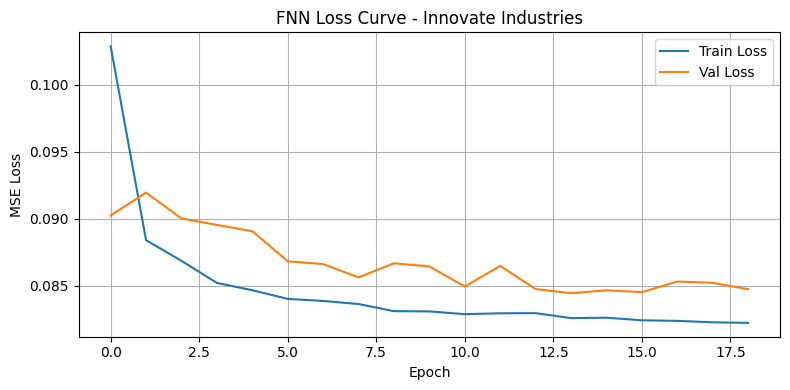

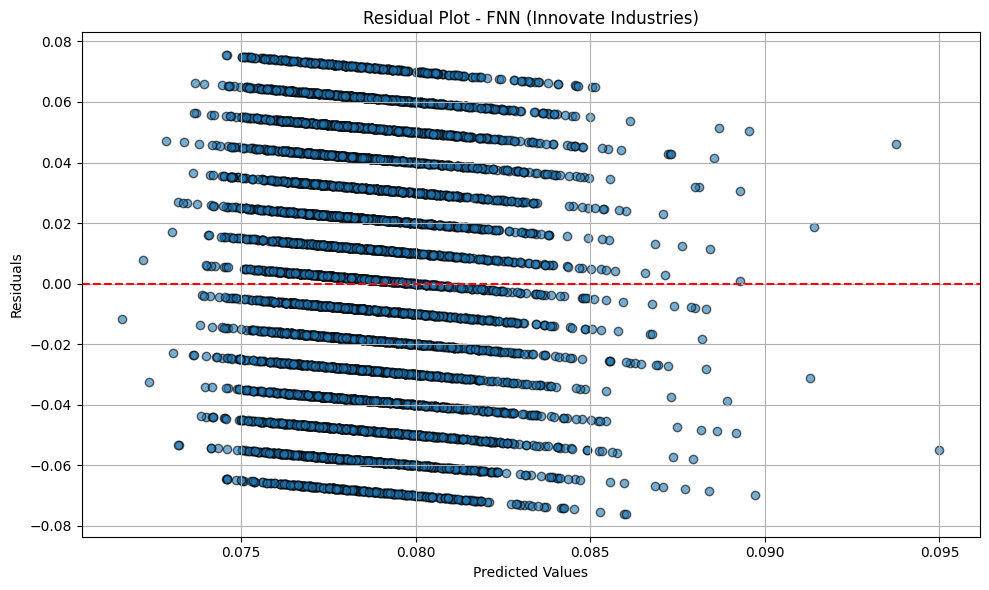

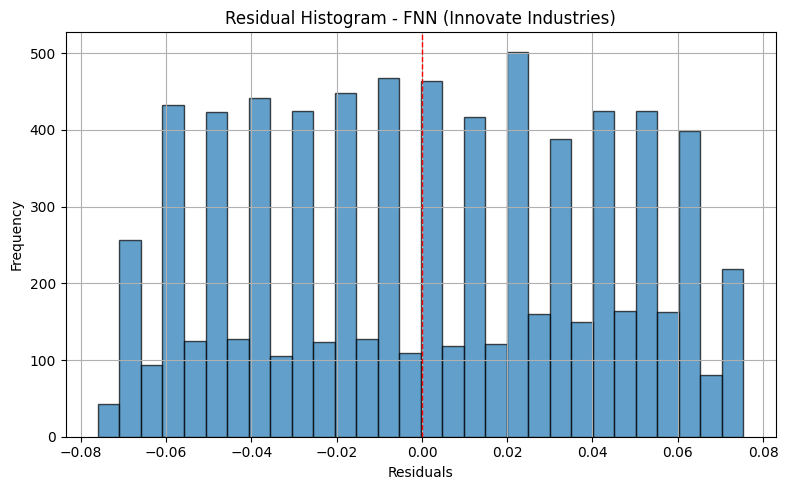


🔧 Training FNN for: NexGen Systems
Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.1150 - mae: 0.2819 - val_loss: 0.0885 - val_mae: 0.2567
Epoch 2/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0907 - mae: 0.2581 - val_loss: 0.0882 - val_mae: 0.2564
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0864 - mae: 0.2524 - val_loss: 0.0875 - val_mae: 0.2557
Epoch 4/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0851 - mae: 0.2513 - val_loss: 0.0861 - val_mae: 0.2545
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0847 - mae: 0.2511 - val_loss: 0.0865 - val_mae: 0.2549
Epoch 6/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0838 - mae: 0.2495 - val_loss: 0.0852 - val_mae: 0.2534
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0837 - mae: 0.2494 - val_loss: 0.0850 - val_mae: 0.2531
Epoch 8/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0833 - mae: 0.2493 - val_loss: 0.0851 - val_mae: 0.2534
Epoch 9/50
100/100 

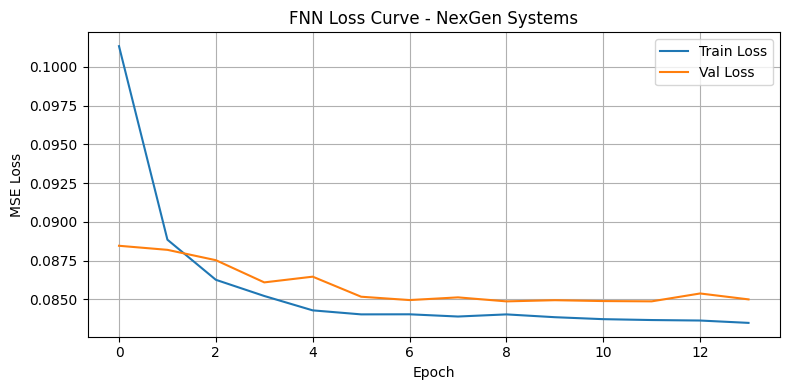

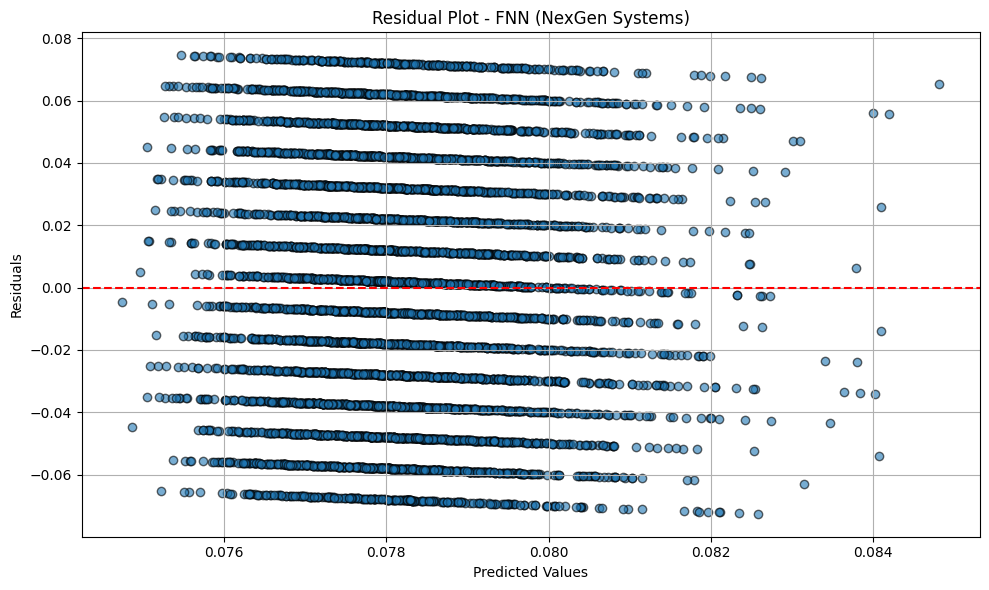

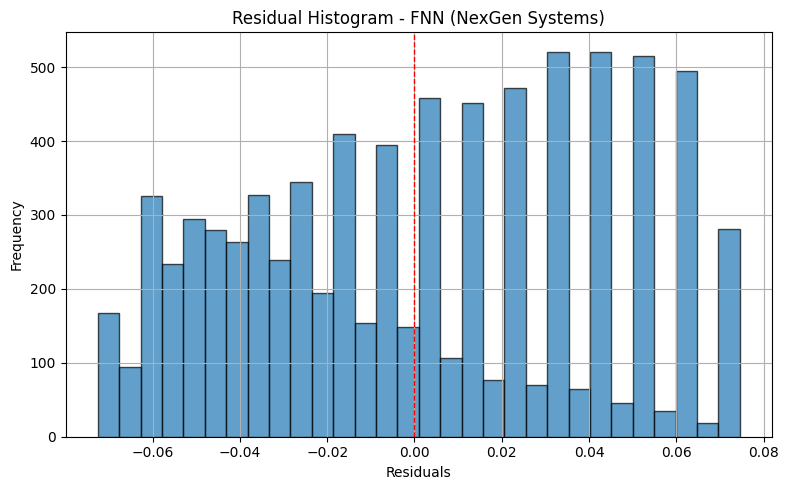


🔧 Training FNN for: Alpha Innovations
Epoch 1/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1295 - mae: 0.2951 - val_loss: 0.0927 - val_mae: 0.2607
Epoch 2/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0924 - mae: 0.2592 - val_loss: 0.0923 - val_mae: 0.2601
Epoch 3/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0885 - mae: 0.2552 - val_loss: 0.0896 - val_mae: 0.2571
Epoch 4/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0880 - mae: 0.2553 - val_loss: 0.0891 - val_mae: 0.2565
Epoch 5/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0867 - mae: 0.2534 - val_loss: 0.0883 - val_mae: 0.2556
Epoch 6/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0865 - mae: 0.2541 - val_loss: 0.0877 - val_mae: 0.2551
Epoch 7/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0856 - mae: 0.2525 - val_loss: 0.0867 - val_mae: 0.2542
Epoch 8/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0848 - mae: 0.2515 - val_loss: 0.0860 - val_mae: 0.2535
Epoch 9/50
101/10

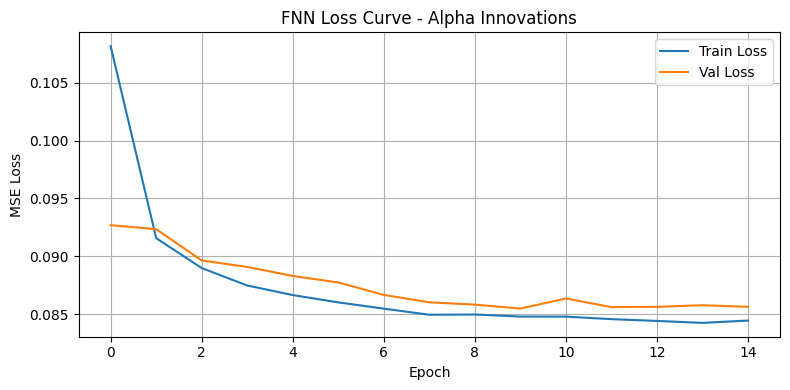

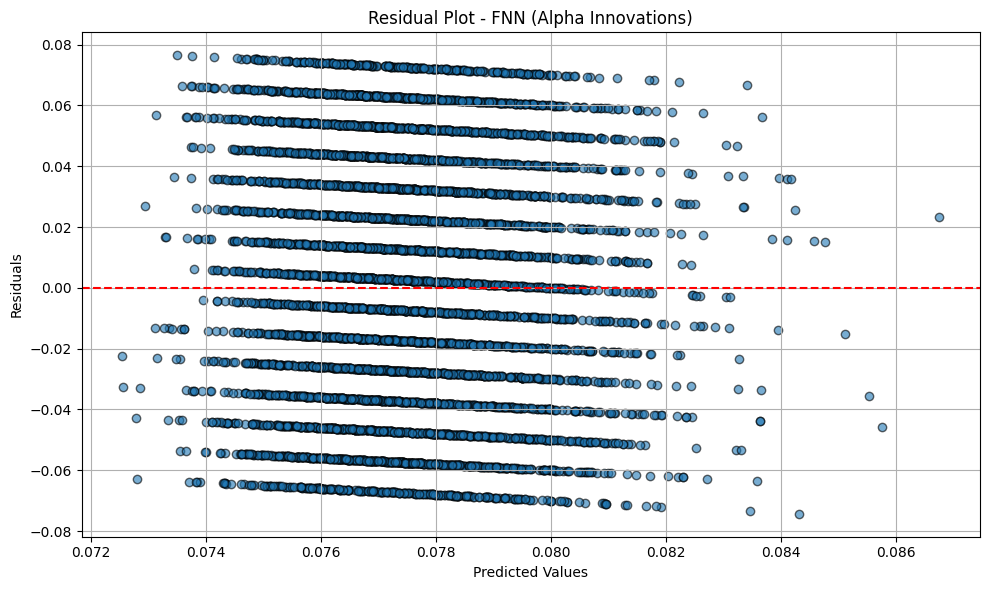

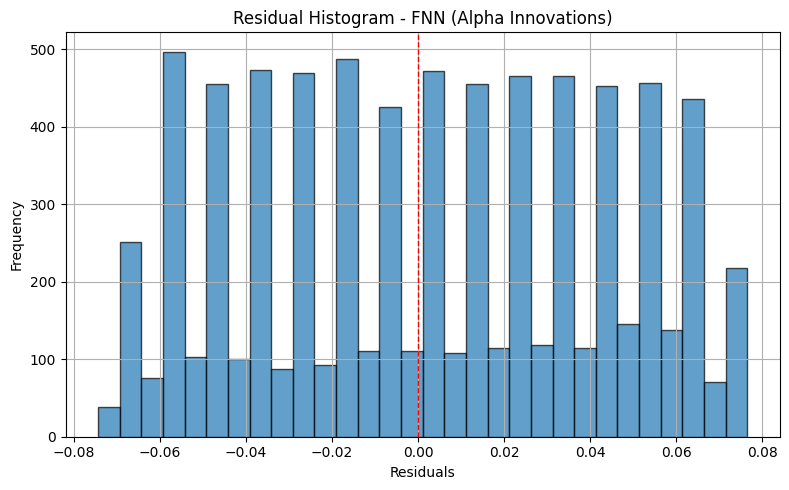


🔧 Training FNN for: DataTech Solutions
Epoch 1/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1090 - mae: 0.2764 - val_loss: 0.0933 - val_mae: 0.2609
Epoch 2/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0896 - mae: 0.2563 - val_loss: 0.0944 - val_mae: 0.2619
Epoch 3/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0868 - mae: 0.2531 - val_loss: 0.0918 - val_mae: 0.2592
Epoch 4/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0872 - mae: 0.2546 - val_loss: 0.0885 - val_mae: 0.2555
Epoch 5/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0853 - mae: 0.2518 - val_loss: 0.0853 - val_mae: 0.2523
Epoch 6/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0855 - mae: 0.2525 - val_loss: 0.0851 - val_mae: 0.2521
Epoch 7/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0847 - mae: 0.2512 - val_loss: 0.0851 - val_mae: 0.2522
Epoch 8/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0846 - mae: 0.2509 - val_loss: 0.0862 - val_mae: 0.2536
Epoch 9/50
101

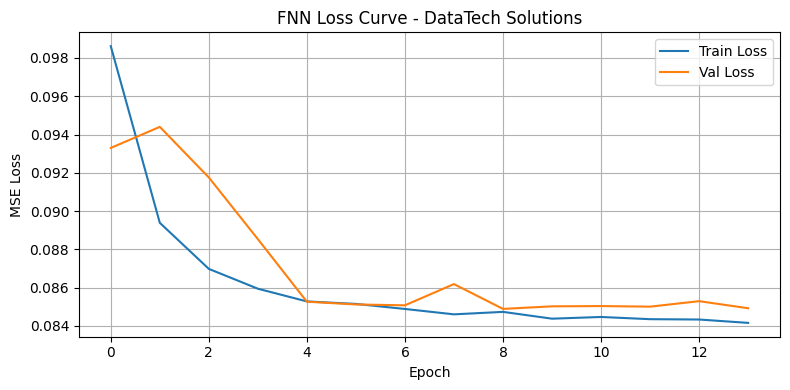

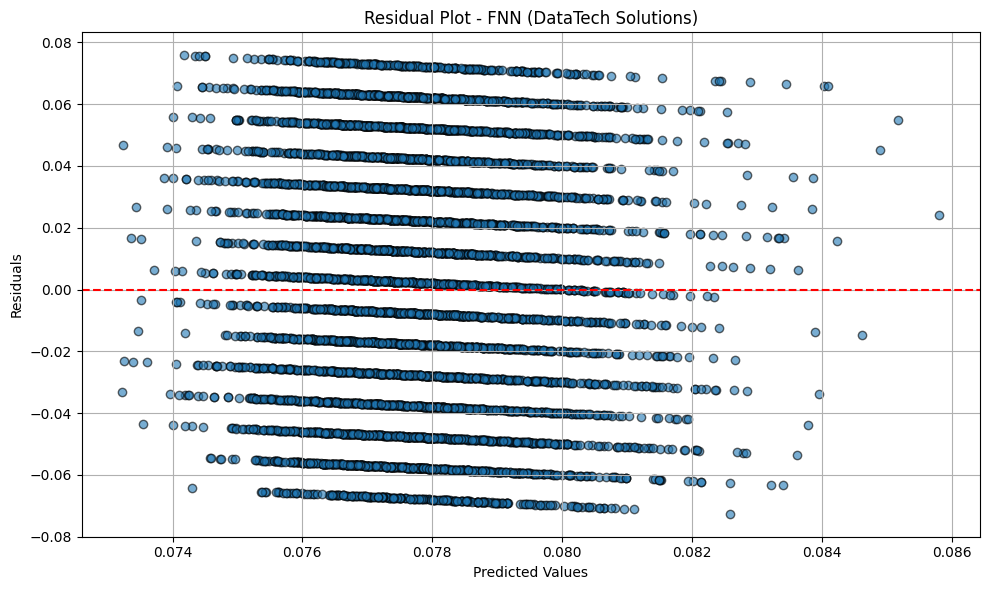

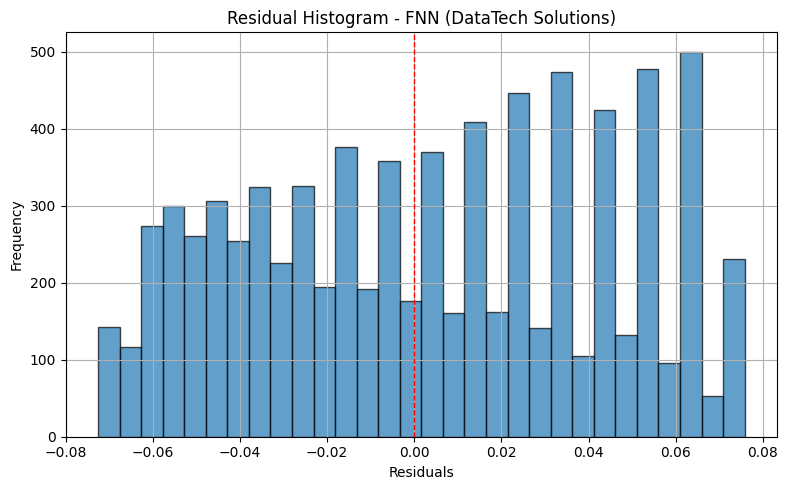


🔧 Training FNN for: TechCorp
Epoch 1/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1552 - mae: 0.3190 - val_loss: 0.0892 - val_mae: 0.2567
Epoch 2/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0912 - mae: 0.2573 - val_loss: 0.0893 - val_mae: 0.2569
Epoch 3/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0879 - mae: 0.2530 - val_loss: 0.0894 - val_mae: 0.2567
Epoch 4/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0875 - mae: 0.2543 - val_loss: 0.0908 - val_mae: 0.2579
Epoch 5/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0860 - mae: 0.2517 - val_loss: 0.0891 - val_mae: 0.2564
Epoch 6/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0850 - mae: 0.2506 - val_loss: 0.0898 - val_mae: 0.2572
Epoch 7/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0857 - mae: 0.2526 - val_loss: 0.0893 - val_mae: 0.2566
Epoch 8/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0847 - mae: 0.2504 - val_loss: 0.0867 - val_mae: 0.2543
Epoch 9/50
101/101 ━━━━━━

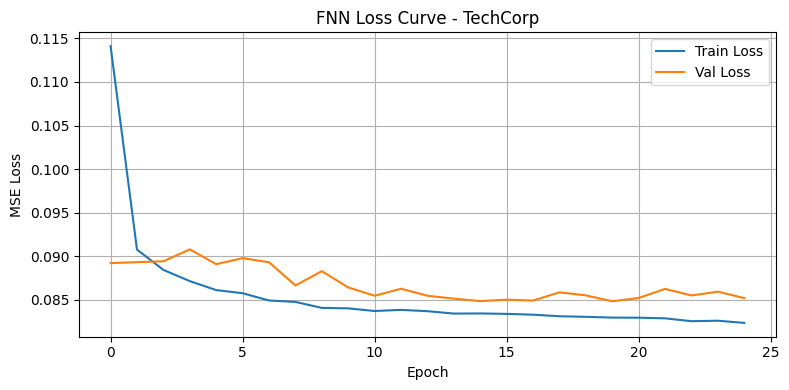

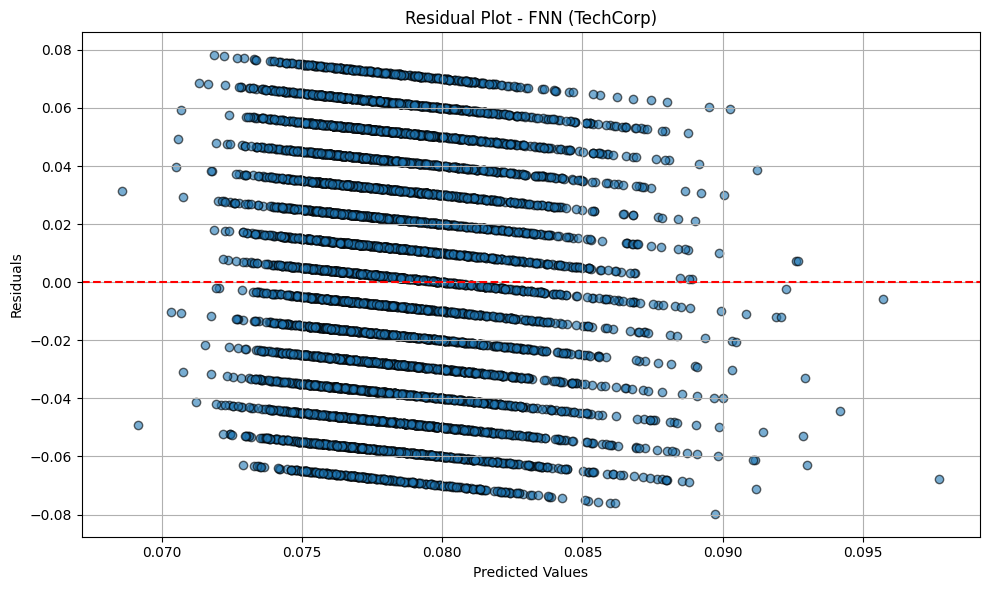

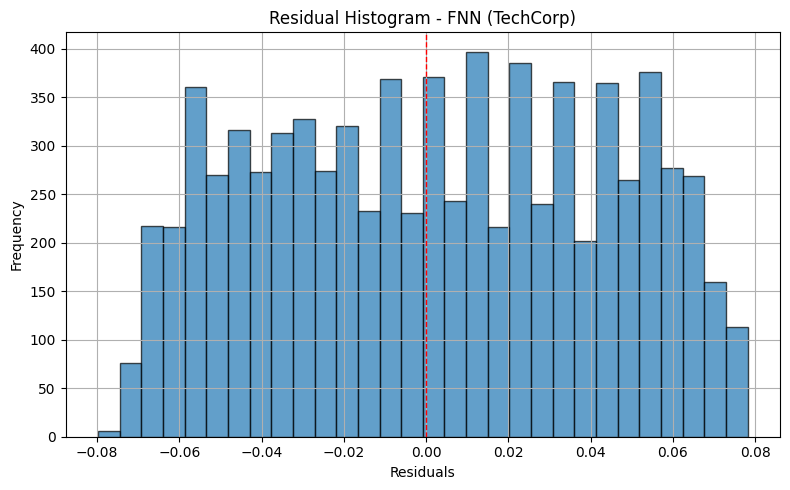

In [57]:
fnn_baseline_results = {}

for fnn_company, fnn_data in fnn_company_data.items():
    print(f"\n🔧 Training FNN for: {fnn_company}")

    fnn_x_train = fnn_data['x_train']
    fnn_x_val = fnn_data['x_val']
    fnn_x_test = fnn_data['x_test']
    fnn_y_train = fnn_data['y_train']
    fnn_y_val = fnn_data['y_val']
    fnn_y_test = fnn_data['y_test']
    fnn_target_scaler = fnn_data['scaler_target']

    # Define Model
    fnn_model = Sequential([
        Dense(128, activation='relu', input_shape=(fnn_x_train.shape[1],)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(32, activation = 'relu'),
        Dense(1, activation='linear')  # regression output
    ])


    fnn_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    # Early Stopping
    fnn_early_stop = EarlyStopping(patience=5, restore_best_weights=True)

    # Train
    fnn_history = fnn_model.fit(
        fnn_x_train, fnn_y_train,
        validation_data=(fnn_x_val, fnn_y_val),
        epochs=50,
        batch_size=256,
        callbacks=[fnn_early_stop],
        verbose=1
    )

    # Predict and inverse scale
    fnn_y_pred_scaled = fnn_model.predict(fnn_x_test).flatten()
    fnn_y_pred = fnn_target_scaler.inverse_transform(fnn_y_pred_scaled.reshape(-1, 1)).flatten()
    fnn_y_test_orig = fnn_target_scaler.inverse_transform(fnn_y_test).flatten()

    # Metrics
    fnn_mae = mean_absolute_error(fnn_y_test_orig, fnn_y_pred)
    fnn_mse = mean_squared_error(fnn_y_test_orig, fnn_y_pred)
    fnn_rmse = np.sqrt(fnn_mse)
    fnn_r2 = r2_score(fnn_y_test_orig, fnn_y_pred)
    fnn_residuals = fnn_y_test_orig - fnn_y_pred

    # Store results
    fnn_baseline_results[fnn_company] = {
        "MAE": fnn_mae, "MSE": fnn_mse, "RMSE": fnn_rmse, "R2": fnn_r2,
        "actuals": fnn_y_test_orig, "predictions": fnn_y_pred,
        "residuals": fnn_residuals,
        "history": fnn_history
    }

    print(f"{fnn_company} — MAE: {fnn_mae:.4f}, MSE: {fnn_mse:.4f}, RMSE: {fnn_rmse:.4f}, R2: {fnn_r2:.4f}")

    # Plot Loss Curve
    plt.figure(figsize=(8, 4))
    plt.plot(fnn_history.history['loss'], label='Train Loss')
    plt.plot(fnn_history.history['val_loss'], label='Val Loss')
    plt.title(f"FNN Loss Curve - {fnn_company}")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Residual Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(fnn_y_pred, fnn_residuals, alpha=0.6, edgecolor='k')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f"Residual Plot - FNN ({fnn_company})")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Residual Histogram
    plt.figure(figsize=(8, 5))
    plt.hist(fnn_residuals, bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
    plt.title(f"Residual Histogram - FNN ({fnn_company})")
    plt.xlabel("Residuals")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [58]:
pd.DataFrame(fnn_baseline_results).T

,MAE,MSE,RMSE,R2,actuals,predictions,residuals,history
Innovate Industries,0.035203,0.001665,0.040809,-0.005775,"[0.13, 0.06, 0.11, 0.08, 0.08, 0.14, 0.08, 0.1...","[0.07661936, 0.081222184, 0.08256816, 0.079584...","[0.05338064312934876, -0.021222184002399447, 0...",<keras.src.callbacks.history.History object at...
NexGen Systems,0.034822,0.001629,0.040355,-0.001794,"[0.03, 0.09, 0.13, 0.06, 0.04, 0.15, 0.11, 0.0...","[0.07700312, 0.07580259, 0.080279514, 0.079241...","[-0.0470031213760376, 0.014197413027286526, 0....",<keras.src.callbacks.history.History object at...
Alpha Innovations,0.035389,0.001672,0.040893,-0.005856,"[0.03, 0.06, 0.08, 0.08, 0.1, 0.08, 0.07, 0.08...","[0.0753659, 0.08016788, 0.07603952, 0.07524677...","[-0.04536590099334717, -0.020167882144451144, ...",<keras.src.callbacks.history.History object at...
DataTech Solutions,0.035326,0.001663,0.040775,-0.007343,"[0.03, 0.14, 0.02, 0.04, 0.04, 0.13, 0.1, 0.1,...","[0.07757242, 0.08021109, 0.077132404, 0.077776...","[-0.04757242023944855, 0.05978891193866731, -0...",<keras.src.callbacks.history.History object at...
TechCorp,0.035253,0.001665,0.040806,-0.008663,"[0.03, 0.11, 0.04, 0.1, 0.04, 0.11, 0.04, 0.15...","[0.07947565, 0.07762431, 0.080685176, 0.077913...","[-0.04947564870119095, 0.03237568646669388, -0...",<keras.src.callbacks.history.History object at...


FNN: Hyperparameter Tuning 2nd Version (Chosen)

In [59]:
# Imports and Setup
import optuna
from optuna.integration import TFKerasPruningCallback
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import numpy as np

# SECTION 2: Define Model Objective for Optuna
def fnn_objective(trial, fnn_company, fnn_company_data):
    x_train = fnn_company_data[fnn_company]['x_train']
    y_train = fnn_company_data[fnn_company]['y_train']
    x_val = fnn_company_data[fnn_company]['x_val']
    y_val = fnn_company_data[fnn_company]['y_val']

    # 🔧 Hyperparameter search space
    architecture_options = [
        [64, 32],
        [128, 64],
        [256, 128],
        [64, 32, 16],
        [128, 64, 32],
        [256, 128, 64]
        
    ]
    selected_architecture = trial.suggest_categorical("n_units", architecture_options)
    dropout_1 = trial.suggest_float("dropout_layer1", 0.1, 0.5)
    dropout_2 = trial.suggest_float("dropout_layer2", 0.1, 0.4)
    dropout_3 = trial.suggest_float("dropout_layer3", 0.1, 0.4) if len(selected_architecture) > 2 else None
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True)

    # Independent activation functions per layer
    activation_1 = trial.suggest_categorical("activation_1", ["relu", "tanh"])
    activation_2 = trial.suggest_categorical("activation_2", ["relu", "tanh"])
    activation_3 = trial.suggest_categorical("activation_3", ["relu", "tanh"]) if len(selected_architecture) > 2 else None


    # Build FNN model dynamically
    model = Sequential()
    model.add(Dense(selected_architecture[0], activation=activation_1, input_shape=(x_train.shape[1],)))
    model.add(Dropout(dropout_1))
    model.add(Dense(selected_architecture[1], activation=activation_2))
    model.add(Dropout(dropout_2))
    if len(selected_architecture) > 2:
        model.add(Dense(selected_architecture[2], activation=activation_3))
        model.add(Dropout(dropout_3))
    model.add(Dense(1, activation='linear'))

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='mse',
        metrics=['mae']
    )

    early_stop = EarlyStopping(patience=5, restore_best_weights=True)
    model.fit(
        x_train, y_train,
        validation_data=(x_val, y_val),
        epochs=100,
        batch_size=256,
        callbacks=[early_stop, TFKerasPruningCallback(trial, "val_loss")],
        verbose=0
    )

    val_loss = model.evaluate(x_val, y_val, verbose=0)[0]
    return val_loss


In [60]:
# Run Optuna Optimization for Each Company
fnn_best_params = {}
fnn_studies = {}

for fnn_company in fnn_company_data.keys():
    print(f"\nTuning FNN for company: {fnn_company}")
    
    fnn_study = optuna.create_study(direction='minimize')
    fnn_study.optimize(
        lambda trial: fnn_objective(trial, fnn_company, fnn_company_data),
        n_trials=30
    )

    fnn_studies[fnn_company] = fnn_study
    best_params = fnn_study.best_params

    # Save decomposed best units
    best_units = best_params.pop("n_units")
    fnn_best_params[fnn_company] = {
        'units_layer1': best_units[0],
        'units_layer2': best_units[1],
        'units_layer3': best_units[2] if len(best_units) > 2 else None,
        **best_params
    }

    print(f"Best Params for {fnn_company}:\n", fnn_best_params[fnn_company])



Tuning FNN for company: Innovate Industries
Best Params for Innovate Industries:
 {'units_layer1': 128, 'units_layer2': 64, 'units_layer3': 32, 'dropout_layer1': 0.35811879523663925, 'dropout_layer2': 0.3924894415427817, 'dropout_layer3': 0.3364448247955176, 'learning_rate': 0.009396006074852688, 'activation_1': 'relu', 'activation_2': 'relu', 'activation_3': 'relu'}

Tuning FNN for company: NexGen Systems
Best Params for NexGen Systems:
 {'units_layer1': 128, 'units_layer2': 64, 'units_layer3': 32, 'dropout_layer1': 0.24453648410162054, 'dropout_layer2': 0.3066935959684197, 'dropout_layer3': 0.10584211715236569, 'learning_rate': 0.0066349540872981914, 'activation_1': 'tanh', 'activation_2': 'relu', 'activation_3': 'relu'}

Tuning FNN for company: Alpha Innovations
Best Params for Alpha Innovations:
 {'units_layer1': 64, 'units_layer2': 32, 'units_layer3': 16, 'dropout_layer1': 0.366278998210725, 'dropout_layer2': 0.23132118868064877, 'dropout_layer3': 0.16261151550372538, 'learning_r


Final Training using best params for: Innovate Industries
Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1348 - mae: 0.2986 - val_loss: 0.0853 - val_mae: 0.2519
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0857 - mae: 0.2514 - val_loss: 0.0843 - val_mae: 0.2501
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0841 - mae: 0.2495 - val_loss: 0.0842 - val_mae: 0.2495
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0833 - mae: 0.2486 - val_loss: 0.0842 - val_mae: 0.2496
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0839 - mae: 0.2499 - val_loss: 0.0842 - val_mae: 0.2494
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0837 - mae: 0.2491 - val_loss: 0.0844 - val_mae: 0.2504
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0833 - mae: 0.2484 - val_loss: 0.0842 - val_mae: 0.2494
Epoch 8/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0828 - mae: 0.2481 - val_loss: 0.0842 - val_m

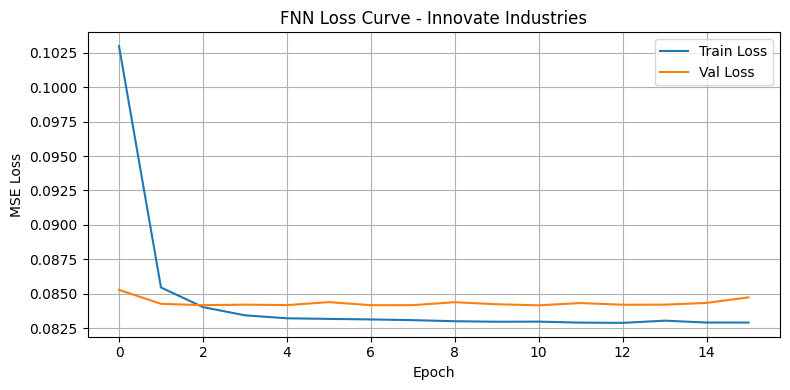

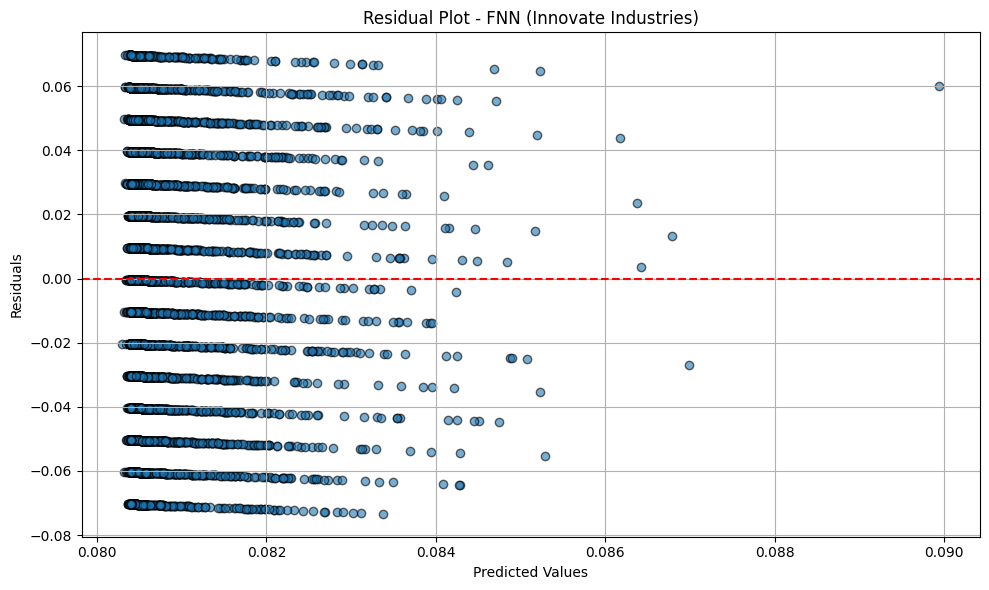

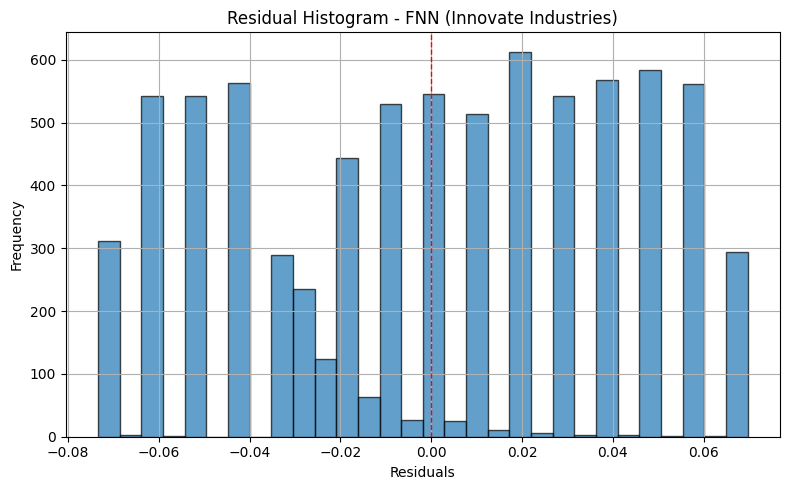


Final Training using best params for: NexGen Systems
Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1466 - mae: 0.3051 - val_loss: 0.0897 - val_mae: 0.2576
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0879 - mae: 0.2545 - val_loss: 0.0865 - val_mae: 0.2550
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0849 - mae: 0.2509 - val_loss: 0.0856 - val_mae: 0.2542
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0851 - mae: 0.2520 - val_loss: 0.0860 - val_mae: 0.2546
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0851 - mae: 0.2517 - val_loss: 0.0858 - val_mae: 0.2544
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0846 - mae: 0.2517 - val_loss: 0.0845 - val_mae: 0.2520
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0843 - mae: 0.2509 - val_loss: 0.0848 - val_mae: 0.2530
Epoch 8/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0851 - mae: 0.2521 - val_loss: 0.0850 - val_mae: 

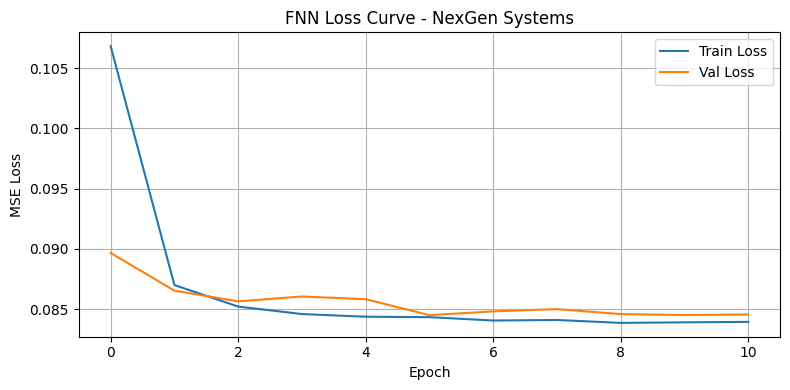

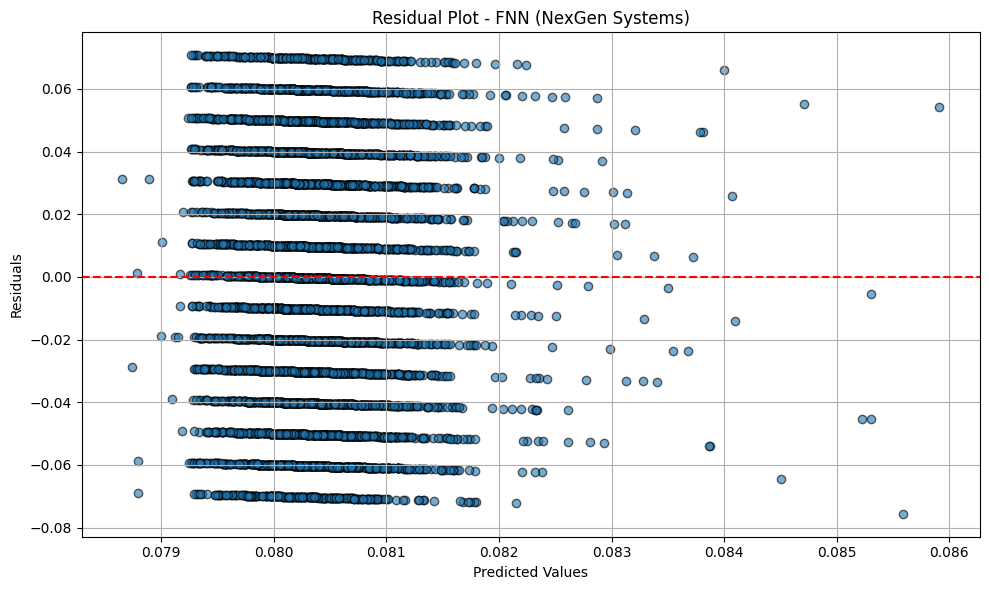

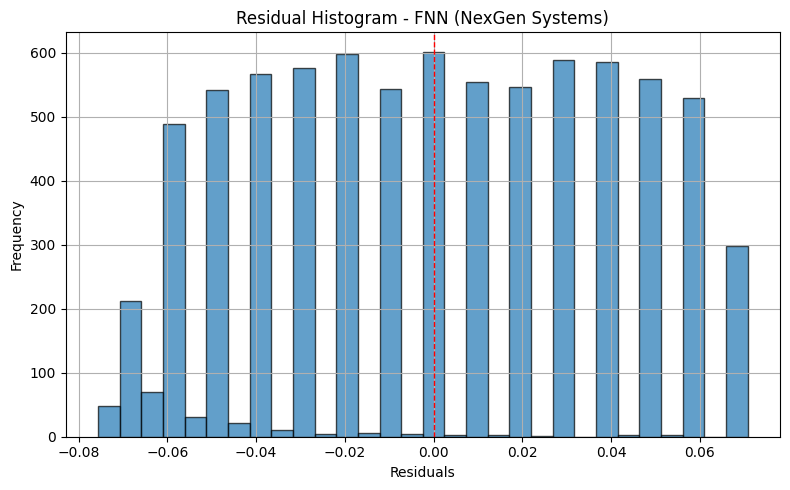


Final Training using best params for: Alpha Innovations
Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.2514 - mae: 0.3959 - val_loss: 0.0869 - val_mae: 0.2540
Epoch 2/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1085 - mae: 0.2754 - val_loss: 0.0854 - val_mae: 0.2523
Epoch 3/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0936 - mae: 0.2601 - val_loss: 0.0852 - val_mae: 0.2520
Epoch 4/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0907 - mae: 0.2579 - val_loss: 0.0852 - val_mae: 0.2519
Epoch 5/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0891 - mae: 0.2564 - val_loss: 0.0852 - val_mae: 0.2518
Epoch 6/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0878 - mae: 0.2546 - val_loss: 0.0852 - val_mae: 0.2520
Epoch 7/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0874 - mae: 0.2550 - val_loss: 0.0851 - val_mae: 0.2516
Epoch 8/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0875 - mae: 0.2553 - val_loss: 0.0852 - val_mae

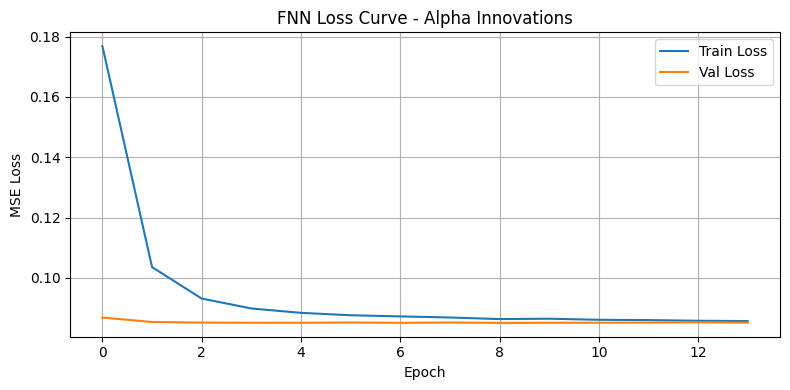

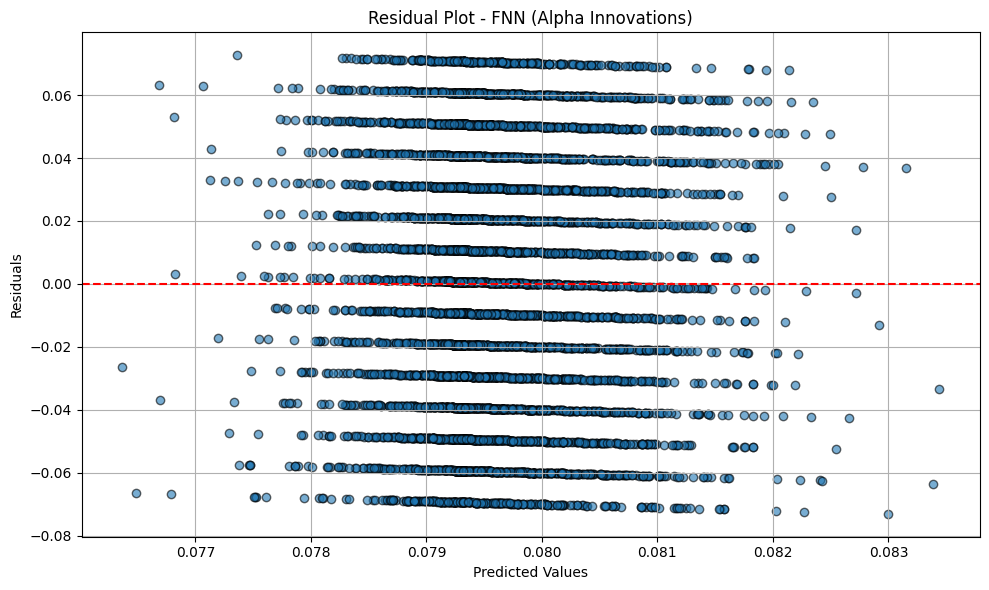

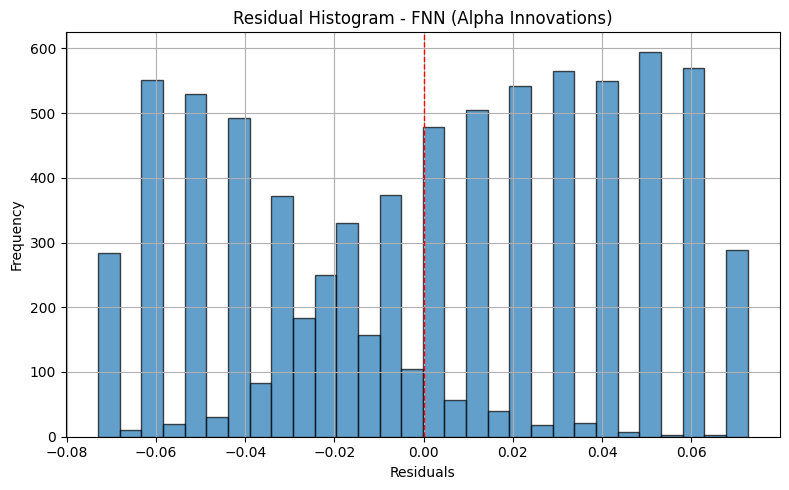


Final Training using best params for: DataTech Solutions
Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1854 - mae: 0.3296 - val_loss: 0.0909 - val_mae: 0.2582
Epoch 2/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0893 - mae: 0.2567 - val_loss: 0.0848 - val_mae: 0.2515
Epoch 3/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0853 - mae: 0.2524 - val_loss: 0.0849 - val_mae: 0.2520
Epoch 4/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0852 - mae: 0.2524 - val_loss: 0.0850 - val_mae: 0.2518
Epoch 5/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0835 - mae: 0.2494 - val_loss: 0.0849 - val_mae: 0.2518
Epoch 6/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0848 - mae: 0.2520 - val_loss: 0.0848 - val_mae: 0.2516
Epoch 7/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0844 - mae: 0.2514 - val_loss: 0.0850 - val_mae: 0.2518
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Final Evaluation — DataTech Solutions | MAE: 0.0352, RMSE: 0.0407, R

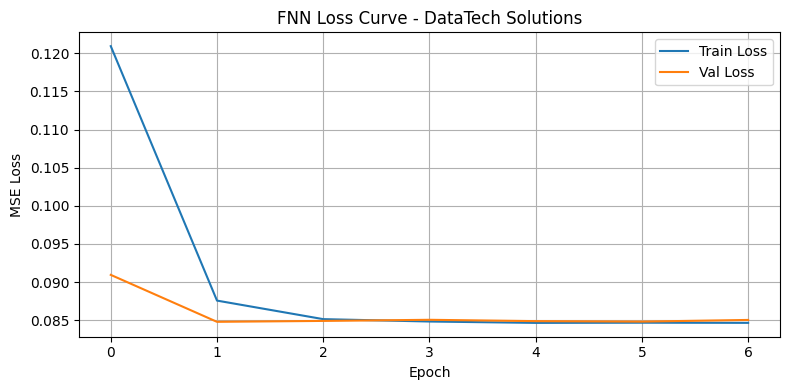

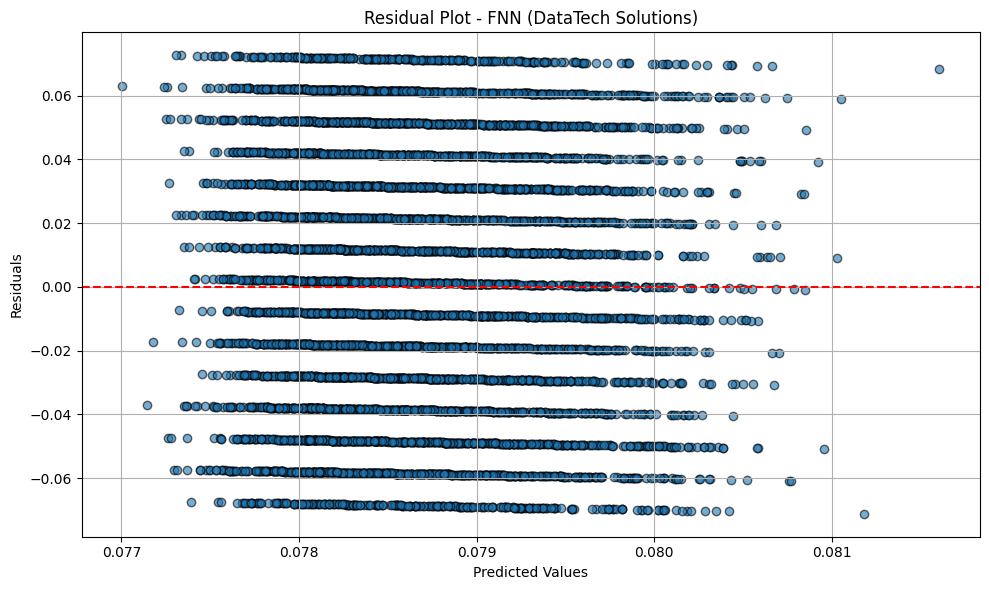

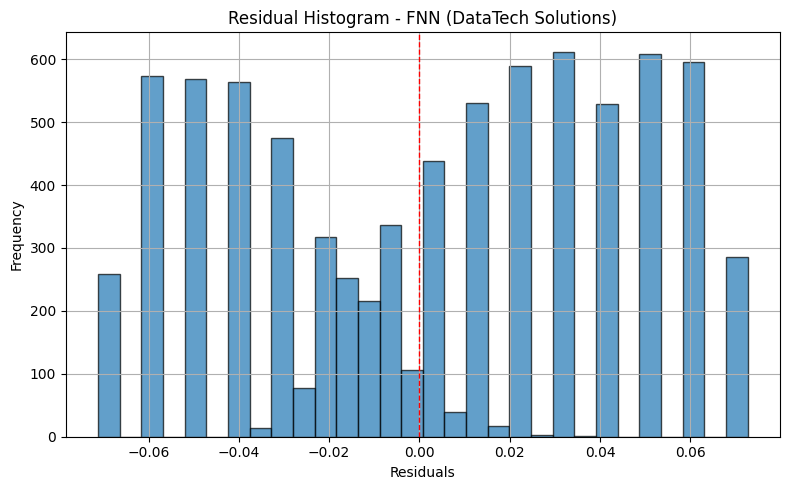


Final Training using best params for: TechCorp
Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.5239 - mae: 0.5711 - val_loss: 0.0877 - val_mae: 0.2555
Epoch 2/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2173 - mae: 0.3747 - val_loss: 0.0863 - val_mae: 0.2535
Epoch 3/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1601 - mae: 0.3244 - val_loss: 0.0852 - val_mae: 0.2527
Epoch 4/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1365 - mae: 0.3038 - val_loss: 0.0848 - val_mae: 0.2523
Epoch 5/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1201 - mae: 0.2865 - val_loss: 0.0848 - val_mae: 0.2524
Epoch 6/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1129 - mae: 0.2791 - val_loss: 0.0844 - val_mae: 0.2518
Epoch 7/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1073 - mae: 0.2738 - val_loss: 0.0844 - val_mae: 0.2518
Epoch 8/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1021 - mae: 0.2683 - val_loss: 0.0848 - val_mae: 0.2526


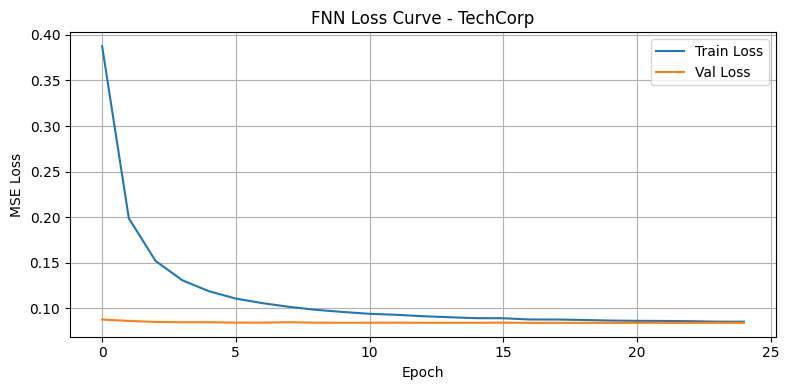

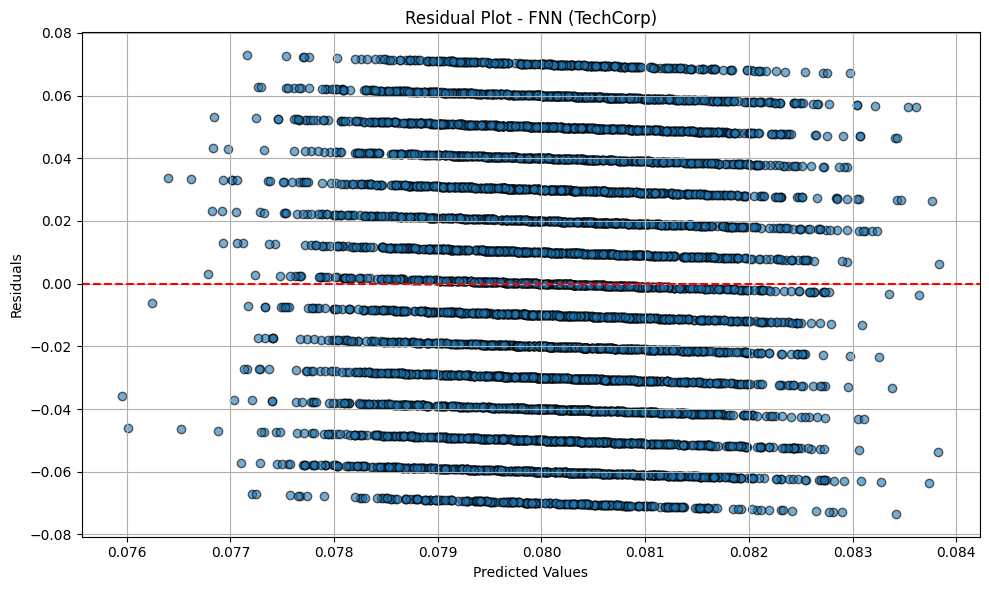

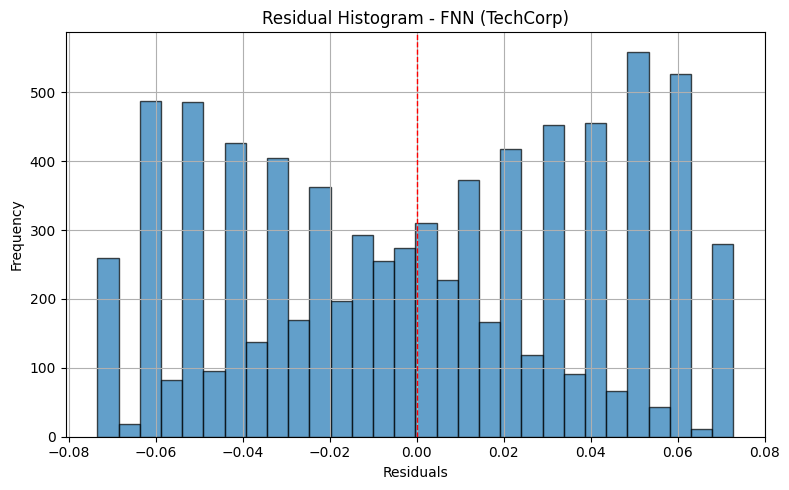

In [61]:
# Final Model Training & Evaluation Using Best Params

fnn_test_results = {}

for fnn_company, params in fnn_best_params.items():
    print(f"\nFinal Training using best params for: {fnn_company}")

    x_train = fnn_company_data[fnn_company]['x_train']
    x_val = fnn_company_data[fnn_company]['x_val']
    x_test = fnn_company_data[fnn_company]['x_test']
    y_train = fnn_company_data[fnn_company]['y_train']
    y_val = fnn_company_data[fnn_company]['y_val']
    y_test = fnn_company_data[fnn_company]['y_test']
    target_scaler = fnn_company_data[fnn_company]['scaler_target']

    # Build final model using best params
    model = Sequential()
    model.add(Dense(params['units_layer1'], activation=params['activation_1'], input_shape=(x_train.shape[1],)))
    model.add(Dropout(params['dropout_layer1']))
    model.add(Dense(params['units_layer2'], activation=params['activation_2']))
    model.add(Dropout(params['dropout_layer2']))
    if params['units_layer3'] is not None:
        model.add(Dense(params['units_layer3'], activation=params['activation_3']))
        model.add(Dropout(params['dropout_layer3']))  # include third dropout layer
    model.add(Dense(1, activation='linear'))

    model.compile(optimizer=Adam(learning_rate=params['learning_rate']), loss='mse', metrics=['mae'])

    early_stop = EarlyStopping(patience=5, restore_best_weights=True)
    history = model.fit(
        x_train, y_train,
        validation_data=(x_val, y_val),
        epochs=100,
        batch_size=256,
        callbacks=[early_stop],
        verbose=1
    )

    # Predict and inverse transform
    y_pred_scaled = model.predict(x_test).flatten()
    y_pred = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    y_test_orig = target_scaler.inverse_transform(y_test).flatten()
    residuals = y_test_orig - y_pred

    # Metrics
    mae = mean_absolute_error(y_test_orig, y_pred)
    mse = mean_squared_error(y_test_orig, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_orig, y_pred)

    fnn_test_results[fnn_company] = {
        'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'R2': r2,
        'predictions': y_pred, 'actuals': y_test_orig,
        'residuals': residuals,
        'history': history,
        'best_params': params
    }

    print(f"Final Evaluation — {fnn_company} | MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2: {r2:.4f}")

    # 📈 Plot Loss Curve
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f"FNN Loss Curve - {fnn_company}")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Residual Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, alpha=0.6, edgecolor='k')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f"Residual Plot - FNN ({fnn_company})")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Residual Histogram
    plt.figure(figsize=(8, 5))
    plt.hist(residuals, bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
    plt.title(f"Residual Histogram - FNN ({fnn_company})")
    plt.xlabel("Residuals")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [62]:
pd.DataFrame(fnn_test_results).T

,MAE,MSE,RMSE,R2,predictions,actuals,residuals,history,best_params
Innovate Industries,0.035053,0.001656,0.040699,-0.000332,"[0.08039611, 0.080501944, 0.080415465, 0.08047...","[0.13, 0.06, 0.11, 0.08, 0.08, 0.14, 0.08, 0.1...","[0.04960389167070389, -0.020501943826675417, 0...",<keras.src.callbacks.history.History object at...,"{'units_layer1': 128, 'units_layer2': 64, 'uni..."
NexGen Systems,0.034743,0.001626,0.040324,-0.000232,"[0.079619385, 0.0800058, 0.080487505, 0.080382...","[0.03, 0.09, 0.13, 0.06, 0.04, 0.15, 0.11, 0.0...","[-0.049619385302066804, 0.009994197785854336, ...",<keras.src.callbacks.history.History object at...,"{'units_layer1': 128, 'units_layer2': 64, 'uni..."
Alpha Innovations,0.035222,0.001663,0.040776,-0.000087,"[0.07849744, 0.07754737, 0.07907577, 0.0800915...","[0.03, 0.06, 0.08, 0.08, 0.1, 0.08, 0.07, 0.08...","[-0.04849743962287903, -0.01754737138748169, 0...",<keras.src.callbacks.history.History object at...,"{'units_layer1': 64, 'units_layer2': 32, 'unit..."
DataTech Solutions,0.035226,0.001655,0.040686,-0.00297,"[0.07830379, 0.080159314, 0.07812332, 0.079458...","[0.03, 0.14, 0.02, 0.04, 0.04, 0.13, 0.1, 0.1,...","[-0.04830379158258438, 0.059840686023235334, -...",<keras.src.callbacks.history.History object at...,"{'units_layer1': 128, 'units_layer2': 64, 'uni..."
TechCorp,0.035049,0.001651,0.040629,0.000042,"[0.08054291, 0.08144303, 0.08117972, 0.0780682...","[0.03, 0.11, 0.04, 0.1, 0.04, 0.11, 0.04, 0.15...","[-0.0505429071187973, 0.028556973338127137, -0...",<keras.src.callbacks.history.History object at...,"{'units_layer1': 64, 'units_layer2': 32, 'unit..."


FNN: Cross Validation

In [63]:
# # SELECTED VERSION

# from sklearn.model_selection import KFold
# from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# import matplotlib.pyplot as plt
# import tensorflow as tf

# fnn_kfold_results = {}

# for fnn_company in fnn_company_data.keys():
#     print(f"\nStarting K-Fold CV for: {fnn_company}")

#     # Retrieve data
#     x_trainval = np.vstack([fnn_company_data[fnn_company]['x_train'],
#                             fnn_company_data[fnn_company]['x_val']])
#     y_trainval = np.vstack([fnn_company_data[fnn_company]['y_train'],
#                             fnn_company_data[fnn_company]['y_val']])
#     y_scaler = fnn_company_data[fnn_company]['scaler_target']

#     best_params = fnn_best_params[fnn_company]

#     kfold = KFold(n_splits=5, shuffle=True, random_state=42)
#     fold_metrics = []

#     for fold, (train_idx, val_idx) in enumerate(kfold.split(x_trainval), 1):
#         print(f"\nFold {fold}")

#         x_tr, x_val = x_trainval[train_idx], x_trainval[val_idx]
#         y_tr, y_val = y_trainval[train_idx], y_trainval[val_idx]

#         # Build model
#         model = tf.keras.Sequential()
#         model.add(tf.keras.layers.Dense(best_params['units_layer1'], activation=best_params['activation_1'], input_shape=(x_tr.shape[1],)))
#         model.add(tf.keras.layers.Dropout(best_params['dropout_layer1']))
#         model.add(tf.keras.layers.Dense(best_params['units_layer2'], activation=best_params['activation_2']))
#         model.add(tf.keras.layers.Dropout(best_params['dropout_layer2']))
#         if best_params['units_layer3']:
#             model.add(tf.keras.layers.Dense(best_params['units_layer3'], activation=best_params['activation_3']))
#         model.add(tf.keras.layers.Dense(1, activation='linear'))

#         model.compile(
#             optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
#             loss='mse',
#             metrics=['mae']
#         )

#         early_stop = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

#         history = model.fit(
#             x_tr, y_tr,
#             validation_data=(x_val, y_val),
#             epochs=100,
#             batch_size=256,
#             callbacks=[early_stop],
#             verbose=0
#         )

#         # Predict on validation fold
#         y_val_pred_scaled = model.predict(x_val)
#         y_val_true = y_scaler.inverse_transform(y_val)
#         y_val_pred = y_scaler.inverse_transform(y_val_pred_scaled)

#         # Metrics
#         mae = mean_absolute_error(y_val_true, y_val_pred)
#         mse = mean_squared_error(y_val_true, y_val_pred)
#         rmse = np.sqrt(mse)
#         r2 = r2_score(y_val_true, y_val_pred)

#         print(f"Fold {fold} - MAE: {mae:.4f}, MSE: {mse:.6f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

#         fold_metrics.append({'fold': fold, 'mae': mae, 'mse': mse, 'rmse': rmse, 'r2': r2})

#         # Plot loss
#         plt.figure(figsize=(8, 4))
#         plt.plot(history.history['loss'], label='Train Loss')
#         plt.plot(history.history['val_loss'], label='Val Loss')
#         plt.title(f'{fnn_company} - Fold {fold} Loss Curve')
#         plt.xlabel('Epochs')
#         plt.ylabel('Loss (MSE)')
#         plt.legend()
#         plt.grid(True)
#         plt.show()

#         # Plot residuals
#         residuals = y_val_true.flatten() - y_val_pred.flatten()
#         plt.figure(figsize=(8, 4))
#         plt.scatter(y_val_pred, residuals, alpha=0.5)
#         plt.axhline(0, color='red', linestyle='--')
#         plt.title(f'{fnn_company} - Fold {fold} Residual Plot')
#         plt.xlabel('Predicted Conversion Rate')
#         plt.ylabel('Residuals')
#         plt.grid(True)
#         plt.show()

#     # Save results
#     fnn_kfold_results[fnn_company] = fold_metrics

#     # Summary
#     avg_mae = np.mean([m['mae'] for m in fold_metrics])
#     avg_mse = np.mean([m['mse'] for m in fold_metrics])
#     avg_rmse = np.mean([m['rmse'] for m in fold_metrics])
#     avg_r2 = np.mean([m['r2'] for m in fold_metrics])
#     print(f"\n{fnn_company} K-Fold Summary:")
#     print(f"Average MAE: {avg_mae:.4f}, Average MSE: {avg_mse:.6f}, Average RMSE: {avg_rmse:.4f}, Average R²: {avg_r2:.4f}")


In [64]:
# pd.DataFrame(fnn_kfold_results).T

FNN: Feature Importance Analysis

Permutation Feature Importance (PFI)

RMSE


Computing FNN Permutation Feature Importance for: Innovate Industries
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/2

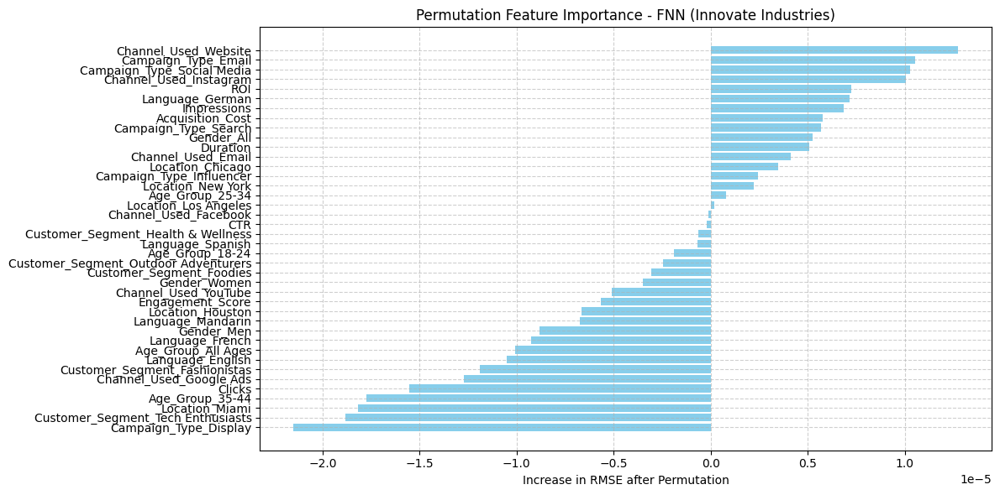


Computing FNN Permutation Feature Importance for: NexGen Systems
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
250/250 ━━━━━━━━━━━━━━━━

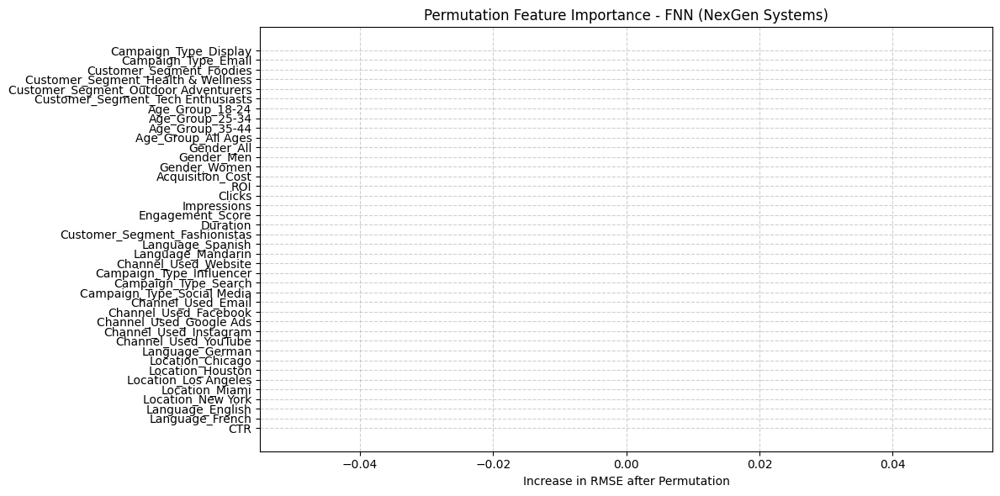


Computing FNN Permutation Feature Importance for: Alpha Innovations
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━

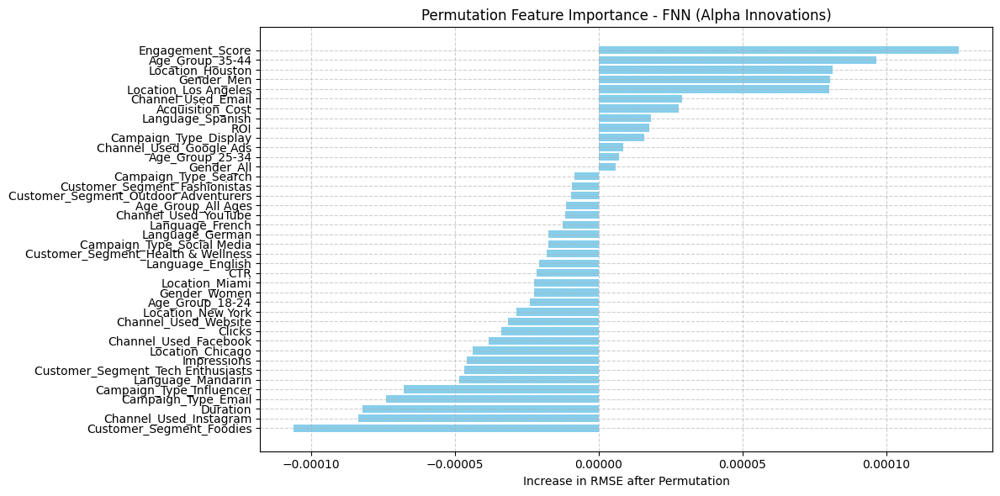


Computing FNN Permutation Feature Importance for: DataTech Solutions
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━

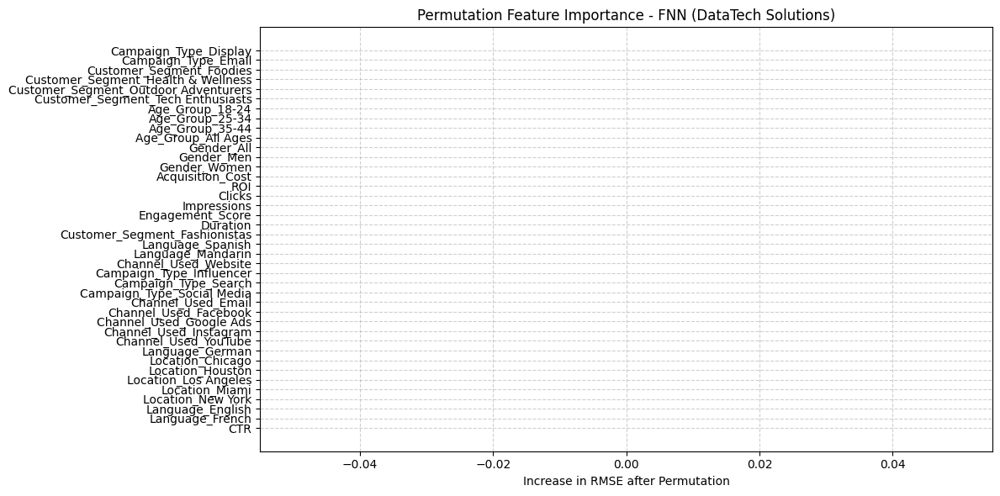


Computing FNN Permutation Feature Importance for: TechCorp
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
252/252 ━━━━━━━━━━━━━━

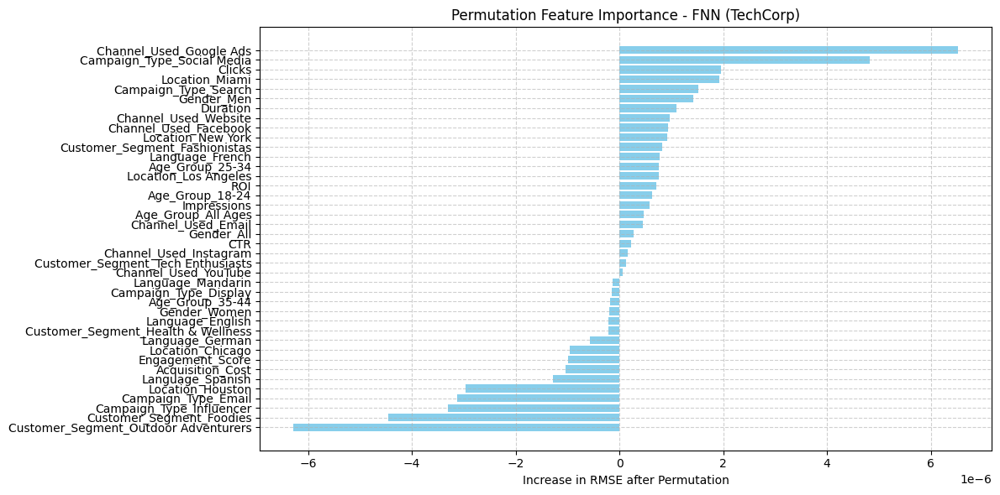

In [65]:
# SECTION 7: Permutation Feature Importance (PFI) for FNN

from copy import deepcopy

fnn_pfi_results = {}

for fnn_company in fnn_company_data.keys():
    print(f"\nComputing FNN Permutation Feature Importance for: {fnn_company}")
    
    x_test = fnn_company_data[fnn_company]['x_test']
    y_test = fnn_company_data[fnn_company]['y_test']
    target_scaler = fnn_company_data[fnn_company]['scaler_target']

    # Reload final model using best params
    params = fnn_test_results[fnn_company]['best_params']
    model = Sequential()
    model.add(Dense(params['units_layer1'], activation=params['activation_1'], input_shape=(x_test.shape[1],)))
    model.add(Dropout(params['dropout_layer1']))
    model.add(Dense(params['units_layer2'], activation=params['activation_2']))
    model.add(Dropout(params['dropout_layer2']))
    if params['units_layer3'] is not None:
        model.add(Dense(params['units_layer3'], activation=params['activation_3']))
        model.add(Dropout(params['dropout_layer3']))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=params['learning_rate']), loss='mse')

    # Re-train using train + val to reuse best model
    x_trainval = np.vstack([fnn_company_data[fnn_company]['x_train'], fnn_company_data[fnn_company]['x_val']])
    y_trainval = np.vstack([fnn_company_data[fnn_company]['y_train'], fnn_company_data[fnn_company]['y_val']])
    early_stop = EarlyStopping(patience=5, restore_best_weights=True)
    model.fit(x_trainval, y_trainval, epochs=100, batch_size=256, callbacks=[early_stop], verbose=0)

    # Baseline RMSE
    baseline_preds = model.predict(x_test).flatten()
    baseline_preds = target_scaler.inverse_transform(baseline_preds.reshape(-1, 1)).flatten()
    y_test_orig = target_scaler.inverse_transform(y_test).flatten()
    baseline_rmse = np.sqrt(mean_squared_error(y_test_orig, baseline_preds))

    # Setup for permutation
    feature_names = list(fnn_ohe.get_feature_names_out(fnn_categorical_cols)) + fnn_numerical_cols
    importances = []

    for i in range(x_test.shape[1]):
        x_test_permuted = deepcopy(x_test)
        np.random.shuffle(x_test_permuted[:, i])  # Permute feature i
        permuted_preds = model.predict(x_test_permuted).flatten()
        permuted_preds = target_scaler.inverse_transform(permuted_preds.reshape(-1, 1)).flatten()
        permuted_rmse = np.sqrt(mean_squared_error(y_test_orig, permuted_preds))
        importance = permuted_rmse - baseline_rmse
        importances.append(importance)

    # Save results
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    fnn_pfi_results[fnn_company] = importance_df

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.gca().invert_yaxis()
    plt.xlabel("Increase in RMSE after Permutation")
    plt.title(f"Permutation Feature Importance - FNN ({fnn_company})")
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


RMSE

In [66]:
from copy import deepcopy

fnn_pfi_results = {}

for fnn_company in fnn_company_data.keys():
    print(f"\nComputing FNN Permutation Feature Importance for: {fnn_company}")
    
    x_test = fnn_company_data[fnn_company]['x_test']
    y_test = fnn_company_data[fnn_company]['y_test']
    target_scaler = fnn_company_data[fnn_company]['scaler_target']

    # Reload final model using best params
    params = fnn_test_results[fnn_company]['best_params']
    model = Sequential()
    model.add(Dense(params['units_layer1'], activation=params['activation_1'], input_shape=(x_test.shape[1],)))
    model.add(Dropout(params['dropout_layer1']))
    model.add(Dense(params['units_layer2'], activation=params['activation_2']))
    model.add(Dropout(params['dropout_layer2']))
    if params['units_layer3'] is not None:
        model.add(Dense(params['units_layer3'], activation=params['activation_3']))
        model.add(Dropout(params['dropout_layer3']))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=params['learning_rate']), loss='mse')

    # Re-train using train + val to reuse best model
    x_trainval = np.vstack([fnn_company_data[fnn_company]['x_train'], fnn_company_data[fnn_company]['x_val']])
    y_trainval = np.vstack([fnn_company_data[fnn_company]['y_train'], fnn_company_data[fnn_company]['y_val']])
    early_stop = EarlyStopping(patience=5, restore_best_weights=True)
    model.fit(x_trainval, y_trainval, epochs=100, batch_size=256, callbacks=[early_stop], verbose=0)

    # Baseline RMSE
    baseline_preds = model.predict(x_test).flatten()
    baseline_preds = target_scaler.inverse_transform(baseline_preds.reshape(-1, 1)).flatten()
    y_test_orig = target_scaler.inverse_transform(y_test).flatten()
    baseline_rmse = np.sqrt(mean_squared_error(y_test_orig, baseline_preds))

    # Setup for permutation
    feature_names = list(fnn_ohe.get_feature_names_out(fnn_categorical_cols)) + fnn_numerical_cols
    importances = []

    for i in range(x_test.shape[1]):
        x_test_permuted = deepcopy(x_test)
        np.random.shuffle(x_test_permuted[:, i])  # Permute feature i
        permuted_preds = model.predict(x_test_permuted).flatten()
        permuted_preds = target_scaler.inverse_transform(permuted_preds.reshape(-1, 1)).flatten()
        permuted_rmse = np.sqrt(mean_squared_error(y_test_orig, permuted_preds))
        importance = permuted_rmse - baseline_rmse
        importances.append(importance)

    # Save results
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    fnn_pfi_results[fnn_company] = importance_df

    # Print results as text
    print(f"\nPermutation Feature Importance - FNN ({fnn_company}):\n")
    print(importance_df.to_string(index=False, float_format="%.6f"))



Computing FNN Permutation Feature Importance for: Innovate Industries
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━

MAE

In [67]:
# SECTION 7: Permutation Feature Importance (PFI) for FNN using MAE

from copy import deepcopy
from sklearn.metrics import mean_absolute_error

fnn_pfi_results = {}

for fnn_company in fnn_company_data.keys():
    print(f"\nComputing FNN Permutation Feature Importance (MAE) for: {fnn_company}")
    
    x_test = fnn_company_data[fnn_company]['x_test']
    y_test = fnn_company_data[fnn_company]['y_test']
    target_scaler = fnn_company_data[fnn_company]['scaler_target']

    # Reload final model using best params
    params = fnn_test_results[fnn_company]['best_params']
    model = Sequential()
    model.add(Dense(params['units_layer1'], activation=params['activation_1'], input_shape=(x_test.shape[1],)))
    model.add(Dropout(params['dropout_layer1']))
    model.add(Dense(params['units_layer2'], activation=params['activation_2']))
    model.add(Dropout(params['dropout_layer2']))
    if params['units_layer3'] is not None:
        model.add(Dense(params['units_layer3'], activation=params['activation_3']))
        model.add(Dropout(params['dropout_layer3']))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=params['learning_rate']), loss='mse')

    # Re-train using train + val to reuse best model
    x_trainval = np.vstack([fnn_company_data[fnn_company]['x_train'], fnn_company_data[fnn_company]['x_val']])
    y_trainval = np.vstack([fnn_company_data[fnn_company]['y_train'], fnn_company_data[fnn_company]['y_val']])
    early_stop = EarlyStopping(patience=5, restore_best_weights=True)
    model.fit(x_trainval, y_trainval, epochs=100, batch_size=256, callbacks=[early_stop], verbose=0)

    # Baseline MAE
    baseline_preds = model.predict(x_test).flatten()
    baseline_preds = target_scaler.inverse_transform(baseline_preds.reshape(-1, 1)).flatten()
    y_test_orig = target_scaler.inverse_transform(y_test).flatten()
    baseline_mae = mean_absolute_error(y_test_orig, baseline_preds)

    # Setup for permutation
    feature_names = list(fnn_ohe.get_feature_names_out(fnn_categorical_cols)) + fnn_numerical_cols
    importances = []

    for i in range(x_test.shape[1]):
        x_test_permuted = deepcopy(x_test)
        np.random.shuffle(x_test_permuted[:, i])  # Permute feature i
        permuted_preds = model.predict(x_test_permuted).flatten()
        permuted_preds = target_scaler.inverse_transform(permuted_preds.reshape(-1, 1)).flatten()
        permuted_mae = mean_absolute_error(y_test_orig, permuted_preds)
        importance = permuted_mae - baseline_mae
        importances.append(importance)

    # Save results
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance (ΔMAE)': importances
    }).sort_values(by='Importance (ΔMAE)', ascending=False)

    fnn_pfi_results[fnn_company] = importance_df

    # 📄 Print results
    print(f"\n📋 Permutation Feature Importance (MAE) - FNN ({fnn_company}):\n")
    print(importance_df.to_string(index=False))



Computing FNN Permutation Feature Importance (MAE) for: Innovate Industries
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/

KeyboardInterrupt: 

MSE

In [ ]:
from sklearn.metrics import mean_squared_error
from tqdm import tqdm
import copy

fnn_pfi_results = {}

for fnn_company in fnn_company_data.keys():
    print(f"\nComputing PFI for: {fnn_company}")

    # Retrieve trained model and original test data
    model = tf.keras.models.clone_model(fnn_test_results[fnn_company]['history'].model)
    model.set_weights(fnn_test_results[fnn_company]['history'].model.get_weights())
    model.compile(optimizer='adam', loss='mse')  # loss needed for predict()

    x_test = fnn_company_data[fnn_company]['x_test']
    y_test = fnn_company_data[fnn_company]['y_test']
    target_scaler = fnn_company_data[fnn_company]['scaler_target']

    # Inverse scale original target
    y_test_orig = target_scaler.inverse_transform(y_test).flatten()

    # Predict with original input
    y_pred_orig = model.predict(x_test, verbose=0).flatten()
    y_pred_orig = target_scaler.inverse_transform(y_pred_orig.reshape(-1, 1)).flatten()

    baseline_mse = mean_squared_error(y_test_orig, y_pred_orig)

    feature_names = list(fnn_ohe.get_feature_names_out(fnn_categorical_cols)) + fnn_numerical_cols
    pfi_scores = {}

    # Iterate through each feature
    for i, feature in tqdm(enumerate(feature_names), total=len(feature_names), desc=f"PFI - {fnn_company}"):
        x_test_permuted = x_test.copy()
        np.random.shuffle(x_test_permuted[:, i])  # permute one feature column

        # Predict with permuted input
        y_pred_permuted = model.predict(x_test_permuted, verbose=0).flatten()
        y_pred_permuted = target_scaler.inverse_transform(y_pred_permuted.reshape(-1, 1)).flatten()

        permuted_mse = mean_squared_error(y_test_orig, y_pred_permuted)
        importance_score = permuted_mse - baseline_mse

        pfi_scores[feature] = importance_score

    # Sort feature importance by descending score
    sorted_pfi = dict(sorted(pfi_scores.items(), key=lambda item: item[1], reverse=True))
    fnn_pfi_results[fnn_company] = sorted_pfi

    # Plot PFI
    plt.figure(figsize=(12, 6))
    plt.barh(list(sorted_pfi.keys())[::-1], list(sorted_pfi.values())[::-1])
    plt.title(f"Permutation Feature Importance — {fnn_company}")
    plt.xlabel("MSE Increase on Permutation")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.grid(True, axis='x')
    plt.show()


TREE-BASED MODELS

Random Forest Regressor (Baseline Benchmarking)

In [87]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Copy base data
rf_data = data.copy()

# Initialize storage dictionary
rf_company_data = {}

# Define feature columns
rf_categorical_cols = [
    'Campaign_Type', 'Channel_Used', 'Location',
    'Language', 'Customer_Segment', 'Age_Group', 'Gender'
]

rf_numerical_cols = [
    'Acquisition_Cost', 'ROI', 'Clicks', 'Impressions',
    'Engagement_Score', 'Duration', 'CTR'
]

# Combine for features
rf_features = rf_categorical_cols + rf_numerical_cols

# Get unique companies
rf_unique_companies = rf_data['Company'].unique()

# Process each company
for rf_company in rf_unique_companies:
    print(f"Processing: {rf_company}")

    # Filter data for this company
    rf_df = rf_data[rf_data['Company'] == rf_company].copy()

    # Features and target
    rf_x = rf_df[rf_features].copy()
    rf_y = rf_df['Conversion_Rate'].copy()

    print(f"📐 Original shape: X={rf_x.shape}, Y={rf_y.shape}")

    # Train+Val vs Test split (80/20)
    rf_x_temp, rf_x_test, rf_y_temp, rf_y_test = train_test_split(
        rf_x, rf_y, test_size=0.2, random_state=42
    )

    # Train vs Val split (80/20 of 80%)
    rf_x_train, rf_x_val, rf_y_train, rf_y_val = train_test_split(
        rf_x_temp, rf_y_temp, test_size=0.2, random_state=42
    )

    print(f"Split: Train={rf_x_train.shape}, Val={rf_x_val.shape}, Test={rf_x_test.shape}")

    # One-hot encode categorical columns for Random Forest
    rf_x_train_encoded = pd.get_dummies(rf_x_train, columns=rf_categorical_cols)
    rf_x_val_encoded = pd.get_dummies(rf_x_val, columns=rf_categorical_cols)
    rf_x_test_encoded = pd.get_dummies(rf_x_test, columns=rf_categorical_cols)

    # Align columns (in case of dummy mismatch)
    rf_x_val_encoded = rf_x_val_encoded.reindex(columns=rf_x_train_encoded.columns, fill_value=0)
    rf_x_test_encoded = rf_x_test_encoded.reindex(columns=rf_x_train_encoded.columns, fill_value=0)

    # Store in dictionary
    rf_company_data[rf_company] = {
        'x_train': rf_x_train_encoded,
        'x_val': rf_x_val_encoded,
        'x_test': rf_x_test_encoded,
        'y_train': rf_y_train,
        'y_val': rf_y_val,
        'y_test': rf_y_test
    }


Processing: Innovate Industries
📐 Original shape: X=(39709, 14), Y=(39709,)
Split: Train=(25413, 14), Val=(6354, 14), Test=(7942, 14)
Processing: NexGen Systems
📐 Original shape: X=(39991, 14), Y=(39991,)
Split: Train=(25593, 14), Val=(6399, 14), Test=(7999, 14)
Processing: Alpha Innovations
📐 Original shape: X=(40051, 14), Y=(40051,)
Split: Train=(25632, 14), Val=(6408, 14), Test=(8011, 14)
Processing: DataTech Solutions
📐 Original shape: X=(40012, 14), Y=(40012,)
Split: Train=(25607, 14), Val=(6402, 14), Test=(8003, 14)
Processing: TechCorp
📐 Original shape: X=(40237, 14), Y=(40237,)
Split: Train=(25751, 14), Val=(6438, 14), Test=(8048, 14)



Training Random Forest for: Innovate Industries
MAE  : 0.03521
MSE  : 0.00167
RMSE : 0.04082
R²   : -0.00609


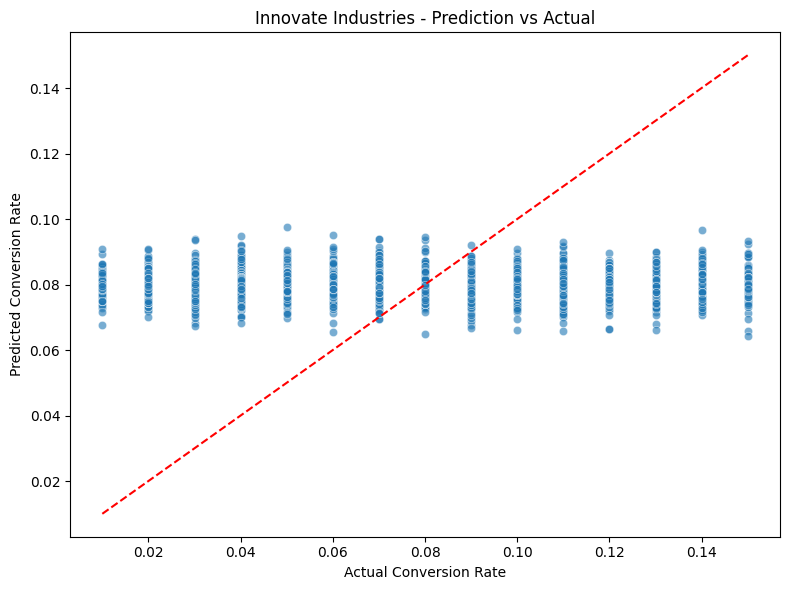

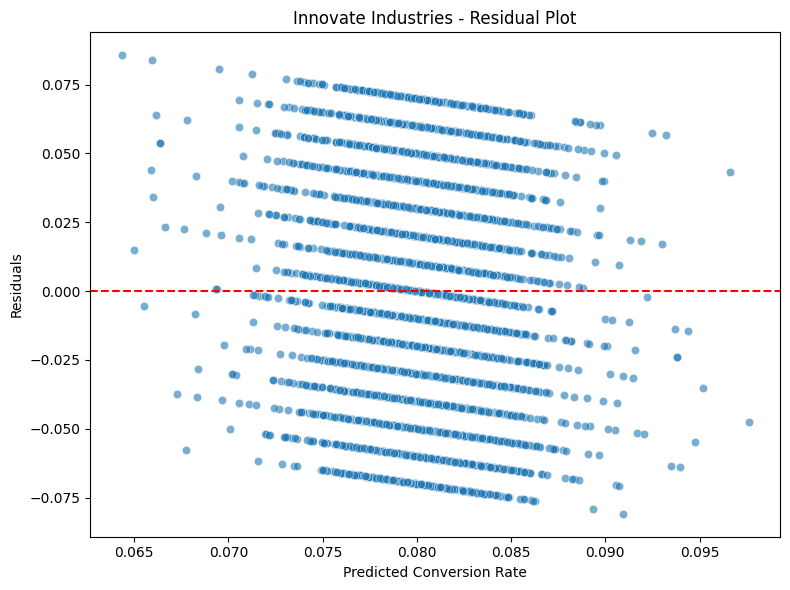

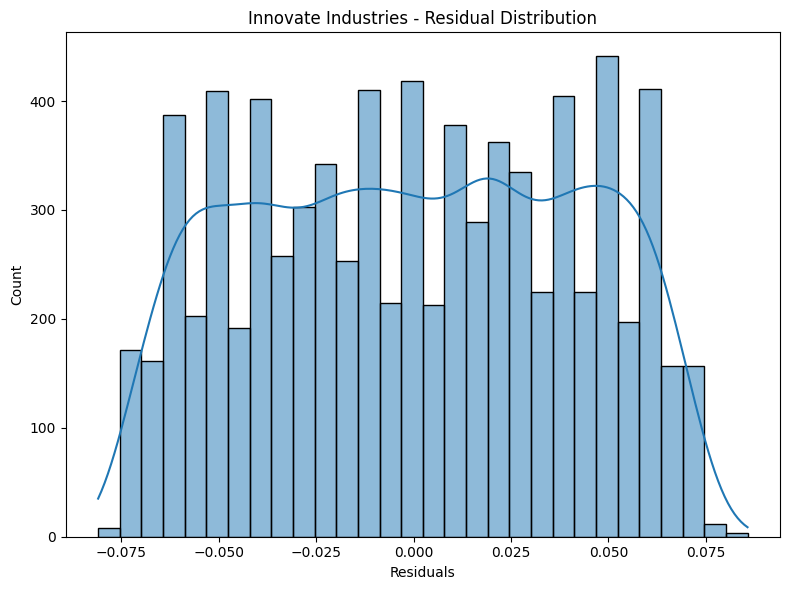

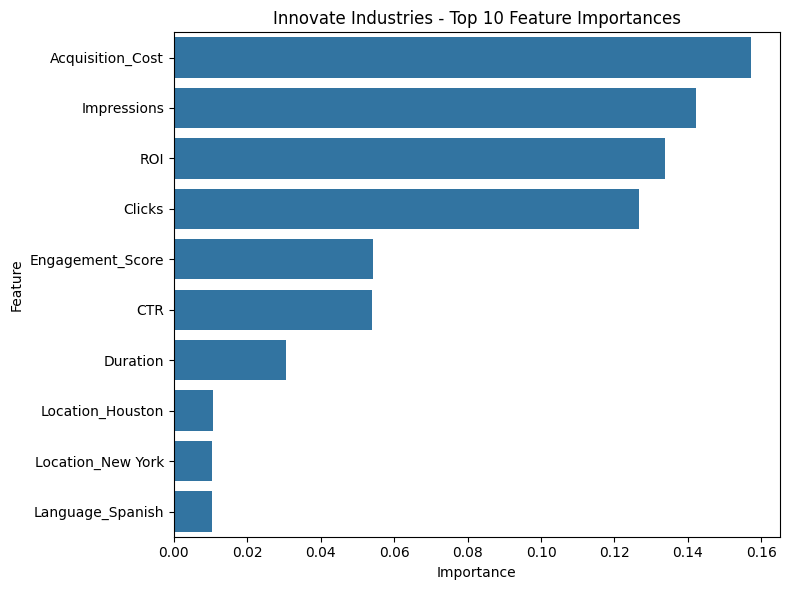


Training Random Forest for: NexGen Systems
MAE  : 0.03490
MSE  : 0.00164
RMSE : 0.04046
R²   : -0.00705


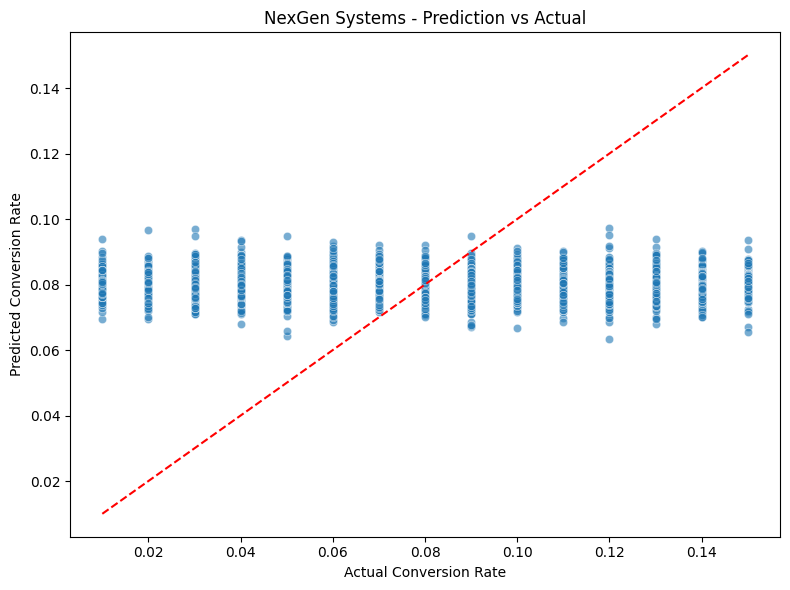

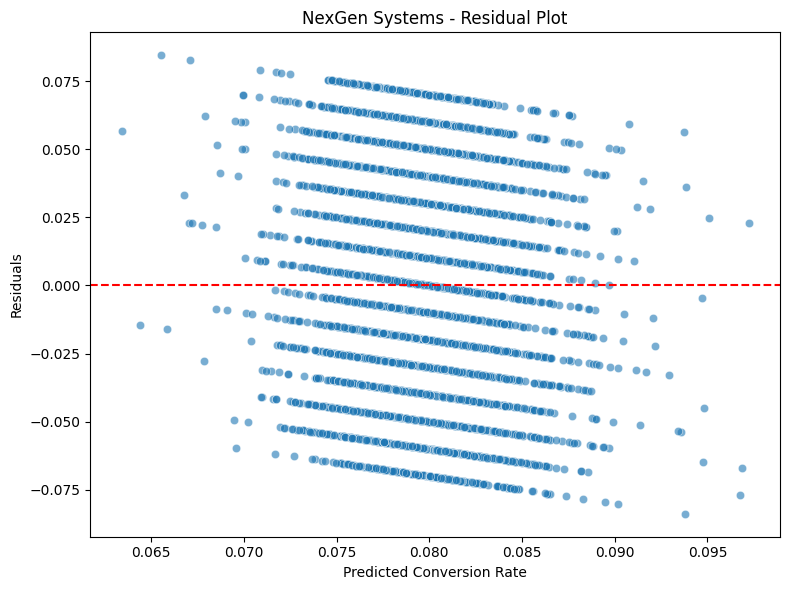

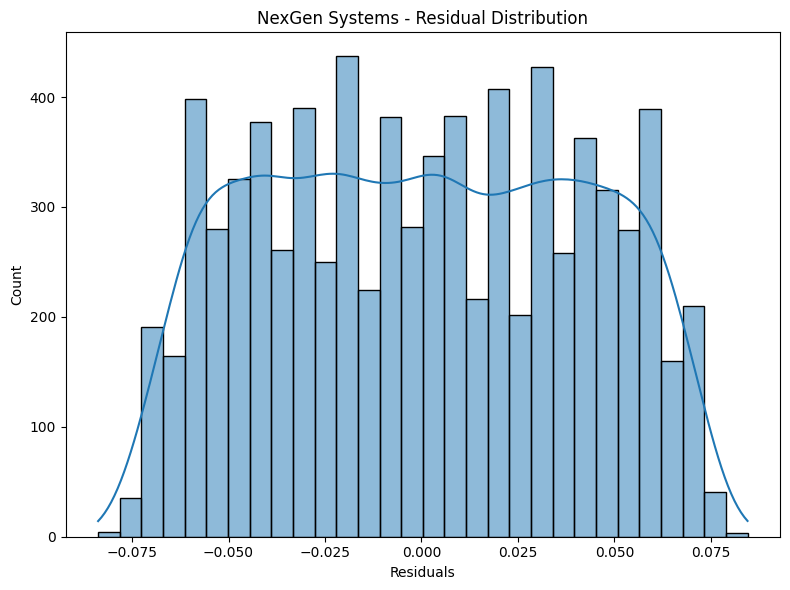

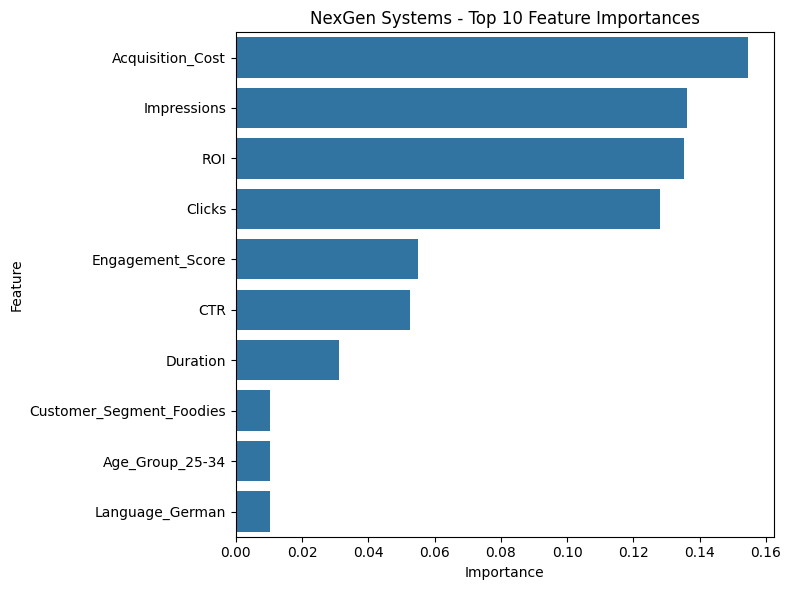


Training Random Forest for: Alpha Innovations
MAE  : 0.03533
MSE  : 0.00167
RMSE : 0.04085
R²   : -0.00384


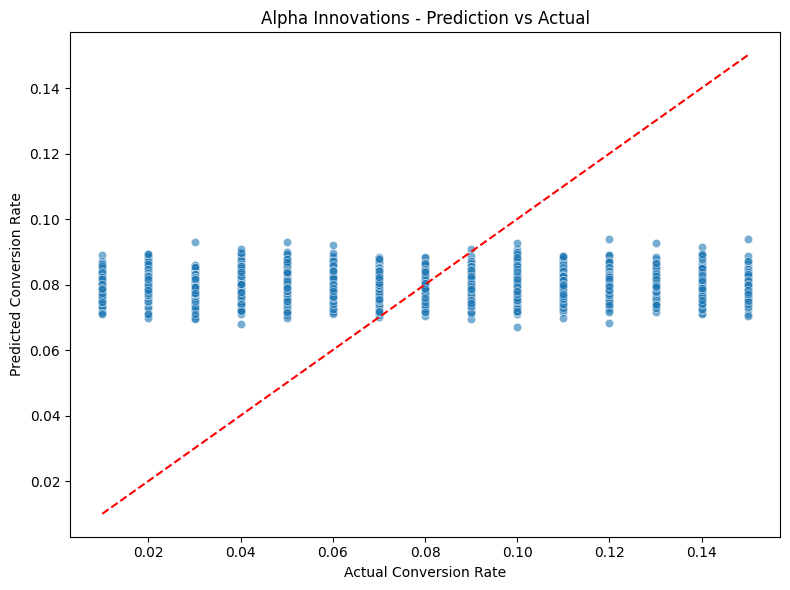

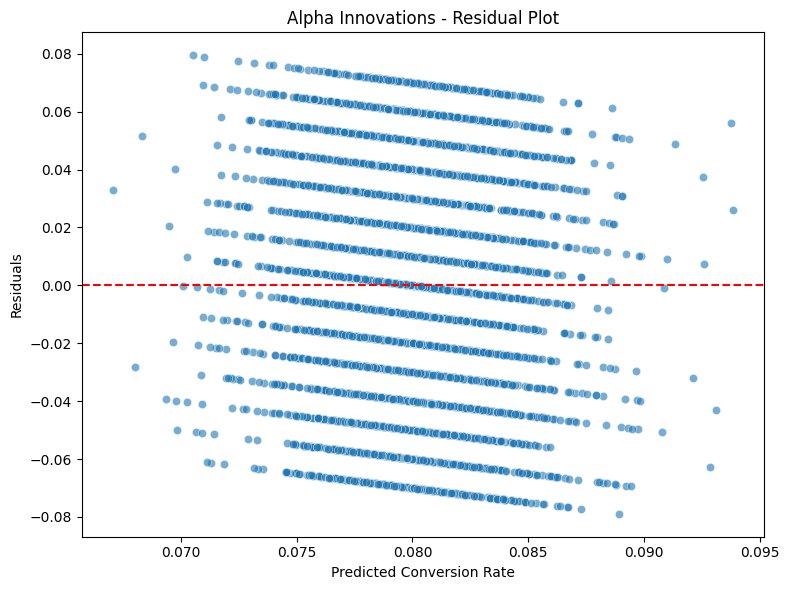

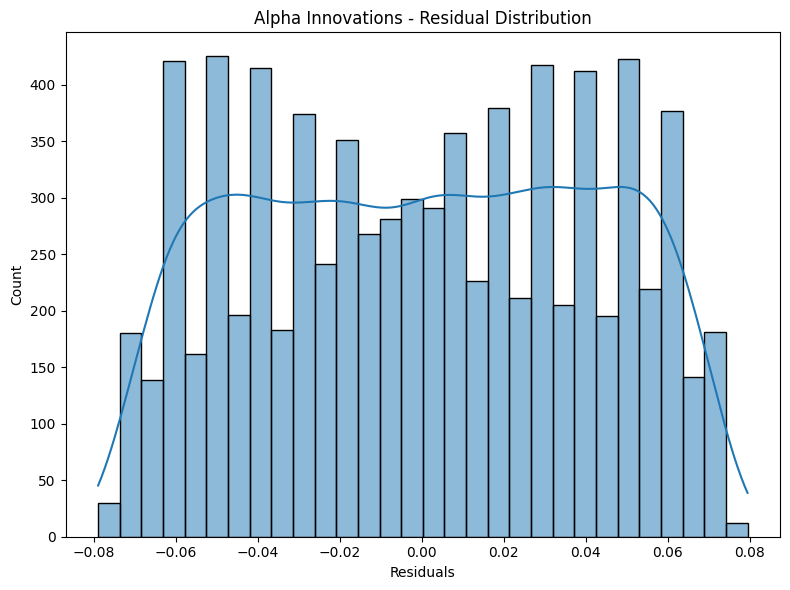

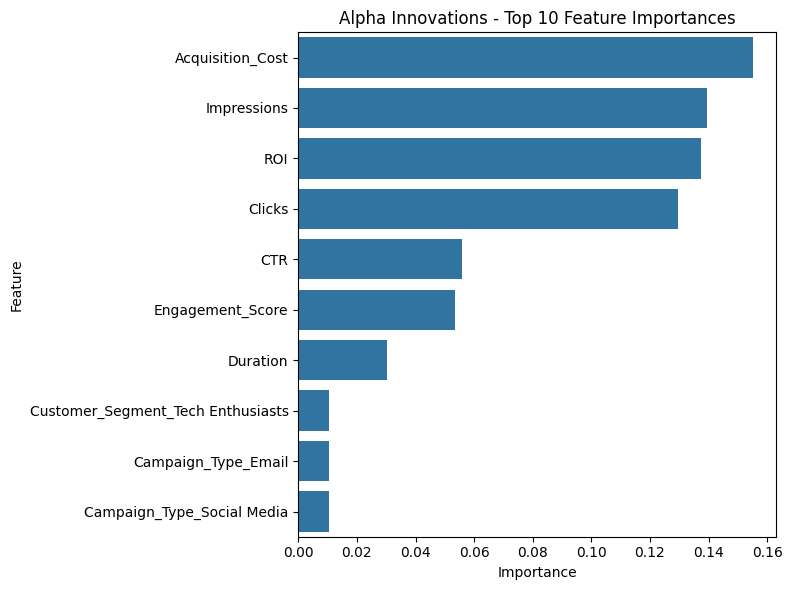


Training Random Forest for: DataTech Solutions
MAE  : 0.03521
MSE  : 0.00165
RMSE : 0.04067
R²   : -0.00197


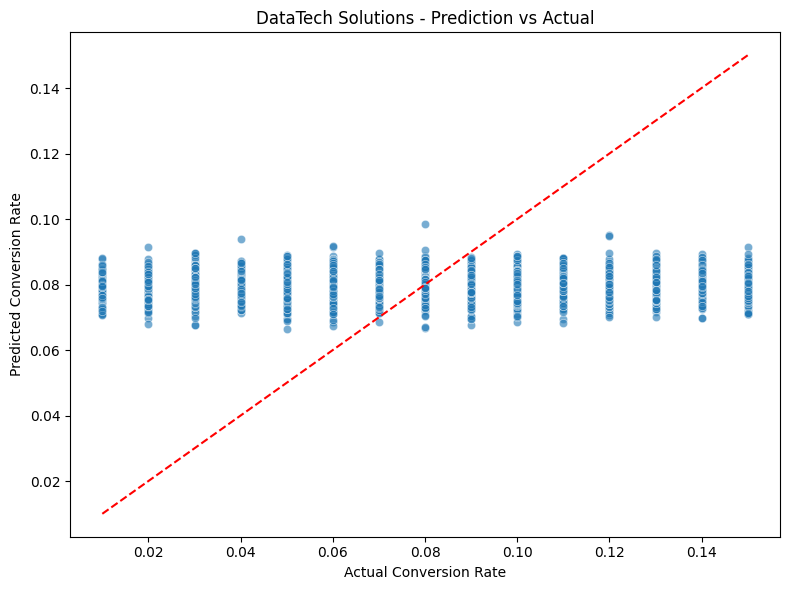

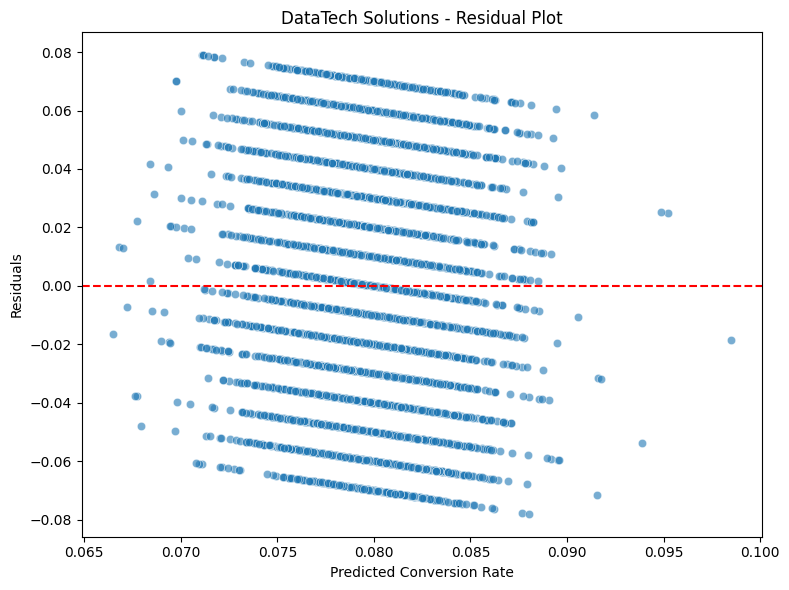

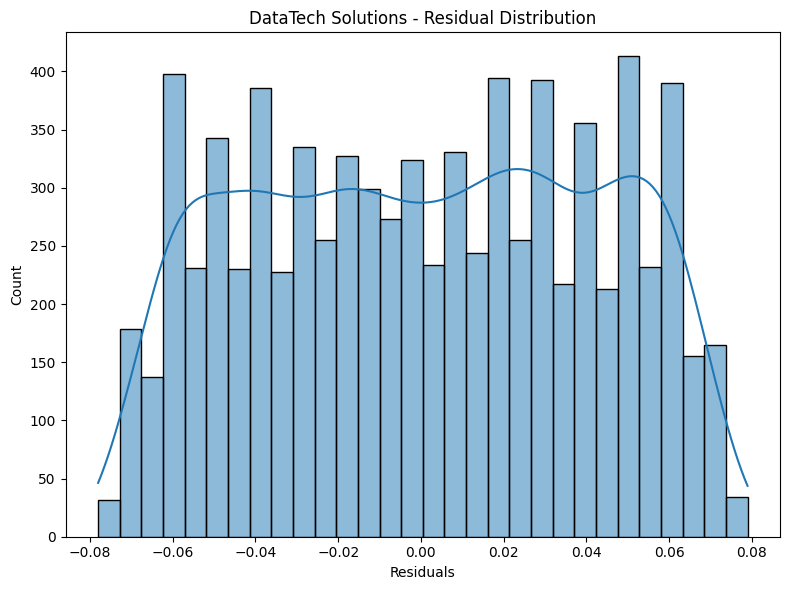

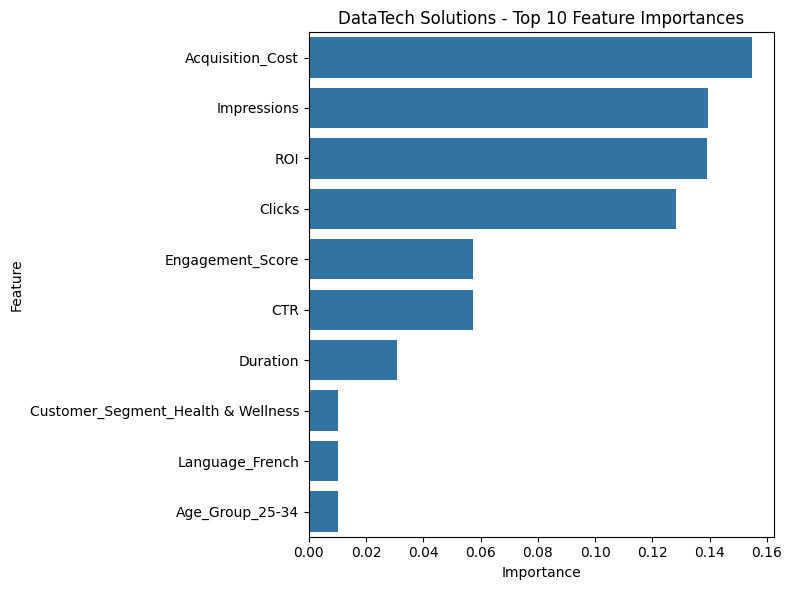


Training Random Forest for: TechCorp
MAE  : 0.03512
MSE  : 0.00166
RMSE : 0.04073
R²   : -0.00486


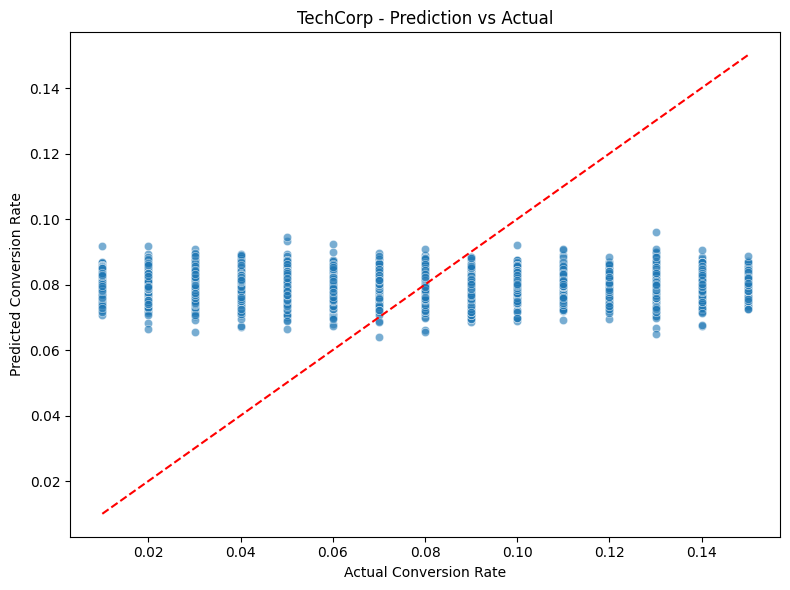

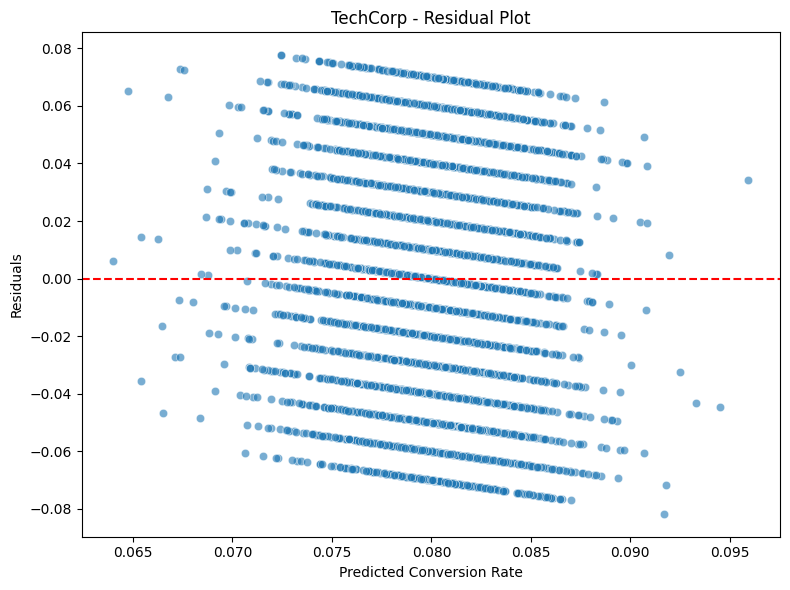

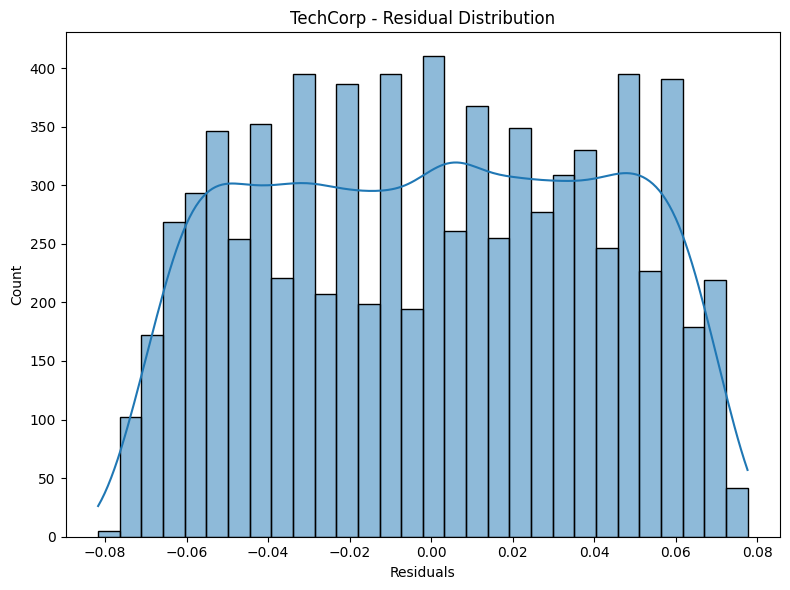

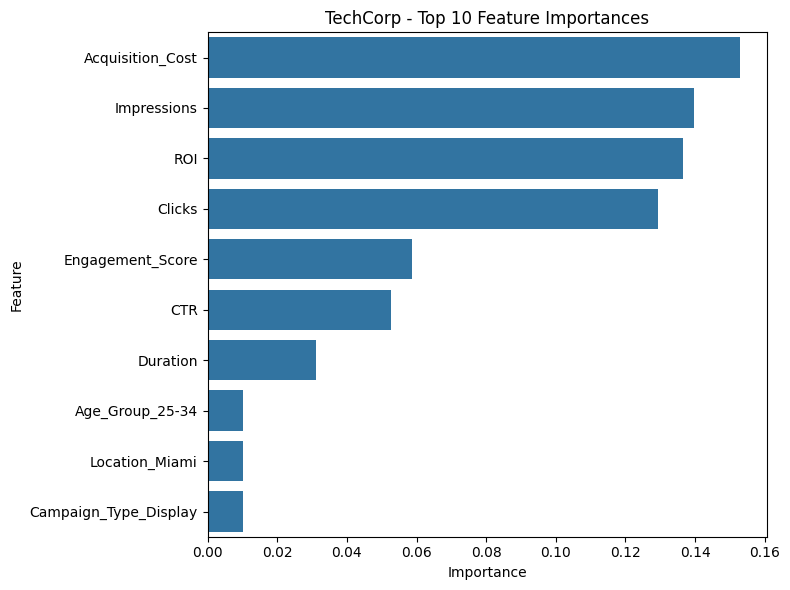

,mae,mse,rmse,r2,y_test,y_pred
Innovate Industries,0.035213,0.001666,0.040815,-0.006086,115365 0.13 66078 0.06 129590 0.11 1...,"[0.08038941163857848, 0.07976380678350484, 0.0..."
NexGen Systems,0.034897,0.001637,0.040461,-0.007052,28051 0.03 91661 0.09 32435 0.13 3...,"[0.07714586714946284, 0.07760505012738218, 0.0..."
Alpha Innovations,0.035335,0.001669,0.040852,-0.00384,9121 0.03 55800 0.06 125469 0.08 7...,"[0.08123901110073764, 0.08032289529782753, 0.0..."
DataTech Solutions,0.035208,0.001654,0.040666,-0.001974,114685 0.03 145621 0.14 11447 0.02 4...,"[0.0764397949000366, 0.08016410694972803, 0.07..."
TechCorp,0.035121,0.001659,0.040729,-0.004859,31551 0.03 4745 0.11 37694 0.04 1...,"[0.0824827589143831, 0.08115654520997398, 0.07..."


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Storage
rf_models = {}
rf_results = {}

# Train model for each company
for rf_company in rf_company_data:
    print(f"\nTraining Random Forest for: {rf_company}")

    # Extract data
    x_train = rf_company_data[rf_company]['x_train']
    x_val = rf_company_data[rf_company]['x_val']
    x_test = rf_company_data[rf_company]['x_test']
    y_train = rf_company_data[rf_company]['y_train']
    y_val = rf_company_data[rf_company]['y_val']
    y_test = rf_company_data[rf_company]['y_test']

    # Combine train and val sets for final training
    x_train_full = pd.concat([x_train, x_val])
    y_train_full = pd.concat([y_train, y_val])

    # Define model
    rf_model = RandomForestRegressor(
        n_estimators=200,
        max_depth=15,
        random_state=42,
        n_jobs=-1
    )

    # Train
    rf_model.fit(x_train_full, y_train_full)

    # Predict
    y_pred = rf_model.predict(x_test)

    # Evaluate
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    print(f"MAE  : {mae:.5f}")
    print(f"MSE  : {mse:.5f}")
    print(f"RMSE : {rmse:.5f}")
    print(f"R²   : {r2:.5f}")

    # Store
    rf_models[rf_company] = rf_model
    rf_results[rf_company] = {
        'mae': mae,
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'y_test': y_test,
        'y_pred': y_pred
    }

    # Residuals
    residuals = y_test - y_pred

    # 📊 Prediction vs Actual
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Conversion Rate")
    plt.ylabel("Predicted Conversion Rate")
    plt.title(f"{rf_company} - Prediction vs Actual")
    plt.tight_layout()
    plt.show()

    # 📊 Residual Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Conversion Rate")
    plt.ylabel("Residuals")
    plt.title(f"{rf_company} - Residual Plot")
    plt.tight_layout()
    plt.show()

    # 📊 Residual Histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True, bins=30)
    plt.title(f"{rf_company} - Residual Distribution")
    plt.xlabel("Residuals")
    plt.tight_layout()
    plt.show()

    # 📊 Feature Importance
    importances = rf_model.feature_importances_
    feature_names = x_train.columns
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    top_features = importance_df.sort_values(by='Importance', ascending=False).head(10)

    plt.figure(figsize=(8, 6))
    sns.barplot(data=top_features, x='Importance', y='Feature')
    plt.title(f"{rf_company} - Top 10 Feature Importances")
    plt.tight_layout()
    plt.show()



pd.DataFrame(rf_results).T

In [ ]:
import optuna
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Storage
rf_optuna_study = {}
rf_best_params = {}

# Objective function
def rf_objective(trial, x_train, y_train, x_val, y_val):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 5, 30),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'random_state': 42,
        'n_jobs': -1
    }

    model = RandomForestRegressor(**params)
    model.fit(x_train, y_train)

    y_pred = model.predict(x_val)
    rmse = np.sqrt(mse)
    return rmse


In [93]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

for rf_company in rf_company_data:
    print(f"\nRunning Optuna for: {rf_company}")

    x_train = rf_company_data[rf_company]['x_train']
    x_val = rf_company_data[rf_company]['x_val']
    y_train = rf_company_data[rf_company]['y_train']
    y_val = rf_company_data[rf_company]['y_val']

    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: rf_objective(trial, x_train, y_train, x_val, y_val),
                   n_trials=50, timeout=600)

    print(f"Best RMSE: {study.best_value:.5f}")
    print(f"Best Params for {rf_company}: {study.best_params}")

    rf_optuna_study[rf_company] = study
    rf_best_params[rf_company] = study.best_params



Running Optuna for: Innovate Industries
Best RMSE: 0.04073
Best Params for Innovate Industries: {'n_estimators': 183, 'max_depth': 29, 'min_samples_split': 13, 'min_samples_leaf': 8}

Running Optuna for: NexGen Systems
Best RMSE: 0.04073
Best Params for NexGen Systems: {'n_estimators': 257, 'max_depth': 19, 'min_samples_split': 15, 'min_samples_leaf': 5}

Running Optuna for: Alpha Innovations
Best RMSE: 0.04073
Best Params for Alpha Innovations: {'n_estimators': 355, 'max_depth': 19, 'min_samples_split': 6, 'min_samples_leaf': 5}

Running Optuna for: DataTech Solutions
Best RMSE: 0.04073
Best Params for DataTech Solutions: {'n_estimators': 307, 'max_depth': 11, 'min_samples_split': 19, 'min_samples_leaf': 3}

Running Optuna for: TechCorp
Best RMSE: 0.04073
Best Params for TechCorp: {'n_estimators': 371, 'max_depth': 25, 'min_samples_split': 4, 'min_samples_leaf': 7}


In [2]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Storage
rf_final_models = {}
rf_final_results = {}

# Loop through each company
for rf_company in rf_company_data:
    print(f"\nFinal Random Forest Training for: {rf_company}")

    # Unpack data
    x_train = rf_company_data[rf_company]['x_train']
    x_val = rf_company_data[rf_company]['x_val']
    x_test = rf_company_data[rf_company]['x_test']
    y_train = rf_company_data[rf_company]['y_train']
    y_val = rf_company_data[rf_company]['y_val']
    y_test = rf_company_data[rf_company]['y_test']

    # Combine train + val
    x_train_full = pd.concat([x_train, x_val])
    y_train_full = pd.concat([y_train, y_val])

    # Load best params
    best_params = rf_best_params[rf_company]
    best_params.update({
        'random_state': 42,
        'n_jobs': -1
    })

    # Final model
    model = RandomForestRegressor(**best_params)
    model.fit(x_train_full, y_train_full)

    # Predict
    y_pred = model.predict(x_test)

    # Evaluation
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"MAE  : {mae:.5f}")
    print(f"MSE  : {mse:.5f}")
    print(f"RMSE : {rmse:.5f}")
    print(f"R²   : {r2:.5f}")

    # Save
    rf_final_models[rf_company] = model
    rf_final_results[rf_company] = {
        'mae': mae,
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'y_test': y_test,
        'y_pred': y_pred,
        'best_params': best_params
    }

    # Residuals
    residuals = y_test - y_pred

    # ── Plot: Actual vs Predicted ──
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Conversion Rate")
    plt.ylabel("Predicted Conversion Rate")
    plt.title(f"{rf_company} - Prediction vs Actual")
    plt.tight_layout()
    plt.show()

    # ── Plot: Residual Plot ──
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Conversion Rate")
    plt.ylabel("Residuals")
    plt.title(f"{rf_company} - Residual Plot")
    plt.tight_layout()
    plt.show()

    # ── Plot: Residual Distribution ──
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True, bins=30)
    plt.title(f"{rf_company} - Residual Distribution")
    plt.xlabel("Residuals")
    plt.tight_layout()
    plt.show()

    # ── Plot: Feature Importance ──
    feature_importance = pd.DataFrame({
        'Feature': x_train_full.columns,
        'Importance': model.feature_importances_
    }).sort_values(by="Importance", ascending=False).head(10)

    plt.figure(figsize=(8, 6))
    sns.barplot(data=feature_importance, x="Importance", y="Feature")
    plt.title(f"{rf_company} - Top 10 Feature Importances")
    plt.tight_layout()
    plt.show()


NameError: name 'rf_company_data' is not defined

In [3]:
pd.DataFrame(rf_final_results).T

""


LightGBM

In [30]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Initialize storage dictionary
lgb_company_data = {}

# Get unique companies
lgb_unique_companies = lgbm_data['Company'].unique()

# Define column lists
lgb_categorical_cols = [
    'Campaign_Type', 'Channel_Used', 'Location',
    'Language', 'Customer_Segment', 'Age_Group', 'Gender'
]

lgb_numerical_cols = [
    'Acquisition_Cost', 'ROI', 'Clicks', 'Impressions',
    'Engagement_Score', 'Duration', 'CTR'
]

# Process each company
for lgb_company in lgb_unique_companies:
    print(f"Processing: {lgb_company}")

    # Filter company data
    lgb_df = lgbm_data[lgbm_data['Company'] == lgb_company].copy()

    # Features and target
    lgb_x = lgb_df[lgb_categorical_cols + lgb_numerical_cols].copy()
    lgb_y = lgb_df['Conversion_Rate'].copy()

    print(f"📐 Original shape: X={lgb_x.shape}, Y={lgb_y.shape}")

    # Train+Val vs Test split (80/20)
    lgb_x_temp, lgb_x_test, lgb_y_temp, lgb_y_test = train_test_split(
        lgb_x, lgb_y, test_size=0.2, random_state=42
    )

    # Train vs Val split (80/20 of 80%)
    lgb_x_train, lgb_x_val, lgb_y_train, lgb_y_val = train_test_split(
        lgb_x_temp, lgb_y_temp, test_size=0.2, random_state=42
    )

    print(f"Split: Train={lgb_x_train.shape}, Val={lgb_x_val.shape}, Test={lgb_x_test.shape}")

    # Convert categorical columns to category dtype
    for col in lgb_categorical_cols:
        lgb_x_train[col] = lgb_x_train[col].astype('category')
        lgb_x_val[col] = lgb_x_val[col].astype('category')
        lgb_x_test[col] = lgb_x_test[col].astype('category')

    # Store in dictionary
    lgb_company_data[lgb_company] = {
        'x_train': lgb_x_train,
        'x_val': lgb_x_val,
        'x_test': lgb_x_test,
        'y_train': lgb_y_train,
        'y_val': lgb_y_val,
        'y_test': lgb_y_test,
        'categorical_cols': lgb_categorical_cols,
        'numerical_cols': lgb_numerical_cols
    
    }


Processing: Innovate Industries
📐 Original shape: X=(39709, 14), Y=(39709,)
Split: Train=(25413, 14), Val=(6354, 14), Test=(7942, 14)
Processing: NexGen Systems
📐 Original shape: X=(39991, 14), Y=(39991,)
Split: Train=(25593, 14), Val=(6399, 14), Test=(7999, 14)
Processing: Alpha Innovations
📐 Original shape: X=(40051, 14), Y=(40051,)
Split: Train=(25632, 14), Val=(6408, 14), Test=(8011, 14)
Processing: DataTech Solutions
📐 Original shape: X=(40012, 14), Y=(40012,)
Split: Train=(25607, 14), Val=(6402, 14), Test=(8003, 14)
Processing: TechCorp
📐 Original shape: X=(40237, 14), Y=(40237,)
Split: Train=(25751, 14), Val=(6438, 14), Test=(8048, 14)


In [31]:
# Check info of train/val/test to confirm dtypes
print("\ndtypes in x_train:")
print(lgb_x_train.info())

print("\ndtypes in x_val:")
print(lgb_x_val.info())

print("\ndtypes in x_test:")
print(lgb_x_test.info())



dtypes in x_train:
<class 'pandas.core.frame.DataFrame'>
Index: 25751 entries, 93720 to 51937
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Campaign_Type     25751 non-null  category
 1   Channel_Used      25751 non-null  category
 2   Location          25751 non-null  category
 3   Language          25751 non-null  category
 4   Customer_Segment  25751 non-null  category
 5   Age_Group         25751 non-null  category
 6   Gender            25751 non-null  category
 7   Acquisition_Cost  25751 non-null  float64 
 8   ROI               25751 non-null  float64 
 9   Clicks            25751 non-null  int64   
 10  Impressions       25751 non-null  int64   
 11  Engagement_Score  25751 non-null  int64   
 12  Duration          25751 non-null  int32   
 13  CTR               25751 non-null  float64 
dtypes: category(7), float64(3), int32(1), int64(3)
memory usage: 1.6 MB
None

dtypes in x_val:
<class '

LightGBM: Baseline


Training LightGBM for: Innovate Industries
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 0.0406305	valid_0's l2: 0.00165084
[20]	valid_0's rmse: 0.0406354	valid_0's l2: 0.00165123
[30]	valid_0's rmse: 0.0406384	valid_0's l2: 0.00165148
[40]	valid_0's rmse: 0.0406514	valid_0's l2: 0.00165253
[50]	valid_0's rmse: 0.0406715	valid_0's l2: 0.00165417
Early stopping, best iteration is:
[1]	valid_0's rmse: 0.0406179	valid_0's l2: 0.00164981
Best iteration: 1
Test MAE : 0.03503
Test MSE : 0.00166
Test RMSE: 0.04069
Test R²  : -0.00005


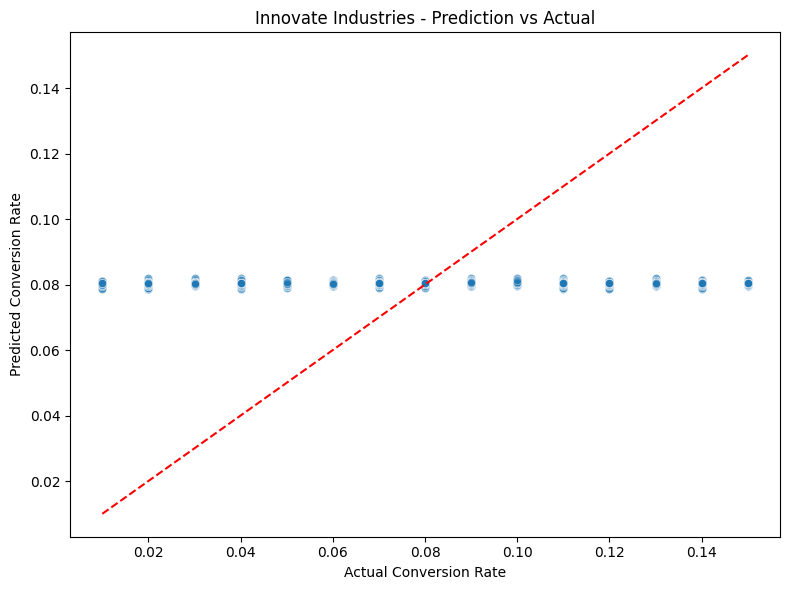

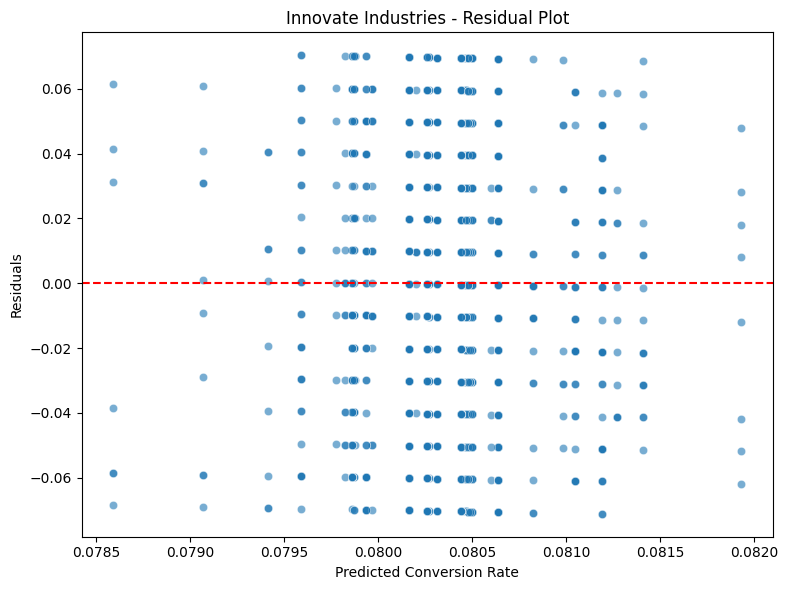

<Figure size 800x600 with 0 Axes>

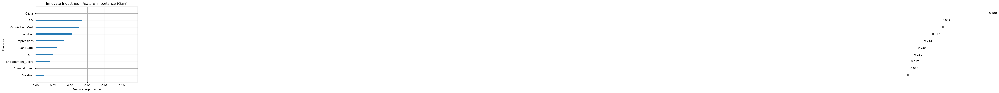

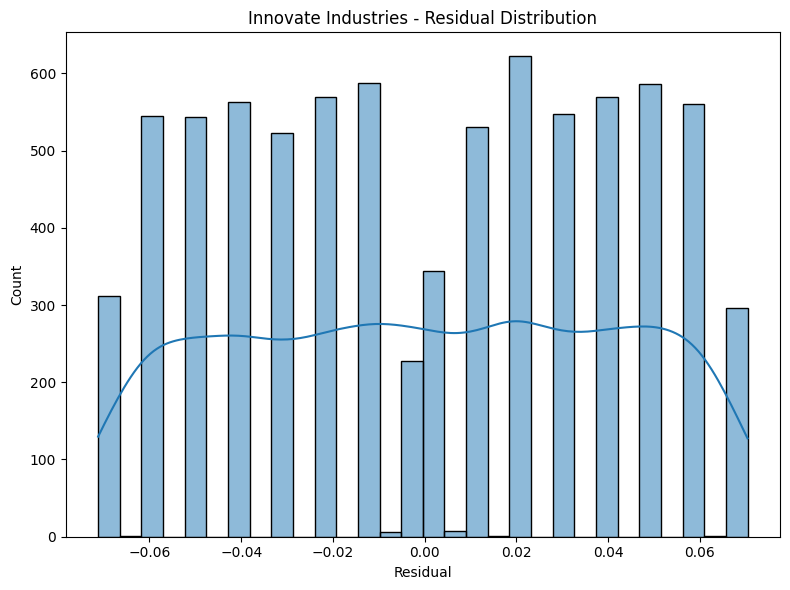


Training LightGBM for: NexGen Systems
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 0.0407177	valid_0's l2: 0.00165793
[20]	valid_0's rmse: 0.0407318	valid_0's l2: 0.00165908
[30]	valid_0's rmse: 0.0407332	valid_0's l2: 0.0016592
[40]	valid_0's rmse: 0.0407428	valid_0's l2: 0.00165997
[50]	valid_0's rmse: 0.0407379	valid_0's l2: 0.00165958
Early stopping, best iteration is:
[2]	valid_0's rmse: 0.0407087	valid_0's l2: 0.0016572
Best iteration: 2
Test MAE : 0.03473
Test MSE : 0.00163
Test RMSE: 0.04032
Test R²  : 0.00002


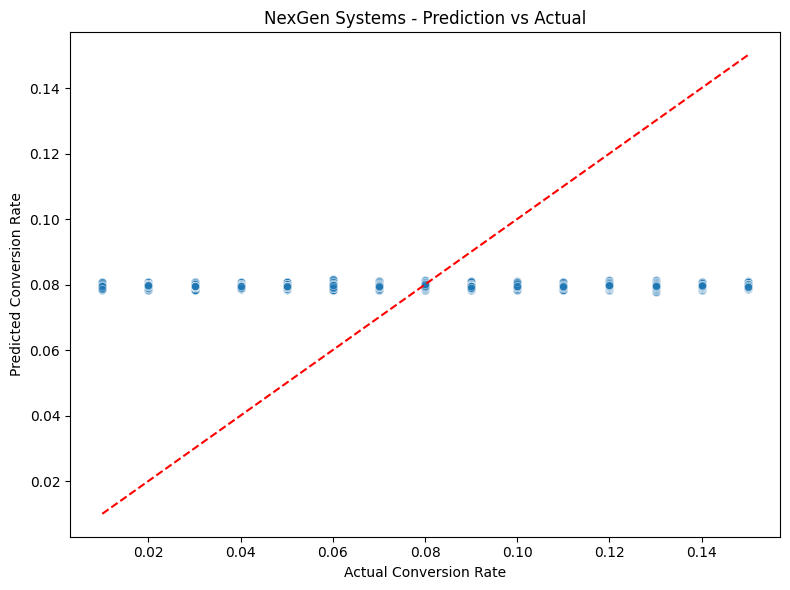

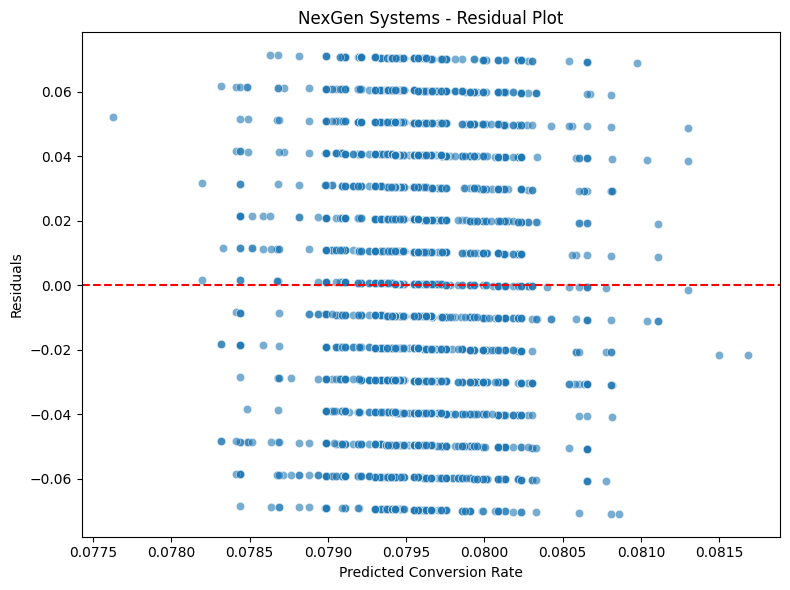

<Figure size 800x600 with 0 Axes>

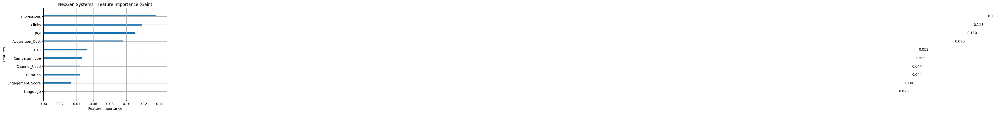

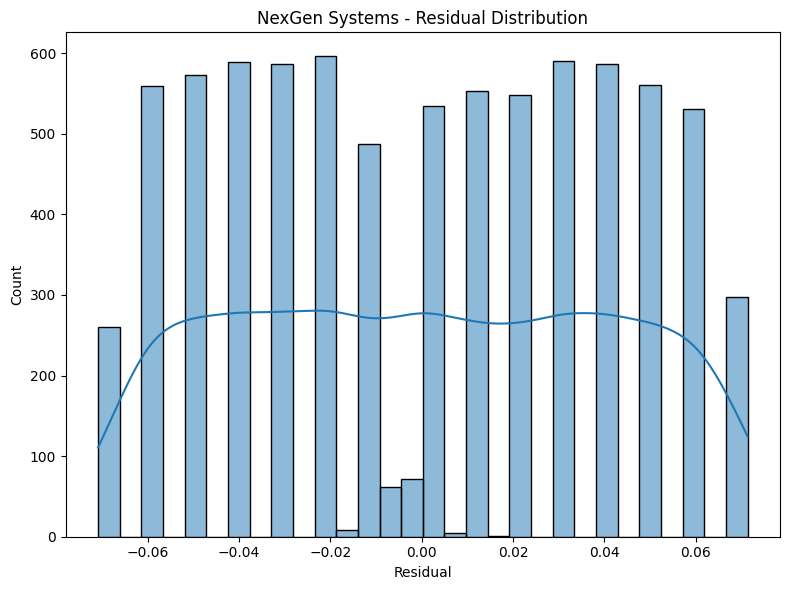


Training LightGBM for: Alpha Innovations
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 0.0408598	valid_0's l2: 0.00166952
[20]	valid_0's rmse: 0.040879	valid_0's l2: 0.00167109
[30]	valid_0's rmse: 0.0408962	valid_0's l2: 0.0016725
[40]	valid_0's rmse: 0.0409179	valid_0's l2: 0.00167428
[50]	valid_0's rmse: 0.0409389	valid_0's l2: 0.00167599
Early stopping, best iteration is:
[1]	valid_0's rmse: 0.04085	valid_0's l2: 0.00166872
Best iteration: 1
Test MAE : 0.03518
Test MSE : 0.00166
Test RMSE: 0.04078
Test R²  : -0.00009


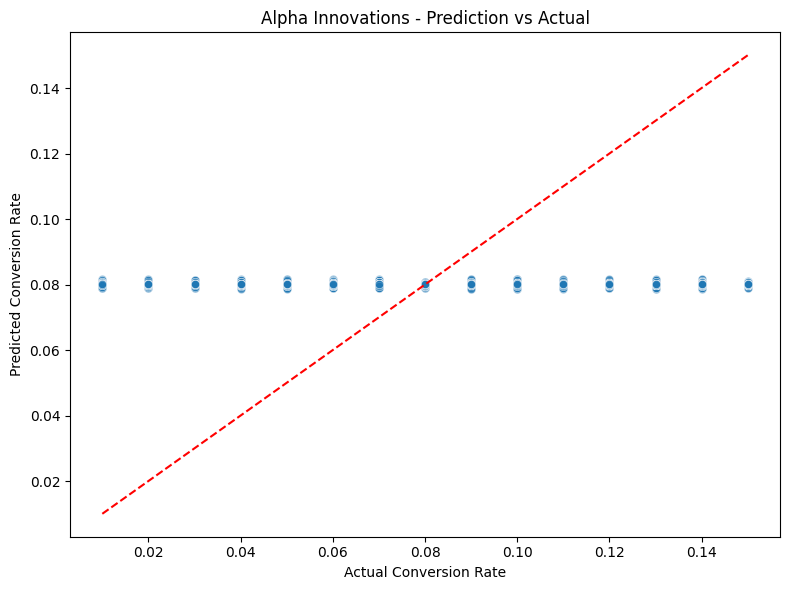

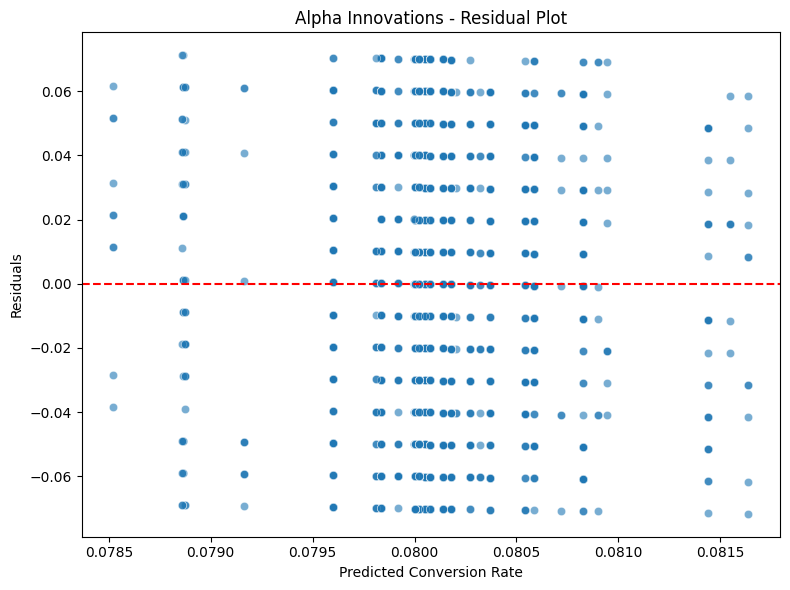

<Figure size 800x600 with 0 Axes>

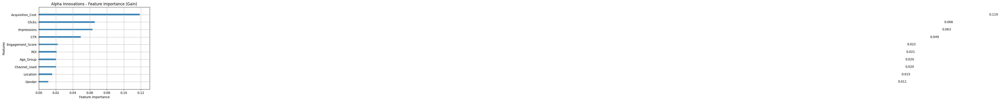

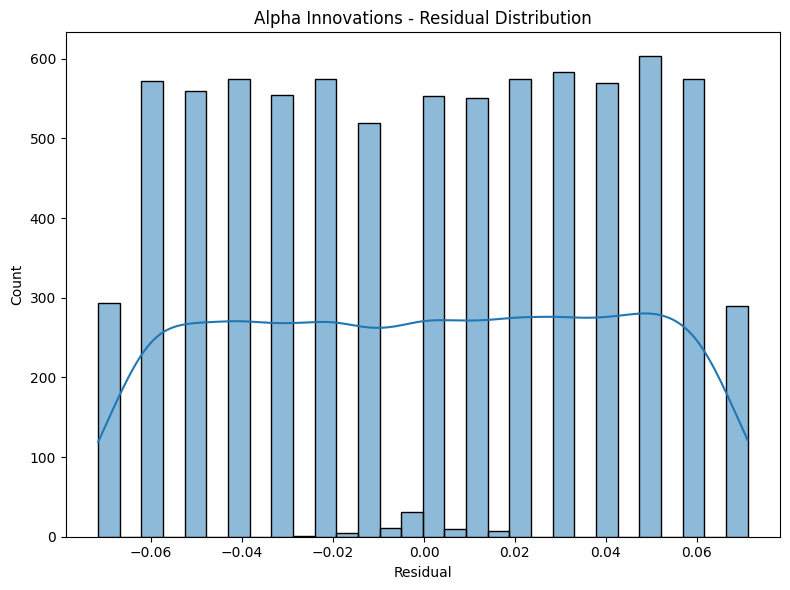


Training LightGBM for: DataTech Solutions
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 0.0407711	valid_0's l2: 0.00166228
[20]	valid_0's rmse: 0.0407855	valid_0's l2: 0.00166345
[30]	valid_0's rmse: 0.0407987	valid_0's l2: 0.00166453
[40]	valid_0's rmse: 0.0408215	valid_0's l2: 0.0016664
[50]	valid_0's rmse: 0.0408317	valid_0's l2: 0.00166723
Early stopping, best iteration is:
[4]	valid_0's rmse: 0.0407624	valid_0's l2: 0.00166157
Best iteration: 4
Test MAE : 0.03514
Test MSE : 0.00165
Test RMSE: 0.04064
Test R²  : -0.00051


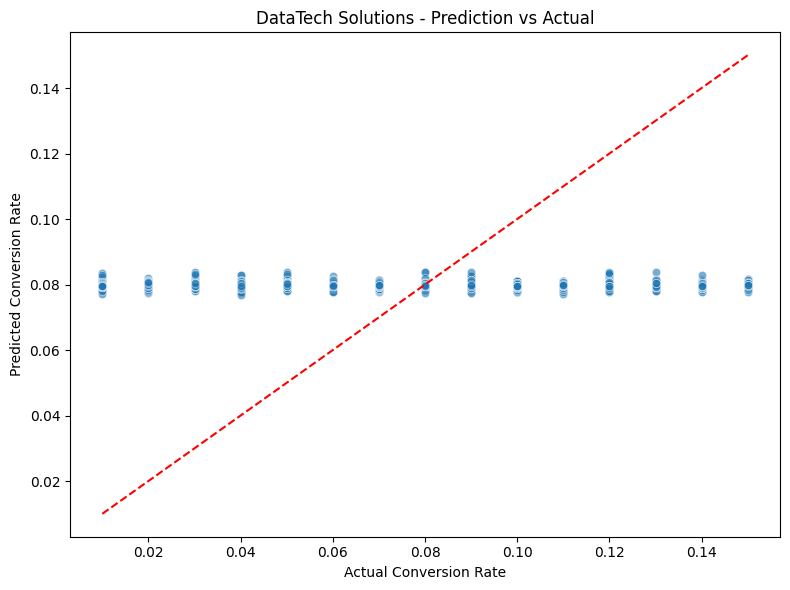

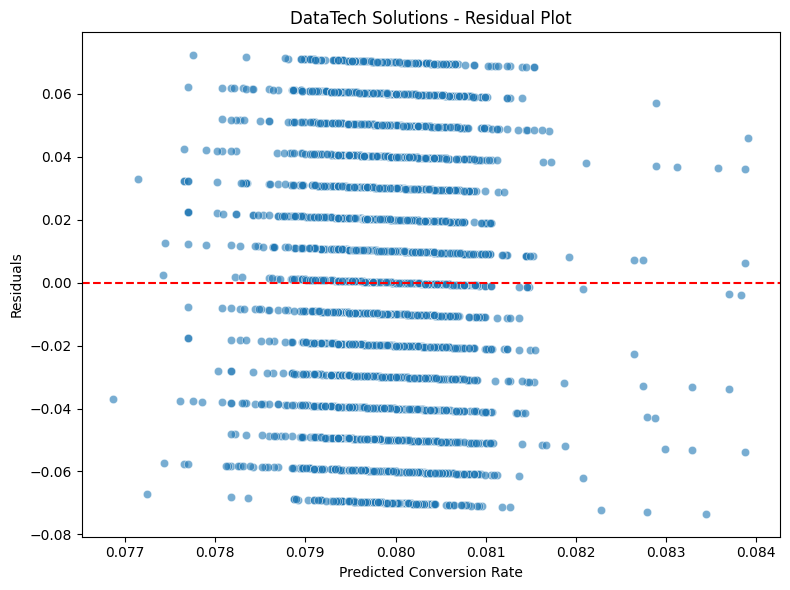

<Figure size 800x600 with 0 Axes>

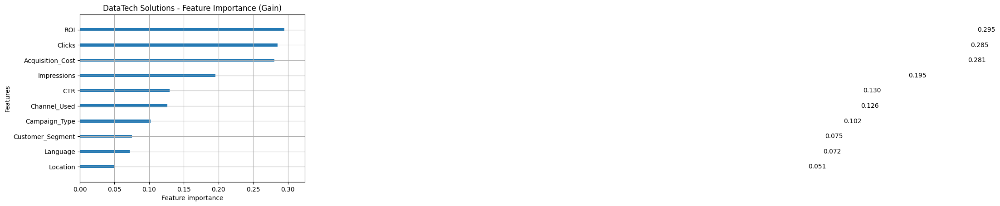

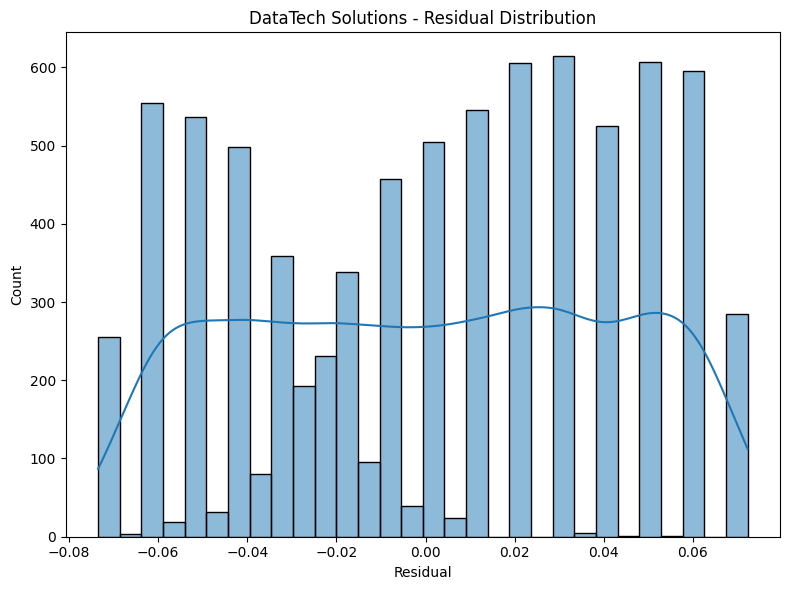


Training LightGBM for: TechCorp
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 0.0406152	valid_0's l2: 0.00164959
[20]	valid_0's rmse: 0.0406362	valid_0's l2: 0.0016513
[30]	valid_0's rmse: 0.0406462	valid_0's l2: 0.00165211
[40]	valid_0's rmse: 0.0406679	valid_0's l2: 0.00165388
[50]	valid_0's rmse: 0.0406749	valid_0's l2: 0.00165445
Early stopping, best iteration is:
[1]	valid_0's rmse: 0.0406011	valid_0's l2: 0.00164845
Best iteration: 1
Test MAE : 0.03501
Test MSE : 0.00165
Test RMSE: 0.04063
Test R²  : 0.00000


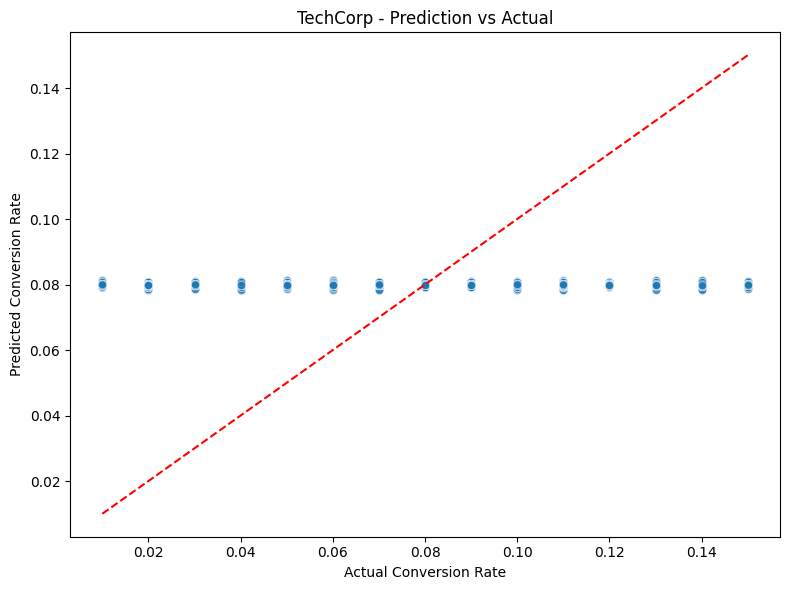

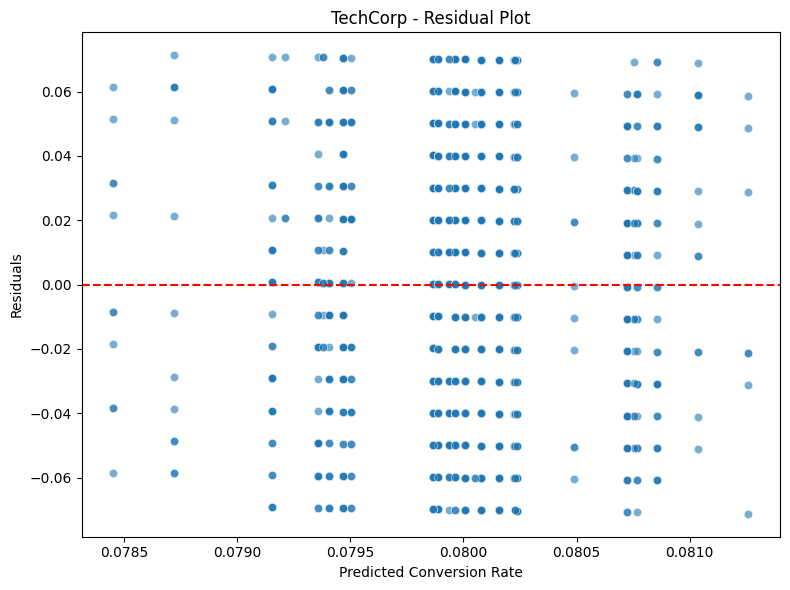

<Figure size 800x600 with 0 Axes>

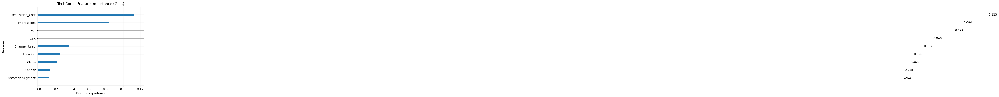

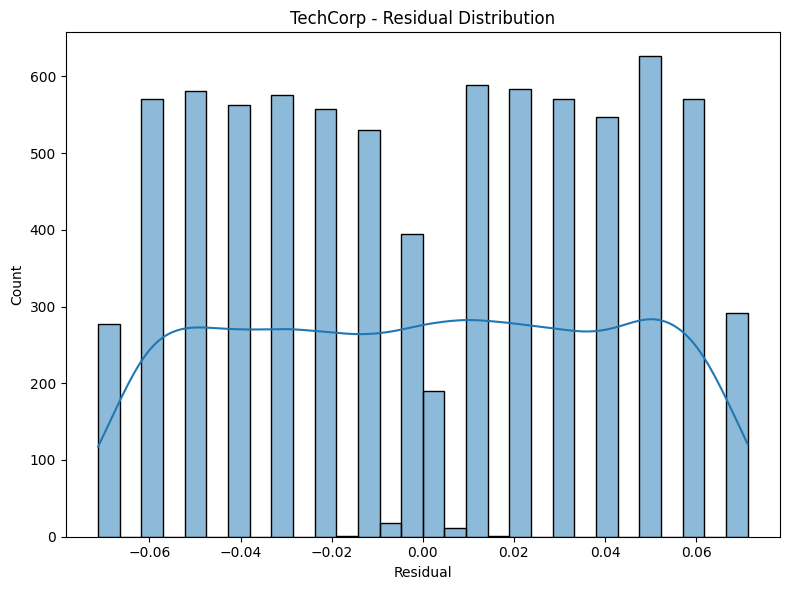

In [66]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Storage for models and metrics
lgb_models = {}
lgb_results = {}

# Loop over each company
for lgb_company in lgb_company_data:
    print(f"\nTraining LightGBM for: {lgb_company}")

    # Unpack data
    x_train = lgb_company_data[lgb_company]['x_train']
    x_val = lgb_company_data[lgb_company]['x_val']
    x_test = lgb_company_data[lgb_company]['x_test']
    y_train = lgb_company_data[lgb_company]['y_train']
    y_val = lgb_company_data[lgb_company]['y_val']
    y_test = lgb_company_data[lgb_company]['y_test']
    cat_cols = lgb_company_data[lgb_company]['categorical_cols']

    # Define model
    lgb_model = lgb.LGBMRegressor(
        n_estimators=1000,
        learning_rate=0.05,
        objective='regression',
        random_state=42
    )

    # Fit model with early stopping
    lgb_model.fit(
        x_train, y_train,
        eval_set=[(x_val, y_val)],
        eval_metric='rmse',
        categorical_feature=cat_cols,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
            lgb.log_evaluation(period=10)
        ]
    )

    # Use best iteration from early stopping
    best_iter = lgb_model.best_iteration_
    print(f"Best iteration: {best_iter}")

    # Predict using best iteration
    y_pred = lgb_model.predict(x_test, num_iteration=best_iter)

    # Evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Test MAE : {mae:.5f}")
    print(f"Test MSE : {mse:.5f}")
    print(f"Test RMSE: {rmse:.5f}")
    print(f"Test R²  : {r2:.5f}")

    # Store model and results
    lgb_models[lgb_company] = lgb_model
    lgb_results[lgb_company] = {
        'mae': mae,
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'y_test': y_test,
        'y_pred': y_pred,
        'best_iteration': best_iter
    }

    # Visualization
    # Prediction vs Actual
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Conversion Rate")
    plt.ylabel("Predicted Conversion Rate")
    plt.title(f"{lgb_company} - Prediction vs Actual")
    plt.tight_layout()
    plt.show()

    # Residual Plot
    residuals = y_test - y_pred
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Conversion Rate")
    plt.ylabel("Residuals")
    plt.title(f"{lgb_company} - Residual Plot")
    plt.tight_layout()
    plt.show()

    # Feature Importance Plot
    plt.figure(figsize=(8, 6))
    lgb.plot_importance(lgb_model, max_num_features=10, importance_type='gain', title=None)
    plt.title(f"{lgb_company} - Feature Importance (Gain)")
    plt.tight_layout()
    plt.show()

    # Residual Distribution
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True, bins=30)
    plt.title(f"{lgb_company} - Residual Distribution")
    plt.xlabel("Residual")
    plt.tight_layout()
    plt.show()




In [67]:
pd.DataFrame(lgb_results).T

,mae,mse,rmse,r2,y_test,y_pred,best_iteration
Innovate Industries,0.035028,0.001656,0.040693,-0.000053,115365 0.13 66078 0.06 129590 0.11 1...,"[0.08031393433471705, 0.08016699375362323, 0.0...",1
NexGen Systems,0.034734,0.001626,0.040319,0.000018,28051 0.03 91661 0.09 32435 0.13 3...,"[0.07942700243487497, 0.07942700243487497, 0.0...",2
Alpha Innovations,0.035184,0.001663,0.040776,-0.000093,9121 0.03 55800 0.06 125469 0.08 7...,"[0.08002017361984415, 0.08013843078801369, 0.0...",1
DataTech Solutions,0.035136,0.001651,0.040636,-0.000507,114685 0.03 145621 0.14 11447 0.02 4...,"[0.07951659202219888, 0.07951659202219888, 0.0...",4
TechCorp,0.035006,0.001651,0.04063,0.000005,31551 0.03 4745 0.11 37694 0.04 1...,"[0.08015854567056488, 0.08023667685264323, 0.0...",1


LightGBM: Hyperparameter Tuning

In [68]:
import optuna
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
import numpy as np


# Storage for best trials
lgb_optuna_study = {}
lgb_best_params = {}

# Objective function for Optuna
def lgb_objective(trial, x_train, y_train, x_val, y_val, cat_cols):

    params = {
        "objective": "regression",
        "metric": "rmse",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "random_state": 42,
        "num_leaves": trial.suggest_int("num_leaves", 20, 200),
        "max_depth": trial.suggest_int("max_depth", 3, 15), # shallower trees generalize better
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 10, 200),
        "learning_rate": trial.suggest_float("learning_rate", 0.002, 0.2, log=True),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.5, 1.0)
    }

    model = lgb.LGBMRegressor(**params, n_estimators=1000)

    model.fit(
        x_train, y_train,
        eval_set=[(x_val, y_val)],
        eval_metric="mae",
        categorical_feature=cat_cols,
        callbacks=[lgb.early_stopping(20, verbose=False)]
    )

    y_pred = model.predict(x_val, num_iteration=model.best_iteration_)
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    return rmse


In [69]:
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

for lgb_company in lgb_company_data:
    print(f"\nRunning Optuna for: {lgb_company}")
    
    # Unpack company-specific data
    x_train = lgb_company_data[lgb_company]['x_train']
    y_train = lgb_company_data[lgb_company]['y_train']
    x_val = lgb_company_data[lgb_company]['x_val']
    y_val = lgb_company_data[lgb_company]['y_val']
    cat_cols = lgb_company_data[lgb_company]['categorical_cols']

    # Define study
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: lgb_objective(trial, x_train, y_train, x_val, y_val, cat_cols),
                   n_trials=50, timeout=600)  # You can adjust trials or timeout

    print(f"Best RMSE: {study.best_value:.5f}")
    print(f"Best params for {lgb_company}: {study.best_params}")

    # Store study and best params
    lgb_optuna_study[lgb_company] = study
    lgb_best_params[lgb_company] = study.best_params



Running Optuna for: Innovate Industries
Best RMSE: 0.04061
Best params for Innovate Industries: {'num_leaves': 149, 'max_depth': 10, 'min_data_in_leaf': 78, 'learning_rate': 0.043254555400309626, 'feature_fraction': 0.604250281589886}

Running Optuna for: NexGen Systems
Best RMSE: 0.04069
Best params for NexGen Systems: {'num_leaves': 25, 'max_depth': 14, 'min_data_in_leaf': 87, 'learning_rate': 0.05183579483286065, 'feature_fraction': 0.5000021993718858}

Running Optuna for: Alpha Innovations
Best RMSE: 0.04084
Best params for Alpha Innovations: {'num_leaves': 30, 'max_depth': 8, 'min_data_in_leaf': 20, 'learning_rate': 0.18876941294765928, 'feature_fraction': 0.7802264961834842}

Running Optuna for: DataTech Solutions
Best RMSE: 0.04076
Best params for DataTech Solutions: {'num_leaves': 116, 'max_depth': 7, 'min_data_in_leaf': 36, 'learning_rate': 0.070566663034005, 'feature_fraction': 0.8400098593395771}

Running Optuna for: TechCorp
Best RMSE: 0.04060
Best params for TechCorp: {'n


Final LightGBM Training for: Innovate Industries
Training until validation scores don't improve for 50 rounds
[10]	valid_0's l1: 0.0350591	valid_0's rmse: 0.040703
[20]	valid_0's l1: 0.0350928	valid_0's rmse: 0.0407208
[30]	valid_0's l1: 0.0351203	valid_0's rmse: 0.0407444
[40]	valid_0's l1: 0.0351357	valid_0's rmse: 0.0407545
[50]	valid_0's l1: 0.0351546	valid_0's rmse: 0.0407753
Early stopping, best iteration is:
[1]	valid_0's l1: 0.0350291	valid_0's rmse: 0.0406905
MAE  : 0.03503
MSE  : 0.00166
RMSE : 0.04069
R²   : 0.00006
Best Iteration: 1


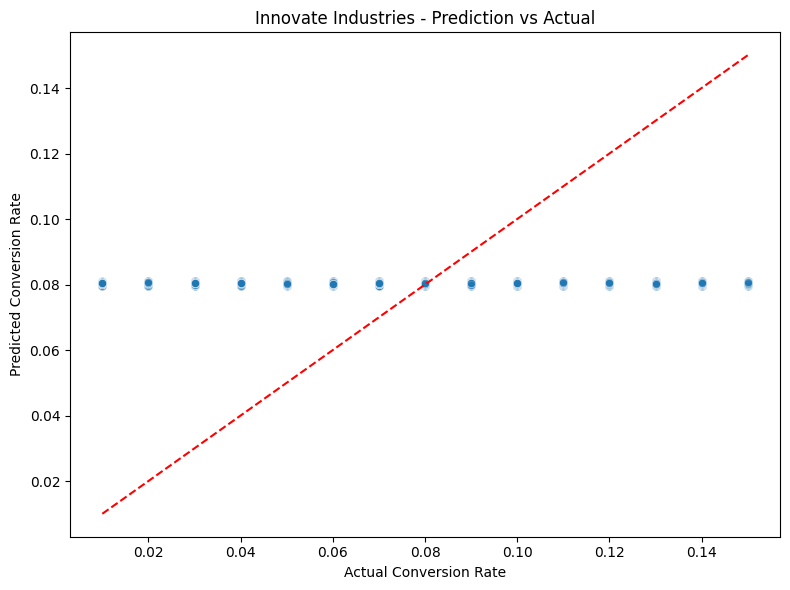

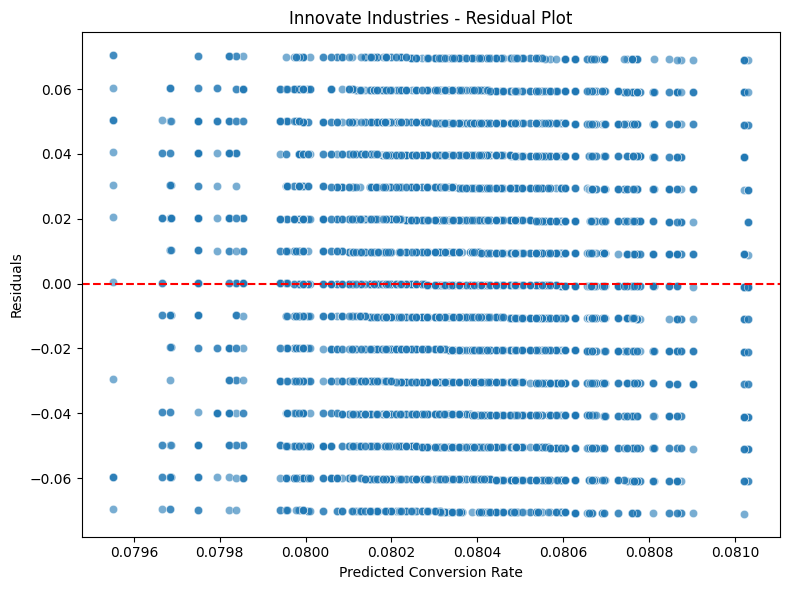

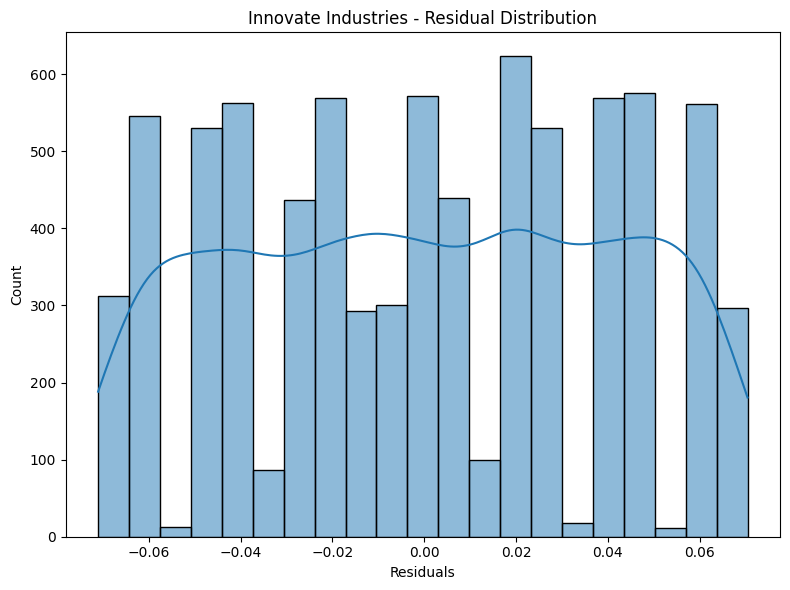

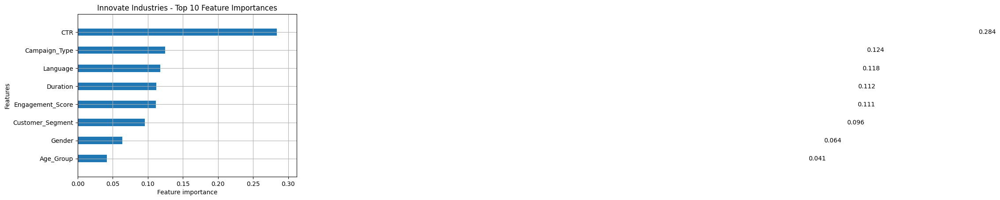


Final LightGBM Training for: NexGen Systems
Training until validation scores don't improve for 50 rounds
[10]	valid_0's l1: 0.0347436	valid_0's rmse: 0.0403274
[20]	valid_0's l1: 0.0347623	valid_0's rmse: 0.0403361
[30]	valid_0's l1: 0.0347716	valid_0's rmse: 0.0403394
[40]	valid_0's l1: 0.0347823	valid_0's rmse: 0.0403443
[50]	valid_0's l1: 0.0347943	valid_0's rmse: 0.0403561
Early stopping, best iteration is:
[1]	valid_0's l1: 0.0347235	valid_0's rmse: 0.0403198
MAE  : 0.03472
MSE  : 0.00163
RMSE : 0.04032
R²   : -0.00003
Best Iteration: 1


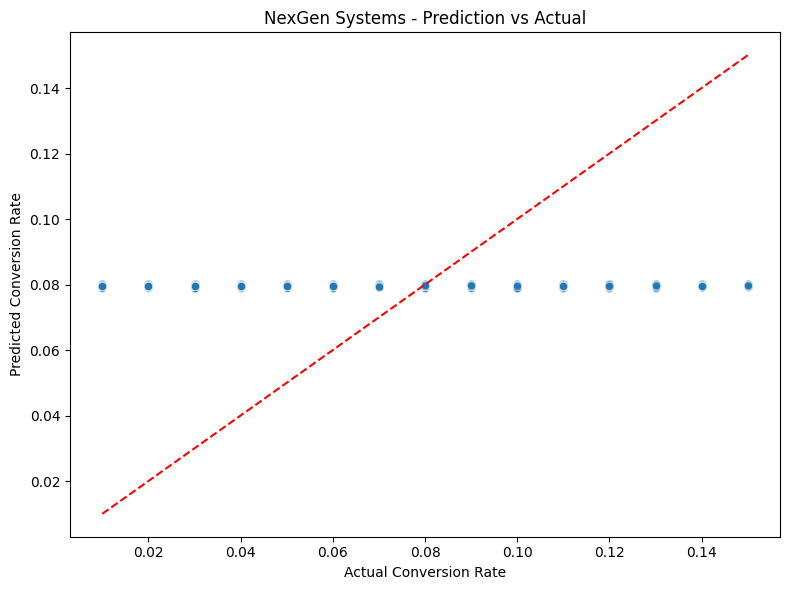

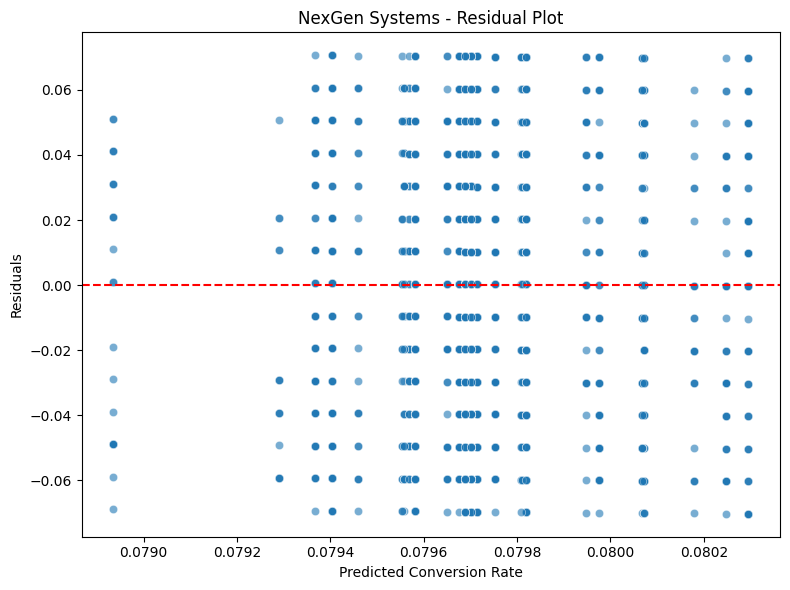

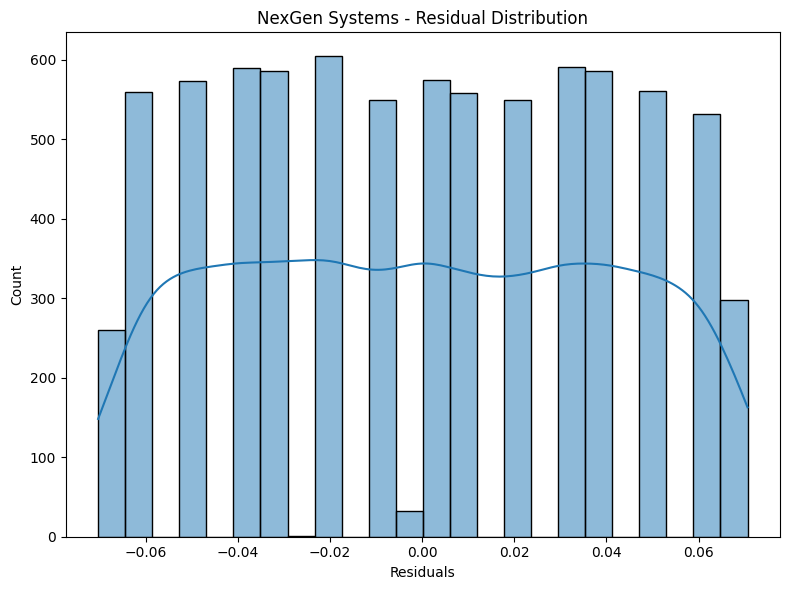

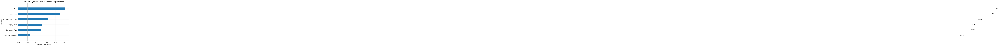


Final LightGBM Training for: Alpha Innovations
Training until validation scores don't improve for 50 rounds
[10]	valid_0's l1: 0.0352881	valid_0's rmse: 0.0408046
[20]	valid_0's l1: 0.035314	valid_0's rmse: 0.0408446
[30]	valid_0's l1: 0.0353924	valid_0's rmse: 0.040923
[40]	valid_0's l1: 0.0353951	valid_0's rmse: 0.0409502
[50]	valid_0's l1: 0.0354278	valid_0's rmse: 0.0409886
Early stopping, best iteration is:
[1]	valid_0's l1: 0.0351985	valid_0's rmse: 0.0407759
MAE  : 0.03520
MSE  : 0.00166
RMSE : 0.04078
R²   : -0.00009
Best Iteration: 1


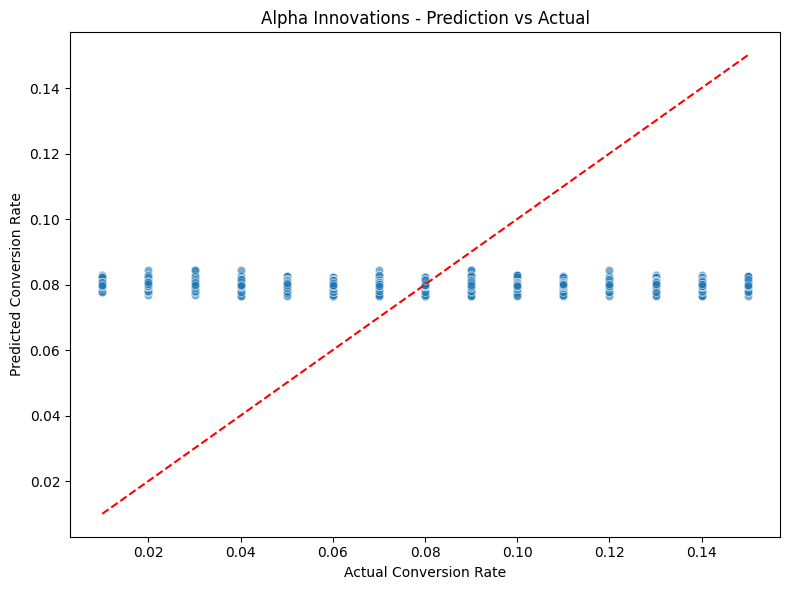

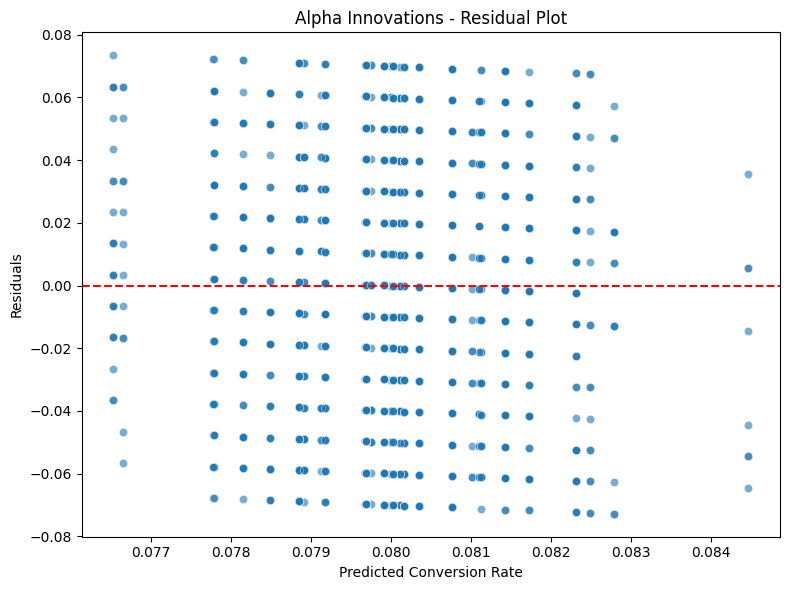

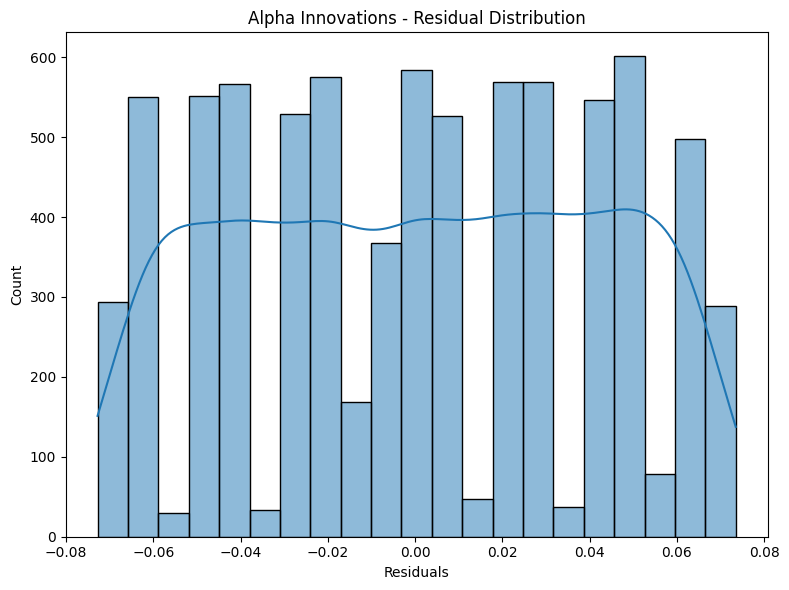

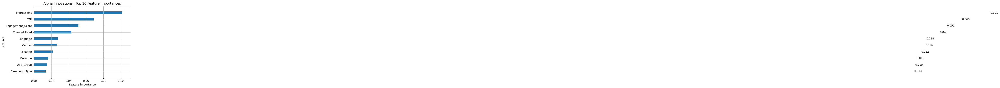


Final LightGBM Training for: DataTech Solutions
Training until validation scores don't improve for 50 rounds
[10]	valid_0's l1: 0.0351952	valid_0's rmse: 0.0406583
[20]	valid_0's l1: 0.0352323	valid_0's rmse: 0.0406869
[30]	valid_0's l1: 0.0352583	valid_0's rmse: 0.0407146
[40]	valid_0's l1: 0.035267	valid_0's rmse: 0.0407258
[50]	valid_0's l1: 0.0352833	valid_0's rmse: 0.0407436
Early stopping, best iteration is:
[1]	valid_0's l1: 0.0351356	valid_0's rmse: 0.0406385
MAE  : 0.03514
MSE  : 0.00165
RMSE : 0.04064
R²   : -0.00061
Best Iteration: 1


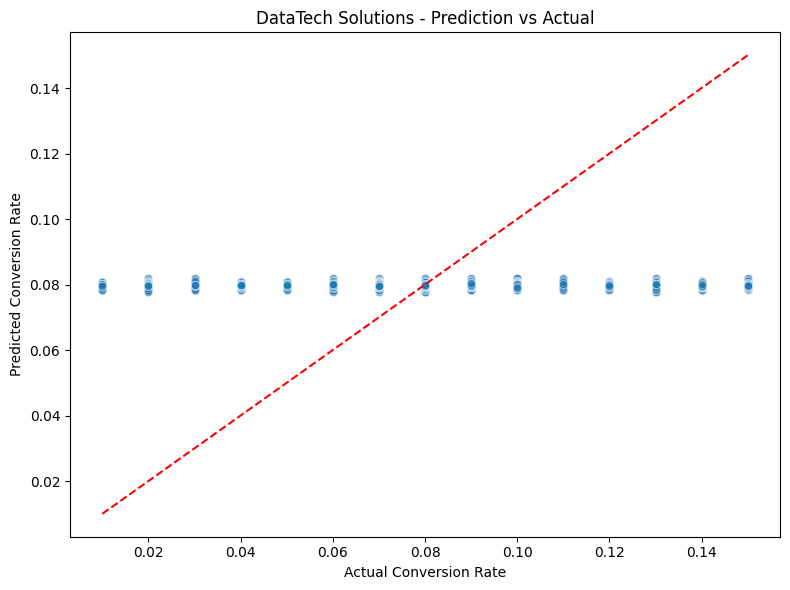

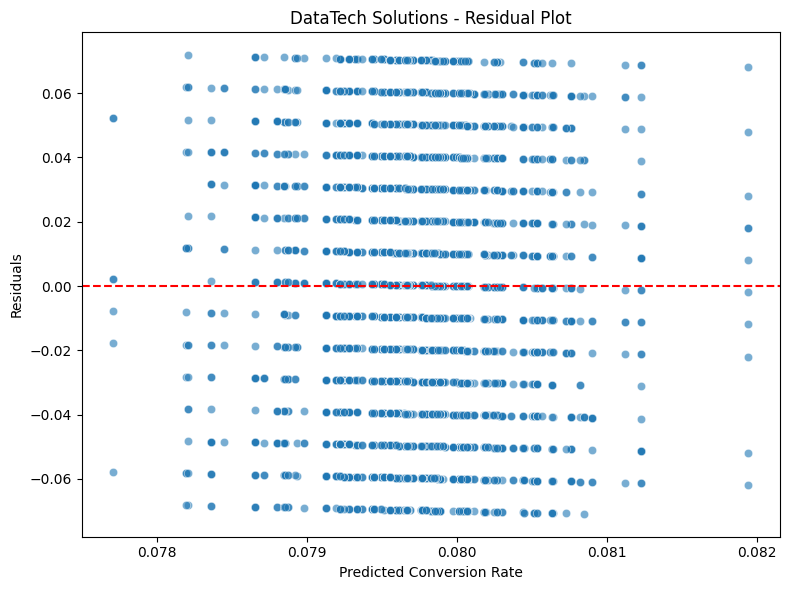

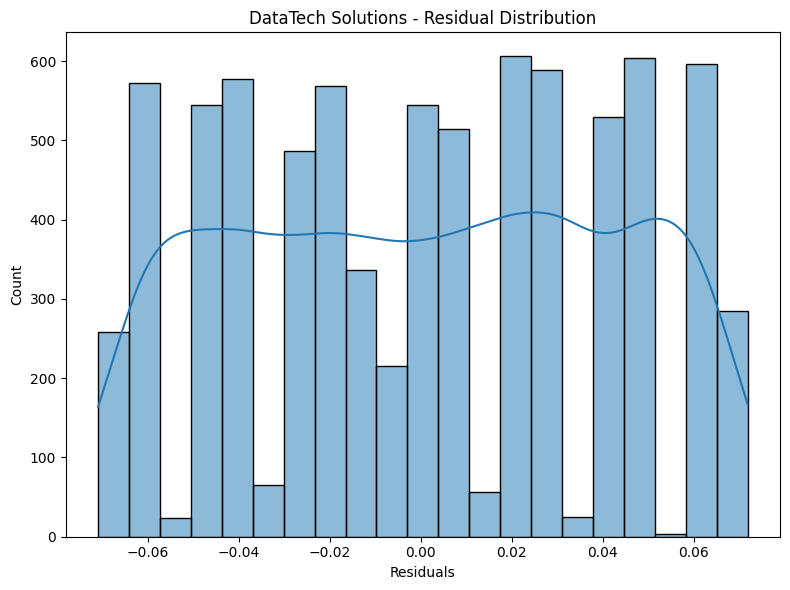

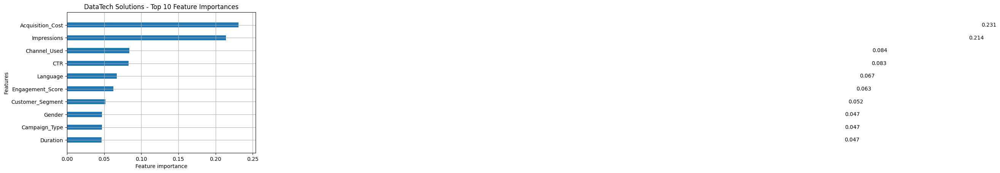


Final LightGBM Training for: TechCorp
Training until validation scores don't improve for 50 rounds
[10]	valid_0's l1: 0.0350757	valid_0's rmse: 0.0406598
[20]	valid_0's l1: 0.0351175	valid_0's rmse: 0.0407041
[30]	valid_0's l1: 0.0351488	valid_0's rmse: 0.0407416
[40]	valid_0's l1: 0.0351764	valid_0's rmse: 0.0407695
[50]	valid_0's l1: 0.0351946	valid_0's rmse: 0.0408007
Early stopping, best iteration is:
[1]	valid_0's l1: 0.0350169	valid_0's rmse: 0.0406275
MAE  : 0.03502
MSE  : 0.00165
RMSE : 0.04063
R²   : 0.00014
Best Iteration: 1


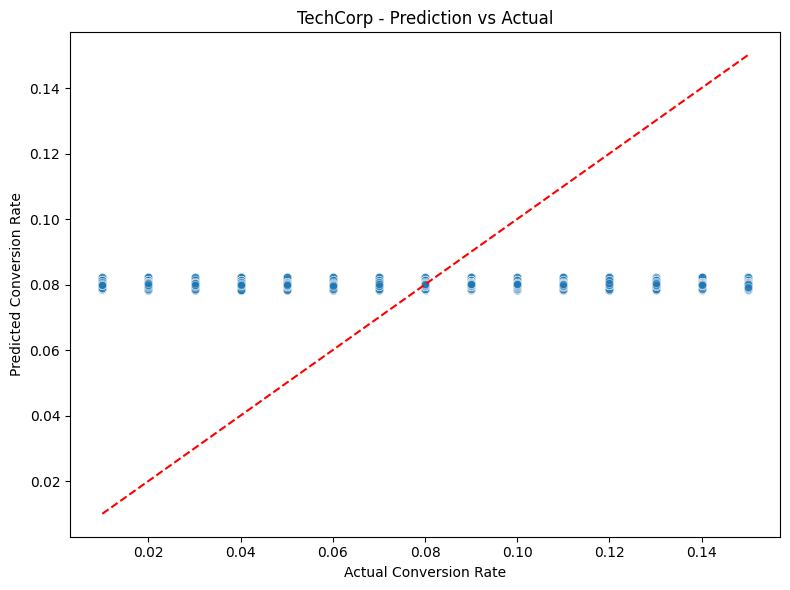

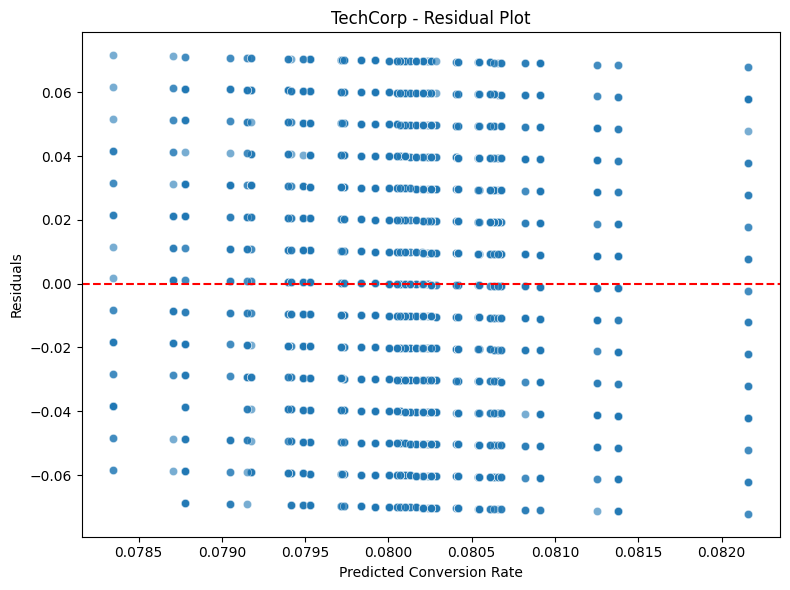

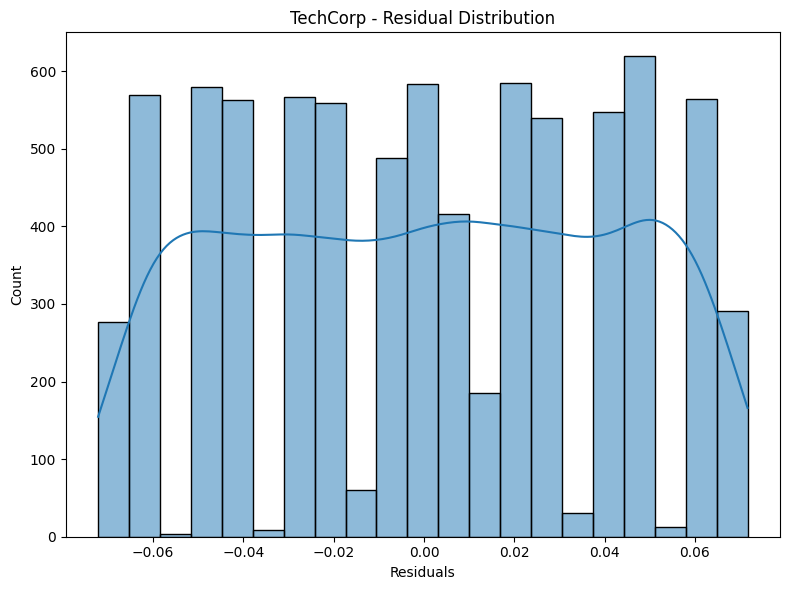

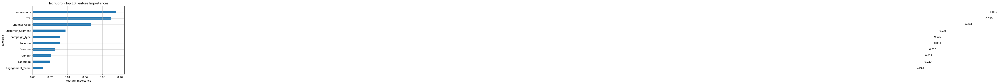

In [70]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Storage
lgb_final_models = {}
lgb_final_results = {}

# Loop through each company
for lgb_company in lgb_company_data:
    print(f"\nFinal LightGBM Training for: {lgb_company}")

    # Unpack data
    x_train = lgb_company_data[lgb_company]['x_train']
    x_val = lgb_company_data[lgb_company]['x_val']
    x_test = lgb_company_data[lgb_company]['x_test']
    y_train = lgb_company_data[lgb_company]['y_train']
    y_val = lgb_company_data[lgb_company]['y_val']
    y_test = lgb_company_data[lgb_company]['y_test']
    cat_cols = lgb_company_data[lgb_company]['categorical_cols']

    # Combine train + val for final training
    x_train_full = pd.concat([x_train, x_val])
    y_train_full = pd.concat([y_train, y_val])

    # Load best parameters
    best_params = lgb_best_params[lgb_company]
    best_params.update({
        'objective': 'regression',
        'metric': 'rmse',
        'random_state': 42,
        'boosting_type': 'gbdt',
        'n_estimators': 1000
    })

    # Final model
    model = lgb.LGBMRegressor(**best_params)

    model.fit(
        x_train_full, y_train_full,
        eval_set=[(x_test, y_test)],
        eval_metric='mae',
        categorical_feature=cat_cols,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
            lgb.log_evaluation(period=10)
        ]
    )

    best_iter = model.best_iteration_
    y_pred = model.predict(x_test, num_iteration=best_iter)

    # Evaluation
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"MAE  : {mae:.5f}")
    print(f"MSE  : {mse:.5f}")
    print(f"RMSE : {rmse:.5f}")
    print(f"R²   : {r2:.5f}")
    print(f"Best Iteration: {best_iter}")

    # Save results
    lgb_final_models[lgb_company] = model
    lgb_final_results[lgb_company] = {
        'mae': mae,
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'y_test': y_test,
        'y_pred': y_pred,
        'best_iteration': best_iter,
        'best_params': best_params
    }

    # --- Visualization ---
    residuals = y_test - y_pred

    # Prediction vs Actual
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Conversion Rate")
    plt.ylabel("Predicted Conversion Rate")
    plt.title(f"{lgb_company} - Prediction vs Actual")
    plt.tight_layout()
    plt.show()

    # Residual Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Conversion Rate")
    plt.ylabel("Residuals")
    plt.title(f"{lgb_company} - Residual Plot")
    plt.tight_layout()
    plt.show()

    # Residual Histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True)
    plt.title(f"{lgb_company} - Residual Distribution")
    plt.xlabel("Residuals")
    plt.tight_layout()
    plt.show()

    # Feature Importance
    lgb.plot_importance(model, max_num_features=10, importance_type='gain', height=0.4)
    plt.title(f"{lgb_company} - Top 10 Feature Importances")
    plt.tight_layout()
    plt.show()


In [72]:
pd.DataFrame(lgb_final_results).T

,mae,mse,rmse,r2,y_test,y_pred,best_iteration,best_params
Innovate Industries,0.035029,0.001656,0.040691,0.000061,115365 0.13 66078 0.06 129590 0.11 1...,"[0.08028445327656718, 0.08044408098627176, 0.0...",1,"{'num_leaves': 149, 'max_depth': 10, 'min_data..."
NexGen Systems,0.034724,0.001626,0.04032,-0.00003,28051 0.03 91661 0.09 32435 0.13 3...,"[0.07958087446127436, 0.07968904391591483, 0.0...",1,"{'num_leaves': 25, 'max_depth': 14, 'min_data_..."
Alpha Innovations,0.035199,0.001663,0.040776,-0.000093,9121 0.03 55800 0.06 125469 0.08 7...,"[0.08002000217552371, 0.08075762536210596, 0.0...",1,"{'num_leaves': 30, 'max_depth': 8, 'min_data_i..."
DataTech Solutions,0.035136,0.001651,0.040638,-0.000609,114685 0.03 145621 0.14 11447 0.02 4...,"[0.07865601860686601, 0.07965840565363892, 0.0...",1,"{'num_leaves': 116, 'max_depth': 7, 'min_data_..."
TechCorp,0.035017,0.001651,0.040628,0.000139,31551 0.03 4745 0.11 37694 0.04 1...,"[0.07983786114410059, 0.0802102112766016, 0.08...",1,"{'num_leaves': 40, 'max_depth': 8, 'min_data_i..."


CatBoost

In [75]:
# Section 1: Data Preparation for CatBoost (with shape logging)
from sklearn.model_selection import train_test_split
import pandas as pd

# Initialize storage dictionary
catboost_company_data = {}

# Get unique companies
catboost_unique_companies = catboost_data['Company'].unique()

# Define column lists
catboost_categorical_cols = [
    'Campaign_Type', 'Channel_Used', 'Location',
    'Language', 'Customer_Segment', 'Age_Group', 'Gender'
]

catboost_numerical_cols = [
    'Acquisition_Cost', 'ROI', 'Clicks', 'Impressions',
    'Engagement_Score', 'Duration', 'CTR'
]

# Process each company
for catboost_company in catboost_unique_companies:
    print(f"Processing: {catboost_company}")

    # Filter company data
    catboost_df = catboost_data[catboost_data['Company'] == catboost_company].copy()

    # Features and target
    catboost_x = catboost_df[catboost_categorical_cols + catboost_numerical_cols].copy()
    catboost_y = catboost_df['Conversion_Rate'].copy()

    print(f"📐 Original shape: X={catboost_x.shape}, Y={catboost_y.shape}")

    # Train+Val vs Test split (80/20)
    catboost_x_temp, catboost_x_test, catboost_y_temp, catboost_y_test = train_test_split(
        catboost_x, catboost_y, test_size=0.2, random_state=42
    )

    # Train vs Val split (80/20 of 80%)
    catboost_x_train, catboost_x_val, catboost_y_train, catboost_y_val = train_test_split(
        catboost_x_temp, catboost_y_temp, test_size=0.2, random_state=42
    )

    print(f"Split: Train={catboost_x_train.shape}, Val={catboost_x_val.shape}, Test={catboost_x_test.shape}")

    # Store in dictionary
    catboost_company_data[catboost_company] = {
        'x_train': catboost_x_train,
        'x_val': catboost_x_val,
        'x_test': catboost_x_test,
        'y_train': catboost_y_train,
        'y_val': catboost_y_val,
        'y_test': catboost_y_test,
        'categorical_cols': catboost_categorical_cols,
        'numerical_cols': catboost_numerical_cols
    }

# Optional: check sample dtype info
print("\nExample x_train info:")
print(catboost_x_train.info())


Processing: Innovate Industries
📐 Original shape: X=(39709, 14), Y=(39709,)
Split: Train=(25413, 14), Val=(6354, 14), Test=(7942, 14)
Processing: NexGen Systems
📐 Original shape: X=(39991, 14), Y=(39991,)
Split: Train=(25593, 14), Val=(6399, 14), Test=(7999, 14)
Processing: Alpha Innovations
📐 Original shape: X=(40051, 14), Y=(40051,)
Split: Train=(25632, 14), Val=(6408, 14), Test=(8011, 14)
Processing: DataTech Solutions
📐 Original shape: X=(40012, 14), Y=(40012,)
Split: Train=(25607, 14), Val=(6402, 14), Test=(8003, 14)
Processing: TechCorp
📐 Original shape: X=(40237, 14), Y=(40237,)
Split: Train=(25751, 14), Val=(6438, 14), Test=(8048, 14)

Example x_train info:
<class 'pandas.core.frame.DataFrame'>
Index: 25751 entries, 93720 to 51937
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Campaign_Type     25751 non-null  object 
 1   Channel_Used      25751 non-null  object 
 2   Location          25751 n


Training CatBoost for: Innovate Industries
0:	learn: 0.0347044	test: 0.0349304	best: 0.0349304 (0)	total: 160ms	remaining: 2m 39s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03493037025
bestIteration = 0

Shrink model to first 1 iterations.
Test MAE : 0.03503
Test MSE : 0.00166
Test RMSE: 0.04069
Test R²  : -0.00000


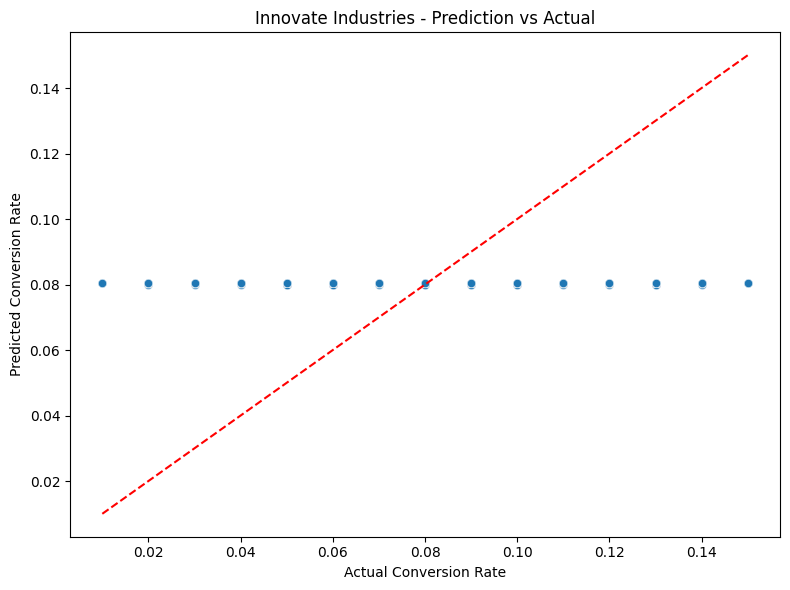

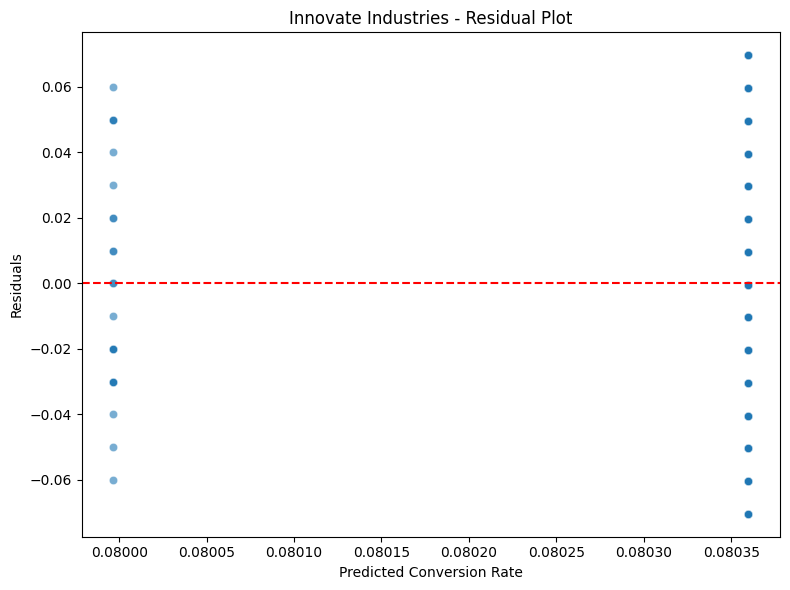

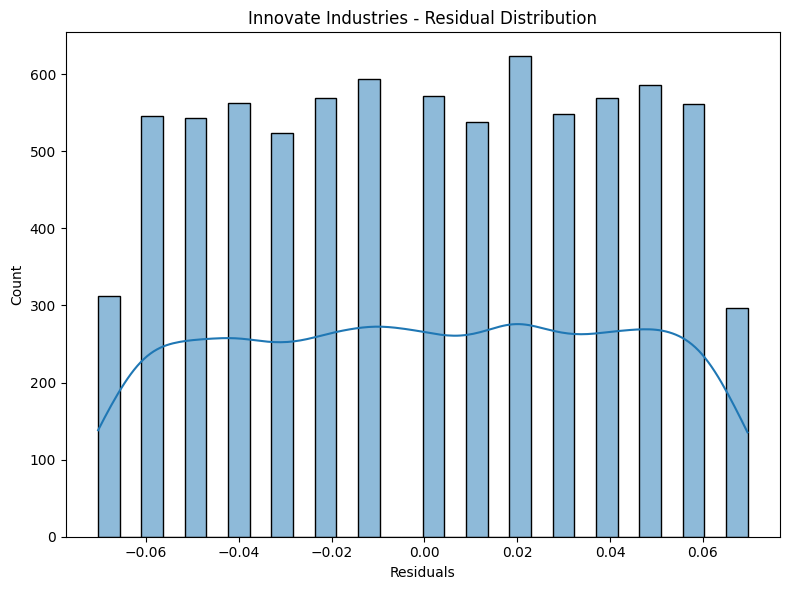


Training CatBoost for: NexGen Systems
0:	learn: 0.0349337	test: 0.0352986	best: 0.0352986 (0)	total: 98.1ms	remaining: 1m 38s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03529718067
bestIteration = 2

Shrink model to first 3 iterations.
Test MAE : 0.03473
Test MSE : 0.00163
Test RMSE: 0.04032
Test R²  : -0.00009


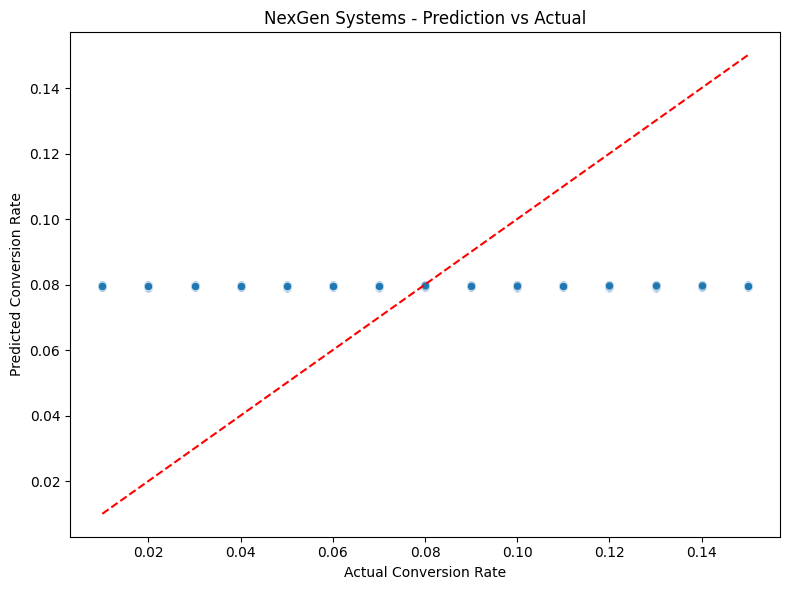

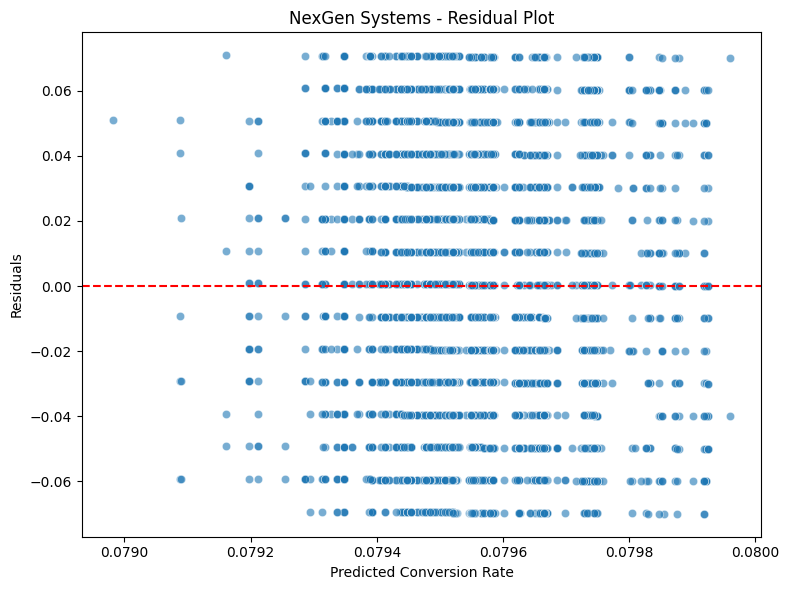

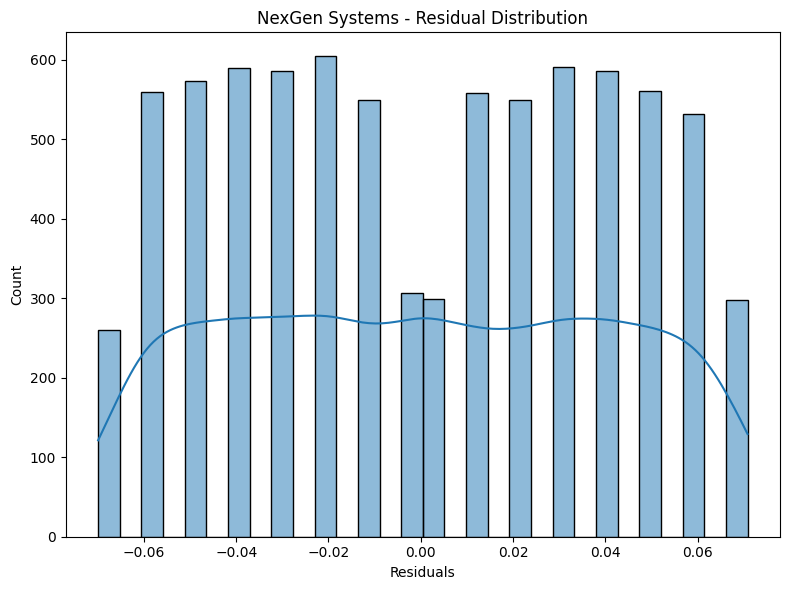


Training CatBoost for: Alpha Innovations
0:	learn: 0.0351856	test: 0.0352002	best: 0.0352002 (0)	total: 86.7ms	remaining: 1m 26s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03520023353
bestIteration = 0

Shrink model to first 1 iterations.
Test MAE : 0.03518
Test MSE : 0.00166
Test RMSE: 0.04077
Test R²  : -0.00004


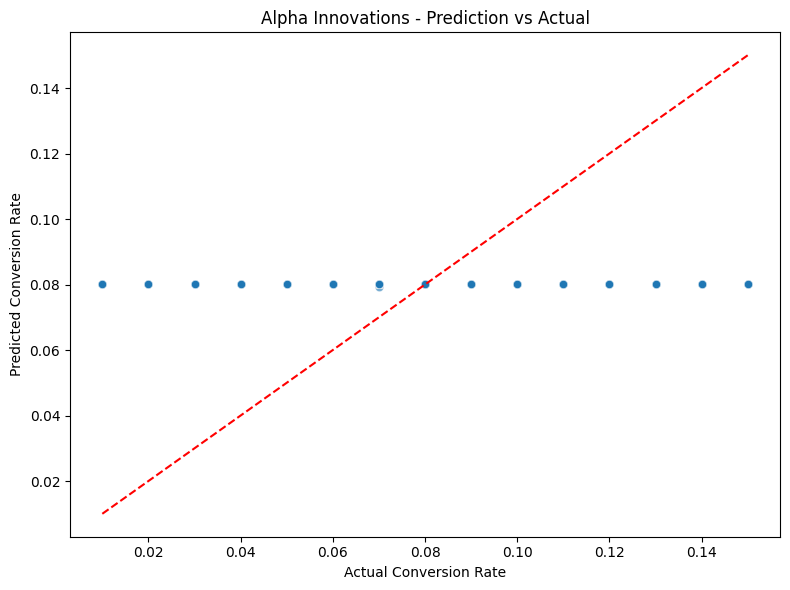

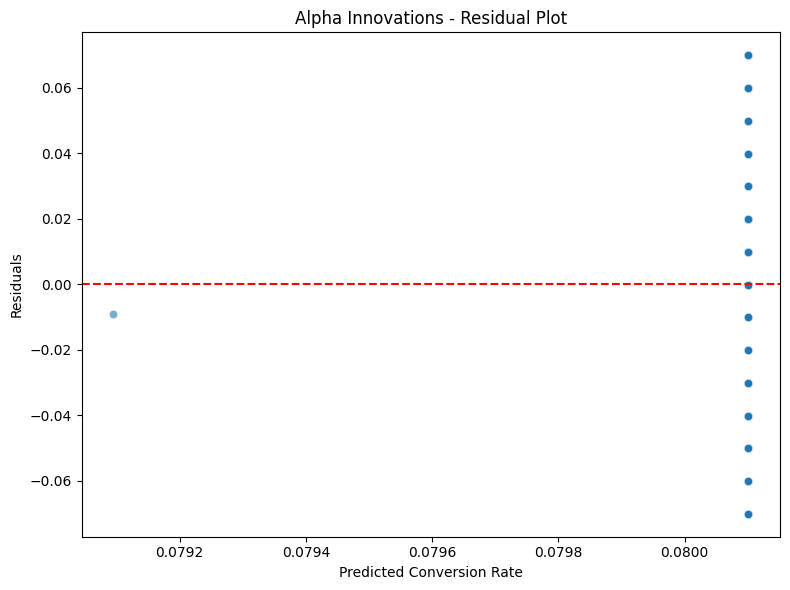

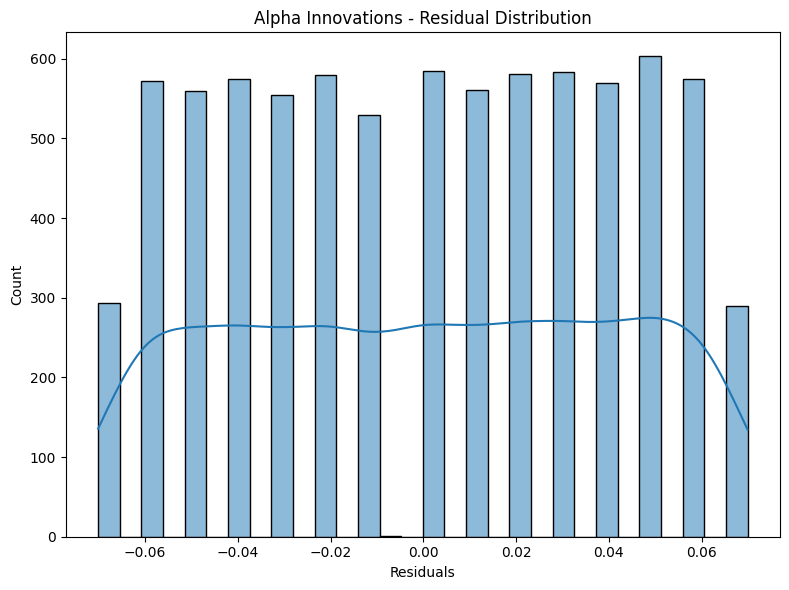


Training CatBoost for: DataTech Solutions
0:	learn: 0.0351126	test: 0.0351422	best: 0.0351422 (0)	total: 20.8ms	remaining: 20.8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.035141661
bestIteration = 1

Shrink model to first 2 iterations.
Test MAE : 0.03512
Test MSE : 0.00165
Test RMSE: 0.04064
Test R²  : -0.00044


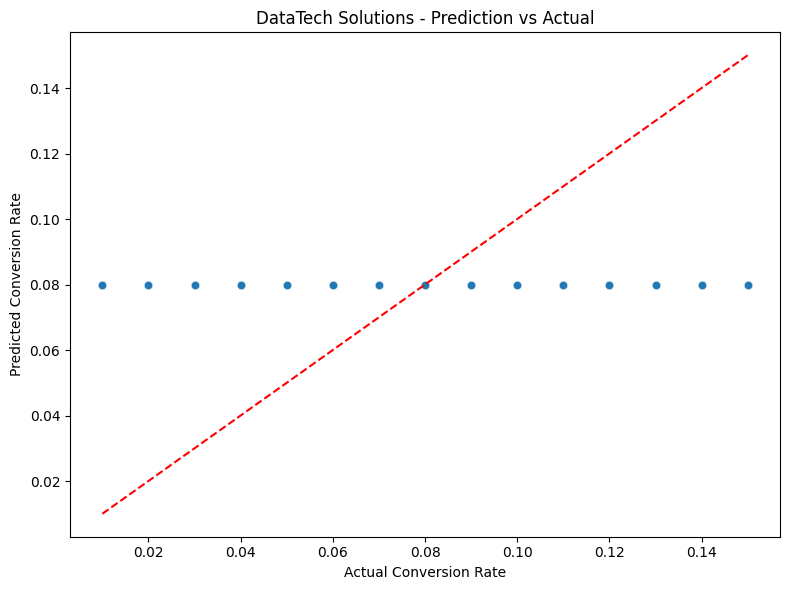

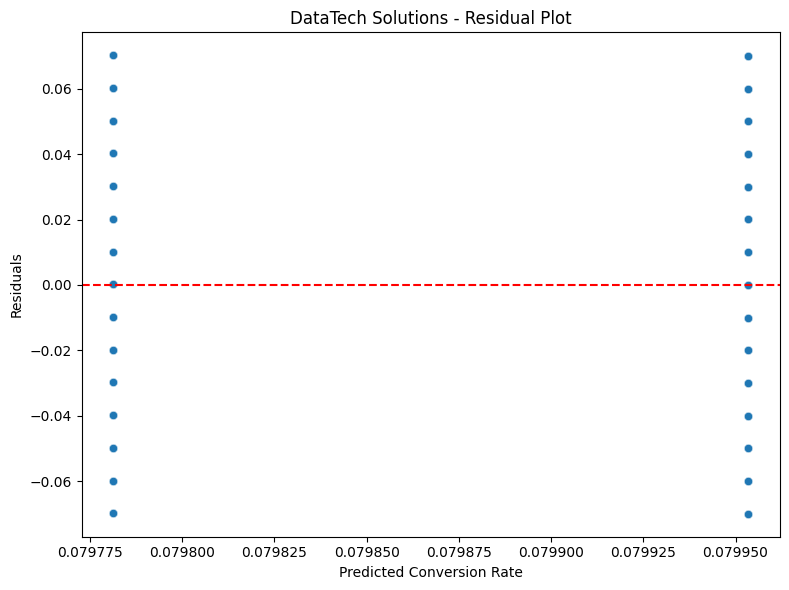

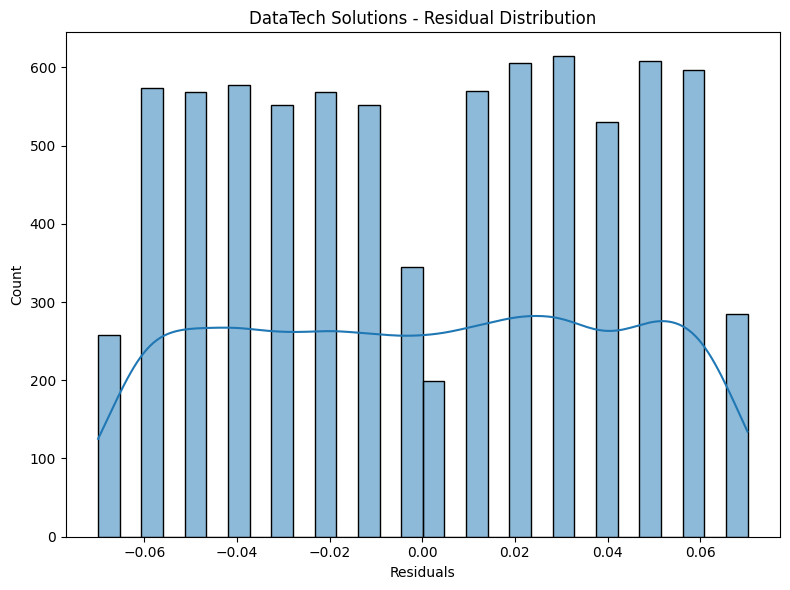


Training CatBoost for: TechCorp
0:	learn: 0.0349262	test: 0.0351369	best: 0.0351369 (0)	total: 85.5ms	remaining: 1m 25s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03513694156
bestIteration = 0

Shrink model to first 1 iterations.
Test MAE : 0.03500
Test MSE : 0.00165
Test RMSE: 0.04063
Test R²  : -0.00007


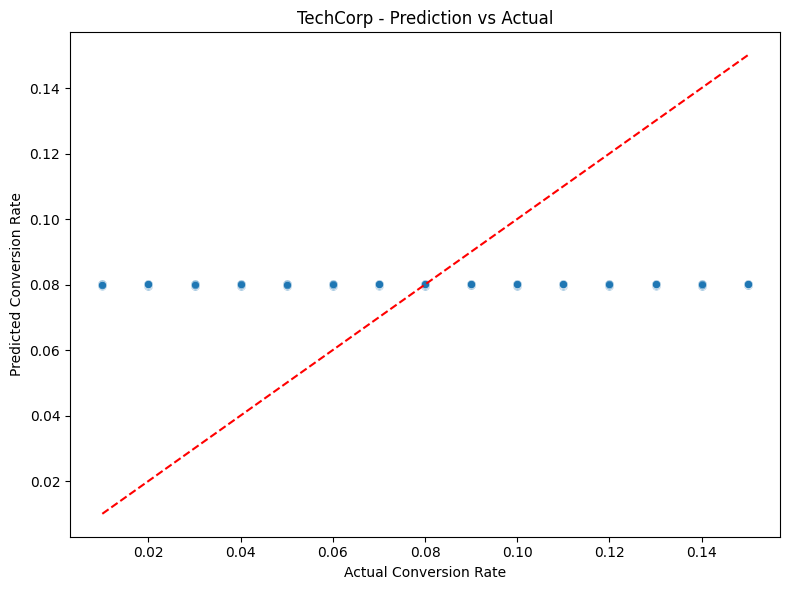

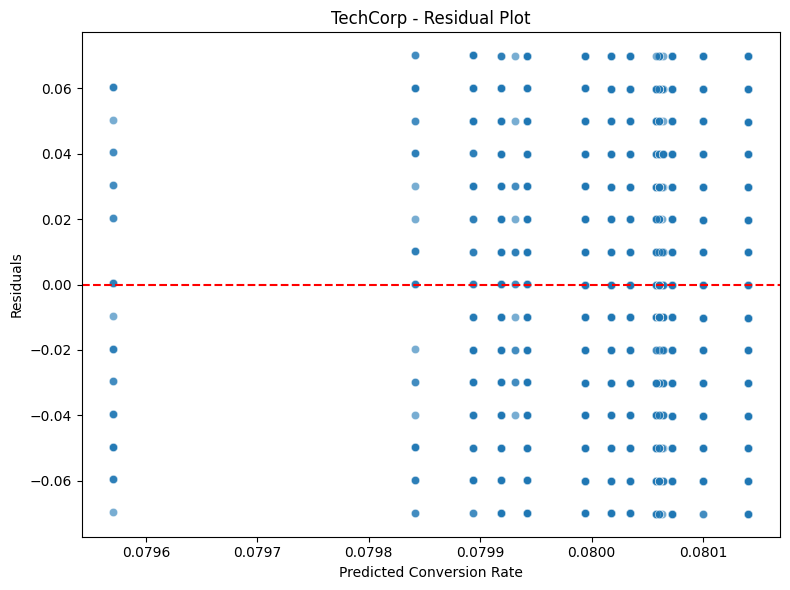

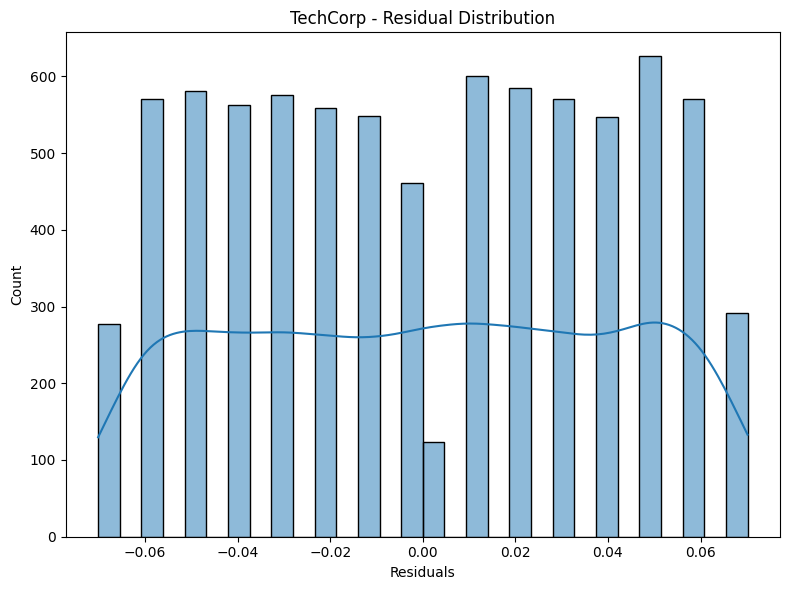

In [78]:
# Section 2: CatBoost Training + Evaluation
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Storage
catboost_models = {}
catboost_results = {}

# Loop over each company
for catboost_company in catboost_company_data:
    print(f"\nTraining CatBoost for: {catboost_company}")

    # Unpack data
    x_train = catboost_company_data[catboost_company]['x_train']
    x_val = catboost_company_data[catboost_company]['x_val']
    x_test = catboost_company_data[catboost_company]['x_test']
    y_train = catboost_company_data[catboost_company]['y_train']
    y_val = catboost_company_data[catboost_company]['y_val']
    y_test = catboost_company_data[catboost_company]['y_test']
    cat_cols = catboost_company_data[catboost_company]['categorical_cols']

    # Prepare Pool with categorical feature indices
    cat_features_indices = [x_train.columns.get_loc(col) for col in cat_cols]
    train_pool = Pool(x_train, y_train, cat_features=cat_features_indices)
    val_pool = Pool(x_val, y_val, cat_features=cat_features_indices)
    test_pool = Pool(x_test, cat_features=cat_features_indices)

    # Define and train model
    cat_model = CatBoostRegressor(
        iterations=1000,
        learning_rate=0.05,
        depth=6,
        loss_function='RMSE',
        eval_metric='MAE',
        early_stopping_rounds=50,
        verbose=100,
        random_seed=42
    )

    cat_model.fit(train_pool, eval_set=val_pool)

    # Best iteration
    best_iter = cat_model.get_best_iteration()

    # Predict
    y_pred = cat_model.predict(test_pool)

    # Evaluation
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Test MAE : {mae:.5f}")
    print(f"Test MSE : {mse:.5f}")
    print(f"Test RMSE: {rmse:.5f}")
    print(f"Test R²  : {r2:.5f}")

    # Store model and results
    catboost_models[catboost_company] = cat_model
    catboost_results[catboost_company] = {
        'mae': mae,
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'y_test': y_test,
        'y_pred': y_pred,
        'best_iteration': best_iter
    }

    # --- Visualizations ---

    # Prediction vs Actual
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Conversion Rate")
    plt.ylabel("Predicted Conversion Rate")
    plt.title(f"{catboost_company} - Prediction vs Actual")
    plt.tight_layout()
    plt.show()

    # Residual Plot
    residuals = y_test - y_pred
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Conversion Rate")
    plt.ylabel("Residuals")
    plt.title(f"{catboost_company} - Residual Plot")
    plt.tight_layout()
    plt.show()

    # Residual Histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True, bins=30)
    plt.title(f"{catboost_company} - Residual Distribution")
    plt.xlabel("Residuals")
    plt.tight_layout()
    plt.show()


In [79]:
# Display metrics for all companies
pd.DataFrame(catboost_results).T

,mae,mse,rmse,r2,y_test,y_pred,best_iteration
Innovate Industries,0.035026,0.001656,0.040692,-0.000002,115365 0.13 66078 0.06 129590 0.11 1...,"[0.08035976101801676, 0.08035976101801676, 0.0...",0
NexGen Systems,0.034732,0.001626,0.040321,-0.000086,28051 0.03 91661 0.09 32435 0.13 3...,"[0.0795517615121854, 0.07947785534665949, 0.07...",2
Alpha Innovations,0.035181,0.001663,0.040775,-0.000039,9121 0.03 55800 0.06 125469 0.08 7...,"[0.08010074987589044, 0.08010074987589044, 0.0...",0
DataTech Solutions,0.035117,0.001651,0.040635,-0.000444,114685 0.03 145621 0.14 11447 0.02 4...,"[0.07978137614971322, 0.07978137614971322, 0.0...",1
TechCorp,0.035004,0.001651,0.040632,-0.000075,31551 0.03 4745 0.11 37694 0.04 1...,"[0.08003486918056198, 0.07991829704347488, 0.0...",0


In [80]:
# Section 3: Optuna Hyperparameter Tuning for CatBoost
import optuna
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_squared_error
import numpy as np

# Storage
catboost_optuna_study = {}
catboost_best_params = {}

# Objective function
def catboost_objective(trial, x_train, y_train, x_val, y_val, cat_cols):

    cat_features_indices = [x_train.columns.get_loc(col) for col in cat_cols]

    train_pool = Pool(x_train, y_train, cat_features=cat_features_indices)
    val_pool = Pool(x_val, y_val, cat_features=cat_features_indices)

    params = {
        "iterations": 1000,
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
        "depth": trial.suggest_int("depth", 4, 10),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1, 10),
        "random_strength": trial.suggest_float("random_strength", 1e-9, 10.0, log=True),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "loss_function": "RMSE",
        "eval_metric": "RMSE",
        "random_seed": 42,
        "verbose": False
    }

    model = CatBoostRegressor(**params)

    model.fit(
        train_pool,
        eval_set=val_pool,
        early_stopping_rounds=50
    )

    preds = model.predict(val_pool)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    return rmse


In [81]:
# Section 3B: Run Optuna tuning per company
optuna.logging.set_verbosity(optuna.logging.WARNING)

for catboost_company in catboost_company_data:
    print(f"\nRunning Optuna for: {catboost_company}")
    
    x_train = catboost_company_data[catboost_company]['x_train']
    y_train = catboost_company_data[catboost_company]['y_train']
    x_val = catboost_company_data[catboost_company]['x_val']
    y_val = catboost_company_data[catboost_company]['y_val']
    cat_cols = catboost_company_data[catboost_company]['categorical_cols']

    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: catboost_objective(trial, x_train, y_train, x_val, y_val, cat_cols),
                   n_trials=50, timeout=600)

    print(f"Best RMSE: {study.best_value:.5f}")
    print(f"Best params for {catboost_company}:\n{study.best_params}")

    catboost_optuna_study[catboost_company] = study
    catboost_best_params[catboost_company] = study.best_params



Running Optuna for: Innovate Industries
Best RMSE: 0.04060
Best params for Innovate Industries:
{'learning_rate': 0.19746707651176937, 'depth': 8, 'l2_leaf_reg': 2.019527641163725, 'random_strength': 0.799466569835583, 'bagging_temperature': 0.5769494675027784, 'border_count': 130}

Running Optuna for: NexGen Systems
Best RMSE: 0.04069
Best params for NexGen Systems:
{'learning_rate': 0.1065570076344928, 'depth': 5, 'l2_leaf_reg': 7.644139241041026, 'random_strength': 9.92786704552723e-07, 'bagging_temperature': 0.5360859491125953, 'border_count': 140}

Running Optuna for: Alpha Innovations
Best RMSE: 0.04084
Best params for Alpha Innovations:
{'learning_rate': 0.18856049327655428, 'depth': 10, 'l2_leaf_reg': 6.89437636033354, 'random_strength': 2.95585660562717e-05, 'bagging_temperature': 0.4191586523532313, 'border_count': 81}

Running Optuna for: DataTech Solutions
Best RMSE: 0.04076
Best params for DataTech Solutions:
{'learning_rate': 0.021433339369913425, 'depth': 8, 'l2_leaf_re


Final CatBoost Training for: Innovate Industries
0:	learn: 0.0347221	test: 0.0350287	best: 0.0350287 (0)	total: 149ms	remaining: 2m 28s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03502874719
bestIteration = 0

Shrink model to first 1 iterations.
MAE  : 0.03503
MSE  : 0.00166
RMSE : 0.04069
R²   : -0.00002
Best Iteration: 0


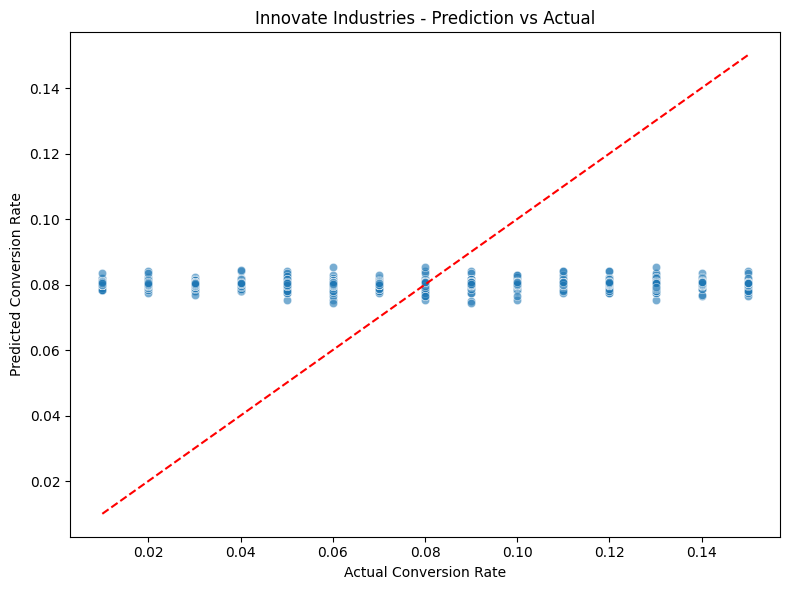

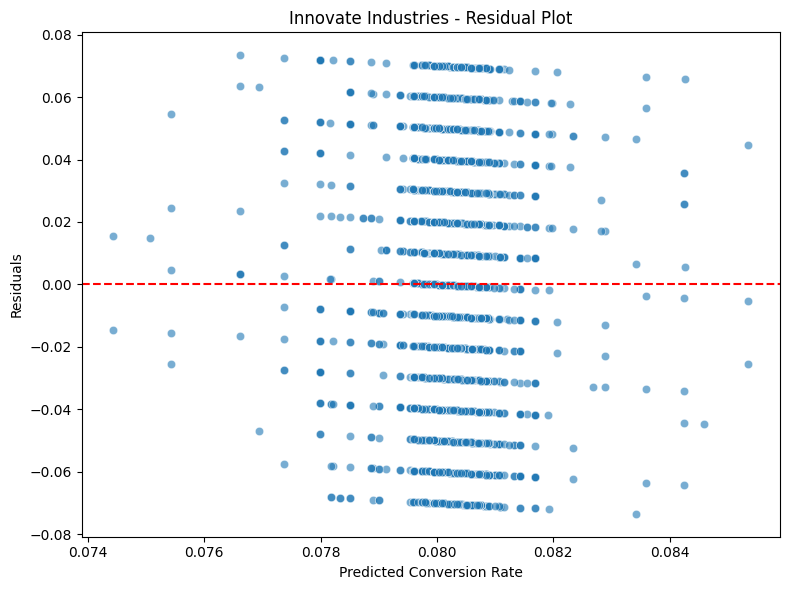

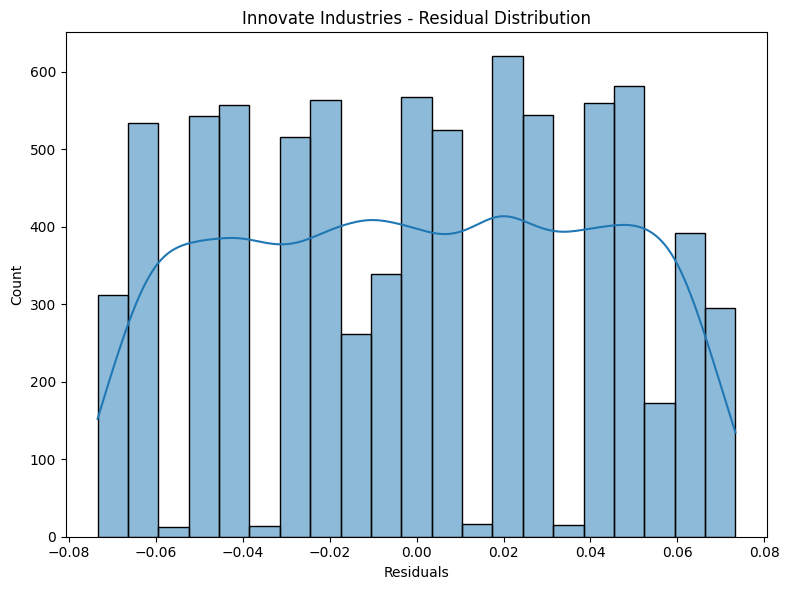


🔍 Feature Importance DataFrame:
         Feature Id  Importances
0  Engagement_Score    15.109898
1          Language    14.335106
2         Age_Group    14.119596
3  Acquisition_Cost    13.020301
4               ROI    12.716959


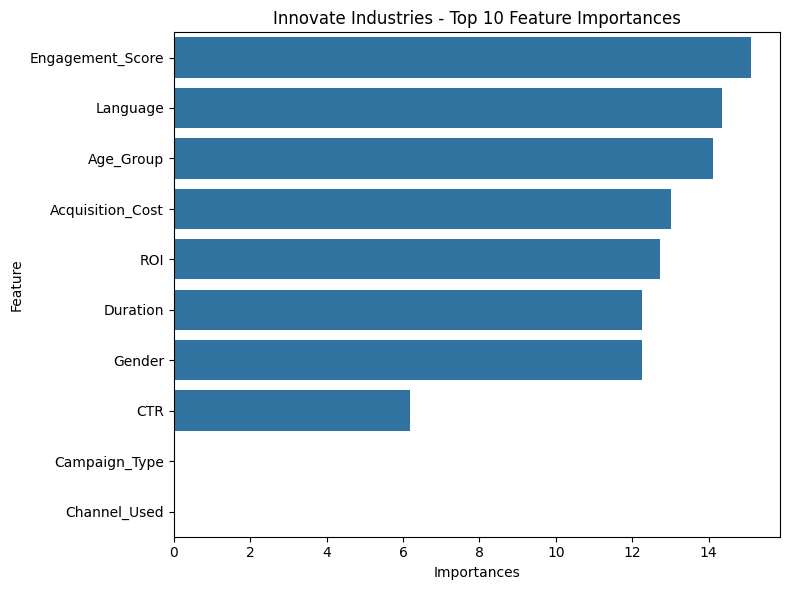


Final CatBoost Training for: NexGen Systems
0:	learn: 0.0349924	test: 0.0347255	best: 0.0347255 (0)	total: 72.6ms	remaining: 1m 12s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03472547406
bestIteration = 0

Shrink model to first 1 iterations.
MAE  : 0.03473
MSE  : 0.00163
RMSE : 0.04032
R²   : -0.00022
Best Iteration: 0


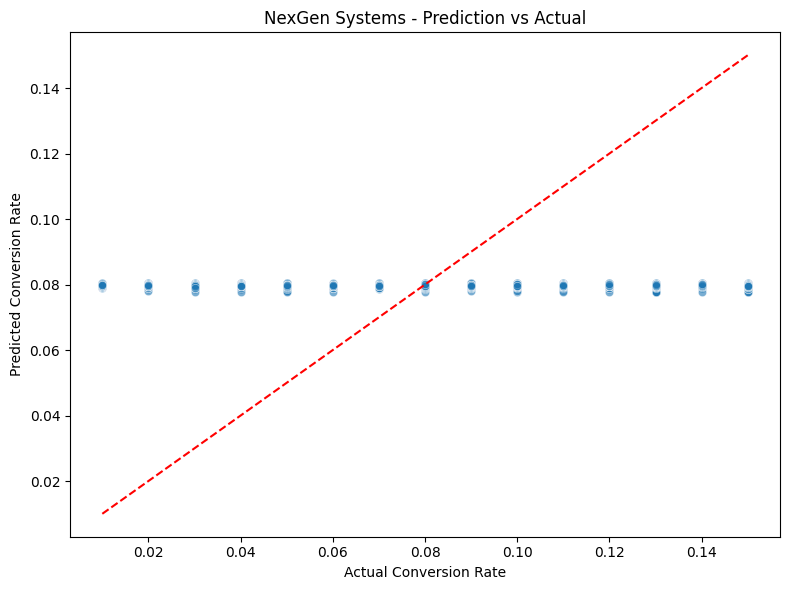

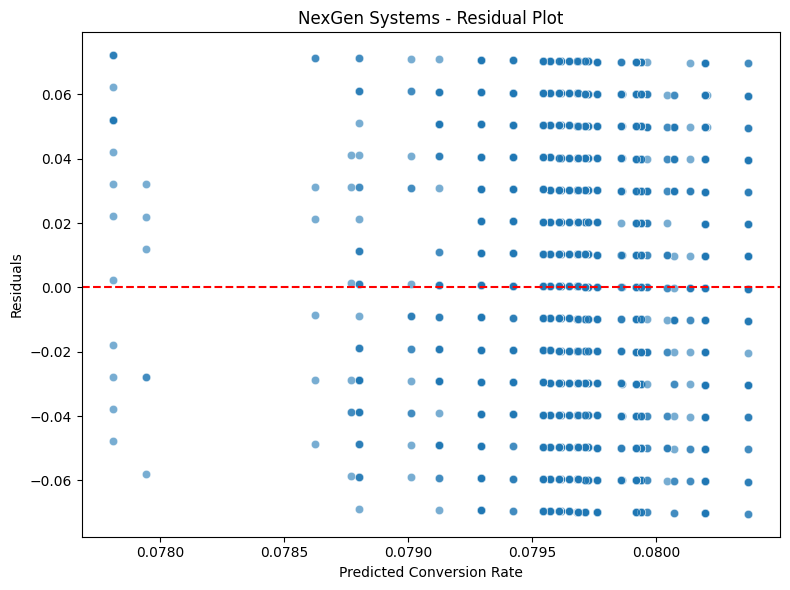

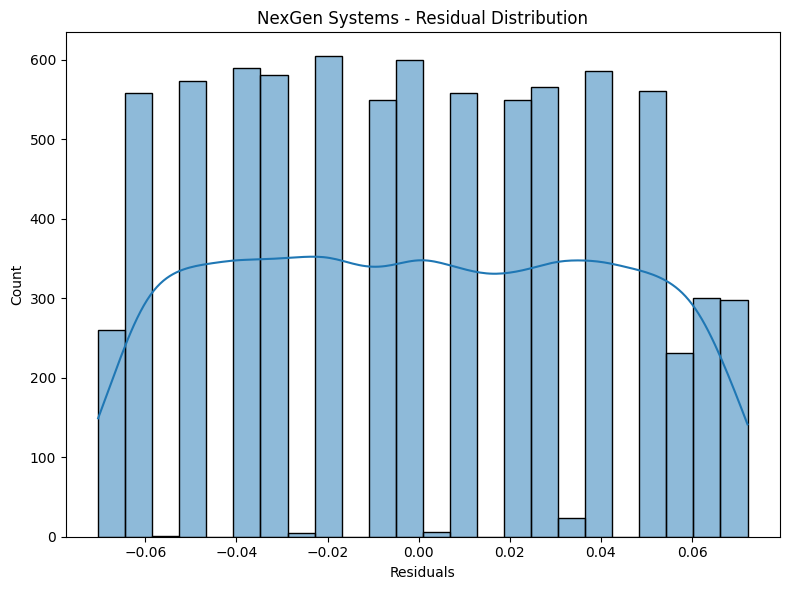


🔍 Feature Importance DataFrame:
         Feature Id  Importances
0               ROI    27.660906
1          Duration    22.012301
2               CTR    19.860081
3  Acquisition_Cost    16.645825
4  Engagement_Score    13.820887


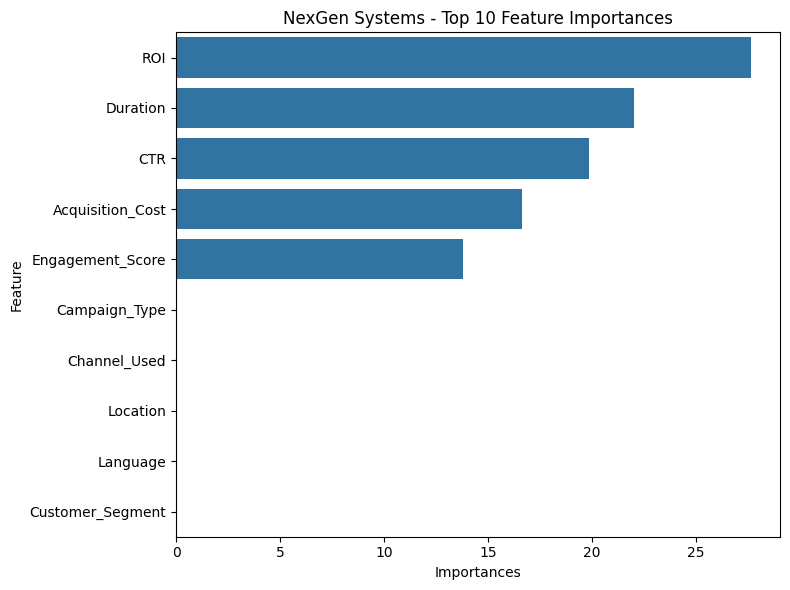


Final CatBoost Training for: Alpha Innovations
0:	learn: 0.0351288	test: 0.0351944	best: 0.0351944 (0)	total: 182ms	remaining: 3m 1s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03519443666
bestIteration = 0

Shrink model to first 1 iterations.
MAE  : 0.03520
MSE  : 0.00166
RMSE : 0.04075
R²   : 0.00098
Best Iteration: 0


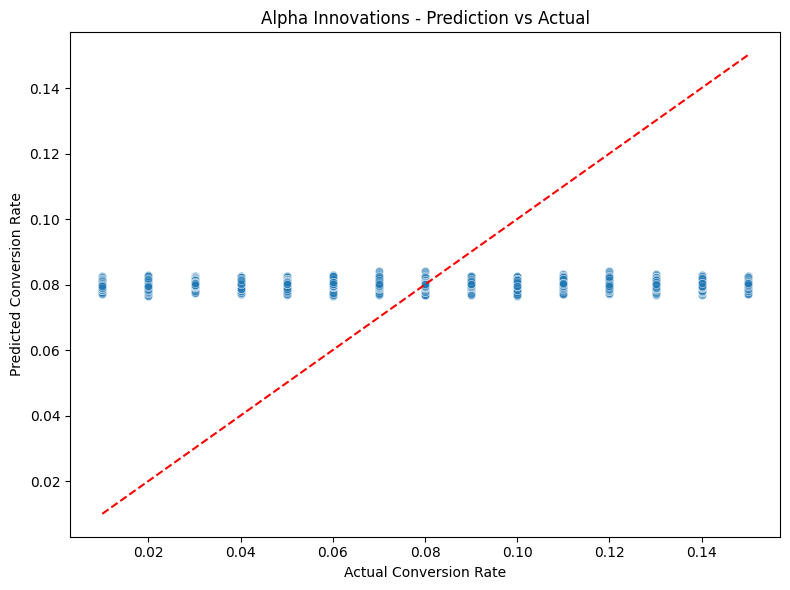

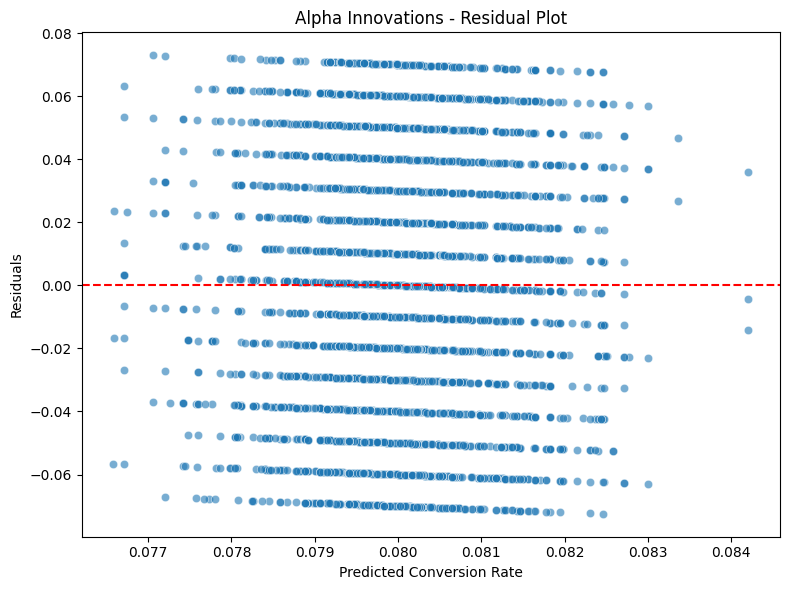

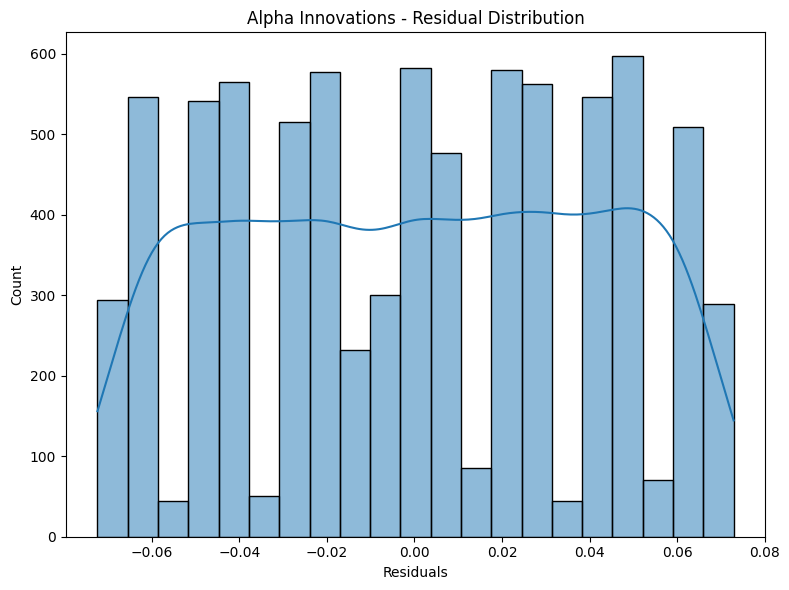


🔍 Feature Importance DataFrame:
         Feature Id  Importances
0  Engagement_Score    13.182195
1          Duration    12.415499
2      Channel_Used    11.727194
3     Campaign_Type    11.693736
4       Impressions    11.092273


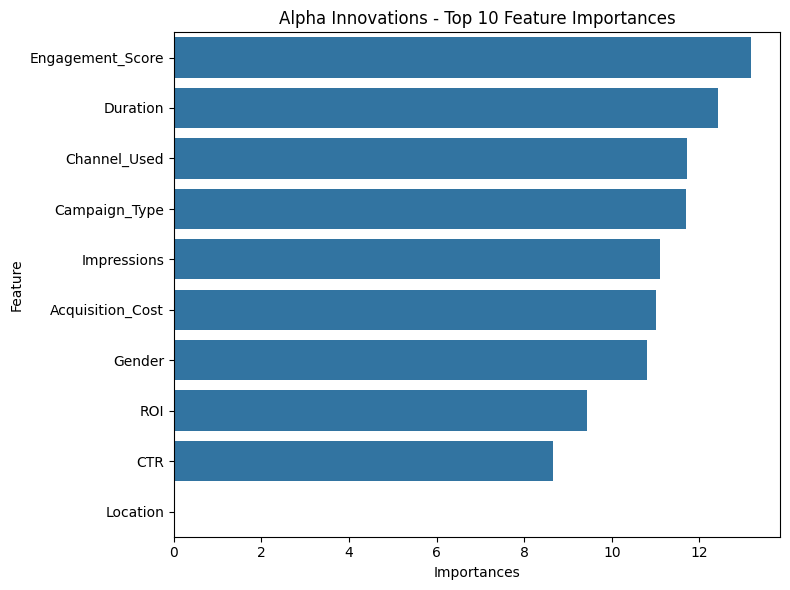


Final CatBoost Training for: DataTech Solutions
0:	learn: 0.0351206	test: 0.0351259	best: 0.0351259 (0)	total: 199ms	remaining: 3m 18s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03512522184
bestIteration = 1

Shrink model to first 2 iterations.
MAE  : 0.03513
MSE  : 0.00165
RMSE : 0.04064
R²   : -0.00060
Best Iteration: 1


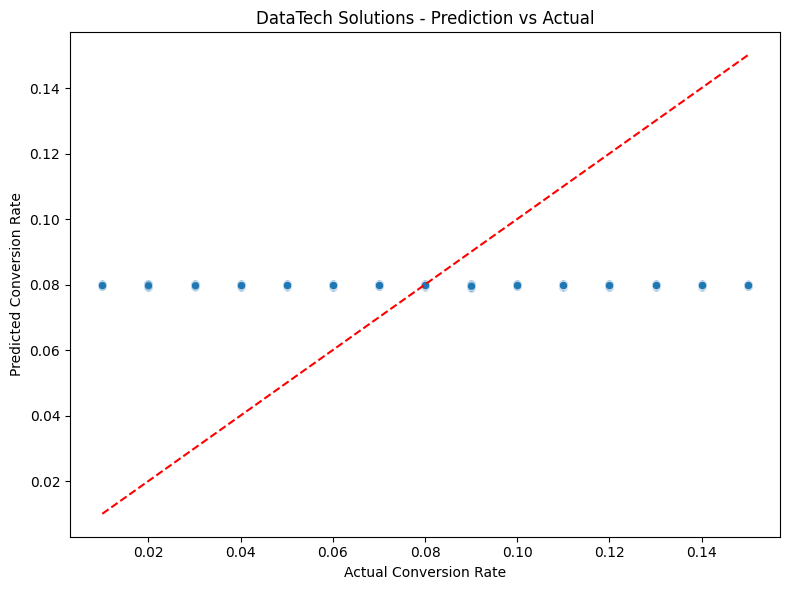

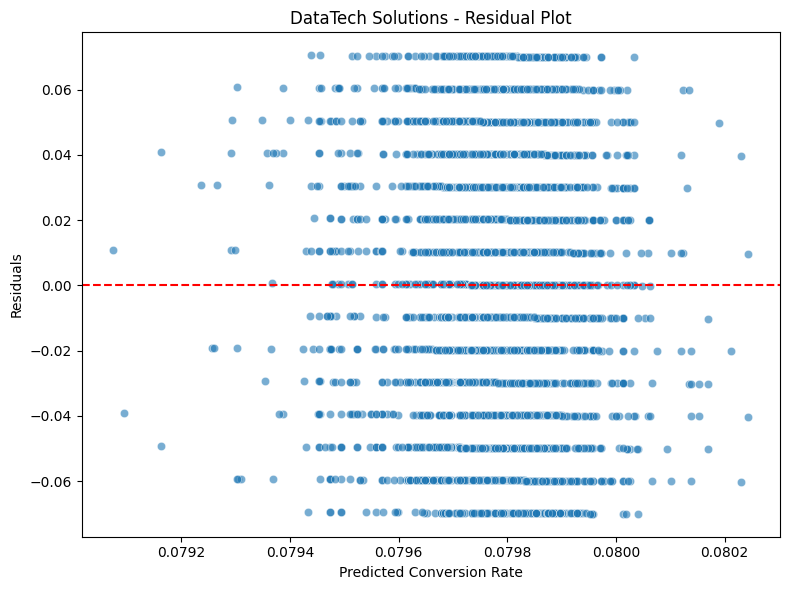

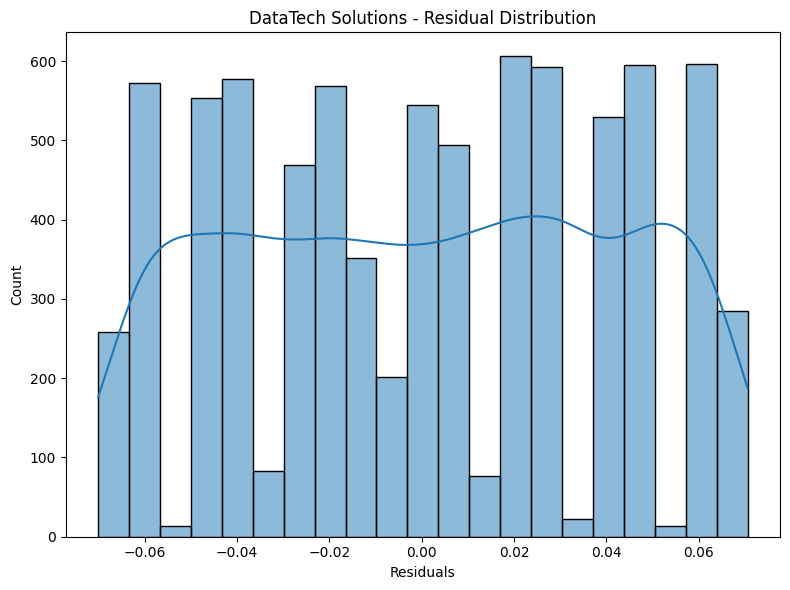


🔍 Feature Importance DataFrame:
         Feature Id  Importances
0     Campaign_Type    17.295906
1  Acquisition_Cost    16.035103
2  Engagement_Score    11.862602
3            Clicks    11.258008
4          Duration    10.587882


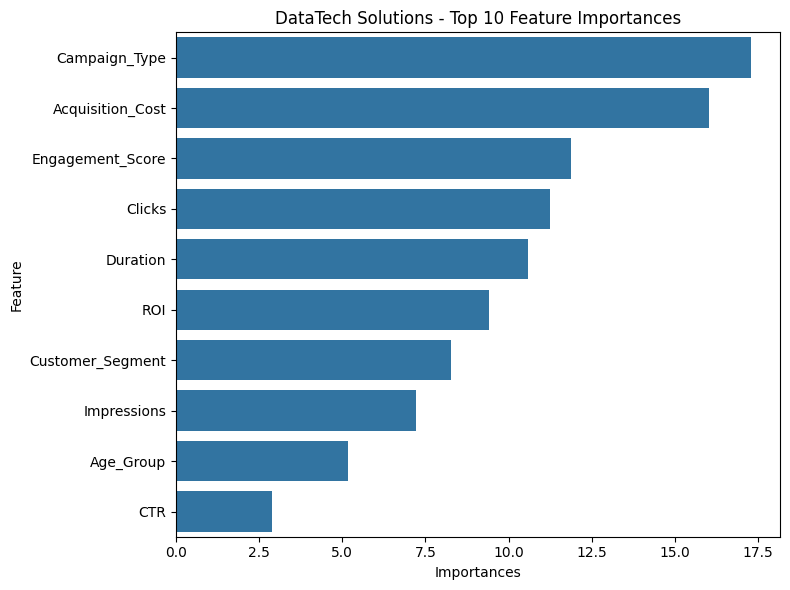


Final CatBoost Training for: TechCorp
0:	learn: 0.0349371	test: 0.0350508	best: 0.0350508 (0)	total: 207ms	remaining: 3m 27s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.03505079244
bestIteration = 0

Shrink model to first 1 iterations.
MAE  : 0.03505
MSE  : 0.00165
RMSE : 0.04064
R²   : -0.00068
Best Iteration: 0


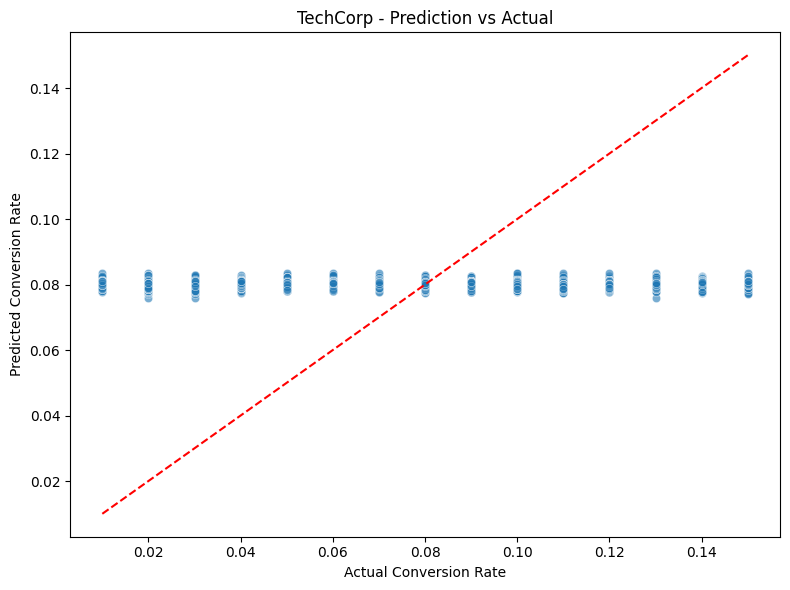

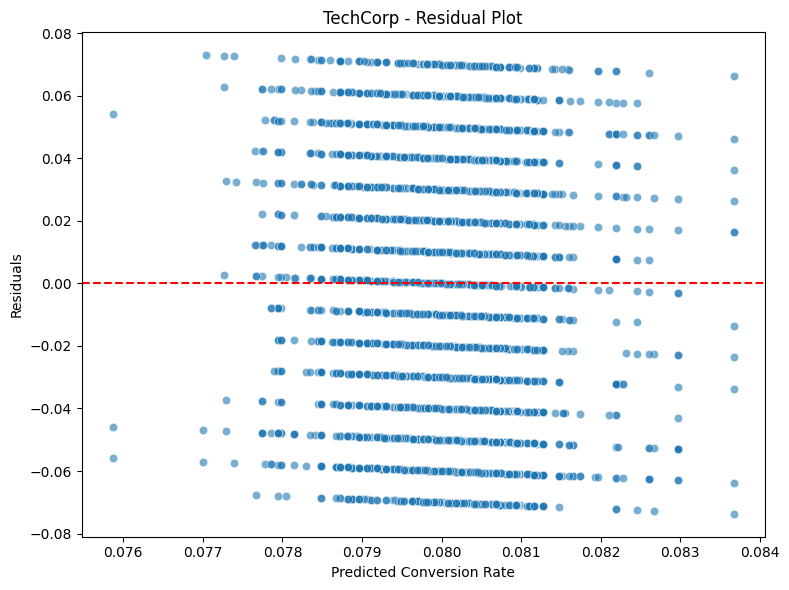

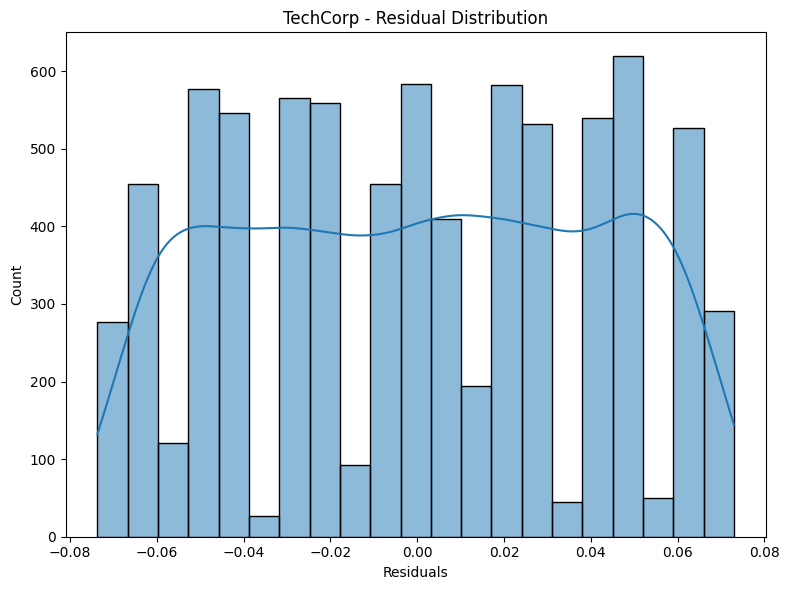


🔍 Feature Importance DataFrame:
    Feature Id  Importances
0       Gender    14.580212
1          ROI    14.027582
2  Impressions    13.417015
3     Location    13.139501
4    Age_Group    11.979791


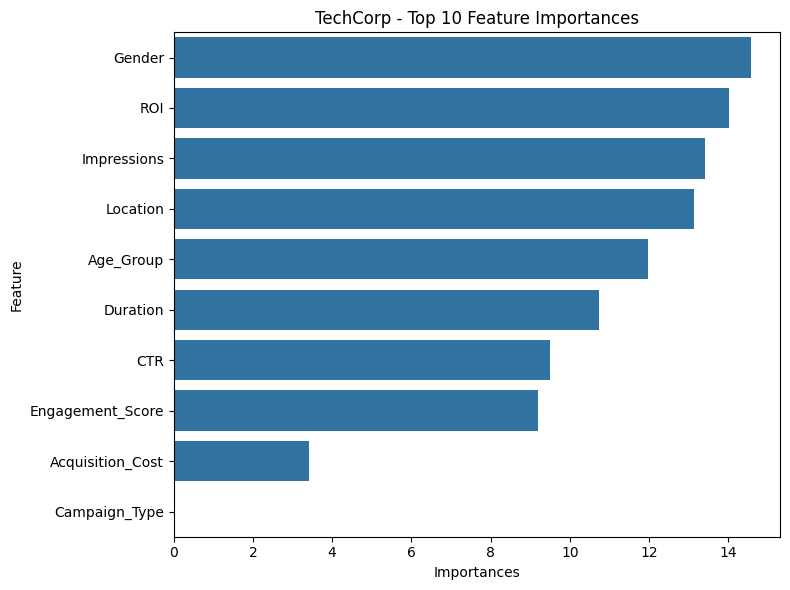

In [84]:
# Section 4: Final CatBoost Training and Evaluation
from catboost import Pool, CatBoostRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Storage
catboost_final_models = {}
catboost_final_results = {}

# Loop through each company
for catboost_company in catboost_company_data:
    print(f"\nFinal CatBoost Training for: {catboost_company}")

    # Unpack data
    x_train = catboost_company_data[catboost_company]['x_train']
    x_val = catboost_company_data[catboost_company]['x_val']
    x_test = catboost_company_data[catboost_company]['x_test']
    y_train = catboost_company_data[catboost_company]['y_train']
    y_val = catboost_company_data[catboost_company]['y_val']
    y_test = catboost_company_data[catboost_company]['y_test']
    cat_cols = catboost_company_data[catboost_company]['categorical_cols']

    # Combine train + val
    x_train_full = pd.concat([x_train, x_val])
    y_train_full = pd.concat([y_train, y_val])

    # Get categorical column indices
    cat_features_indices = [x_train_full.columns.get_loc(col) for col in cat_cols]
    train_pool = Pool(x_train_full, y_train_full, cat_features=cat_features_indices)
    test_pool = Pool(x_test, y_test, cat_features=cat_features_indices)


    # Load best parameters
    best_params = catboost_best_params[catboost_company].copy()
    best_params.update({
        "iterations": 1000,
        "loss_function": "RMSE",
        "eval_metric": "MAE",
        "random_seed": 42,
        "verbose": 100
    })

    # Final model
    model = CatBoostRegressor(**best_params)

    # Train
    model.fit(train_pool, eval_set=test_pool, early_stopping_rounds=50)

    best_iter = model.get_best_iteration()
    y_pred = model.predict(test_pool)

    # Evaluation
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"MAE  : {mae:.5f}")
    print(f"MSE  : {mse:.5f}")
    print(f"RMSE : {rmse:.5f}")
    print(f"R²   : {r2:.5f}")
    print(f"Best Iteration: {best_iter}")

    # Save
    catboost_final_models[catboost_company] = model
    catboost_final_results[catboost_company] = {
        'mae': mae,
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'y_test': y_test,
        'y_pred': y_pred,
        'best_iteration': best_iter,
        'best_params': best_params
    }

    # --- Visualizations ---

    residuals = y_test - y_pred

    # Prediction vs Actual
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Conversion Rate")
    plt.ylabel("Predicted Conversion Rate")
    plt.title(f"{catboost_company} - Prediction vs Actual")
    plt.tight_layout()
    plt.show()

    # Residual Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Conversion Rate")
    plt.ylabel("Residuals")
    plt.title(f"{catboost_company} - Residual Plot")
    plt.tight_layout()
    plt.show()

    # Residual Histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True)
    plt.title(f"{catboost_company} - Residual Distribution")
    plt.xlabel("Residuals")
    plt.tight_layout()
    plt.show()

    # Get feature importances
    feature_importance = model.get_feature_importance(prettified=True)

    # Preview once to verify column names
    print("\n🔍 Feature Importance DataFrame:")
    print(feature_importance.head())

    # Standardize column names if needed
    if 'Feature Id' in feature_importance.columns:
        feature_importance.rename(columns={'Feature Id': 'Feature'}, inplace=True)

    # Barplot
    plt.figure(figsize=(8, 6))
    sns.barplot(
        data=feature_importance.sort_values(by="Importances", ascending=False).head(10),
        x="Importances", y="Feature"
    )
    plt.title(f"{catboost_company} - Top 10 Feature Importances")
    plt.tight_layout()
    plt.show()


In [85]:
# Final result table
pd.DataFrame(catboost_final_results).T

,mae,mse,rmse,r2,y_test,y_pred,best_iteration,best_params
Innovate Industries,0.03503,0.001656,0.040692,-0.000021,115365 0.13 66078 0.06 129590 0.11 1...,"[0.07850214718816641, 0.08034382939875598, 0.0...",0,"{'learning_rate': 0.19746707651176937, 'depth'..."
NexGen Systems,0.034726,0.001626,0.040324,-0.000219,28051 0.03 91661 0.09 32435 0.13 3...,"[0.0796838788241196, 0.07954188735219363, 0.07...",0,"{'learning_rate': 0.1065570076344928, 'depth':..."
Alpha Innovations,0.035195,0.001661,0.040754,0.000983,9121 0.03 55800 0.06 125469 0.08 7...,"[0.07924584656269658, 0.08125531150583681, 0.0...",0,"{'learning_rate': 0.18856049327655428, 'depth'..."
DataTech Solutions,0.035126,0.001651,0.040638,-0.0006,114685 0.03 145621 0.14 11447 0.02 4...,"[0.07975462414099711, 0.07975462414099711, 0.0...",1,"{'learning_rate': 0.021433339369913425, 'depth..."
TechCorp,0.035052,0.001652,0.040644,-0.000684,31551 0.03 4745 0.11 37694 0.04 1...,"[0.0811645516317691, 0.07949664542919328, 0.08...",0,"{'learning_rate': 0.19927764180310345, 'depth'..."


In [1]:
!pip install streamlit

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/10.1 MB ? eta -:--:--
   -- ------------------------------------- 0.5/10.1 MB 2.8 MB/s eta 0:00:04
   ------- -------------------------------- 1.8/10.1 MB 4.8 MB/s eta 0:00:02
   ------------- -------------------------- 3.4/10.1 MB 5.9 MB/s eta 0:00:02
   -------------------- ------------------- 5.2/10.1 MB 6.4 MB/s eta 0:00:01
   ---------------------------- ----------- 7.1/10.1 MB 6.8 MB/s eta 0:00:01
   ---------------------------------- ----- 8.7/10.1 MB 7.0 MB/s eta 0:00:01
   ---------------------------------------  10.0/10.1 MB 7.1 MB/s eta 0:00:01
   ---------------------------------------- 10.1/10.1 MB 6.8 MB/s eta 0:00:00
   ---------------------------------------- 0.0/731.2 kB ? eta -:--:--
   ---------------------------------------- 731.2/731.2 kB 5.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/6.9 MB ? eta -:--:--
   ------ ----